In [1]:
import pandas as pd
import numpy as np
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
import os 
import random
import warnings

import torch

warnings.filterwarnings("ignore")

SEED_VALUE = 100
os.environ['PYTHONHASHSEED'] = str(SEED_VALUE)
random.seed(SEED_VALUE)
np.random.seed(SEED_VALUE)
torch.manual_seed(SEED_VALUE)
torch.cuda.manual_seed(SEED_VALUE)
torch.cuda.manual_seed_all(SEED_VALUE)


torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# city pollution data

In [2]:
# df = pd.read_csv("./data/city_pollution_data.csv")
df = pd.read_csv("./data/US2019to2023.csv")


DROP_ONEHOT = True
SEQ_LENGTH = 5


if DROP_ONEHOT:
  INPUT_DIM = 8
else:
  INPUT_DIM = 29

HIDDEN_DIM = 32
LAYER_DIM = 3


normalization_type = 'mean_std' # 'max', mean_std

data pre-processing

In [3]:
import datetime

def get_train_test_data(df):
  # we'll mostly need median and variance values of features for most of our needs

  for col in df.columns:
    for x in ["Country", "min", "max", "count", "County", "past_week", "latitude", "longitude", "State", "variance"]:
      if x in col:
        df.drop([col], axis=1, inplace=True)

  # df["Population Staying at Home"] = df["Population Staying at Home"].apply(lambda x: x.replace(",", ""))
  # df["Population Not Staying at Home"] = df["Population Not Staying at Home"].apply(lambda x: x.replace(",", ""))

  # Now we want 2 more features. Which day of week it is and which month it is.
  # Both of these will be one-hot and hence we'll add 7+12 = 19 more columns.
  # Getting month id is easy from the datetime column. 
  # For day of week, we'll use datetime library.
  
  df['weekday'] = df['Date'].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").weekday())
  df['month'] = df['Date'].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").month - 1)

  # using one-hot on month and weekday
  weekday_onehot = pd.get_dummies(df['weekday'])
  weekday_onehot.columns = ["day_"+str(x) for x in weekday_onehot]
  month_onehot = pd.get_dummies(df['month'])
  month_onehot.columns = ["month_"+str(x) for x in month_onehot]

  df.drop(['weekday', 'month'], axis=1, inplace=True)
  df = df.join([weekday_onehot, month_onehot])

  cities_list = list(set(df['City']))
  print(cities_list)
  cities_list.sort()
  print(cities_list)
  city_df = {}
  test_indices_of_cities = {}
  train_set = {}
  test_set = {}
  TEST_SET_SIZE = 60                                        

  for city in cities_list:
    city_df[city] = df[df['City'] == city].sort_values('Date').reset_index()
    for col in city_df[city].columns:
      if col in ["median_pm25", "median_o3", "median_so2", "median_no2", "median_pm10", "median_co"]:
        continue
      try:  
        _mean = np.nanmean(city_df[city][col])
        if np.isnan(_mean) == True:
          _mean = 0
        city_df[city][col] = city_df[city][col].fillna(_mean)
      except:
        pass
    if city_df[city].shape[0] < 600 :
      print("City with less than 600 data : {} {}".format(city_df[city].shape[0], city))
      del city_df[city]
      continue
    
    test_index_start = random.randint(0, city_df[city].shape[0] - TEST_SET_SIZE)
    test_indices_of_cities[city] = [test_index_start, test_index_start + TEST_SET_SIZE]

    test_set[city] = city_df[city].iloc[test_index_start:test_index_start + TEST_SET_SIZE]
    train_set[city] = city_df[city].drop(index=list(range(test_index_start, test_index_start + TEST_SET_SIZE)))

  return train_set, test_set

In [4]:
train_set, test_set = get_train_test_data(df)

cities_list = list(train_set.keys())

all_train = pd.DataFrame()
for city in cities_list:
  all_train = all_train.append(train_set[city], ignore_index=True)

all_test = pd.DataFrame({})
for city in test_set:
  all_test = all_test.append(test_set[city], ignore_index=True)

concat_df = pd.concat([all_train,all_test],axis=0)

['Philadelphia', 'Memphis', 'Springfield', 'Omaha', 'Detroit', 'Oklahoma City', 'Richmond', 'Brooklyn', 'Tucson', 'Atlanta', 'Columbia', 'Seattle', 'Boise', 'San Francisco', 'San Antonio', 'Fort Worth', 'Sacramento', 'El Paso', 'Jackson', 'Queens', 'Denver', 'Salem', 'Tallahassee', 'Nashville', 'Las Vegas', 'San Jose', 'Albuquerque', 'Washington D.C.', 'Miami', 'Honolulu', 'Little Rock', 'Manhattan', 'Los Angeles', 'Chicago', 'Providence', 'Houston', 'Columbus', 'Fresno', 'Madison', 'Raleigh', 'Hartford', 'The Bronx', 'Oakland', 'Phoenix', 'Boston', 'San Diego', 'Salt Lake City', 'Jacksonville', 'Saint Paul', 'Indianapolis', 'Staten Island', 'Milwaukee', 'Portland', 'Baltimore', 'Austin', 'Charlotte', 'Dallas']
['Albuquerque', 'Atlanta', 'Austin', 'Baltimore', 'Boise', 'Boston', 'Brooklyn', 'Charlotte', 'Chicago', 'Columbia', 'Columbus', 'Dallas', 'Denver', 'Detroit', 'El Paso', 'Fort Worth', 'Fresno', 'Hartford', 'Honolulu', 'Houston', 'Indianapolis', 'Jackson', 'Jacksonville', 'Las V

In [5]:
col_max = {}
col_mean = {}
col_mean2 = {}
col_std = {}

for city in cities_list:
  col_mean[city] = {}
  for col in train_set[city]:
    if col in ["index", "Date", "City"]:
      continue

    train_set[city][col] = train_set[city][col].astype("float")
    test_set[city][col] = test_set[city][col].astype("float")

    if col in ["median_pm25", "median_o3", "median_so2", "median_no2", "median_pm10", "median_co"]:
      _mean = np.nanmean(train_set[city][col])
      if np.isnan(_mean) == True:
        _mean = 0
      
      col_mean[city][col] = _mean
      train_set[city][col] = train_set[city][col].fillna(_mean)

    if normalization_type == 'mean_std':
      col_mean2[col] = np.nanmean(concat_df[col].astype("float"))
      col_std[col] = np.nanstd(concat_df[col].astype("float"))
      train_set[city][col] = (train_set[city][col] - col_mean2[col]) / (col_std[col] + 0.001)
      test_set[city][col] = (test_set[city][col] - col_mean2[col]) / (col_std[col] + 0.001)

    else:
      col_max[col] = concat_df[col].astype("float").max()
      train_set[city][col] = train_set[city][col] / (col_max[col] + 0.001)
      test_set[city][col] = test_set[city][col] / (col_max[col] + 0.001)

  if DROP_ONEHOT:
    train_set[city].drop(train_set[city].columns[-19:], axis=1, inplace=True)
    test_set[city].drop(test_set[city].columns[-19:], axis=1, inplace=True)


In [6]:
# number of data per city

print("num of cities : ", len(cities_list))
for city in cities_list:
    print(city+"({})".format(len(train_set[city])), end=", ")

num of cities :  57
Albuquerque(1613), Atlanta(1613), Austin(1613), Baltimore(1613), Boise(1613), Boston(1611), Brooklyn(1613), Charlotte(1613), Chicago(1613), Columbia(545), Columbus(1613), Dallas(1613), Denver(1612), Detroit(1545), El Paso(1613), Fort Worth(1610), Fresno(1613), Hartford(1613), Honolulu(1612), Houston(1613), Indianapolis(1593), Jackson(1613), Jacksonville(1613), Las Vegas(833), Little Rock(1613), Los Angeles(1613), Madison(1613), Manhattan(1613), Memphis(1613), Miami(1613), Milwaukee(1613), Nashville(1613), Oakland(1613), Oklahoma City(1613), Omaha(1613), Philadelphia(1613), Phoenix(1613), Portland(1613), Providence(1613), Queens(1613), Raleigh(1613), Richmond(1596), Sacramento(1613), Saint Paul(1613), Salem(1613), Salt Lake City(1613), San Antonio(1612), San Diego(1455), San Francisco(1613), San Jose(1613), Seattle(1613), Springfield(1605), Staten Island(1613), Tallahassee(1613), The Bronx(1613), Tucson(1583), Washington D.C.(1613), 

In [7]:
class CityDataP(torch.utils.data.Dataset):
  def __init__(self, selected_column, split, city_to_use):
    self.split = split
    if split == "train":
      self.dataset = train_set
    else:
      self.dataset = test_set

    self.valid_city_idx = 0
    self.valid_day_idx = 0
    self.selected_column = selected_column
    self.city_to_use = city_to_use
    
    self.city_index = cities_list.index(self.city_to_use)

  def __getitem__(self, idx):
    if self.split != "train":
      # getting all data out of the validation set
      out, city = self.get_idx_data(idx)
      # print(out.columns)
    
    else:
      # getting data randomly for train split
      city = self.city_to_use
      _df = self.dataset[city]
      start_idx = random.randint(1,_df.shape[0]-SEQ_LENGTH)
      out =  _df.iloc[start_idx-1:start_idx+SEQ_LENGTH]

    out = out.drop(['index', 'Date', 'City'], axis=1)

    Y = pd.DataFrame({})
    Y_true = pd.DataFrame({})

    for col in out.columns:
      if col == self.selected_column:
        Y_true[col] = out[col]
        Y[col] = out[col].fillna(col_mean[city][col])
      
      if col in ["median_pm25", "median_o3", "median_so2", "median_no2", "median_pm10", "median_co"]:
        out.drop([col], axis=1, inplace=True)
      else:
        out[col] = out[col].astype("float")
    # print(out.columns) 
    # print(out.columns)
    # print("out shape : ", out.shape)
    # print("Y shape : ", Y.shape)
    out = np.concatenate((np.array(out)[1:,:], np.array(Y)[:-1,:]), axis=1)
    Y = np.array(Y)[1:]
    Y_true = np.array(Y_true)[1:]
    
    return out, Y, Y_true

  def get_idx_data(self, idx):
    # city_idx = self.valid_city_idx % len(cities_list)
    # city = cities_list[city_idx]
    city = self.city_to_use
    _df = self.dataset[city]

    out =  _df.iloc[self.valid_day_idx:self.valid_day_idx+SEQ_LENGTH]
    
    if self.valid_day_idx+SEQ_LENGTH >= _df.shape[0]:
      self.valid_day_idx = 0
      self.valid_city_idx += 1
    else:
      self.valid_day_idx += 1

    return out, city

  def __len__(self):
    if self.split != "train":
      return (61-SEQ_LENGTH)
    return len(train_set[self.city_to_use]) - (SEQ_LENGTH - 1)


In [8]:
class CityDataForecast(torch.utils.data.Dataset):
  def __init__(self, selected_column, split, city_to_use):
    self.split = split
    if split == "train":
      self.dataset = train_set
    else:
      self.dataset = test_set

    self.valid_city_idx = 0
    self.valid_day_idx = 0
    self.selected_column = selected_column
    self.city_to_use = city_to_use
    
    self.city_index = cities_list.index(self.city_to_use)
    

  def __getitem__(self, idx):
    city = self.city_to_use
    _df = self.dataset[city]
    start_idx = random.randint(1,_df.shape[0]-1)
    out =  _df.iloc[start_idx-1:start_idx+1]

    out = out.drop(['index', 'Date', 'City'], axis=1)

    Y = pd.DataFrame({})
    Y_true = pd.DataFrame({})

    for col in out.columns:
      if col == self.selected_column:
        Y_true[col] = out[col]
        #print(out[col])
        Y[col] = out[col].fillna(col_mean[city][col])
      
      if col in ["median_pm25", "median_o3", "median_so2", "median_no2", "median_pm10", "median_co"]:
        out.drop([col], axis=1, inplace=True)
      else:
        out[col] = out[col].astype("float")

    # print(out.shape)
    out = np.concatenate((np.array(out)[1:,:], np.array(Y)[:-1,:]), axis=1)
    Y = np.array(Y)[1:]
    Y_true = np.array(Y_true)[1:]
    

    return out, Y, Y_true

  def get_idx_data(self, idx):
    city = cities_list[self.valid_city_idx]
    _df = self.dataset[city]

    out =  _df.iloc[self.valid_day_idx:self.valid_day_idx+1]
    
    if self.valid_day_idx+1 >= _df.shape[0]:
      self.valid_day_idx = 0
      self.valid_city_idx += 1
    else:
      self.valid_day_idx += 1

    return out, city

  def __len__(self):
    if self.split != "train":
      return (61-1)
    return len(train_set[self.city_to_use])

In [9]:
# function that implement the look_ahead mask for masking future time steps. 
def create_look_ahead_mask(size, device):
    mask = torch.ones((size, size), device=device)
    mask = torch.triu(mask, diagonal=1)
    return mask  # (size, size)

In [10]:
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)
    
g = torch.Generator()
g.manual_seed(0)

# Model fitting

performance of each linear & nonlinear model

In [11]:
MSEs = {}
RMSEs = {}
MAPEs = {}
models = ['RNN', 'LSTM', 'TransLSTM', 'Transformer', 'CosFormer', 'CosSquareFormer', 'OLS', 'LASSO', 'Ridge', 'Elastic']

for model in models :
    MSEs[model] = []
    RMSEs[model] = []
    MAPEs[model] = []
    

In [12]:
from loss_utils import *
from models import *

from torch import nn
from torch import optim
import torch

device="cuda"


# Evaluation
def evaluation(val_loader, model, model_name, LUR, SELECTED_COLUMN, mask=False):
    model.to(device)
    model.eval()
    mse_list = []
    total_se = 0.0
    total_pe = 0.0
    total_valid = 0.0

    for x_val, _, y_val in val_loader:
        x_val, y_val = [t.cuda().float() for t in (x_val, y_val)]
        
        if mask:
            masking = create_look_ahead_mask(x_val.shape[1], device)
            out, _ = model(x_val.to(device), masking)
        else:
            out = model(x_val.to(device))

        if LUR :
            ytrue = y_val[:,-1,:].squeeze().cpu().numpy()
            ypred = out[:,-1,:].squeeze().cpu().detach().numpy()
        else:
            ytrue = y_val[:,-1,:].squeeze().cpu().numpy()
            ypred = out[:,-1,:].squeeze().cpu().detach().numpy()
        true_valid = np.isnan(ytrue) != 1
        ytrue = ytrue[true_valid] #np.nan_to_num(ytrue, 0)
        ypred = ypred[true_valid]

        if normalization_type == 'mean_std':
            ytrue = (ytrue * col_std[SELECTED_COLUMN]) + col_mean2[SELECTED_COLUMN]
            ypred = (ypred * col_std[SELECTED_COLUMN]) + col_mean2[SELECTED_COLUMN]
        
        else:
            ytrue = (ytrue * col_max[SELECTED_COLUMN])
            ypred = (ypred * col_max[SELECTED_COLUMN])

        se = (ytrue - ypred)**2 # np.square(ytrue - ypred)
        pe = np.abs((ytrue - ypred) / (ytrue + 0.0001))
        total_se += np.sum(se)
        total_pe += np.sum(pe)
        total_valid += np.sum(true_valid)

    eval_mse = total_se / total_valid # np.mean(se) # 
    eval_mape = total_pe / total_valid # np.mean(pe) # 
    print('valid samples:', total_valid)
    print('Eval MSE: ', eval_mse)
    print('Eval RMSE: {}: '.format(SELECTED_COLUMN), np.sqrt(eval_mse))
    print('Eval MAPE: {}: '.format(SELECTED_COLUMN), eval_mape*100)
    
    return eval_mse, eval_mape*100


# Train
def train(sampleLoader, val_loader, model, model_name, SELECTED_COLUMN, mask=False, LUR=False, l1=False, l2=False):

    lr = 0.01
    n_epochs = 10   
    
    model.to(device)

    criterion = nn.MSELoss()
    
    # LUR
    if LUR:
        print("set l1,l2 loss")
        l1_lmbda = 0.01
        l1_lmbda = torch.FloatTensor([l1_lmbda]).cuda()
        l1_reg = torch.tensor(0., requires_grad=True).to(device)
        l2_lmbda = 0.01
        l2_lmbda = torch.FloatTensor([l2_lmbda]).cuda()
        l2_reg = torch.tensor(0., requires_grad=True).to(device)
        opt = torch.optim.SGD(model.parameters(), lr=lr)
            
    # DL
    else:
        print("set SoftDTW loss")
        lmbda = 0.5
        dtw_loss = SoftDTW(use_cuda=True, gamma=0.1)
        opt = torch.optim.SGD(model.parameters(), lr=lr)
    
      
    print('Start ' + model_name + ' training')
    best_mse = 2000.0
    mape = 2000.0
    best_model = None
    

    for epoch in range(1, n_epochs + 1):
        epoch_loss = 0
        batch_idx = 0
        bar = tqdm(sampleLoader)

        model.train()
        for x_batch, y_batch, _ in bar:
            model.train()
            x_batch = x_batch.cuda().float()
            y_batch = y_batch.cuda().float()

            
            if mask==True:
                masking = create_look_ahead_mask(x_batch.shape[1], device)
                out, _ = model(x_batch.to(device), masking)
            else :
                out = model(x_batch.to(device))
            opt.zero_grad()
            
            if LUR:
                # LASSO
                if l1==True and l2==False:
                    l1_reg = torch.norm(model.linear.weight, p=1)
                    loss = criterion(out[:,-1,:], y_batch[:,-1,:]) + l1_lmbda * l1_reg
                # Ridge
                elif l1==False and l2==True:
                    l2_reg = torch.norm(model.linear.weight, p=2)
                    loss = criterion(out[:,-1,:], y_batch[:,-1,:]) + l2_lmbda * l2_reg
                # Elastic
                elif l1==True and l2==True:
                    l1_reg = torch.norm(model.linear.weight, p=1)
                    l2_reg = torch.norm(model.linear.weight, p=2)
                    loss = criterion(out[:,-1,:], y_batch[:,-1,:]) + l1_lmbda * l1_reg + l2_lmbda * l2_reg
                # OLS
                else:
                    loss = criterion(out[:,-1,:], y_batch[:,-1,:])
            else:
                loss = criterion(out[:,-1,:], y_batch[:,-1,:]) + lmbda * dtw_loss(out.cuda(),y_batch.cuda()).mean()

            epoch_loss = (epoch_loss*batch_idx + loss.item())/(batch_idx+1)
            loss.backward(retain_graph=True)
            opt.step()

            bar.set_description(str(epoch_loss))
            batch_idx += 1

        eval_mse, eval_mape = evaluation(val_loader, model, model_name, LUR, SELECTED_COLUMN, mask)
        
        city = sampleLoader.dataset.city_to_use

        if eval_mse < best_mse:
            best_model = deepcopy(model)
            best_mse = eval_mse
            mape = eval_mape
            torch.save(best_model.state_dict(), "./save_US/"+SELECTED_COLUMN+"/"+model_name+"_"+city+".pth")
      
    print(model_name)   
    print("Best MSE :", best_mse)
    print("RMSE :", np.sqrt(best_mse))
    print("MAPE :", mape)
    print()
    MSEs[model_name].append(best_mse)
    RMSEs[model_name].append(np.sqrt(best_mse))
    MAPEs[model_name].append(mape)


In [13]:
SELECTED_COLUMN = "median_pm25" # ["median_pm25", "median_o3", "median_so2", "median_no2", "median_pm10", "median_co"]:
for city_to_use in cities_list:
    print(city_to_use)

    train_data = CityDataP(SELECTED_COLUMN, "train", city_to_use)
    val_data = CityDataP(SELECTED_COLUMN, "test", city_to_use)
    sampleLoader = DataLoader(train_data, 32, shuffle=True, num_workers=4, worker_init_fn=seed_worker, generator=g)
    val_loader = DataLoader(val_data, 4096, shuffle=False, num_workers=4, worker_init_fn=seed_worker, generator=g)

    # RNN
    RNNmodel = RNN(1, INPUT_DIM+1, HIDDEN_DIM, LAYER_DIM).to(device)
    train(sampleLoader, val_loader, RNNmodel, "RNN", SELECTED_COLUMN)
    # LSTM
    LSTMmodel = LSTM(1, INPUT_DIM+1, HIDDEN_DIM, LAYER_DIM).to(device)
    train(sampleLoader, val_loader, LSTMmodel, "LSTM", SELECTED_COLUMN)
    # BiLSTM
    # BiLSTMmodel = LSTM(1, INPUT_DIM+1, HIDDEN_DIM, LAYER_DIM, bidirectional=True).to(device)
    # train(sampleLoader, val_loader, BiLSTMmodel, "BiLSTM", SELECTED_COLUMN)
    # TransLSTM
    TransLSTMmodel = TransLSTM(num_layers=3, D=16, H=5, hidden_mlp_dim=32, inp_features=9, out_features=1, dropout_rate=0.1, LSTM_module = LSTM(4, INPUT_DIM+1, HIDDEN_DIM, LAYER_DIM, bidirectional = False).to(device), attention_type='regular').to(device) # cosine_square, cosine, regular # 6L, 12H
    train(sampleLoader, val_loader, TransLSTMmodel, "TransLSTM", SELECTED_COLUMN, mask=True)
    # Transformer
    Transmodel = Transformer(num_layers=6, D=16, H=10, hidden_mlp_dim=32, inp_features=9, out_features=1, dropout_rate=0.1, attention_type='regular', SL=SEQ_LENGTH).to(device) # cosine_square, cosine, regular # 6L, 12H
    train(sampleLoader, val_loader, Transmodel, "Transformer", SELECTED_COLUMN, mask=True)
    # CosFormer
    TransCosModel = Transformer(num_layers=6, D=16, H=10, hidden_mlp_dim=32, inp_features=9, out_features=1, dropout_rate=0.1, attention_type='cosine', SL=SEQ_LENGTH).to(device) # cosine_square, cosine, regular # 6L, 12
    train(sampleLoader, val_loader, TransCosModel, "CosFormer", SELECTED_COLUMN, mask=True)
    # CosSquareFormer
    TransCosSquare = Transformer(num_layers=6, D=16, H=10, hidden_mlp_dim=32, inp_features=9, out_features=1, dropout_rate=0.1, attention_type='cosine_square', SL=SEQ_LENGTH).to(device) # cosine_square, cosine, regular # 6L, 12H
    train(sampleLoader, val_loader, TransCosModel, "CosSquareFormer", SELECTED_COLUMN, mask=True)


Albuquerque


set SoftDTW loss
Start RNN training


1.235877897225174: 100%|██████████| 51/51 [00:05<00:00, 10.04it/s] 


valid samples: 54.0
Eval MSE:  106.60965530960648
Eval RMSE: median_pm25:  10.325195170533412
Eval MAPE: median_pm25:  37.58500063860858


0.6757713972645647: 100%|██████████| 51/51 [00:03<00:00, 13.18it/s] 


valid samples: 54.0
Eval MSE:  103.4536765769676
Eval RMSE: median_pm25:  10.171218047852852
Eval MAPE: median_pm25:  37.83751240483037


0.414675703235701: 100%|██████████| 51/51 [00:04<00:00, 10.65it/s]  


valid samples: 54.0
Eval MSE:  100.20202184606481
Eval RMSE: median_pm25:  10.010095995846633
Eval MAPE: median_pm25:  38.37401072184245


0.3064777241910203: 100%|██████████| 51/51 [00:04<00:00, 10.66it/s] 


valid samples: 54.0
Eval MSE:  92.23385054976852
Eval RMSE: median_pm25:  9.603845612553782
Eval MAPE: median_pm25:  37.01045424849899


0.3787342830031526: 100%|██████████| 51/51 [00:06<00:00,  7.99it/s] 


valid samples: 54.0
Eval MSE:  91.38985640914352
Eval RMSE: median_pm25:  9.559804203494103
Eval MAPE: median_pm25:  36.730296523482714


0.3657171068822636: 100%|██████████| 51/51 [00:06<00:00,  8.08it/s] 


valid samples: 54.0
Eval MSE:  88.19316044560185
Eval RMSE: median_pm25:  9.39112136252119
Eval MAPE: median_pm25:  37.16384746410228


0.36348371251541023: 100%|██████████| 51/51 [00:06<00:00,  7.54it/s]


valid samples: 54.0
Eval MSE:  87.31767216435185
Eval RMSE: median_pm25:  9.344392551918602
Eval MAPE: median_pm25:  37.585636421486186


0.3456489632234854: 100%|██████████| 51/51 [00:07<00:00,  7.22it/s] 


valid samples: 54.0
Eval MSE:  89.16458695023148
Eval RMSE: median_pm25:  9.442700193812756
Eval MAPE: median_pm25:  35.505789297598376


0.2639564488302259: 100%|██████████| 51/51 [00:07<00:00,  6.41it/s] 


valid samples: 54.0
Eval MSE:  87.75790292245371
Eval RMSE: median_pm25:  9.367918814894464
Eval MAPE: median_pm25:  35.49734044958044


0.38431623957905114: 100%|██████████| 51/51 [00:07<00:00,  6.58it/s]


valid samples: 54.0
Eval MSE:  83.65587926793981
Eval RMSE: median_pm25:  9.146358798338266
Eval MAPE: median_pm25:  38.219144609239365
RNN
Best MSE : 83.65587926793981
RMSE : 9.146358798338266
MAPE : 38.219144609239365

set SoftDTW loss
Start LSTM training


1.6855405452204686: 100%|██████████| 51/51 [00:07<00:00,  6.49it/s]


valid samples: 54.0
Eval MSE:  131.70449037905092
Eval RMSE: median_pm25:  11.476257681799016
Eval MAPE: median_pm25:  41.28974985193323


1.6425174053977518: 100%|██████████| 51/51 [00:07<00:00,  6.96it/s]


valid samples: 54.0
Eval MSE:  132.16229926215277
Eval RMSE: median_pm25:  11.496186292077594
Eval MAPE: median_pm25:  41.22361077202691


1.8688779005817338: 100%|██████████| 51/51 [00:07<00:00,  6.80it/s]


valid samples: 54.0
Eval MSE:  131.6572265625
Eval RMSE: median_pm25:  11.474198297157846
Eval MAPE: median_pm25:  41.24555940981264


1.6384250596165657:  25%|██▌       | 13/51 [00:02<00:05,  6.84it/s]

In [ ]:
print("MSEs")
for key in MSEs :
    for val in MSEs[key]:
        print(key, val, end=",")
    print()
print()    

print("RMSEs")
for key in RMSEs :
    for val in RMSEs[key]:
        print(key, val, end=",")
    print()
print() 

print("MAPEss")
for key in MAPEs :
    for val in MAPEs[key]:
        print(key, val, end=",")
    print()
print() 

MSEs
RNN 163.34814453125,RNN 111.32418189858491,RNN 141.15909830729166,RNN 124.59644458912037,RNN 532.5997902199074,RNN 89.5516945167824,RNN 93.84282769097223,RNN 145.34150752314815,RNN 125.18319589120371,RNN 40.482620804398145,RNN 326.20926339285717,RNN 527.6586733217592,RNN 78.56789822048611,RNN 41.3356617115162,RNN 73.20409252025463,RNN 36.60305673104745,RNN 170.65353732638889,RNN 40.424008969907405,RNN 86.26967592592592,RNN 116.03073459201389,RNN 106.47171585648148,RNN 65.73335322627315,RNN 137.51735206886573,RNN 187.57060185185185,RNN 55.392519350405095,RNN 82.40817599826389,RNN 151.57097258391204,RNN 53.377604166666664,RNN 90.6943359375,RNN 143.39671043113427,RNN 92.53060800057871,RNN 266.2976164641204,RNN 80.34605577256944,RNN 159.4510452835648,RNN 104.39600513599537,RNN 50.16798231336806,RNN 443.040111400463,RNN 104.46060293692129,RNN 92.44752785011575,RNN 88.08463541666667,RNN 90.79100658275463,RNN 56.17551902488426,RNN 18.767667417173033,RNN 64.95232024016204,RNN 72.498227719

In [ ]:
for city_to_use in cities_list:
    print(city_to_use)
    
    train_data = CityDataForecast(SELECTED_COLUMN, "train", city_to_use)
    val_data = CityDataForecast(SELECTED_COLUMN, "test", city_to_use)
    sampleLoader = DataLoader(train_data, 32, shuffle=True, num_workers=4, worker_init_fn=seed_worker, generator=g)
    val_loader = DataLoader(val_data, 4096, shuffle=False, num_workers=4, worker_init_fn=seed_worker, generator=g)

    OLS = LinearRegression(input_dim=9)
    train(sampleLoader, val_loader, OLS, "OLS", SELECTED_COLUMN, LUR=True)
    LASSO = LinearRegression(input_dim=9)
    train(sampleLoader, val_loader, LASSO, "LASSO", SELECTED_COLUMN, LUR=True, l1=True)
    Ridge = LinearRegression(input_dim=9)
    train(sampleLoader, val_loader, Ridge, "Ridge", SELECTED_COLUMN, LUR=True, l2=True)
    Elastic = LinearRegression(input_dim=9)
    train(sampleLoader, val_loader, Elastic, "Elastic", SELECTED_COLUMN, LUR=True, l1=True, l2=True)

Albuquerque
set l1,l2 loss
Start OLS training


0.42731666308024835: 100%|██████████| 29/29 [00:02<00:00, 12.84it/s]


valid samples: 60.0
Eval MSE:  235.197705078125
Eval RMSE: median_pm25:  15.336156789695552
Eval MAPE: median_pm25:  26.42780621846517


0.4821271439050806: 100%|██████████| 29/29 [00:02<00:00, 12.51it/s] 


valid samples: 60.0
Eval MSE:  154.98831380208333
Eval RMSE: median_pm25:  12.449430260139751
Eval MAPE: median_pm25:  28.5887336730957


0.27307172967442156: 100%|██████████| 29/29 [00:02<00:00, 12.79it/s]


valid samples: 60.0
Eval MSE:  196.54148763020834
Eval RMSE: median_pm25:  14.019325505537289
Eval MAPE: median_pm25:  26.589716275533043


0.23131040612171436: 100%|██████████| 29/29 [00:02<00:00, 12.94it/s]


valid samples: 60.0
Eval MSE:  210.219873046875
Eval RMSE: median_pm25:  14.498961102329883
Eval MAPE: median_pm25:  27.47996966044108


0.29936946755082444: 100%|██████████| 29/29 [00:02<00:00, 13.46it/s]


valid samples: 60.0
Eval MSE:  236.94781901041668
Eval RMSE: median_pm25:  15.393109465290523
Eval MAPE: median_pm25:  27.074899673461918


0.27643957888257914: 100%|██████████| 29/29 [00:02<00:00, 12.40it/s]


valid samples: 60.0
Eval MSE:  337.35325520833334
Eval RMSE: median_pm25:  18.367178749288996
Eval MAPE: median_pm25:  30.26262919108073


0.1852686058344512: 100%|██████████| 29/29 [00:02<00:00, 13.18it/s] 


valid samples: 60.0
Eval MSE:  288.64915364583334
Eval RMSE: median_pm25:  16.989677855858048
Eval MAPE: median_pm25:  27.53225644429525


0.19152144984952335: 100%|██████████| 29/29 [00:02<00:00, 12.89it/s]


valid samples: 60.0
Eval MSE:  132.32242024739583
Eval RMSE: median_pm25:  11.503148275467714
Eval MAPE: median_pm25:  25.8094580968221


0.20172934722283792: 100%|██████████| 29/29 [00:02<00:00, 10.22it/s]


valid samples: 60.0
Eval MSE:  300.30224609375
Eval RMSE: median_pm25:  17.329230972370066
Eval MAPE: median_pm25:  26.571594874064125


0.2438109111169289: 100%|██████████| 29/29 [00:02<00:00, 10.84it/s] 


valid samples: 60.0
Eval MSE:  177.668505859375
Eval RMSE: median_pm25:  13.329235006532633
Eval MAPE: median_pm25:  29.933160146077476
OLS
Best MSE : 132.32242024739583
RMSE : 11.503148275467714
MAPE : 25.8094580968221

set l1,l2 loss
Start LASSO training


0.4204463604195365: 100%|██████████| 29/29 [00:02<00:00, 11.11it/s] 


valid samples: 60.0
Eval MSE:  236.35042317708334
Eval RMSE: median_pm25:  15.373692568055448
Eval MAPE: median_pm25:  29.25809542338053


0.48885638498026757: 100%|██████████| 29/29 [00:02<00:00, 10.50it/s]


valid samples: 60.0
Eval MSE:  260.52919921875
Eval RMSE: median_pm25:  16.140916926208064
Eval MAPE: median_pm25:  26.471912066141762


0.4096330255270004: 100%|██████████| 29/29 [00:02<00:00, 11.44it/s] 


valid samples: 60.0
Eval MSE:  327.1276041666667
Eval RMSE: median_pm25:  18.08666923915696
Eval MAPE: median_pm25:  34.6643861134847


0.2751066741244546: 100%|██████████| 29/29 [00:03<00:00,  9.52it/s] 


valid samples: 60.0
Eval MSE:  177.92021484375
Eval RMSE: median_pm25:  13.338673653843923
Eval MAPE: median_pm25:  23.10300350189209


0.2959572914345511: 100%|██████████| 29/29 [00:03<00:00,  8.87it/s] 


valid samples: 60.0
Eval MSE:  250.537060546875
Eval RMSE: median_pm25:  15.828362535236392
Eval MAPE: median_pm25:  27.803080876668297


0.30114966476785726: 100%|██████████| 29/29 [00:03<00:00,  8.52it/s]


valid samples: 60.0
Eval MSE:  256.43059895833335
Eval RMSE: median_pm25:  16.013450563770864
Eval MAPE: median_pm25:  25.74620246887207


0.2759639769792557: 100%|██████████| 29/29 [00:03<00:00,  7.91it/s] 


valid samples: 60.0
Eval MSE:  165.10953776041666
Eval RMSE: median_pm25:  12.849495622802346
Eval MAPE: median_pm25:  21.462149620056152


0.2674336936967126: 100%|██████████| 29/29 [00:04<00:00,  7.14it/s] 


valid samples: 60.0
Eval MSE:  322.40048828125
Eval RMSE: median_pm25:  17.955514146948005
Eval MAPE: median_pm25:  27.539135615030926


0.279293702080332: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]  


valid samples: 60.0
Eval MSE:  136.89104817708332
Eval RMSE: median_pm25:  11.700044793806702
Eval MAPE: median_pm25:  24.126291275024414


0.1933582384010841: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s] 


valid samples: 60.0
Eval MSE:  247.98570963541667
Eval RMSE: median_pm25:  15.747562021958087
Eval MAPE: median_pm25:  25.187505086263023
LASSO
Best MSE : 136.89104817708332
RMSE : 11.700044793806702
MAPE : 24.126291275024414

set l1,l2 loss
Start Ridge training


0.6531846179016705: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  821.7483072916667
Eval RMSE: median_pm25:  28.666152641951566
Eval MAPE: median_pm25:  47.321564356486


0.3587090665924138: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 60.0
Eval MSE:  386.87151692708335
Eval RMSE: median_pm25:  19.669049720997794
Eval MAPE: median_pm25:  35.962867736816406


0.35648531800714034: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  442.86780598958336
Eval RMSE: median_pm25:  21.044424582049835
Eval MAPE: median_pm25:  33.99758656819662


0.4735522897079073: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s] 


valid samples: 60.0
Eval MSE:  306.43756510416665
Eval RMSE: median_pm25:  17.505358182686997
Eval MAPE: median_pm25:  32.36271222432455


0.3449656608803519: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s] 


valid samples: 60.0
Eval MSE:  184.17648111979167
Eval RMSE: median_pm25:  13.571163587540742
Eval MAPE: median_pm25:  29.92327054341634


0.3292418430591451: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s] 


valid samples: 60.0
Eval MSE:  199.560546875
Eval RMSE: median_pm25:  14.126590065369633
Eval MAPE: median_pm25:  31.765368779500324


0.2241372805217217: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  264.2827473958333
Eval RMSE: median_pm25:  16.256775430442328
Eval MAPE: median_pm25:  27.38788604736328


0.24174960522816105: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  306.3649088541667
Eval RMSE: median_pm25:  17.50328280221075
Eval MAPE: median_pm25:  31.197627385457356


0.37450181924063586: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  195.320166015625
Eval RMSE: median_pm25:  13.975699124395351
Eval MAPE: median_pm25:  24.865271250406902


0.3049880989409726: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s] 


valid samples: 60.0
Eval MSE:  165.0748046875
Eval RMSE: median_pm25:  12.848144017230661
Eval MAPE: median_pm25:  21.5424903233846
Ridge
Best MSE : 165.0748046875
RMSE : 12.848144017230661
MAPE : 21.5424903233846

set l1,l2 loss
Start Elastic training


0.37069170022832937: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  283.2630859375
Eval RMSE: median_pm25:  16.83042144265853
Eval MAPE: median_pm25:  31.61015510559082


0.2486092252977964: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s] 


valid samples: 60.0
Eval MSE:  333.3030598958333
Eval RMSE: median_pm25:  18.256589492449933
Eval MAPE: median_pm25:  31.03275934855143


0.36812016984512064: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  137.94845377604167
Eval RMSE: median_pm25:  11.745145966570261
Eval MAPE: median_pm25:  22.31211503346761


0.2736082752716953: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s] 


valid samples: 60.0
Eval MSE:  162.82233072916668
Eval RMSE: median_pm25:  12.760185372053444
Eval MAPE: median_pm25:  30.364786783854164


0.3395715772077955: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s] 


valid samples: 60.0
Eval MSE:  144.05607096354166
Eval RMSE: median_pm25:  12.002336062764684
Eval MAPE: median_pm25:  21.944559415181477


0.24880523106147506: 100%|██████████| 29/29 [00:04<00:00,  7.09it/s]


valid samples: 60.0
Eval MSE:  213.49169921875
Eval RMSE: median_pm25:  14.611355146554683
Eval MAPE: median_pm25:  25.752283732096355


0.25589301668364434: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  56.0347412109375
Eval RMSE: median_pm25:  7.48563565844194
Eval MAPE: median_pm25:  17.503527005513508


0.23496319533422075: 100%|██████████| 29/29 [00:04<00:00,  7.17it/s]


valid samples: 60.0
Eval MSE:  167.34781901041666
Eval RMSE: median_pm25:  12.936298504998122
Eval MAPE: median_pm25:  20.664655367533367


0.2793416326929784: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s] 


valid samples: 60.0
Eval MSE:  255.17415364583334
Eval RMSE: median_pm25:  15.974171454126607
Eval MAPE: median_pm25:  27.67354011535644


0.25715653367083646: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  93.48760579427083
Eval RMSE: median_pm25:  9.668898892545668
Eval MAPE: median_pm25:  19.5914888381958
Elastic
Best MSE : 56.0347412109375
RMSE : 7.48563565844194
MAPE : 17.503527005513508

Atlanta
set l1,l2 loss
Start OLS training


0.9194528789355836: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  185.65457356770833
Eval RMSE: median_pm25:  13.625511864429473
Eval MAPE: median_pm25:  25.814309120178226


0.6378246514961636: 100%|██████████| 29/29 [00:05<00:00,  5.72it/s]


valid samples: 60.0
Eval MSE:  1091.9497395833334
Eval RMSE: median_pm25:  33.04466280026676
Eval MAPE: median_pm25:  31.817375818888344


0.6601898988773083: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 59.0
Eval MSE:  849.4468352754237
Eval RMSE: median_pm25:  29.145271233519576
Eval MAPE: median_pm25:  30.27096441236593


0.6450159375009865: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 58.0
Eval MSE:  146.77172009698276
Eval RMSE: median_pm25:  12.11493789076043
Eval MAPE: median_pm25:  22.688717677675445


0.5492982414775881: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 58.0
Eval MSE:  94.64661065463362
Eval RMSE: median_pm25:  9.728648963480675
Eval MAPE: median_pm25:  23.367365475358636


0.5659971411885887: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 57.0
Eval MSE:  2513.4706688596493
Eval RMSE: median_pm25:  50.13452571691139
Eval MAPE: median_pm25:  30.821763423451205


0.5373663511769525: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s] 


valid samples: 60.0
Eval MSE:  138.85559895833333
Eval RMSE: median_pm25:  11.783700562995197
Eval MAPE: median_pm25:  21.16402467091878


0.6361308251989299: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]


valid samples: 57.0
Eval MSE:  114.55370237116227
Eval RMSE: median_pm25:  10.702976332364857
Eval MAPE: median_pm25:  17.155105189273232


0.500822265600336: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s] 


valid samples: 58.0
Eval MSE:  119.68220467403017
Eval RMSE: median_pm25:  10.93993622806048
Eval MAPE: median_pm25:  21.189375581412477


0.5027450569744768: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 58.0
Eval MSE:  1493.2140355603449
Eval RMSE: median_pm25:  38.64212773075966
Eval MAPE: median_pm25:  26.27775422457991
OLS
Best MSE : 94.64661065463362
RMSE : 9.728648963480675
MAPE : 23.367365475358636

set l1,l2 loss
Start LASSO training


1.0570328852225994: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  177.538720703125
Eval RMSE: median_pm25:  13.324365677326819
Eval MAPE: median_pm25:  22.441177368164062


0.7244245307198887: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 59.0
Eval MSE:  163.1817233845339
Eval RMSE: median_pm25:  12.774260189323448
Eval MAPE: median_pm25:  24.11079568377996


0.5966477692127228: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 59.0
Eval MSE:  146.24159163135593
Eval RMSE: median_pm25:  12.093038974193208
Eval MAPE: median_pm25:  23.741138587563725


0.6370722828754063: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s]


valid samples: 59.0
Eval MSE:  117.73994471663136
Eval RMSE: median_pm25:  10.850803874212794
Eval MAPE: median_pm25:  23.12082193665585


0.5402949842913398: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s] 


valid samples: 59.0
Eval MSE:  155.3916843220339
Eval RMSE: median_pm25:  12.465620093763242
Eval MAPE: median_pm25:  25.2101397110244


0.6242954443240988: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 58.0
Eval MSE:  137.5635354929957
Eval RMSE: median_pm25:  11.72874824919504
Eval MAPE: median_pm25:  24.35542139513739


0.609719586783442: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  2793.8885416666667
Eval RMSE: median_pm25:  52.85724682261333
Eval MAPE: median_pm25:  31.51920954386393


0.5673170706321453: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 59.0
Eval MSE:  1560.653469279661
Eval RMSE: median_pm25:  39.50510687594277
Eval MAPE: median_pm25:  28.016488026764435


0.5887285553175826: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 59.0
Eval MSE:  117.73263704978814
Eval RMSE: median_pm25:  10.850467135095528
Eval MAPE: median_pm25:  24.656471963656152


0.4871969988633846: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  123.33243001302084
Eval RMSE: median_pm25:  11.105513496143294
Eval MAPE: median_pm25:  24.60840384165446
LASSO
Best MSE : 117.73263704978814
RMSE : 10.850467135095528
MAPE : 24.656471963656152

set l1,l2 loss
Start Ridge training


1.0389414378281296: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 59.0
Eval MSE:  1194.3011122881355
Eval RMSE: median_pm25:  34.55866189956051
Eval MAPE: median_pm25:  26.35553489297123


0.5798340614499717: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 59.0
Eval MSE:  1494.9941737288136
Eval RMSE: median_pm25:  38.66515451577575
Eval MAPE: median_pm25:  29.803030369645455


0.6691820004890706: 100%|██████████| 29/29 [00:05<00:00,  5.61it/s]


valid samples: 58.0
Eval MSE:  100.14246026400862
Eval RMSE: median_pm25:  10.007120478139983
Eval MAPE: median_pm25:  22.024618346115638


0.5238667808730025: 100%|██████████| 29/29 [00:05<00:00,  5.79it/s] 


valid samples: 60.0
Eval MSE:  1558.1041666666667
Eval RMSE: median_pm25:  39.472828207092874
Eval MAPE: median_pm25:  30.09561856587728


0.500778399150947: 100%|██████████| 29/29 [00:05<00:00,  5.32it/s]  


valid samples: 59.0
Eval MSE:  2920.6210275423728
Eval RMSE: median_pm25:  54.04277035406653
Eval MAPE: median_pm25:  34.64383594060349


0.6569647295721646: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 59.0
Eval MSE:  100.55747649629237
Eval RMSE: median_pm25:  10.027835085216168
Eval MAPE: median_pm25:  17.925213959257484


0.5987362275863516: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 58.0
Eval MSE:  150.54349070581895
Eval RMSE: median_pm25:  12.269616567188192
Eval MAPE: median_pm25:  22.87849557810816


0.49859100965590314: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 57.0
Eval MSE:  139.95065789473685
Eval RMSE: median_pm25:  11.830074297938152
Eval MAPE: median_pm25:  24.858700601678148


0.5307470005134056: 100%|██████████| 29/29 [00:04<00:00,  7.05it/s] 


valid samples: 58.0
Eval MSE:  1568.0709859913793
Eval RMSE: median_pm25:  39.5988760698
Eval MAPE: median_pm25:  30.666749230746564


0.5001778612876762: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s] 


valid samples: 60.0
Eval MSE:  1718.8015625
Eval RMSE: median_pm25:  41.45843174192676
Eval MAPE: median_pm25:  28.86186599731445
Ridge
Best MSE : 100.14246026400862
RMSE : 10.007120478139983
MAPE : 22.024618346115638

set l1,l2 loss
Start Elastic training


0.8936892090172603: 100%|██████████| 29/29 [00:04<00:00,  7.11it/s]


valid samples: 58.0
Eval MSE:  385.18595096982756
Eval RMSE: median_pm25:  19.626154767804813
Eval MAPE: median_pm25:  31.166944832637395


0.6163675474195645: 100%|██████████| 29/29 [00:03<00:00,  7.44it/s]


valid samples: 60.0
Eval MSE:  132.52552083333333
Eval RMSE: median_pm25:  11.511972934008025
Eval MAPE: median_pm25:  23.948893547058105


0.6861721092257006: 100%|██████████| 29/29 [00:04<00:00,  7.23it/s]


valid samples: 60.0
Eval MSE:  124.31682942708333
Eval RMSE: median_pm25:  11.149745711319309
Eval MAPE: median_pm25:  22.743611335754395


0.6439295616643181: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 58.0
Eval MSE:  137.5802380792026
Eval RMSE: median_pm25:  11.729460263763315
Eval MAPE: median_pm25:  26.550485347879345


0.6280251361172775: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  1290.7216145833333
Eval RMSE: median_pm25:  35.926614293352685
Eval MAPE: median_pm25:  30.37699699401856


0.6620366234203865: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  2631.4903645833333
Eval RMSE: median_pm25:  51.29805419880303
Eval MAPE: median_pm25:  35.922228495279946


0.6129846624259291: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  108.6922119140625
Eval RMSE: median_pm25:  10.42555571248183
Eval MAPE: median_pm25:  17.108438809712727


0.5930490154644539: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 56.0
Eval MSE:  1575.48828125
Eval RMSE: median_pm25:  39.69242095476163
Eval MAPE: median_pm25:  24.371920313153947


0.5413012309321042: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  4494.808854166667
Eval RMSE: median_pm25:  67.04333564319921
Eval MAPE: median_pm25:  37.598374684651695


0.5697341155389258: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 58.0
Eval MSE:  1486.7757273706898
Eval RMSE: median_pm25:  38.558730883817866
Eval MAPE: median_pm25:  26.94307853435648
Elastic
Best MSE : 108.6922119140625
RMSE : 10.42555571248183
MAPE : 17.108438809712727

Austin
set l1,l2 loss
Start OLS training


0.7501789608906055: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  120.06449381510417
Eval RMSE: median_pm25:  10.957394481130274
Eval MAPE: median_pm25:  27.442042032877605


0.5888017333787063: 100%|██████████| 29/29 [00:04<00:00,  5.81it/s]


valid samples: 60.0
Eval MSE:  163.25408528645832
Eval RMSE: median_pm25:  12.777092207793537
Eval MAPE: median_pm25:  32.06139246622721


0.5492026908644314: 100%|██████████| 29/29 [00:05<00:00,  5.67it/s]


valid samples: 60.0
Eval MSE:  140.208203125
Eval RMSE: median_pm25:  11.840954485386725
Eval MAPE: median_pm25:  28.861265182495117


0.5243990524061796: 100%|██████████| 29/29 [00:05<00:00,  5.80it/s]


valid samples: 60.0
Eval MSE:  103.14910481770833
Eval RMSE: median_pm25:  10.156234775629615
Eval MAPE: median_pm25:  25.120676358540855


0.5985173305560803: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s]


valid samples: 60.0
Eval MSE:  188.063525390625
Eval RMSE: median_pm25:  13.713625537786315
Eval MAPE: median_pm25:  32.36563046773275


0.5504294479715413: 100%|██████████| 29/29 [00:04<00:00,  5.82it/s]


valid samples: 60.0
Eval MSE:  141.7822265625
Eval RMSE: median_pm25:  11.90723421128937
Eval MAPE: median_pm25:  30.519603093465168


0.5231608663653505: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  109.96224772135416
Eval RMSE: median_pm25:  10.486288557986288
Eval MAPE: median_pm25:  23.492005666097004


0.5356599996829855: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  98.60550130208334
Eval RMSE: median_pm25:  9.930030276997313
Eval MAPE: median_pm25:  21.11141045888265


0.5433305738301112: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  149.65052083333333
Eval RMSE: median_pm25:  12.233172966705462
Eval MAPE: median_pm25:  29.665355682373047


0.5781934374365313: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  158.31560872395832
Eval RMSE: median_pm25:  12.58235306784698
Eval MAPE: median_pm25:  27.217226028442383
OLS
Best MSE : 98.60550130208334
RMSE : 9.930030276997313
MAPE : 21.11141045888265

set l1,l2 loss
Start LASSO training


0.6743952339065487: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]


valid samples: 60.0
Eval MSE:  190.41201171875
Eval RMSE: median_pm25:  13.798985894577543
Eval MAPE: median_pm25:  29.917561213175453


0.6938079287265907: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  162.73009440104167
Eval RMSE: median_pm25:  12.756570636383497
Eval MAPE: median_pm25:  33.44651222229004


0.6560629642215269: 100%|██████████| 29/29 [00:05<00:00,  5.77it/s]


valid samples: 60.0
Eval MSE:  117.38120930989584
Eval RMSE: median_pm25:  10.834260902797931
Eval MAPE: median_pm25:  27.772499720255535


0.5419562700493582: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  130.8483154296875
Eval RMSE: median_pm25:  11.438894851762887
Eval MAPE: median_pm25:  28.721815745035805


0.5296783365052323: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s]


valid samples: 60.0
Eval MSE:  273.70130208333336
Eval RMSE: median_pm25:  16.543920396427605
Eval MAPE: median_pm25:  29.1604487101237


0.576031370024229: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s] 


valid samples: 60.0
Eval MSE:  142.49783528645833
Eval RMSE: median_pm25:  11.937245716096252
Eval MAPE: median_pm25:  25.566412607828777


0.5220932898850278: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s]


valid samples: 60.0
Eval MSE:  161.82122395833332
Eval RMSE: median_pm25:  12.720897136536138
Eval MAPE: median_pm25:  29.83650843302409


0.49682449472361584: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s]


valid samples: 60.0
Eval MSE:  124.31382649739584
Eval RMSE: median_pm25:  11.149611046910822
Eval MAPE: median_pm25:  23.968531290690105


0.4960732073362531: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  113.25811360677083
Eval RMSE: median_pm25:  10.642279530569136
Eval MAPE: median_pm25:  27.269935607910156


0.5589681874061454: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  106.29122721354166
Eval RMSE: median_pm25:  10.309763683690411
Eval MAPE: median_pm25:  25.789043108622234
LASSO
Best MSE : 106.29122721354166
RMSE : 10.309763683690411
MAPE : 25.789043108622234

set l1,l2 loss
Start Ridge training


0.9328411416760807: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  215.46793619791666
Eval RMSE: median_pm25:  14.678826117844595
Eval MAPE: median_pm25:  26.871096293131508


0.7806698803243965: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


valid samples: 60.0
Eval MSE:  138.789208984375
Eval RMSE: median_pm25:  11.780883200523423
Eval MAPE: median_pm25:  30.647802352905273


0.5791342163394237: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 60.0
Eval MSE:  135.04981282552083
Eval RMSE: median_pm25:  11.621093443627446
Eval MAPE: median_pm25:  32.56596883138021


0.5443291797720151: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  119.44650065104166
Eval RMSE: median_pm25:  10.92915827733507
Eval MAPE: median_pm25:  26.978556315104168


0.5712622388683518: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  116.1037109375
Eval RMSE: median_pm25:  10.775143198004377
Eval MAPE: median_pm25:  25.02866268157959


0.576387554920953: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  134.08819173177082
Eval RMSE: median_pm25:  11.579645578849588
Eval MAPE: median_pm25:  27.450555165608726


0.5360776072946088: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  104.84103190104166
Eval RMSE: median_pm25:  10.239190978834298
Eval MAPE: median_pm25:  25.121410687764484


0.5705393889340861: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  127.00445963541667
Eval RMSE: median_pm25:  11.269625532173492
Eval MAPE: median_pm25:  24.673107465108234


0.5638299553558744: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s] 


valid samples: 60.0
Eval MSE:  130.82996419270833
Eval RMSE: median_pm25:  11.438092681592869
Eval MAPE: median_pm25:  20.535597801208496


0.608025411593503: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]  


valid samples: 60.0
Eval MSE:  150.16070963541668
Eval RMSE: median_pm25:  12.25400790090396
Eval MAPE: median_pm25:  30.07638931274414
Ridge
Best MSE : 104.84103190104166
RMSE : 10.239190978834298
MAPE : 25.121410687764484

set l1,l2 loss
Start Elastic training


0.8441354817357557: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


valid samples: 60.0
Eval MSE:  196.35885416666667
Eval RMSE: median_pm25:  14.0128103593343
Eval MAPE: median_pm25:  22.871602376302082


0.6039608855699672: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  110.806005859375
Eval RMSE: median_pm25:  10.526443172286402
Eval MAPE: median_pm25:  24.07697518666585


0.5726146949776288: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  145.56238606770833
Eval RMSE: median_pm25:  12.064923790381286
Eval MAPE: median_pm25:  30.63275973002116


0.5253066687748351: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 60.0
Eval MSE:  127.24833984375
Eval RMSE: median_pm25:  11.280440587306419
Eval MAPE: median_pm25:  26.692978541056316


0.5824407113009485: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  149.68155924479166
Eval RMSE: median_pm25:  12.234441517486266
Eval MAPE: median_pm25:  28.7821102142334


0.5853040393056539: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  163.49661458333333
Eval RMSE: median_pm25:  12.78657947159182
Eval MAPE: median_pm25:  30.796292622884113


0.5651200855600422: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  133.35087890625
Eval RMSE: median_pm25:  11.547765104393577
Eval MAPE: median_pm25:  29.52136993408203


0.5819651546149418: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  152.22459309895834
Eval RMSE: median_pm25:  12.337933096712687
Eval MAPE: median_pm25:  21.561376253763832


0.5888435604243443: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  201.247802734375
Eval RMSE: median_pm25:  14.186183515462325
Eval MAPE: median_pm25:  33.686583836873375


0.5635613054037094: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  167.62215169270834
Eval RMSE: median_pm25:  12.946897377082601
Eval MAPE: median_pm25:  32.151543299357094
Elastic
Best MSE : 110.806005859375
RMSE : 10.526443172286402
MAPE : 24.07697518666585

Baltimore
set l1,l2 loss
Start OLS training


0.750876450333102: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  111.06612141927083
Eval RMSE: median_pm25:  10.538791269366275
Eval MAPE: median_pm25:  40.15295664469401


0.6954647025157666: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]


valid samples: 60.0
Eval MSE:  121.35922037760416
Eval RMSE: median_pm25:  11.016316098297295
Eval MAPE: median_pm25:  36.784375508626304


0.6865401494091955: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  133.97211100260418
Eval RMSE: median_pm25:  11.57463221889163
Eval MAPE: median_pm25:  43.646863301595054


0.5622988753020763: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  123.07718912760417
Eval RMSE: median_pm25:  11.09401591524026
Eval MAPE: median_pm25:  38.57590993245443


0.6538359923609371: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  111.73177897135416
Eval RMSE: median_pm25:  10.570325395717681
Eval MAPE: median_pm25:  43.10169219970703


0.44360447007006615: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  154.977734375
Eval RMSE: median_pm25:  12.449005356854821
Eval MAPE: median_pm25:  33.789269129435226


0.6965344085775572: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  139.980517578125
Eval RMSE: median_pm25:  11.831336254968202
Eval MAPE: median_pm25:  46.51841481526693


0.5913005913126056: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]


valid samples: 60.0
Eval MSE:  166.41865234375
Eval RMSE: median_pm25:  12.900335357801751
Eval MAPE: median_pm25:  42.547642389933266


0.4884478703205442: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  158.12815755208334
Eval RMSE: median_pm25:  12.574901890356177
Eval MAPE: median_pm25:  41.30032221476237


0.48523114088537367: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  124.76765950520833
Eval RMSE: median_pm25:  11.169944471894581
Eval MAPE: median_pm25:  38.22626749674479
OLS
Best MSE : 111.06612141927083
RMSE : 10.538791269366275
MAPE : 40.15295664469401

set l1,l2 loss
Start LASSO training


0.9813865911344: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s]   


valid samples: 60.0
Eval MSE:  108.586083984375
Eval RMSE: median_pm25:  10.420464672190727
Eval MAPE: median_pm25:  32.583583196004234


0.8599273120534832: 100%|██████████| 29/29 [00:05<00:00,  5.72it/s]


valid samples: 60.0
Eval MSE:  90.26513671875
Eval RMSE: median_pm25:  9.500796636006372
Eval MAPE: median_pm25:  32.375431060791016


0.7200567629830591: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


valid samples: 60.0
Eval MSE:  124.1121337890625
Eval RMSE: median_pm25:  11.140562543653822
Eval MAPE: median_pm25:  31.677754720052082


0.5616717163858742: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  118.543017578125
Eval RMSE: median_pm25:  10.88774621205532
Eval MAPE: median_pm25:  37.52253532409668


0.6973598681647202: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  100.4444580078125
Eval RMSE: median_pm25:  10.022198262248283
Eval MAPE: median_pm25:  29.00210380554199


0.43190540938541805: 100%|██████████| 29/29 [00:04<00:00,  5.87it/s]


valid samples: 60.0
Eval MSE:  150.128173828125
Eval RMSE: median_pm25:  12.252680271194748
Eval MAPE: median_pm25:  31.29319508870443


0.6259040406038021: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  141.12242838541667
Eval RMSE: median_pm25:  11.879496133482121
Eval MAPE: median_pm25:  33.284873962402344


0.5260550842202942: 100%|██████████| 29/29 [00:04<00:00,  5.84it/s] 


valid samples: 60.0
Eval MSE:  113.7850830078125
Eval RMSE: median_pm25:  10.667009093828153
Eval MAPE: median_pm25:  30.32641092936198


0.5918871205428551: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]


valid samples: 60.0
Eval MSE:  129.33287760416667
Eval RMSE: median_pm25:  11.372461369649345
Eval MAPE: median_pm25:  37.2508970896403


0.5625123363630525: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 60.0
Eval MSE:  104.98826497395834
Eval RMSE: median_pm25:  10.24637813932115
Eval MAPE: median_pm25:  36.093854904174805
LASSO
Best MSE : 90.26513671875
RMSE : 9.500796636006372
MAPE : 32.375431060791016

set l1,l2 loss
Start Ridge training


0.8007432705369489: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  90.72427571614584
Eval RMSE: median_pm25:  9.52492917118788
Eval MAPE: median_pm25:  32.978150049845375


0.9307036852014476: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  159.44793294270832
Eval RMSE: median_pm25:  12.627269417522868
Eval MAPE: median_pm25:  42.4998124440511


0.6554717442085002: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s]


valid samples: 60.0
Eval MSE:  174.580810546875
Eval RMSE: median_pm25:  13.212903183890926
Eval MAPE: median_pm25:  39.553705851236984


0.6198025756868822: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  121.6589111328125
Eval RMSE: median_pm25:  11.029909842460748
Eval MAPE: median_pm25:  33.15490404764811


0.6019996086071278: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  146.258349609375
Eval RMSE: median_pm25:  12.093731831381701
Eval MAPE: median_pm25:  32.601963678995766


0.4698152904366625: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s] 


valid samples: 60.0
Eval MSE:  110.5029296875
Eval RMSE: median_pm25:  10.512037370914356
Eval MAPE: median_pm25:  39.811738332112625


0.5268513981638284: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s] 


valid samples: 60.0
Eval MSE:  144.30157877604168
Eval RMSE: median_pm25:  12.012559210095144
Eval MAPE: median_pm25:  33.06171417236328


0.4894430955936169: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s] 


valid samples: 60.0
Eval MSE:  118.25011393229167
Eval RMSE: median_pm25:  10.874286824076863
Eval MAPE: median_pm25:  35.504096349080406


0.653296620167535: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s] 


valid samples: 60.0
Eval MSE:  190.22351888020833
Eval RMSE: median_pm25:  13.792154250885114
Eval MAPE: median_pm25:  42.393385569254555


0.6162451608427639: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  141.67652994791666
Eval RMSE: median_pm25:  11.902795047715333
Eval MAPE: median_pm25:  43.476460774739586
Ridge
Best MSE : 90.72427571614584
RMSE : 9.52492917118788
MAPE : 32.978150049845375

set l1,l2 loss
Start Elastic training


1.1395289969855342: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  181.10475260416666
Eval RMSE: median_pm25:  13.457516583833982
Eval MAPE: median_pm25:  50.459067026774086


0.6899452856902418: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]


valid samples: 60.0
Eval MSE:  183.36321614583332
Eval RMSE: median_pm25:  13.541167458747172
Eval MAPE: median_pm25:  52.89328257242839


0.6848526751172954: 100%|██████████| 29/29 [00:05<00:00,  5.75it/s]


valid samples: 60.0
Eval MSE:  155.171875
Eval RMSE: median_pm25:  12.456800351615177
Eval MAPE: median_pm25:  41.51275952657063


0.6169983675253803: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  123.97491048177083
Eval RMSE: median_pm25:  11.134402116044257
Eval MAPE: median_pm25:  33.66013844807943


0.6995384744529066: 100%|██████████| 29/29 [00:04<00:00,  6.91it/s] 


valid samples: 60.0
Eval MSE:  160.90828450520834
Eval RMSE: median_pm25:  12.68496292880702
Eval MAPE: median_pm25:  41.02071126302083


0.6922898600841391: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  178.56575520833334
Eval RMSE: median_pm25:  13.3628498161258
Eval MAPE: median_pm25:  41.618970235188804


0.6224961948805842: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  112.8343505859375
Eval RMSE: median_pm25:  10.622351462173405
Eval MAPE: median_pm25:  37.497123082478836


0.5057001450452311: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  156.859912109375
Eval RMSE: median_pm25:  12.524372723189572
Eval MAPE: median_pm25:  44.080117543538414


0.5295875812398978: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  180.02184244791667
Eval RMSE: median_pm25:  13.417221860277808
Eval MAPE: median_pm25:  38.4111754099528


0.6063153296709061: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  137.40667317708332
Eval RMSE: median_pm25:  11.722059254972367
Eval MAPE: median_pm25:  43.74666531880697
Elastic
Best MSE : 112.8343505859375
RMSE : 10.622351462173405
MAPE : 37.497123082478836

Boise
set l1,l2 loss
Start OLS training


0.8072751966016046: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  885.6965494791667
Eval RMSE: median_pm25:  29.76065438593659
Eval MAPE: median_pm25:  32.42266337076823


0.4963389110976252: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s] 


valid samples: 60.0
Eval MSE:  474.86097005208336
Eval RMSE: median_pm25:  21.79130491852389
Eval MAPE: median_pm25:  25.415043830871582


0.46965282898524713: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  445.8779622395833
Eval RMSE: median_pm25:  21.1158225565471
Eval MAPE: median_pm25:  24.423270225524902


0.49586626431294545: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  368.05393880208334
Eval RMSE: median_pm25:  19.18473191895272
Eval MAPE: median_pm25:  26.34366671244303


0.6314061027148674: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s] 


valid samples: 60.0
Eval MSE:  338.2643229166667
Eval RMSE: median_pm25:  18.39196354163053
Eval MAPE: median_pm25:  26.882276535034176


0.5112446201001775: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  218.83575846354168
Eval RMSE: median_pm25:  14.79309833887214
Eval MAPE: median_pm25:  24.745909372965492


0.45957330742786673: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  532.2432942708333
Eval RMSE: median_pm25:  23.070398658688873
Eval MAPE: median_pm25:  26.2931219736735


0.38333689652640246: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  571.3485677083333
Eval RMSE: median_pm25:  23.902898730244694
Eval MAPE: median_pm25:  25.8186928431193


0.38297807797789574: 100%|██████████| 29/29 [00:04<00:00,  6.93it/s]


valid samples: 60.0
Eval MSE:  466.2544921875
Eval RMSE: median_pm25:  21.59292690182366
Eval MAPE: median_pm25:  26.871579488118492


0.5270480246379458: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  213.54171549479167
Eval RMSE: median_pm25:  14.613066601326077
Eval MAPE: median_pm25:  22.85134156545003
OLS
Best MSE : 213.54171549479167
RMSE : 14.613066601326077
MAPE : 22.85134156545003

set l1,l2 loss
Start LASSO training


0.6078696471863779: 100%|██████████| 29/29 [00:04<00:00,  6.93it/s]


valid samples: 60.0
Eval MSE:  643.8336588541666
Eval RMSE: median_pm25:  25.373877489539645
Eval MAPE: median_pm25:  28.210153579711918


0.4953333278154505: 100%|██████████| 29/29 [00:03<00:00,  7.44it/s] 


valid samples: 60.0
Eval MSE:  489.42493489583336
Eval RMSE: median_pm25:  22.12295041118687
Eval MAPE: median_pm25:  27.75059382120768


0.4466870881873986: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s] 


valid samples: 60.0
Eval MSE:  559.4426432291667
Eval RMSE: median_pm25:  23.652539889601005
Eval MAPE: median_pm25:  26.875874201456707


0.4725566824962353: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s] 


valid samples: 60.0
Eval MSE:  570.155078125
Eval RMSE: median_pm25:  23.877920305692456
Eval MAPE: median_pm25:  28.411661783854164


0.7274143834566248: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  498.99580078125
Eval RMSE: median_pm25:  22.338213912066696
Eval MAPE: median_pm25:  28.586874008178707


0.6069870724760252: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  569.0897786458333
Eval RMSE: median_pm25:  23.85560266783955
Eval MAPE: median_pm25:  27.70212173461914


0.4897722702088027: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  386.7763346354167
Eval RMSE: median_pm25:  19.666629976572413
Eval MAPE: median_pm25:  23.52133274078369


0.5256858760940618: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  418.1547526041667
Eval RMSE: median_pm25:  20.448832548685186
Eval MAPE: median_pm25:  27.61008580525716


0.40578644671316805: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  558.1901692708333
Eval RMSE: median_pm25:  23.626048532728305
Eval MAPE: median_pm25:  28.66344451904297


0.5573211594902235: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s] 


valid samples: 60.0
Eval MSE:  513.1847981770833
Eval RMSE: median_pm25:  22.653582457904605
Eval MAPE: median_pm25:  25.946990648905437
LASSO
Best MSE : 386.7763346354167
RMSE : 19.666629976572413
MAPE : 23.52133274078369

set l1,l2 loss
Start Ridge training


0.5734650883181341: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s] 


valid samples: 60.0
Eval MSE:  1198.341015625
Eval RMSE: median_pm25:  34.61706249272171
Eval MAPE: median_pm25:  32.24412600199382


0.42339230354489954: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


valid samples: 60.0
Eval MSE:  626.4240885416667
Eval RMSE: median_pm25:  25.028465565065446
Eval MAPE: median_pm25:  27.274770736694336


0.4974249460060022: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s]


valid samples: 60.0
Eval MSE:  505.7936197916667
Eval RMSE: median_pm25:  22.489855930878406
Eval MAPE: median_pm25:  28.200515111287434


0.550464455423684: 100%|██████████| 29/29 [00:05<00:00,  5.66it/s] 


valid samples: 60.0
Eval MSE:  686.9554036458334
Eval RMSE: median_pm25:  26.2098341018373
Eval MAPE: median_pm25:  30.750325520833332


0.407914105160483: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]  


valid samples: 60.0
Eval MSE:  400.02955729166666
Eval RMSE: median_pm25:  20.000738918641648
Eval MAPE: median_pm25:  28.882678349812824


0.39174004310163957: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  248.94812825520833
Eval RMSE: median_pm25:  15.778090133321216
Eval MAPE: median_pm25:  25.542397499084473


0.392656270029216: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]  


valid samples: 60.0
Eval MSE:  596.6063151041667
Eval RMSE: median_pm25:  24.425525892069686
Eval MAPE: median_pm25:  25.783123970031742


0.5705215910385397: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  373.8894856770833
Eval RMSE: median_pm25:  19.336222114908676
Eval MAPE: median_pm25:  24.844411214192707


0.5746597943120988: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  403.01149088541666
Eval RMSE: median_pm25:  20.07514609873155
Eval MAPE: median_pm25:  21.58393065134684


0.5039069035957598: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s] 


valid samples: 60.0
Eval MSE:  344.09348958333334
Eval RMSE: median_pm25:  18.549757130036323
Eval MAPE: median_pm25:  22.99295425415039
Ridge
Best MSE : 248.94812825520833
RMSE : 15.778090133321216
MAPE : 25.542397499084473

set l1,l2 loss
Start Elastic training


0.8076154060404876: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]


valid samples: 60.0
Eval MSE:  778.3802734375
Eval RMSE: median_pm25:  27.8994672608188
Eval MAPE: median_pm25:  31.606562932332356


0.6337494228420586: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s] 


valid samples: 60.0
Eval MSE:  546.7143229166667
Eval RMSE: median_pm25:  23.381922994413156
Eval MAPE: median_pm25:  28.92540613810221


0.5402931108556944: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


valid samples: 60.0
Eval MSE:  351.6609375
Eval RMSE: median_pm25:  18.75262481627572
Eval MAPE: median_pm25:  27.14238166809082


0.39183309622879686: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s]


valid samples: 60.0
Eval MSE:  300.2637044270833
Eval RMSE: median_pm25:  17.32811889464876
Eval MAPE: median_pm25:  25.331573486328125


0.5139229657321139: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s] 


valid samples: 60.0
Eval MSE:  492.69524739583335
Eval RMSE: median_pm25:  22.196739566788484
Eval MAPE: median_pm25:  28.395729064941406


0.5243254732982865: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  504.10283203125
Eval RMSE: median_pm25:  22.452234455199555
Eval MAPE: median_pm25:  29.176775614420574


0.7136269417302362: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  808.7057291666666
Eval RMSE: median_pm25:  28.43775183038678
Eval MAPE: median_pm25:  27.358417510986328


0.42407292127609253: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  667.485546875
Eval RMSE: median_pm25:  25.835741655214775
Eval MAPE: median_pm25:  29.420258204142254


0.39655850673543996: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s]


valid samples: 60.0
Eval MSE:  262.86290690104164
Eval RMSE: median_pm25:  16.213047427952638
Eval MAPE: median_pm25:  22.65641212463379


0.47107830849187127: 100%|██████████| 29/29 [00:05<00:00,  5.75it/s]


valid samples: 60.0
Eval MSE:  251.74230143229167
Eval RMSE: median_pm25:  15.866389048308745
Eval MAPE: median_pm25:  22.415321667989094
Elastic
Best MSE : 251.74230143229167
RMSE : 15.866389048308745
MAPE : 22.415321667989094

Boston
set l1,l2 loss
Start OLS training


0.49485802958751546: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  84.87320963541667
Eval RMSE: median_pm25:  9.212665718206466
Eval MAPE: median_pm25:  24.837090174357098


0.4449330509222787: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s] 


valid samples: 60.0
Eval MSE:  96.17666829427084
Eval RMSE: median_pm25:  9.806970393259625
Eval MAPE: median_pm25:  28.215109507242836


0.4018138616249479: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s] 


valid samples: 60.0
Eval MSE:  102.1783203125
Eval RMSE: median_pm25:  10.108329254258589
Eval MAPE: median_pm25:  25.39681593577067


0.4261807172462858: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  98.774365234375
Eval RMSE: median_pm25:  9.938529329552486
Eval MAPE: median_pm25:  24.23746903737386


0.4398239439931409: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s] 


valid samples: 60.0
Eval MSE:  84.1817138671875
Eval RMSE: median_pm25:  9.175059338619423
Eval MAPE: median_pm25:  26.976807912190754


0.3709888915563452: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  80.83960774739583
Eval RMSE: median_pm25:  8.99108490380309
Eval MAPE: median_pm25:  24.14673646291097


0.39790074964021815: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  88.55087076822916
Eval RMSE: median_pm25:  9.41014722351511
Eval MAPE: median_pm25:  27.17280387878418


0.40230076747207805: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  108.50821940104167
Eval RMSE: median_pm25:  10.416727864403565
Eval MAPE: median_pm25:  31.918226877848305


0.40073552779082594: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  104.02742513020833
Eval RMSE: median_pm25:  10.19938356618714
Eval MAPE: median_pm25:  32.735350926717125


0.36645350990624265: 100%|██████████| 29/29 [00:04<00:00,  5.99it/s]


valid samples: 60.0
Eval MSE:  73.72963053385416
Eval RMSE: median_pm25:  8.586595980588243
Eval MAPE: median_pm25:  28.262062072753906
OLS
Best MSE : 73.72963053385416
RMSE : 8.586595980588243
MAPE : 28.262062072753906

set l1,l2 loss
Start LASSO training


0.4789632283921898: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s] 


valid samples: 60.0
Eval MSE:  117.90328776041666
Eval RMSE: median_pm25:  10.858328037060616
Eval MAPE: median_pm25:  31.015106836954754


0.4384679537394951: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  81.4764892578125
Eval RMSE: median_pm25:  9.026432809134098
Eval MAPE: median_pm25:  22.670219739278156


0.41320068055185777: 100%|██████████| 29/29 [00:04<00:00,  7.03it/s]


valid samples: 60.0
Eval MSE:  127.62412109375
Eval RMSE: median_pm25:  11.297084628068871
Eval MAPE: median_pm25:  30.961141586303707


0.4119668559267603: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s] 


valid samples: 60.0
Eval MSE:  87.45306803385417
Eval RMSE: median_pm25:  9.351634511349028
Eval MAPE: median_pm25:  30.28453191121419


0.36738871654559824: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  86.99969075520833
Eval RMSE: median_pm25:  9.32736247581321
Eval MAPE: median_pm25:  28.2164732615153


0.38333200586253197: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  86.91280924479166
Eval RMSE: median_pm25:  9.32270396638184
Eval MAPE: median_pm25:  30.783948898315426


0.4308715806952838: 100%|██████████| 29/29 [00:04<00:00,  7.16it/s] 


valid samples: 60.0
Eval MSE:  129.30740559895833
Eval RMSE: median_pm25:  11.371341415987752
Eval MAPE: median_pm25:  28.426647186279297


0.4122365700273678: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 60.0
Eval MSE:  102.17511393229167
Eval RMSE: median_pm25:  10.108170652115627
Eval MAPE: median_pm25:  25.794987678527832


0.3692039756168579: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s] 


valid samples: 60.0
Eval MSE:  88.4190673828125
Eval RMSE: median_pm25:  9.403141357164237
Eval MAPE: median_pm25:  25.882202784220375


0.40292305268090345: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  102.28365071614583
Eval RMSE: median_pm25:  10.11353799202563
Eval MAPE: median_pm25:  26.50007724761963
LASSO
Best MSE : 81.4764892578125
RMSE : 9.026432809134098
MAPE : 22.670219739278156

set l1,l2 loss
Start Ridge training


0.5315894751713193: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  96.41324055989584
Eval RMSE: median_pm25:  9.819024419966366
Eval MAPE: median_pm25:  27.742535273234047


0.45497854105357466: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  91.5682861328125
Eval RMSE: median_pm25:  9.569131942491572
Eval MAPE: median_pm25:  29.99560038248698


0.38342958020752876: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  105.22691243489584
Eval RMSE: median_pm25:  10.25801698355466
Eval MAPE: median_pm25:  29.727249145507812


0.3920300441055462: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s] 


valid samples: 60.0
Eval MSE:  95.94038899739583
Eval RMSE: median_pm25:  9.794916487515135
Eval MAPE: median_pm25:  28.342215220133465


0.40957726178498105: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  139.02872721354166
Eval RMSE: median_pm25:  11.791044364836461
Eval MAPE: median_pm25:  33.128255208333336


0.3950506864950575: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s] 


valid samples: 60.0
Eval MSE:  78.53016764322916
Eval RMSE: median_pm25:  8.861724868400573
Eval MAPE: median_pm25:  26.25691095987956


0.39856133173251973: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  111.67788899739584
Eval RMSE: median_pm25:  10.567775972142664
Eval MAPE: median_pm25:  25.351891517639157


0.39845670374303027: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  103.24380696614584
Eval RMSE: median_pm25:  10.16089597260723
Eval MAPE: median_pm25:  26.653081576029457


0.3805839475886575: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  92.00284016927084
Eval RMSE: median_pm25:  9.59181109954063
Eval MAPE: median_pm25:  18.65421772003174


0.3381717626390786: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s] 


valid samples: 60.0
Eval MSE:  92.44656575520834
Eval RMSE: median_pm25:  9.61491371543231
Eval MAPE: median_pm25:  26.200496355692543
Ridge
Best MSE : 78.53016764322916
RMSE : 8.861724868400573
MAPE : 26.25691095987956

set l1,l2 loss
Start Elastic training


0.4617402746245779: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  139.51258138020833
Eval RMSE: median_pm25:  11.811544411304066
Eval MAPE: median_pm25:  31.59883181254069


0.5593011029835407: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  68.39100748697916
Eval RMSE: median_pm25:  8.269885578832344
Eval MAPE: median_pm25:  25.433214505513508


0.36572860643781463: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  133.40011393229167
Eval RMSE: median_pm25:  11.549896706563729
Eval MAPE: median_pm25:  26.80538495381673


0.43952345963695955: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  107.70821940104166
Eval RMSE: median_pm25:  10.378257050248932
Eval MAPE: median_pm25:  33.631343841552734


0.4165983636831415: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  96.07089029947916
Eval RMSE: median_pm25:  9.801575908979084
Eval MAPE: median_pm25:  23.83789221445719


0.4528781920671463: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s] 


valid samples: 60.0
Eval MSE:  114.40060221354166
Eval RMSE: median_pm25:  10.695821717546607
Eval MAPE: median_pm25:  33.07544708251953


0.39382807229613437: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]


valid samples: 60.0
Eval MSE:  96.67069498697917
Eval RMSE: median_pm25:  9.832125659641417
Eval MAPE: median_pm25:  26.472891171773277


0.3979404465905551: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s] 


valid samples: 60.0
Eval MSE:  83.88970540364583
Eval RMSE: median_pm25:  9.159132349936092
Eval MAPE: median_pm25:  24.556749661763508


0.38830085407043324: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  84.76527506510416
Eval RMSE: median_pm25:  9.206805910037648
Eval MAPE: median_pm25:  25.204641024271645


0.4202090948820114: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  111.83203938802083
Eval RMSE: median_pm25:  10.575066873926653
Eval MAPE: median_pm25:  32.585719426472984
Elastic
Best MSE : 68.39100748697916
RMSE : 8.269885578832344
MAPE : 25.433214505513508

Brooklyn
set l1,l2 loss
Start OLS training


1.2035224036923773: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  90.03467610677083
Eval RMSE: median_pm25:  9.488660395797229
Eval MAPE: median_pm25:  30.547170639038086


0.6644058340582354: 100%|██████████| 29/29 [00:04<00:00,  6.83it/s]


valid samples: 60.0
Eval MSE:  66.36352132161458
Eval RMSE: median_pm25:  8.146380872609296
Eval MAPE: median_pm25:  26.820863087972008


0.775005788638674: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  99.1690185546875
Eval RMSE: median_pm25:  9.958364250954446
Eval MAPE: median_pm25:  27.808055877685543


0.6655311933879192: 100%|██████████| 29/29 [00:04<00:00,  6.91it/s]


valid samples: 60.0
Eval MSE:  66.920068359375
Eval RMSE: median_pm25:  8.180468712694585
Eval MAPE: median_pm25:  22.091636657714844


0.5352440034521038: 100%|██████████| 29/29 [00:04<00:00,  6.95it/s]


valid samples: 60.0
Eval MSE:  86.9624755859375
Eval RMSE: median_pm25:  9.325367316408373
Eval MAPE: median_pm25:  32.57272720336914


0.6366274264352075: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s]


valid samples: 60.0
Eval MSE:  87.89552408854166
Eval RMSE: median_pm25:  9.375261281081272
Eval MAPE: median_pm25:  30.34731229146322


0.5560087571884024: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]


valid samples: 60.0
Eval MSE:  106.70843098958333
Eval RMSE: median_pm25:  10.329977298599612
Eval MAPE: median_pm25:  30.89964548746745


0.7182981824052745: 100%|██████████| 29/29 [00:05<00:00,  5.79it/s]


valid samples: 60.0
Eval MSE:  98.53798014322916
Eval RMSE: median_pm25:  9.92662984820272
Eval MAPE: median_pm25:  31.820335388183597


0.5449735147172008: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s]


valid samples: 60.0
Eval MSE:  55.08131510416667
Eval RMSE: median_pm25:  7.421678725474895
Eval MAPE: median_pm25:  24.079794883728027


0.5605535219455586: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  98.90226236979167
Eval RMSE: median_pm25:  9.944961657532506
Eval MAPE: median_pm25:  27.960418065388996
OLS
Best MSE : 55.08131510416667
RMSE : 7.421678725474895
MAPE : 24.079794883728027

set l1,l2 loss
Start LASSO training


0.883309138232264: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s] 


valid samples: 60.0
Eval MSE:  134.89324544270832
Eval RMSE: median_pm25:  11.614355145366803
Eval MAPE: median_pm25:  36.84804916381836


0.5491657529411644: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  99.83264973958333
Eval RMSE: median_pm25:  9.991628983283123
Eval MAPE: median_pm25:  34.55422719319661


0.5416699252251921: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  124.04872233072916
Eval RMSE: median_pm25:  11.137716208035163
Eval MAPE: median_pm25:  36.40745162963867


0.6353803914168786: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  103.89702962239583
Eval RMSE: median_pm25:  10.192989238805064
Eval MAPE: median_pm25:  32.84070332845052


0.6783470449776485: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  84.11276041666666
Eval RMSE: median_pm25:  9.171300911902666
Eval MAPE: median_pm25:  28.290246327718098


0.6566343461645061: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  85.15335286458334
Eval RMSE: median_pm25:  9.227857436294913
Eval MAPE: median_pm25:  23.143787384033203


0.5135229707149596: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  94.9649658203125
Eval RMSE: median_pm25:  9.744996963586622
Eval MAPE: median_pm25:  30.611683527628582


0.6403673373419663: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  127.36555989583333
Eval RMSE: median_pm25:  11.285635112647995
Eval MAPE: median_pm25:  35.9604295094808


0.5695498744989264: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s] 


valid samples: 60.0
Eval MSE:  84.45654296875
Eval RMSE: median_pm25:  9.190024100553273
Eval MAPE: median_pm25:  30.109157562255863


0.6791716489041674: 100%|██████████| 29/29 [00:05<00:00,  5.75it/s]


valid samples: 60.0
Eval MSE:  93.26404622395833
Eval RMSE: median_pm25:  9.657331216436472
Eval MAPE: median_pm25:  30.254510243733723
LASSO
Best MSE : 84.11276041666666
RMSE : 9.171300911902666
MAPE : 28.290246327718098

set l1,l2 loss
Start Ridge training


1.119583226226527: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  77.07198893229166
Eval RMSE: median_pm25:  8.779065379201345
Eval MAPE: median_pm25:  26.566057205200195


0.5754476860165596: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  68.76184895833333
Eval RMSE: median_pm25:  8.292276464176368
Eval MAPE: median_pm25:  25.95319430033366


0.6330580871937602: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  63.87246500651042
Eval RMSE: median_pm25:  7.992025087955518
Eval MAPE: median_pm25:  21.599257787068684


0.6881038556838858: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  83.03216145833333
Eval RMSE: median_pm25:  9.112198497527
Eval MAPE: median_pm25:  31.509288152058918


0.582238417247246: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]  


valid samples: 60.0
Eval MSE:  90.51747233072916
Eval RMSE: median_pm25:  9.514067076215573
Eval MAPE: median_pm25:  27.86106109619141


0.6457777981614243: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  83.25447591145833
Eval RMSE: median_pm25:  9.124389070587593
Eval MAPE: median_pm25:  31.17879549662272


0.6105712328491539: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  63.23056233723958
Eval RMSE: median_pm25:  7.95176473100403
Eval MAPE: median_pm25:  21.746352513631184


0.5794776051208889: 100%|██████████| 29/29 [00:04<00:00,  5.96it/s]


valid samples: 60.0
Eval MSE:  90.56971028645833
Eval RMSE: median_pm25:  9.516811981249726
Eval MAPE: median_pm25:  24.206658999125164


0.610366036408934: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  102.86585286458333
Eval RMSE: median_pm25:  10.142280456809669
Eval MAPE: median_pm25:  30.78969637552897


0.5364191059408516: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  81.115869140625
Eval RMSE: median_pm25:  9.006434874056716
Eval MAPE: median_pm25:  31.5097173055013
Ridge
Best MSE : 63.23056233723958
RMSE : 7.95176473100403
MAPE : 21.746352513631184

set l1,l2 loss
Start Elastic training


0.7408499162772606: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s]


valid samples: 60.0
Eval MSE:  80.204833984375
Eval RMSE: median_pm25:  8.95571515761723
Eval MAPE: median_pm25:  24.950068791707356


0.8170988641936203: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  81.88359375
Eval RMSE: median_pm25:  9.048955395513893
Eval MAPE: median_pm25:  27.200651168823242


0.6423107999665983: 100%|██████████| 29/29 [00:04<00:00,  7.02it/s]


valid samples: 60.0
Eval MSE:  69.67102864583333
Eval RMSE: median_pm25:  8.34691731394491
Eval MAPE: median_pm25:  25.983804066975914


0.6098434910306643: 100%|██████████| 29/29 [00:04<00:00,  7.13it/s]


valid samples: 60.0
Eval MSE:  100.53014322916667
Eval RMSE: median_pm25:  10.026472122794072
Eval MAPE: median_pm25:  28.54549725850423


0.502238138225572: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]  


valid samples: 60.0
Eval MSE:  106.0006103515625
Eval RMSE: median_pm25:  10.295659782236518
Eval MAPE: median_pm25:  32.72436777750651


0.8510240835362467: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  98.24705403645834
Eval RMSE: median_pm25:  9.911965195482596
Eval MAPE: median_pm25:  30.98929723103841


0.6390861971624966: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  111.09935709635417
Eval RMSE: median_pm25:  10.54036797727452
Eval MAPE: median_pm25:  27.901538213094074


0.5526485437976902: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  84.43955078125
Eval RMSE: median_pm25:  9.189099563137294
Eval MAPE: median_pm25:  26.61910057067871


0.7048259992794744: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s]


valid samples: 60.0
Eval MSE:  89.9576904296875
Eval RMSE: median_pm25:  9.48460280821962
Eval MAPE: median_pm25:  30.87255795796712


0.5540666544231875: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  93.23201497395833
Eval RMSE: median_pm25:  9.655672683658986
Eval MAPE: median_pm25:  29.913183848063152
Elastic
Best MSE : 69.67102864583333
RMSE : 8.34691731394491
MAPE : 25.983804066975914

Charlotte
set l1,l2 loss
Start OLS training


0.831895052359022: 100%|██████████| 29/29 [00:04<00:00,  5.96it/s] 


valid samples: 60.0
Eval MSE:  163.04305013020834
Eval RMSE: median_pm25:  12.76883119671524
Eval MAPE: median_pm25:  39.683430989583336


0.5736432137160467: 100%|██████████| 29/29 [00:04<00:00,  5.81it/s]


valid samples: 60.0
Eval MSE:  179.394921875
Eval RMSE: median_pm25:  13.393838952107794
Eval MAPE: median_pm25:  48.73594601949056


0.5345844205083516: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  159.12223307291666
Eval RMSE: median_pm25:  12.614366138372418
Eval MAPE: median_pm25:  50.530602137247726


0.4804623121845311: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s] 


valid samples: 60.0
Eval MSE:  183.36608072916667
Eval RMSE: median_pm25:  13.541273231464118
Eval MAPE: median_pm25:  53.79206339518229


0.5260739532010308: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  213.52141927083332
Eval RMSE: median_pm25:  14.612372130179047
Eval MAPE: median_pm25:  55.08572260538737


0.4126330038596844: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s] 


valid samples: 60.0
Eval MSE:  217.66070963541668
Eval RMSE: median_pm25:  14.753328764567565
Eval MAPE: median_pm25:  46.371866861979164


0.4695937515332781: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  137.77068684895832
Eval RMSE: median_pm25:  11.737575850615762
Eval MAPE: median_pm25:  30.99898020426432


0.4263801261268813: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  180.36311848958334
Eval RMSE: median_pm25:  13.42993367405749
Eval MAPE: median_pm25:  33.93367131551106


0.41827224413382597: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  181.81564127604167
Eval RMSE: median_pm25:  13.483903043111875
Eval MAPE: median_pm25:  37.05439885457357


0.38118963200470496: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  157.150048828125
Eval RMSE: median_pm25:  12.535950256287913
Eval MAPE: median_pm25:  44.24079895019531
OLS
Best MSE : 137.77068684895832
RMSE : 11.737575850615762
MAPE : 30.99898020426432

set l1,l2 loss
Start LASSO training


0.8203854560852051: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  95.8317626953125
Eval RMSE: median_pm25:  9.789369882444554
Eval MAPE: median_pm25:  37.64728228251139


0.526165922654086: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]  


valid samples: 60.0
Eval MSE:  171.84619140625
Eval RMSE: median_pm25:  13.109011839427486
Eval MAPE: median_pm25:  40.018415451049805


0.46604021767090115: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  141.87047526041667
Eval RMSE: median_pm25:  11.910939310584059
Eval MAPE: median_pm25:  30.3854497273763


0.4313037159114048: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 60.0
Eval MSE:  117.87080891927083
Eval RMSE: median_pm25:  10.856832361203281
Eval MAPE: median_pm25:  34.31164423624675


0.41474670698416644: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 60.0
Eval MSE:  134.60782877604166
Eval RMSE: median_pm25:  11.602061402011353
Eval MAPE: median_pm25:  46.01620674133301


0.444953543487294: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]  


valid samples: 60.0
Eval MSE:  118.67747395833334
Eval RMSE: median_pm25:  10.89391912758367
Eval MAPE: median_pm25:  36.01794560750326


0.4300808572563632: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s] 


valid samples: 60.0
Eval MSE:  186.952734375
Eval RMSE: median_pm25:  13.673066019550992
Eval MAPE: median_pm25:  43.87254079182943


0.4444307566716753: 100%|██████████| 29/29 [00:03<00:00,  7.27it/s] 


valid samples: 60.0
Eval MSE:  170.38854166666667
Eval RMSE: median_pm25:  13.053296199300263
Eval MAPE: median_pm25:  42.270208994547524


0.4475104716317407: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s] 


valid samples: 60.0
Eval MSE:  104.53648274739584
Eval RMSE: median_pm25:  10.224308423917769
Eval MAPE: median_pm25:  32.22203572591146


0.39720691226679705: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  170.64845377604166
Eval RMSE: median_pm25:  13.063248209233478
Eval MAPE: median_pm25:  43.4606679280599
LASSO
Best MSE : 95.8317626953125
RMSE : 9.789369882444554
MAPE : 37.64728228251139

set l1,l2 loss
Start Ridge training


0.7174799776282804: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  154.59381510416668
Eval RMSE: median_pm25:  12.433576118887384
Eval MAPE: median_pm25:  38.776954015096024


0.5792944153835033: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  165.254248046875
Eval RMSE: median_pm25:  12.855125360994151
Eval MAPE: median_pm25:  49.38568433125814


0.5003819478483036: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  173.456005859375
Eval RMSE: median_pm25:  13.170269771700768
Eval MAPE: median_pm25:  38.36457888285319


0.5085077193276636: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s] 


valid samples: 60.0
Eval MSE:  110.947265625
Eval RMSE: median_pm25:  10.53315079285396
Eval MAPE: median_pm25:  31.447455088297527


0.4155251661251331: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s] 


valid samples: 60.0
Eval MSE:  118.55680338541667
Eval RMSE: median_pm25:  10.888379281849833
Eval MAPE: median_pm25:  37.17180252075195


0.38080755081670037: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  140.87918294270833
Eval RMSE: median_pm25:  11.86925368094845
Eval MAPE: median_pm25:  39.75650469462077


0.44802198982958136: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  124.2772216796875
Eval RMSE: median_pm25:  11.147969397145271
Eval MAPE: median_pm25:  35.30224482218424


0.4713206558391966: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s] 


valid samples: 60.0
Eval MSE:  161.2177734375
Eval RMSE: median_pm25:  12.697156116134826
Eval MAPE: median_pm25:  41.66645367940267


0.4451285456788951: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  180.798388671875
Eval RMSE: median_pm25:  13.446129133392814
Eval MAPE: median_pm25:  39.87256050109863


0.4228423869815366: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  136.99807942708333
Eval RMSE: median_pm25:  11.70461786762316
Eval MAPE: median_pm25:  37.701218922932945
Ridge
Best MSE : 110.947265625
RMSE : 10.53315079285396
MAPE : 31.447455088297527

set l1,l2 loss
Start Elastic training


0.5528604557801938: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  177.09453125
Eval RMSE: median_pm25:  13.307686923353735
Eval MAPE: median_pm25:  53.03136825561523


0.5298356619374506: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s]


valid samples: 60.0
Eval MSE:  168.10250651041667
Eval RMSE: median_pm25:  12.965435068304368
Eval MAPE: median_pm25:  35.72195370992024


0.48813491032041345: 100%|██████████| 29/29 [00:05<00:00,  5.61it/s]


valid samples: 60.0
Eval MSE:  155.106298828125
Eval RMSE: median_pm25:  12.454167929979304
Eval MAPE: median_pm25:  37.00861612955729


0.45521074687612467: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  165.42503255208334
Eval RMSE: median_pm25:  12.861766307629887
Eval MAPE: median_pm25:  46.268370946248375


0.457380928356072: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]  


valid samples: 60.0
Eval MSE:  149.549853515625
Eval RMSE: median_pm25:  12.229057752567243
Eval MAPE: median_pm25:  42.829837799072266


0.46424183660540086: 100%|██████████| 29/29 [00:04<00:00,  6.77it/s]


valid samples: 60.0
Eval MSE:  156.10608723958333
Eval RMSE: median_pm25:  12.494242163476075
Eval MAPE: median_pm25:  39.80943361918132


0.43924240562422523: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  183.998828125
Eval RMSE: median_pm25:  13.564616770296166
Eval MAPE: median_pm25:  41.25485102335612


0.4779246809153721: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s] 


valid samples: 60.0
Eval MSE:  127.6639404296875
Eval RMSE: median_pm25:  11.298846862830185
Eval MAPE: median_pm25:  34.573001861572266


0.44776951393176767: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  159.04122721354167
Eval RMSE: median_pm25:  12.611154872316083
Eval MAPE: median_pm25:  35.34381866455078


0.44305704585437117: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  155.028564453125
Eval RMSE: median_pm25:  12.45104672118473
Eval MAPE: median_pm25:  35.69157282511393
Elastic
Best MSE : 127.6639404296875
RMSE : 11.298846862830185
MAPE : 34.573001861572266

Chicago
set l1,l2 loss
Start OLS training


0.8542614085920925: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  218.27600911458333
Eval RMSE: median_pm25:  14.774166951628215
Eval MAPE: median_pm25:  26.07428232828776


0.7351620731682613: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


valid samples: 60.0
Eval MSE:  153.90185546875
Eval RMSE: median_pm25:  12.405718659906407
Eval MAPE: median_pm25:  24.062612851460774


0.6929582182703347: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  175.68219401041668
Eval RMSE: median_pm25:  13.254515985520433
Eval MAPE: median_pm25:  29.335295359293617


0.5475696756921966: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s]


valid samples: 60.0
Eval MSE:  130.30018717447916
Eval RMSE: median_pm25:  11.414910738787192
Eval MAPE: median_pm25:  25.584581693013508


0.5761212578107571: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  112.81089680989584
Eval RMSE: median_pm25:  10.621247422496843
Eval MAPE: median_pm25:  23.729991912841797


0.6920939766127487: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  184.69677734375
Eval RMSE: median_pm25:  13.59031925098708
Eval MAPE: median_pm25:  27.713581720987957


0.5009728682966068: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s] 


valid samples: 60.0
Eval MSE:  157.56788736979166
Eval RMSE: median_pm25:  12.552604804174775
Eval MAPE: median_pm25:  26.61577860514323


0.5976632114114433: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  125.19693196614584
Eval RMSE: median_pm25:  11.189143486708259
Eval MAPE: median_pm25:  26.44159475962321


0.4969686506123379: 100%|██████████| 29/29 [00:05<00:00,  5.72it/s] 


valid samples: 60.0
Eval MSE:  108.18368326822916
Eval RMSE: median_pm25:  10.401138556342241
Eval MAPE: median_pm25:  24.712305068969727


0.4667929945320919: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  122.9239013671875
Eval RMSE: median_pm25:  11.087105184275448
Eval MAPE: median_pm25:  26.894156138102215
OLS
Best MSE : 108.18368326822916
RMSE : 10.401138556342241
MAPE : 24.712305068969727

set l1,l2 loss
Start LASSO training


0.9417104608026045: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  160.2498046875
Eval RMSE: median_pm25:  12.658981186789875
Eval MAPE: median_pm25:  32.48043696085612


0.6307063112998831: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s]


valid samples: 60.0
Eval MSE:  164.86246744791666
Eval RMSE: median_pm25:  12.839878015305155
Eval MAPE: median_pm25:  29.749930699666344


0.5351325335173771: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  103.74449055989584
Eval RMSE: median_pm25:  10.185503942363178
Eval MAPE: median_pm25:  23.88176918029785


0.5651272758841517: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s] 


valid samples: 60.0
Eval MSE:  123.5872802734375
Eval RMSE: median_pm25:  11.116981617032453
Eval MAPE: median_pm25:  24.20888106028239


0.7764373349732366: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  149.753173828125
Eval RMSE: median_pm25:  12.237367928934923
Eval MAPE: median_pm25:  25.239636103312176


0.5710920979236733: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  153.59724934895834
Eval RMSE: median_pm25:  12.393435736266127
Eval MAPE: median_pm25:  24.528156916300457


0.5407419890679159: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  133.2968994140625
Eval RMSE: median_pm25:  11.545427641021465
Eval MAPE: median_pm25:  27.609688440958656


0.49352309210547085: 100%|██████████| 29/29 [00:04<00:00,  6.87it/s]


valid samples: 60.0
Eval MSE:  144.47078450520834
Eval RMSE: median_pm25:  12.019600014360226
Eval MAPE: median_pm25:  27.267230351765953


0.5817984075381838: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  129.59498697916666
Eval RMSE: median_pm25:  11.383979399979898
Eval MAPE: median_pm25:  24.114532470703125


0.6067357124953434: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  157.398193359375
Eval RMSE: median_pm25:  12.545843668696618
Eval MAPE: median_pm25:  27.302970886230472
LASSO
Best MSE : 103.74449055989584
RMSE : 10.185503942363178
MAPE : 23.88176918029785

set l1,l2 loss
Start Ridge training


0.7700000942267221: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  152.50608723958334
Eval RMSE: median_pm25:  12.349335497895558
Eval MAPE: median_pm25:  27.960198720296226


0.5743644443051569: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  150.482080078125
Eval RMSE: median_pm25:  12.26711376315248
Eval MAPE: median_pm25:  28.062461217244465


0.6000874135000952: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s]


valid samples: 60.0
Eval MSE:  122.769287109375
Eval RMSE: median_pm25:  11.080130283953117
Eval MAPE: median_pm25:  27.950766881306965


0.5278666625762808: 100%|██████████| 29/29 [00:04<00:00,  5.85it/s] 


valid samples: 60.0
Eval MSE:  124.70275065104167
Eval RMSE: median_pm25:  11.167038580171633
Eval MAPE: median_pm25:  25.87552547454834


0.6062604096429102: 100%|██████████| 29/29 [00:05<00:00,  5.74it/s]


valid samples: 60.0
Eval MSE:  171.25021158854167
Eval RMSE: median_pm25:  13.08626041268252
Eval MAPE: median_pm25:  26.87201182047526


0.4668643433472206: 100%|██████████| 29/29 [00:04<00:00,  5.81it/s] 


valid samples: 60.0
Eval MSE:  153.81865234375
Eval RMSE: median_pm25:  12.402364788367983
Eval MAPE: median_pm25:  30.289888381958008


0.4979262680842958: 100%|██████████| 29/29 [00:05<00:00,  5.77it/s]


valid samples: 60.0
Eval MSE:  113.19720052083333
Eval RMSE: median_pm25:  10.639417301752635
Eval MAPE: median_pm25:  25.605487823486328


0.4712171934801957: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s] 


valid samples: 60.0
Eval MSE:  83.17978515625
Eval RMSE: median_pm25:  9.120295234050815
Eval MAPE: median_pm25:  25.356005032857258


0.6213404608183893: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]


valid samples: 60.0
Eval MSE:  129.9184814453125
Eval RMSE: median_pm25:  11.398178865297407
Eval MAPE: median_pm25:  25.965701738993324


0.4701908153706583: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s] 


valid samples: 60.0
Eval MSE:  130.10403645833333
Eval RMSE: median_pm25:  11.40631563908054
Eval MAPE: median_pm25:  22.93903350830078
Ridge
Best MSE : 83.17978515625
RMSE : 9.120295234050815
MAPE : 25.356005032857258

set l1,l2 loss
Start Elastic training


1.0002928761572674: 100%|██████████| 29/29 [00:04<00:00,  7.17it/s]


valid samples: 60.0
Eval MSE:  284.95237630208334
Eval RMSE: median_pm25:  16.88053246500487
Eval MAPE: median_pm25:  27.87616729736328


0.7053799033164978: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  133.14249674479166
Eval RMSE: median_pm25:  11.538738958170068
Eval MAPE: median_pm25:  24.53543186187744


0.5750755770453091: 100%|██████████| 29/29 [00:04<00:00,  7.03it/s]


valid samples: 60.0
Eval MSE:  131.11847330729168
Eval RMSE: median_pm25:  11.450697503090879
Eval MAPE: median_pm25:  26.038087209065758


0.7140482068061829: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  131.5124267578125
Eval RMSE: median_pm25:  11.467886760768634
Eval MAPE: median_pm25:  25.914661089579266


0.8297364927571396: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  142.2130859375
Eval RMSE: median_pm25:  11.925312823465053
Eval MAPE: median_pm25:  26.069599787394203


0.687730820528392: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s] 


valid samples: 60.0
Eval MSE:  146.14720052083334
Eval RMSE: median_pm25:  12.089135639938586
Eval MAPE: median_pm25:  26.542979876200356


0.5603209328034828: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 60.0
Eval MSE:  159.1380859375
Eval RMSE: median_pm25:  12.614994488207278
Eval MAPE: median_pm25:  28.984584808349613


0.5832214160212155: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s]


valid samples: 60.0
Eval MSE:  127.565771484375
Eval RMSE: median_pm25:  11.294501825418198
Eval MAPE: median_pm25:  26.75837834676107


0.6878172765518056: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  160.58206380208333
Eval RMSE: median_pm25:  12.672097845348391
Eval MAPE: median_pm25:  24.794122378031414


0.7070660406145556: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  123.604541015625
Eval RMSE: median_pm25:  11.117757913159695
Eval MAPE: median_pm25:  23.03636074066162
Elastic
Best MSE : 123.604541015625
RMSE : 11.117757913159695
MAPE : 23.03636074066162

Columbus
set l1,l2 loss
Start OLS training


0.871471516402631: 100%|██████████| 29/29 [00:05<00:00,  5.70it/s] 


valid samples: 60.0
Eval MSE:  100.366748046875
Eval RMSE: median_pm25:  10.01832062008773
Eval MAPE: median_pm25:  39.988648096720375


0.7384462387397371: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  74.281298828125
Eval RMSE: median_pm25:  8.618659920667772
Eval MAPE: median_pm25:  37.84557660420736


0.7038701176643372: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s]


valid samples: 60.0
Eval MSE:  61.64676106770833
Eval RMSE: median_pm25:  7.851545138869695
Eval MAPE: median_pm25:  32.30255444844563


0.6720408119004349: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  61.169962565104164
Eval RMSE: median_pm25:  7.821122845544888
Eval MAPE: median_pm25:  31.691309611002605


0.6467405259609222: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s]


valid samples: 60.0
Eval MSE:  52.01463216145833
Eval RMSE: median_pm25:  7.212117037421005
Eval MAPE: median_pm25:  27.1755854288737


0.5727978523435264: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  61.359867350260416
Eval RMSE: median_pm25:  7.833253943940565
Eval MAPE: median_pm25:  31.204417546590168


0.631800342736573: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s] 


valid samples: 60.0
Eval MSE:  47.805013020833336
Eval RMSE: median_pm25:  6.914116937167995
Eval MAPE: median_pm25:  27.410405476888023


0.5382059124009363: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s] 


valid samples: 60.0
Eval MSE:  53.982096354166664
Eval RMSE: median_pm25:  7.347250938559719
Eval MAPE: median_pm25:  28.01385243733724


0.4831382745298845: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s] 


valid samples: 60.0
Eval MSE:  53.947245279947914
Eval RMSE: median_pm25:  7.344878847193323
Eval MAPE: median_pm25:  26.7087459564209


0.5476931759381088: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  66.04521484375
Eval RMSE: median_pm25:  8.126820709462589
Eval MAPE: median_pm25:  31.557569503784176
OLS
Best MSE : 47.805013020833336
RMSE : 6.914116937167995
MAPE : 27.410405476888023

set l1,l2 loss
Start LASSO training


1.3039342719933082: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  58.57232666015625
Eval RMSE: median_pm25:  7.6532559515644225
Eval MAPE: median_pm25:  30.625076293945312


0.8440885399949962: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  66.98536376953125
Eval RMSE: median_pm25:  8.184458672968619
Eval MAPE: median_pm25:  28.56727600097656


0.5312008292510593: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  56.468257649739584
Eval RMSE: median_pm25:  7.514536422810098
Eval MAPE: median_pm25:  24.670554796854656


0.5354636111136138: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  40.22054850260417
Eval RMSE: median_pm25:  6.341967242315603
Eval MAPE: median_pm25:  21.16623083750407


0.6392082248268458: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  57.44591064453125
Eval RMSE: median_pm25:  7.579308058426657
Eval MAPE: median_pm25:  29.444926579793297


0.6326405837618071: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s]


valid samples: 60.0
Eval MSE:  38.42157796223958
Eval RMSE: median_pm25:  6.198514173754835
Eval MAPE: median_pm25:  23.500914573669434


0.7024372189209379: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s] 


valid samples: 60.0
Eval MSE:  61.58193359375
Eval RMSE: median_pm25:  7.847415727088122
Eval MAPE: median_pm25:  33.17122459411621


0.6199438798016516: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  60.47410888671875
Eval RMSE: median_pm25:  7.776510071151375
Eval MAPE: median_pm25:  28.87025197347005


0.6910641198528225: 100%|██████████| 29/29 [00:05<00:00,  5.80it/s]


valid samples: 60.0
Eval MSE:  45.79149169921875
Eval RMSE: median_pm25:  6.766941088794756
Eval MAPE: median_pm25:  25.853322347005207


0.5376414189050936: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  49.3466064453125
Eval RMSE: median_pm25:  7.0247139760500215
Eval MAPE: median_pm25:  23.70873769124349
LASSO
Best MSE : 38.42157796223958
RMSE : 6.198514173754835
MAPE : 23.500914573669434

set l1,l2 loss
Start Ridge training


1.0985784684789588: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  136.18519694010416
Eval RMSE: median_pm25:  11.669841341685164
Eval MAPE: median_pm25:  56.201744079589844


0.6740900141925648: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  98.33533528645833
Eval RMSE: median_pm25:  9.916417462292435
Eval MAPE: median_pm25:  40.26120821634928


0.6880221053444106: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  54.715840657552086
Eval RMSE: median_pm25:  7.397015658868925
Eval MAPE: median_pm25:  29.048563639322918


0.5709170041413143: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  49.080423990885414
Eval RMSE: median_pm25:  7.005742215560419
Eval MAPE: median_pm25:  28.087040583292644


0.6384547357929165: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  41.72053629557292
Eval RMSE: median_pm25:  6.459143619364174
Eval MAPE: median_pm25:  29.011770884195965


0.4922559066065428: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s] 


valid samples: 60.0
Eval MSE:  47.391398111979164
Eval RMSE: median_pm25:  6.884141058402214
Eval MAPE: median_pm25:  27.243582407633465


0.5224809764788068: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s] 


valid samples: 60.0
Eval MSE:  56.85628662109375
Eval RMSE: median_pm25:  7.540310777487473
Eval MAPE: median_pm25:  30.37114143371582


0.7756356309200155: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]


valid samples: 60.0
Eval MSE:  45.876810709635414
Eval RMSE: median_pm25:  6.77324225977747
Eval MAPE: median_pm25:  27.93198267618815


0.4617300043845999: 100%|██████████| 29/29 [00:05<00:00,  5.46it/s] 


valid samples: 60.0
Eval MSE:  39.0345947265625
Eval RMSE: median_pm25:  6.247767179285933
Eval MAPE: median_pm25:  26.975943247477215


0.7147325955588242: 100%|██████████| 29/29 [00:04<00:00,  5.82it/s] 


valid samples: 60.0
Eval MSE:  41.87924397786458
Eval RMSE: median_pm25:  6.4714174628024566
Eval MAPE: median_pm25:  24.55129623413086
Ridge
Best MSE : 39.0345947265625
RMSE : 6.247767179285933
MAPE : 26.975943247477215

set l1,l2 loss
Start Elastic training


1.010218778303985: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  52.361812337239584
Eval RMSE: median_pm25:  7.236146235202795
Eval MAPE: median_pm25:  30.771233240763348


0.6550421069922119: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s]


valid samples: 60.0
Eval MSE:  52.4623291015625
Eval RMSE: median_pm25:  7.243088367648327
Eval MAPE: median_pm25:  30.399084091186523


0.6423101584459173: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s]


valid samples: 60.0
Eval MSE:  44.20433756510417
Eval RMSE: median_pm25:  6.648634263147896
Eval MAPE: median_pm25:  25.70171356201172


0.7513610278737957: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  62.2704833984375
Eval RMSE: median_pm25:  7.891164894895905
Eval MAPE: median_pm25:  29.355335235595703


0.5829630874354264: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  59.32331136067708
Eval RMSE: median_pm25:  7.702162771629608
Eval MAPE: median_pm25:  28.296267191569008


0.5443020956269625: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  57.520458984375
Eval RMSE: median_pm25:  7.584224349554475
Eval MAPE: median_pm25:  30.184192657470703


0.6367764637388033: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  43.26734619140625
Eval RMSE: median_pm25:  6.57779189328807
Eval MAPE: median_pm25:  23.679534594217934


0.7344394015340969: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  82.7426513671875
Eval RMSE: median_pm25:  9.096298772972856
Eval MAPE: median_pm25:  38.3685557047526


0.5365451091322405: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  49.4384521484375
Eval RMSE: median_pm25:  7.031248263888674
Eval MAPE: median_pm25:  27.206633885701496


0.6438297809197985: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  57.41110432942708
Eval RMSE: median_pm25:  7.5770115698359
Eval MAPE: median_pm25:  32.610158920288086
Elastic
Best MSE : 43.26734619140625
RMSE : 6.57779189328807
MAPE : 23.679534594217934

Dallas
set l1,l2 loss
Start OLS training


0.5495163243392418: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s]


valid samples: 54.0
Eval MSE:  528.6019603587963
Eval RMSE: median_pm25:  22.991345335991024
Eval MAPE: median_pm25:  30.28668650874385


0.44997980574081686: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


valid samples: 55.0
Eval MSE:  3135.5267045454543
Eval RMSE: median_pm25:  55.99577398827035
Eval MAPE: median_pm25:  87.32845653187144


0.42476390661864444: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 50.0
Eval MSE:  2261.7378125
Eval RMSE: median_pm25:  47.557731364101045
Eval MAPE: median_pm25:  60.33322525024414


0.45310994314736336: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 54.0
Eval MSE:  5701.069444444444
Eval RMSE: median_pm25:  75.50542658938127
Eval MAPE: median_pm25:  77.66790743227358


0.39860412889513475: 100%|██████████| 29/29 [00:05<00:00,  5.64it/s]


valid samples: 55.0
Eval MSE:  3712.971590909091
Eval RMSE: median_pm25:  60.934157833756025
Eval MAPE: median_pm25:  67.51507152210581


0.42148371400504275: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 54.0
Eval MSE:  6473.014467592592
Eval RMSE: median_pm25:  80.45504625312567
Eval MAPE: median_pm25:  87.75005340576172


0.38732815867867965: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 53.0
Eval MSE:  5878.256485849057
Eval RMSE: median_pm25:  76.66978861226276
Eval MAPE: median_pm25:  77.58326260548718


0.36381890701836556: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 49.0
Eval MSE:  1779.1645408163265
Eval RMSE: median_pm25:  42.18014391649614
Eval MAPE: median_pm25:  47.130390089385365


0.42601849498419925: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 55.0
Eval MSE:  2358.189914772727
Eval RMSE: median_pm25:  48.56119762498375
Eval MAPE: median_pm25:  51.004534634676844


0.41133029039563807: 100%|██████████| 29/29 [00:04<00:00,  6.87it/s]


valid samples: 55.0
Eval MSE:  4454.061931818182
Eval RMSE: median_pm25:  66.73875884235623
Eval MAPE: median_pm25:  88.84379993785512
OLS
Best MSE : 528.6019603587963
RMSE : 22.991345335991024
MAPE : 30.28668650874385

set l1,l2 loss
Start LASSO training


0.5667001779737144: 100%|██████████| 29/29 [00:04<00:00,  6.94it/s]


valid samples: 53.0
Eval MSE:  479.08306308962267
Eval RMSE: median_pm25:  21.88796617069806
Eval MAPE: median_pm25:  33.42964604215802


0.4954982173853908: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s]


valid samples: 56.0
Eval MSE:  1178.2110770089287
Eval RMSE: median_pm25:  34.32507941737249
Eval MAPE: median_pm25:  46.5001106262207


0.4573327672892603: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 53.0
Eval MSE:  2695.3346108490564
Eval RMSE: median_pm25:  51.916612089475336
Eval MAPE: median_pm25:  80.05443788924308


0.4527573135906252: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 53.0
Eval MSE:  2734.416863207547
Eval RMSE: median_pm25:  52.29165194567434
Eval MAPE: median_pm25:  59.42480699071344


0.44224445932898027: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 54.0
Eval MSE:  5777.450810185185
Eval RMSE: median_pm25:  76.00954420456148
Eval MAPE: median_pm25:  107.33165740966797


0.40983503491714085: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 47.0
Eval MSE:  232.70603390957447
Eval RMSE: median_pm25:  15.254705303924244
Eval MAPE: median_pm25:  34.3753327714636


0.4352535482110648: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s] 


valid samples: 49.0
Eval MSE:  447.54165338010205
Eval RMSE: median_pm25:  21.155180296563348
Eval MAPE: median_pm25:  38.62158327686544


0.4046759646514366: 100%|██████████| 29/29 [00:04<00:00,  5.99it/s] 


valid samples: 54.0
Eval MSE:  4949.148726851852
Eval RMSE: median_pm25:  70.35018640239592
Eval MAPE: median_pm25:  64.04199247007017


0.41115185618400574: 100%|██████████| 29/29 [00:04<00:00,  5.80it/s]


valid samples: 54.0
Eval MSE:  4308.548032407408
Eval RMSE: median_pm25:  65.63953101910013
Eval MAPE: median_pm25:  82.40492785418475


0.40791510662128183: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 55.0
Eval MSE:  4599.590625
Eval RMSE: median_pm25:  67.8202818115643
Eval MAPE: median_pm25:  78.8651553067294
LASSO
Best MSE : 232.70603390957447
RMSE : 15.254705303924244
MAPE : 34.3753327714636

set l1,l2 loss
Start Ridge training


0.8163341951781306: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 56.0
Eval MSE:  452.39540318080356
Eval RMSE: median_pm25:  21.269588693268226
Eval MAPE: median_pm25:  38.26221057346889


0.48953845300551124: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 55.0
Eval MSE:  969.259872159091
Eval RMSE: median_pm25:  31.13293870098181
Eval MAPE: median_pm25:  40.088657032359734


0.503001573784598: 100%|██████████| 29/29 [00:04<00:00,  6.77it/s] 


valid samples: 57.0
Eval MSE:  1291.593201754386
Eval RMSE: median_pm25:  35.93874235076105
Eval MAPE: median_pm25:  41.38386040403132


0.4037991428169711: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 56.0
Eval MSE:  2034.279017857143
Eval RMSE: median_pm25:  45.10298236100516
Eval MAPE: median_pm25:  53.24952942984444


0.45103966264889156: 100%|██████████| 29/29 [00:04<00:00,  5.99it/s]


valid samples: 52.0
Eval MSE:  2248.9486177884614
Eval RMSE: median_pm25:  47.42308106595839
Eval MAPE: median_pm25:  56.583169790414665


0.3971491560083011: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s] 


valid samples: 54.0
Eval MSE:  164.1929615162037
Eval RMSE: median_pm25:  12.813780141558684
Eval MAPE: median_pm25:  28.185415267944336


0.39756716055602864: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 50.0
Eval MSE:  1615.16046875
Eval RMSE: median_pm25:  40.18905906773633
Eval MAPE: median_pm25:  50.60841369628907


0.4229180797420699: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s] 


valid samples: 52.0
Eval MSE:  2780.2725360576924
Eval RMSE: median_pm25:  52.7282897129965
Eval MAPE: median_pm25:  53.57623100280762


0.3885219605832264: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s] 


valid samples: 57.0
Eval MSE:  1270.1418585526317
Eval RMSE: median_pm25:  35.63904963032308
Eval MAPE: median_pm25:  35.34058687979715


0.40325140644764085: 100%|██████████| 29/29 [00:04<00:00,  5.85it/s]


valid samples: 59.0
Eval MSE:  5670.1159957627115
Eval RMSE: median_pm25:  75.30017261442839
Eval MAPE: median_pm25:  83.20092023429224
Ridge
Best MSE : 164.1929615162037
RMSE : 12.813780141558684
MAPE : 28.185415267944336

set l1,l2 loss
Start Elastic training


0.6886160589497665: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 50.0
Eval MSE:  878.8175
Eval RMSE: median_pm25:  29.644856214864664
Eval MAPE: median_pm25:  39.472354888916016


0.49599626763113613: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 53.0
Eval MSE:  501.8080409787736
Eval RMSE: median_pm25:  22.401072317609565
Eval MAPE: median_pm25:  32.23816493772111


0.4793184594861392: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 54.0
Eval MSE:  1208.882523148148
Eval RMSE: median_pm25:  34.76898795116343
Eval MAPE: median_pm25:  51.87096772370515


0.44972994358375157: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 55.0
Eval MSE:  336.9891335227273
Eval RMSE: median_pm25:  18.357263780932257
Eval MAPE: median_pm25:  35.36101601340554


0.42042315391630963: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s]


valid samples: 53.0
Eval MSE:  3945.857311320755
Eval RMSE: median_pm25:  62.81605934250218
Eval MAPE: median_pm25:  85.96354790453641


0.421130591682319: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]  


valid samples: 49.0
Eval MSE:  964.7332589285714
Eval RMSE: median_pm25:  31.060155487836365
Eval MAPE: median_pm25:  40.97471431810028


0.3859250021391901: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s] 


valid samples: 59.0
Eval MSE:  1896.6622086864406
Eval RMSE: median_pm25:  43.55068551339279
Eval MAPE: median_pm25:  49.46599734031548


0.38889883047547835: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s]


valid samples: 54.0
Eval MSE:  2337.355613425926
Eval RMSE: median_pm25:  48.34620578107372
Eval MAPE: median_pm25:  49.64192708333333


0.39184359589527396: 100%|██████████| 29/29 [00:04<00:00,  7.00it/s]


valid samples: 50.0
Eval MSE:  152.55130859375
Eval RMSE: median_pm25:  12.351166284758294
Eval MAPE: median_pm25:  32.274696350097656


0.4192359699257489: 100%|██████████| 29/29 [00:04<00:00,  7.03it/s] 


valid samples: 54.0
Eval MSE:  3276.550925925926
Eval RMSE: median_pm25:  57.24116461014683
Eval MAPE: median_pm25:  70.33871544731987
Elastic
Best MSE : 152.55130859375
RMSE : 12.351166284758294
MAPE : 32.274696350097656

Denver
set l1,l2 loss
Start OLS training


0.5284220715021264: 100%|██████████| 29/29 [00:03<00:00,  7.53it/s]


valid samples: 60.0
Eval MSE:  122.64671223958334
Eval RMSE: median_pm25:  11.074597610729851
Eval MAPE: median_pm25:  24.66005802154541


0.45084241186750346: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  794.525390625
Eval RMSE: median_pm25:  28.187326773303635
Eval MAPE: median_pm25:  23.63481044769287


0.4404492522108144: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s] 


valid samples: 60.0
Eval MSE:  767.2470703125
Eval RMSE: median_pm25:  27.699225085054273
Eval MAPE: median_pm25:  25.89856147766113


0.4334769640760175: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s] 


valid samples: 60.0
Eval MSE:  410.0740234375
Eval RMSE: median_pm25:  20.25028452732208
Eval MAPE: median_pm25:  21.110501289367676


0.4212598467952219: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  468.31061197916665
Eval RMSE: median_pm25:  21.64048548390647
Eval MAPE: median_pm25:  24.719713528951008


0.4419829835151804: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  136.42819010416667
Eval RMSE: median_pm25:  11.680247861418296
Eval MAPE: median_pm25:  28.878539403279625


0.4123240728894698: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s] 


valid samples: 60.0
Eval MSE:  103.86853841145833
Eval RMSE: median_pm25:  10.191591554387289
Eval MAPE: median_pm25:  29.29521560668945


0.42244869759627457: 100%|██████████| 29/29 [00:04<00:00,  5.85it/s]


valid samples: 60.0
Eval MSE:  464.12197265625
Eval RMSE: median_pm25:  21.54349026170667
Eval MAPE: median_pm25:  25.20581722259522


0.45686318336761206: 100%|██████████| 29/29 [00:05<00:00,  5.73it/s]


valid samples: 60.0
Eval MSE:  476.48509114583334
Eval RMSE: median_pm25:  21.82853845647558
Eval MAPE: median_pm25:  27.568416595458984


0.5513945776840736: 100%|██████████| 29/29 [00:05<00:00,  5.70it/s]


valid samples: 60.0
Eval MSE:  408.44798177083334
Eval RMSE: median_pm25:  20.21009603566577
Eval MAPE: median_pm25:  29.457823435465496
OLS
Best MSE : 103.86853841145833
RMSE : 10.191591554387289
MAPE : 29.29521560668945

set l1,l2 loss
Start LASSO training


0.8944187472606528: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  371.68447265625
Eval RMSE: median_pm25:  19.279120121422814
Eval MAPE: median_pm25:  29.430932998657227


0.6162308192458646: 100%|██████████| 29/29 [00:04<00:00,  6.77it/s]


valid samples: 60.0
Eval MSE:  152.77369791666666
Eval RMSE: median_pm25:  12.360165772216272
Eval MAPE: median_pm25:  28.31965764363607


0.5388588509682951: 100%|██████████| 29/29 [00:04<00:00,  6.81it/s] 


valid samples: 60.0
Eval MSE:  721.4927083333333
Eval RMSE: median_pm25:  26.86061630591028
Eval MAPE: median_pm25:  24.301466941833496


0.4889065469133443: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s] 


valid samples: 60.0
Eval MSE:  115.59009602864583
Eval RMSE: median_pm25:  10.751283459598943
Eval MAPE: median_pm25:  28.095521926879886


0.4715153693125166: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s] 


valid samples: 60.0
Eval MSE:  426.71116536458334
Eval RMSE: median_pm25:  20.656988293664284
Eval MAPE: median_pm25:  28.514343897501625


0.45635821901518725: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  415.63583984375
Eval RMSE: median_pm25:  20.387148889527197
Eval MAPE: median_pm25:  21.195748647054035


0.4087240292594351: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s] 


valid samples: 60.0
Eval MSE:  535.8717122395833
Eval RMSE: median_pm25:  23.14890304613986
Eval MAPE: median_pm25:  25.78168710072835


0.4036202749301647: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  125.92813313802084
Eval RMSE: median_pm25:  11.221770499258165
Eval MAPE: median_pm25:  29.86975987752279


0.4529868872065482: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 60.0
Eval MSE:  46.257389322916666
Eval RMSE: median_pm25:  6.801278506495427
Eval MAPE: median_pm25:  18.605987230936684


0.475794088737718: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]  


valid samples: 60.0
Eval MSE:  453.83082682291666
Eval RMSE: median_pm25:  21.30330553747274
Eval MAPE: median_pm25:  23.429807027180992
LASSO
Best MSE : 46.257389322916666
RMSE : 6.801278506495427
MAPE : 18.605987230936684

set l1,l2 loss
Start Ridge training


1.1664449231827567: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]


valid samples: 60.0
Eval MSE:  461.0458658854167
Eval RMSE: median_pm25:  21.471978620644553
Eval MAPE: median_pm25:  46.681464513142906


0.7213579221018429: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 60.0
Eval MSE:  322.97669270833336
Eval RMSE: median_pm25:  17.971552317714053
Eval MAPE: median_pm25:  40.05026817321777


0.5462234382485522: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  499.5594075520833
Eval RMSE: median_pm25:  22.350825657055342
Eval MAPE: median_pm25:  22.161906560262043


0.5059569958790109: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s] 


valid samples: 60.0
Eval MSE:  101.66419270833333
Eval RMSE: median_pm25:  10.08286629428028
Eval MAPE: median_pm25:  19.845848083496094


0.4993848456390973: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s] 


valid samples: 60.0
Eval MSE:  702.016015625
Eval RMSE: median_pm25:  26.49558483266599
Eval MAPE: median_pm25:  22.786172231038414


0.4669954897514705: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s] 


valid samples: 60.0
Eval MSE:  440.26650390625
Eval RMSE: median_pm25:  20.982528539388433
Eval MAPE: median_pm25:  28.02302360534668


0.551091186959168: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s] 


valid samples: 60.0
Eval MSE:  433.81536458333335
Eval RMSE: median_pm25:  20.82823479278389
Eval MAPE: median_pm25:  28.31748962402344


0.41359193314766063: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  452.78961588541665
Eval RMSE: median_pm25:  21.278853725833464
Eval MAPE: median_pm25:  24.381383260091148


0.3981077128635912: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s] 


valid samples: 60.0
Eval MSE:  155.13365885416667
Eval RMSE: median_pm25:  12.45526631004599
Eval MAPE: median_pm25:  21.050602595011394


0.5143268565679419: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  370.12526041666666
Eval RMSE: median_pm25:  19.23863977563556
Eval MAPE: median_pm25:  30.45741399129232
Ridge
Best MSE : 101.66419270833333
RMSE : 10.08286629428028
MAPE : 19.845848083496094

set l1,l2 loss
Start Elastic training


1.0735024771299857: 100%|██████████| 29/29 [00:04<00:00,  7.08it/s]


valid samples: 60.0
Eval MSE:  825.2701171875
Eval RMSE: median_pm25:  28.72751498454922
Eval MAPE: median_pm25:  42.85949389139811


0.6062271744012833: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


valid samples: 60.0
Eval MSE:  145.780126953125
Eval RMSE: median_pm25:  12.073944134089945
Eval MAPE: median_pm25:  55.130157470703125


0.5419861653755451: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s]


valid samples: 60.0
Eval MSE:  454.925390625
Eval RMSE: median_pm25:  21.32898006527738
Eval MAPE: median_pm25:  21.19103272755941


0.4137183890260499: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s] 


valid samples: 60.0
Eval MSE:  502.80908203125
Eval RMSE: median_pm25:  22.423404782308374
Eval MAPE: median_pm25:  28.091128667195637


0.45521181256606663: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]


valid samples: 60.0
Eval MSE:  424.54541015625
Eval RMSE: median_pm25:  20.604499755059575
Eval MAPE: median_pm25:  31.055383682250977


0.4111224505408057: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  794.298828125
Eval RMSE: median_pm25:  28.183307615058244
Eval MAPE: median_pm25:  30.929174423217777


0.4676898841200204: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s] 


valid samples: 60.0
Eval MSE:  109.8938232421875
Eval RMSE: median_pm25:  10.483025481328733
Eval MAPE: median_pm25:  20.898923873901367


0.49739920643383045: 100%|██████████| 29/29 [00:04<00:00,  6.89it/s]


valid samples: 60.0
Eval MSE:  537.4062825520833
Eval RMSE: median_pm25:  23.182024988168816
Eval MAPE: median_pm25:  26.490891774495445


0.4040171556688588: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s] 


valid samples: 60.0
Eval MSE:  106.18575032552083
Eval RMSE: median_pm25:  10.304647025760797
Eval MAPE: median_pm25:  23.607373237609863


0.514554413485116: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  507.11552734375
Eval RMSE: median_pm25:  22.519225727003803
Eval MAPE: median_pm25:  26.133850415547688
Elastic
Best MSE : 106.18575032552083
RMSE : 10.304647025760797
MAPE : 23.607373237609863

Detroit
set l1,l2 loss
Start OLS training


1.5912662675747504: 100%|██████████| 26/26 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  141.2130859375
Eval RMSE: median_pm25:  11.883311236246403
Eval MAPE: median_pm25:  30.691674550374348


0.9728806935823879: 100%|██████████| 26/26 [00:03<00:00,  7.34it/s]


valid samples: 60.0
Eval MSE:  150.96204427083333
Eval RMSE: median_pm25:  12.286661233664471
Eval MAPE: median_pm25:  38.527323404947914


0.6607851729943202: 100%|██████████| 26/26 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  116.63541666666667
Eval RMSE: median_pm25:  10.799787806557436
Eval MAPE: median_pm25:  35.81181844075521


0.8783288678297629: 100%|██████████| 26/26 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  113.15804850260416
Eval RMSE: median_pm25:  10.637577191381698
Eval MAPE: median_pm25:  30.348065694173176


0.8523853352436652: 100%|██████████| 26/26 [00:03<00:00,  6.81it/s]


valid samples: 60.0
Eval MSE:  127.05128580729166
Eval RMSE: median_pm25:  11.271702879658054
Eval MAPE: median_pm25:  35.28754234313965


1.030233464561976: 100%|██████████| 26/26 [00:04<00:00,  6.46it/s] 


valid samples: 60.0
Eval MSE:  99.1515380859375
Eval RMSE: median_pm25:  9.957486534559688
Eval MAPE: median_pm25:  26.5458345413208


0.9954496943033659: 100%|██████████| 26/26 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  95.33009440104166
Eval RMSE: median_pm25:  9.763713146187861
Eval MAPE: median_pm25:  25.018488566080727


0.9682299850078729: 100%|██████████| 26/26 [00:03<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  124.24556477864583
Eval RMSE: median_pm25:  11.146549456161123
Eval MAPE: median_pm25:  34.84524408976237


0.7116107871899238: 100%|██████████| 26/26 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  99.063134765625
Eval RMSE: median_pm25:  9.953046506754854
Eval MAPE: median_pm25:  26.0384194056193


0.7686915890528605: 100%|██████████| 26/26 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  96.42431640625
Eval RMSE: median_pm25:  9.819588403097658
Eval MAPE: median_pm25:  29.813321431477863
OLS
Best MSE : 95.33009440104166
RMSE : 9.763713146187861
MAPE : 25.018488566080727

set l1,l2 loss
Start LASSO training


1.3215554585823646: 100%|██████████| 26/26 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  85.132861328125
Eval RMSE: median_pm25:  9.226747061024541
Eval MAPE: median_pm25:  22.961214383443195


1.0674417775410872: 100%|██████████| 26/26 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  117.79254557291667
Eval RMSE: median_pm25:  10.853227426573014
Eval MAPE: median_pm25:  30.510663986206055


0.9241312788083: 100%|██████████| 26/26 [00:04<00:00,  6.23it/s]   


valid samples: 60.0
Eval MSE:  115.42220865885416
Eval RMSE: median_pm25:  10.743472839769
Eval MAPE: median_pm25:  33.85287920633952


0.7796506193967966: 100%|██████████| 26/26 [00:04<00:00,  5.76it/s]


valid samples: 60.0
Eval MSE:  107.61039225260417
Eval RMSE: median_pm25:  10.373542897805175
Eval MAPE: median_pm25:  28.553695678710938


0.9541161438593497: 100%|██████████| 26/26 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  105.181787109375
Eval RMSE: median_pm25:  10.255817232642896
Eval MAPE: median_pm25:  32.64712651570638


0.9147145369878182: 100%|██████████| 26/26 [00:04<00:00,  6.02it/s]


valid samples: 60.0
Eval MSE:  109.4751220703125
Eval RMSE: median_pm25:  10.463035987241586
Eval MAPE: median_pm25:  31.326691309611004


0.9131045077855771: 100%|██████████| 26/26 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  136.64148763020833
Eval RMSE: median_pm25:  11.689374988860967
Eval MAPE: median_pm25:  36.35023752848307


0.7851621978558027: 100%|██████████| 26/26 [00:04<00:00,  5.78it/s]


valid samples: 60.0
Eval MSE:  109.20170084635417
Eval RMSE: median_pm25:  10.449961762913498
Eval MAPE: median_pm25:  33.4402052561442


0.9964763590922721: 100%|██████████| 26/26 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  118.5012939453125
Eval RMSE: median_pm25:  10.885829961252954
Eval MAPE: median_pm25:  30.300458272298176


0.8225705233904032: 100%|██████████| 26/26 [00:04<00:00,  5.92it/s]


valid samples: 60.0
Eval MSE:  80.07264811197916
Eval RMSE: median_pm25:  8.948332141353447
Eval MAPE: median_pm25:  23.870757420857746
LASSO
Best MSE : 80.07264811197916
RMSE : 8.948332141353447
MAPE : 23.870757420857746

set l1,l2 loss
Start Ridge training


1.0705602570221975: 100%|██████████| 26/26 [00:04<00:00,  6.09it/s]


valid samples: 60.0
Eval MSE:  109.8457763671875
Eval RMSE: median_pm25:  10.480733579630172
Eval MAPE: median_pm25:  31.954094568888348


0.7131451196395434: 100%|██████████| 26/26 [00:04<00:00,  5.83it/s]


valid samples: 60.0
Eval MSE:  64.82322998046875
Eval RMSE: median_pm25:  8.051287473470857
Eval MAPE: median_pm25:  18.575021425882976


0.8253318403775876: 100%|██████████| 26/26 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  74.05450032552083
Eval RMSE: median_pm25:  8.6054924510757
Eval MAPE: median_pm25:  20.347708066304524


0.8915704328280228: 100%|██████████| 26/26 [00:04<00:00,  5.52it/s]


valid samples: 60.0
Eval MSE:  113.262451171875
Eval RMSE: median_pm25:  10.642483317904473
Eval MAPE: median_pm25:  27.309986750284832


0.816263171342703: 100%|██████████| 26/26 [00:04<00:00,  5.90it/s] 


valid samples: 60.0
Eval MSE:  69.60201822916666
Eval RMSE: median_pm25:  8.342782403321248
Eval MAPE: median_pm25:  22.96187400817871


0.9584817427855271: 100%|██████████| 26/26 [00:04<00:00,  6.23it/s]


valid samples: 60.0
Eval MSE:  119.76494140625
Eval RMSE: median_pm25:  10.943716983102679
Eval MAPE: median_pm25:  29.596335093180336


0.736437303515581: 100%|██████████| 26/26 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  87.51991373697916
Eval RMSE: median_pm25:  9.355207840394524
Eval MAPE: median_pm25:  29.170726140340168


0.8638099581003189: 100%|██████████| 26/26 [00:04<00:00,  6.02it/s]


valid samples: 60.0
Eval MSE:  117.77195638020834
Eval RMSE: median_pm25:  10.852278856544755
Eval MAPE: median_pm25:  29.925915400187176


0.7886495303649169: 100%|██████████| 26/26 [00:04<00:00,  5.69it/s]


valid samples: 60.0
Eval MSE:  106.18175455729167
Eval RMSE: median_pm25:  10.30445314207851
Eval MAPE: median_pm25:  33.68735313415527


0.8605876083557422: 100%|██████████| 26/26 [00:04<00:00,  5.81it/s]


valid samples: 60.0
Eval MSE:  79.21971028645834
Eval RMSE: median_pm25:  8.900545504993406
Eval MAPE: median_pm25:  25.67595640818278
Ridge
Best MSE : 64.82322998046875
RMSE : 8.051287473470857
MAPE : 18.575021425882976

set l1,l2 loss
Start Elastic training


1.054513813211368: 100%|██████████| 26/26 [00:04<00:00,  5.90it/s] 


valid samples: 60.0
Eval MSE:  100.25185546875
Eval RMSE: median_pm25:  10.012584854509349
Eval MAPE: median_pm25:  30.075124104817707


0.9164098214644653: 100%|██████████| 26/26 [00:04<00:00,  5.50it/s]


valid samples: 60.0
Eval MSE:  91.6499267578125
Eval RMSE: median_pm25:  9.573396824419872
Eval MAPE: median_pm25:  27.672328948974613


0.8538945019245148: 100%|██████████| 26/26 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  91.28020833333333
Eval RMSE: median_pm25:  9.554067632863676
Eval MAPE: median_pm25:  29.052178064982098


0.7968295560433314: 100%|██████████| 26/26 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  97.43965657552083
Eval RMSE: median_pm25:  9.871152748059409
Eval MAPE: median_pm25:  29.835561116536457


0.8292932430138955: 100%|██████████| 26/26 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  120.08310546875
Eval RMSE: median_pm25:  10.958243721908635
Eval MAPE: median_pm25:  35.193185806274414


0.8502222918547117: 100%|██████████| 26/26 [00:04<00:00,  6.06it/s]


valid samples: 60.0
Eval MSE:  87.45861002604167
Eval RMSE: median_pm25:  9.351930818073969
Eval MAPE: median_pm25:  26.049782435099285


0.7650153464995898: 100%|██████████| 26/26 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  103.36192220052084
Eval RMSE: median_pm25:  10.166706556231514
Eval MAPE: median_pm25:  26.55528386433919


0.8014244460142576: 100%|██████████| 26/26 [00:04<00:00,  5.85it/s]


valid samples: 60.0
Eval MSE:  65.71724853515624
Eval RMSE: median_pm25:  8.106617576718186
Eval MAPE: median_pm25:  21.20451768239339


0.8917942035656709: 100%|██████████| 26/26 [00:04<00:00,  5.72it/s]


valid samples: 60.0
Eval MSE:  95.17823893229166
Eval RMSE: median_pm25:  9.755933524388718
Eval MAPE: median_pm25:  27.62411117553711


0.7440527517061967: 100%|██████████| 26/26 [00:04<00:00,  5.84it/s]


valid samples: 60.0
Eval MSE:  90.50440266927083
Eval RMSE: median_pm25:  9.513380191565501
Eval MAPE: median_pm25:  24.604889551798504
Elastic
Best MSE : 65.71724853515624
RMSE : 8.106617576718186
MAPE : 21.20451768239339

El Paso
set l1,l2 loss
Start OLS training


0.5635760251818032: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  104.39195963541667
Eval RMSE: median_pm25:  10.217238356592091
Eval MAPE: median_pm25:  41.26790682474772


0.36037038523575354: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  95.95613606770833
Eval RMSE: median_pm25:  9.795720293460217
Eval MAPE: median_pm25:  41.20159467061361


0.3616516862449975: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s] 


valid samples: 60.0
Eval MSE:  82.48582356770834
Eval RMSE: median_pm25:  9.082170641851448
Eval MAPE: median_pm25:  41.857055028279625


0.2906859589034112: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s] 


valid samples: 60.0
Eval MSE:  58.57136637369792
Eval RMSE: median_pm25:  7.653193214188305
Eval MAPE: median_pm25:  23.851284980773926


0.3029033438912753: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s] 


valid samples: 60.0
Eval MSE:  63.772465006510416
Eval RMSE: median_pm25:  7.985766400697582
Eval MAPE: median_pm25:  33.69175593058269


0.27717266540075175: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  33.432753499348955
Eval RMSE: median_pm25:  5.78210632030828
Eval MAPE: median_pm25:  25.097756385803223


0.26341383056393985: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s]


valid samples: 60.0
Eval MSE:  23.550931803385417
Eval RMSE: median_pm25:  4.852930228571746
Eval MAPE: median_pm25:  19.186058044433594


0.24940618307426055: 100%|██████████| 29/29 [00:05<00:00,  5.63it/s]


valid samples: 60.0
Eval MSE:  54.43433837890625
Eval RMSE: median_pm25:  7.377963023687924
Eval MAPE: median_pm25:  27.23642667134603


0.2526082494135561: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s] 


valid samples: 60.0
Eval MSE:  34.35489501953125
Eval RMSE: median_pm25:  5.861304890511263
Eval MAPE: median_pm25:  21.259613037109375


0.29463306069374084: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  61.509440104166664
Eval RMSE: median_pm25:  7.842795426642637
Eval MAPE: median_pm25:  34.64886665344238
OLS
Best MSE : 23.550931803385417
RMSE : 4.852930228571746
MAPE : 19.186058044433594

set l1,l2 loss
Start LASSO training


0.5843092588515117: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  59.16641438802083
Eval RMSE: median_pm25:  7.691970773996793
Eval MAPE: median_pm25:  25.316540400187176


0.3768772231093768: 100%|██████████| 29/29 [00:03<00:00,  7.30it/s] 


valid samples: 60.0
Eval MSE:  73.25182291666667
Eval RMSE: median_pm25:  8.558727879578054
Eval MAPE: median_pm25:  24.72911834716797


0.38535053719734325: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s]


valid samples: 60.0
Eval MSE:  40.5048095703125
Eval RMSE: median_pm25:  6.364338894992354
Eval MAPE: median_pm25:  24.353551864624023


0.2985538213417448: 100%|██████████| 29/29 [00:04<00:00,  7.01it/s] 


valid samples: 60.0
Eval MSE:  50.826289876302084
Eval RMSE: median_pm25:  7.129255913228398
Eval MAPE: median_pm25:  25.240750312805176


0.2871376455857836: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s] 


valid samples: 60.0
Eval MSE:  34.267659505208336
Eval RMSE: median_pm25:  5.85385851427999
Eval MAPE: median_pm25:  25.03607749938965


0.28603384772251395: 100%|██████████| 29/29 [00:04<00:00,  6.99it/s]


valid samples: 60.0
Eval MSE:  54.661397298177086
Eval RMSE: median_pm25:  7.393334653468425
Eval MAPE: median_pm25:  25.002107620239254


0.29457071654755496: 100%|██████████| 29/29 [00:04<00:00,  7.15it/s]


valid samples: 60.0
Eval MSE:  29.824635823567707
Eval RMSE: median_pm25:  5.461193626265938
Eval MAPE: median_pm25:  21.07884089152018


0.2655541182591997: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  32.77037353515625
Eval RMSE: median_pm25:  5.72454133840924
Eval MAPE: median_pm25:  22.53230412801107


0.2750110993611401: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s] 


valid samples: 60.0
Eval MSE:  24.92478230794271
Eval RMSE: median_pm25:  4.992472564565849
Eval MAPE: median_pm25:  20.53465207417806


0.3128497703322049: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s] 


valid samples: 60.0
Eval MSE:  24.805916341145835
Eval RMSE: median_pm25:  4.980553818717938
Eval MAPE: median_pm25:  20.488168398539226
LASSO
Best MSE : 24.805916341145835
RMSE : 4.980553818717938
MAPE : 20.488168398539226

set l1,l2 loss
Start Ridge training


0.5885994084950151: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]


valid samples: 60.0
Eval MSE:  92.09943033854167
Eval RMSE: median_pm25:  9.596844811631668
Eval MAPE: median_pm25:  22.08962281545003


0.305439087337461: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]  


valid samples: 60.0
Eval MSE:  41.684383138020834
Eval RMSE: median_pm25:  6.456344409805044
Eval MAPE: median_pm25:  23.377985954284668


0.2766714483371069: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 60.0
Eval MSE:  42.706197102864586
Eval RMSE: median_pm25:  6.534997865559299
Eval MAPE: median_pm25:  26.18958632151286


0.27153675335234606: 100%|██████████| 29/29 [00:05<00:00,  5.79it/s]


valid samples: 60.0
Eval MSE:  63.58277180989583
Eval RMSE: median_pm25:  7.973880599174772
Eval MAPE: median_pm25:  26.537602742513023


0.25672100432987877: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  62.41572265625
Eval RMSE: median_pm25:  7.900362185131135
Eval MAPE: median_pm25:  31.269410451253254


0.2885730600562589: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s] 


valid samples: 60.0
Eval MSE:  51.941845703125
Eval RMSE: median_pm25:  7.207069147935588
Eval MAPE: median_pm25:  32.02257792154948


0.2571848132487001: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  49.97784423828125
Eval RMSE: median_pm25:  7.069500989340142
Eval MAPE: median_pm25:  28.388980229695637


0.3441399618469437: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s] 


valid samples: 60.0
Eval MSE:  94.6109619140625
Eval RMSE: median_pm25:  9.726816638246168
Eval MAPE: median_pm25:  41.82456016540527


0.24759943629133296: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 60.0
Eval MSE:  54.09086507161458
Eval RMSE: median_pm25:  7.354649214722248
Eval MAPE: median_pm25:  23.791338602701824


0.27088303786927265: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s]


valid samples: 60.0
Eval MSE:  47.9489990234375
Eval RMSE: median_pm25:  6.924521573613408
Eval MAPE: median_pm25:  28.730554580688477
Ridge
Best MSE : 41.684383138020834
RMSE : 6.456344409805044
MAPE : 23.377985954284668

set l1,l2 loss
Start Elastic training


0.4989297975753915: 100%|██████████| 29/29 [00:04<00:00,  5.85it/s]


valid samples: 60.0
Eval MSE:  83.66472981770833
Eval RMSE: median_pm25:  9.14684261467903
Eval MAPE: median_pm25:  34.91166750590006


0.32305847724963876: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  59.35769449869792
Eval RMSE: median_pm25:  7.7043944926709145
Eval MAPE: median_pm25:  28.376280466715492


0.3025577371490413: 100%|██████████| 29/29 [00:04<00:00,  5.84it/s] 


valid samples: 60.0
Eval MSE:  57.32911783854167
Eval RMSE: median_pm25:  7.5715994240676565
Eval MAPE: median_pm25:  32.46431986490885


0.29761610828853885: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]


valid samples: 60.0
Eval MSE:  86.1888427734375
Eval RMSE: median_pm25:  9.283794632230805
Eval MAPE: median_pm25:  38.33059310913086


0.3051784557515177: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  72.42183430989583
Eval RMSE: median_pm25:  8.5101018977387
Eval MAPE: median_pm25:  37.935791015625


0.2760480534413765: 100%|██████████| 29/29 [00:04<00:00,  6.95it/s] 


valid samples: 60.0
Eval MSE:  57.94851888020833
Eval RMSE: median_pm25:  7.6123924544264225
Eval MAPE: median_pm25:  29.882758458455406


0.28568300604820257: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  72.39566243489584
Eval RMSE: median_pm25:  8.508564064217643
Eval MAPE: median_pm25:  35.30084292093913


0.2799395602838748: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s] 


valid samples: 60.0
Eval MSE:  29.92573445638021
Eval RMSE: median_pm25:  5.470441888584523
Eval MAPE: median_pm25:  22.858246167500816


0.3119159512992563: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s] 


valid samples: 60.0
Eval MSE:  97.70185546875
Eval RMSE: median_pm25:  9.88442489317158
Eval MAPE: median_pm25:  36.437193552653


0.2733970055806226: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s] 


valid samples: 60.0
Eval MSE:  42.478169759114586
Eval RMSE: median_pm25:  6.51752788709911
Eval MAPE: median_pm25:  22.73396174112956
Elastic
Best MSE : 29.92573445638021
RMSE : 5.470441888584523
MAPE : 22.858246167500816

Fort Worth
set l1,l2 loss
Start OLS training


0.913114433144701: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 60.0
Eval MSE:  178.35986328125
Eval RMSE: median_pm25:  13.355143701257953
Eval MAPE: median_pm25:  58.640244801839195


0.5162076991179896: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  97.4972412109375
Eval RMSE: median_pm25:  9.874069131363093
Eval MAPE: median_pm25:  38.06941350301107


0.4920734264727295: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  114.45613606770833
Eval RMSE: median_pm25:  10.698417456227268
Eval MAPE: median_pm25:  40.22295316060384


0.5129772630231134: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  167.399072265625
Eval RMSE: median_pm25:  12.938279339449469
Eval MAPE: median_pm25:  57.30166753133138


0.5284801320783022: 100%|██████████| 29/29 [00:04<00:00,  5.82it/s]


valid samples: 60.0
Eval MSE:  87.71883951822916
Eval RMSE: median_pm25:  9.365833626444
Eval MAPE: median_pm25:  35.039056142171226


0.4887735006110421: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  105.4499755859375
Eval RMSE: median_pm25:  10.268883852977279
Eval MAPE: median_pm25:  41.0955015818278


0.5015527435160915: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 60.0
Eval MSE:  105.13317057291667
Eval RMSE: median_pm25:  10.253446765498744
Eval MAPE: median_pm25:  39.01156425476074


0.5242655369742163: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  102.46316731770834
Eval RMSE: median_pm25:  10.122409165693133
Eval MAPE: median_pm25:  42.22221692403158


0.5391934544875705: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  98.1142578125
Eval RMSE: median_pm25:  9.90526414652835
Eval MAPE: median_pm25:  33.4991455078125


0.5078876028800834: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s] 


valid samples: 60.0
Eval MSE:  78.29764811197917
Eval RMSE: median_pm25:  8.848595827134336
Eval MAPE: median_pm25:  32.17432975769043
OLS
Best MSE : 78.29764811197917
RMSE : 8.848595827134336
MAPE : 32.17432975769043

set l1,l2 loss
Start LASSO training


1.0711639014811354: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  255.20247395833334
Eval RMSE: median_pm25:  15.975057870265552
Eval MAPE: median_pm25:  69.62918599446614


0.7029453382409853: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  229.83365885416666
Eval RMSE: median_pm25:  15.160265791013252
Eval MAPE: median_pm25:  59.91063435872396


0.5740773072145109: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  130.41746419270834
Eval RMSE: median_pm25:  11.420046593280972
Eval MAPE: median_pm25:  43.458668390909835


0.5980909641446739: 100%|██████████| 29/29 [00:04<00:00,  6.95it/s]


valid samples: 60.0
Eval MSE:  151.11650390625
Eval RMSE: median_pm25:  12.292945290134908
Eval MAPE: median_pm25:  50.90785344441732


0.5325487081346841: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  148.37141927083334
Eval RMSE: median_pm25:  12.180780733222043
Eval MAPE: median_pm25:  43.89946619669596


0.5527608651539376: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  126.98583984375
Eval RMSE: median_pm25:  11.268799396730337
Eval MAPE: median_pm25:  44.89896138509115


0.5705360801055516: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  110.6709228515625
Eval RMSE: median_pm25:  10.520024850330083
Eval MAPE: median_pm25:  36.121222178141274


0.5394802206549151: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  117.4956298828125
Eval RMSE: median_pm25:  10.839540113990653
Eval MAPE: median_pm25:  43.79716555277506


0.5554917136142994: 100%|██████████| 29/29 [00:04<00:00,  6.94it/s]


valid samples: 60.0
Eval MSE:  154.88102213541666
Eval RMSE: median_pm25:  12.445120414661188
Eval MAPE: median_pm25:  54.62940216064454


0.4983108202958928: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  90.250146484375
Eval RMSE: median_pm25:  9.500007709700819
Eval MAPE: median_pm25:  38.39388211568197
LASSO
Best MSE : 90.250146484375
RMSE : 9.500007709700819
MAPE : 38.39388211568197

set l1,l2 loss
Start Ridge training


0.9023262570644248: 100%|██████████| 29/29 [00:04<00:00,  6.81it/s]


valid samples: 60.0
Eval MSE:  172.883837890625
Eval RMSE: median_pm25:  13.14852987564104
Eval MAPE: median_pm25:  56.2074089050293


0.5818492616045063: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 60.0
Eval MSE:  172.18662109375
Eval RMSE: median_pm25:  13.121989982230211
Eval MAPE: median_pm25:  57.57291793823243


0.5897320550063561: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  152.434130859375
Eval RMSE: median_pm25:  12.346421783633305
Eval MAPE: median_pm25:  53.63303502400716


0.5379168894784203: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  78.1622802734375
Eval RMSE: median_pm25:  8.840943404039951
Eval MAPE: median_pm25:  34.297478993733726


0.5267939675470878: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s] 


valid samples: 60.0
Eval MSE:  149.31124674479167
Eval RMSE: median_pm25:  12.21929812815743
Eval MAPE: median_pm25:  47.780094146728516


0.4777145136533112: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s] 


valid samples: 60.0
Eval MSE:  101.34755045572916
Eval RMSE: median_pm25:  10.067152052876184
Eval MAPE: median_pm25:  43.122291564941406


0.5319655815075183: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  115.614892578125
Eval RMSE: median_pm25:  10.752436587961121
Eval MAPE: median_pm25:  46.54440561930338


0.4918353368752989: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s] 


valid samples: 60.0
Eval MSE:  82.35680338541667
Eval RMSE: median_pm25:  9.075064924584103
Eval MAPE: median_pm25:  37.12587674458822


0.5765232217722925: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s] 


valid samples: 60.0
Eval MSE:  281.79052734375
Eval RMSE: median_pm25:  16.786617507519196
Eval MAPE: median_pm25:  68.12145868937175


0.5929494900950069: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  230.54658203125
Eval RMSE: median_pm25:  15.183760470688743
Eval MAPE: median_pm25:  68.9012082417806
Ridge
Best MSE : 78.1622802734375
RMSE : 8.840943404039951
MAPE : 34.297478993733726

set l1,l2 loss
Start Elastic training


0.9497313818027233: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  102.81490885416666
Eval RMSE: median_pm25:  10.139768678533384
Eval MAPE: median_pm25:  40.962934494018555


0.5699838266290468: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  101.944677734375
Eval RMSE: median_pm25:  10.096765706619868
Eval MAPE: median_pm25:  43.014272054036454


0.5585089572544755: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  100.71190592447917
Eval RMSE: median_pm25:  10.035532169470594
Eval MAPE: median_pm25:  41.292616526285805


0.5196292924469915: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  101.181689453125
Eval RMSE: median_pm25:  10.05891094766849
Eval MAPE: median_pm25:  39.18960889180501


0.5075391608065571: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  84.46201985677084
Eval RMSE: median_pm25:  9.19032207579097
Eval MAPE: median_pm25:  33.44164530436198


0.5217463970184326: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  171.52626953125
Eval RMSE: median_pm25:  13.096803790667783
Eval MAPE: median_pm25:  54.52246983846029


0.5158926721276909: 100%|██████████| 29/29 [00:04<00:00,  5.80it/s] 


valid samples: 60.0
Eval MSE:  86.17998046875
Eval RMSE: median_pm25:  9.283317320265962
Eval MAPE: median_pm25:  31.17173194885254


0.5153520461814156: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 60.0
Eval MSE:  128.28341471354167
Eval RMSE: median_pm25:  11.326226852466874
Eval MAPE: median_pm25:  45.66444396972656


0.44587477579199036: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  73.57987467447917
Eval RMSE: median_pm25:  8.577871220441537
Eval MAPE: median_pm25:  31.423012415568035


0.48703396628642903: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  90.25437825520834
Eval RMSE: median_pm25:  9.500230431689978
Eval MAPE: median_pm25:  35.89754104614258
Elastic
Best MSE : 73.57987467447917
RMSE : 8.577871220441537
MAPE : 31.423012415568035

Fresno
set l1,l2 loss
Start OLS training


1.6733729716004997: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  40.358829752604166
Eval RMSE: median_pm25:  6.352859966393416
Eval MAPE: median_pm25:  15.987626711527506


0.6928490739444206: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  46.01643473307292
Eval RMSE: median_pm25:  6.783541459523405
Eval MAPE: median_pm25:  16.440186500549316


0.8250852864364098: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  38.48697509765625
Eval RMSE: median_pm25:  6.203787157668794
Eval MAPE: median_pm25:  15.139919916788738


0.7543709920398121: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


valid samples: 60.0
Eval MSE:  44.033837890625
Eval RMSE: median_pm25:  6.635799717488842
Eval MAPE: median_pm25:  16.691730817159016


0.7394127249717712: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  41.72974446614583
Eval RMSE: median_pm25:  6.459856381232158
Eval MAPE: median_pm25:  15.7388703028361


0.7192323146195247: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  57.80827229817708
Eval RMSE: median_pm25:  7.60317514583066
Eval MAPE: median_pm25:  15.220979054768879


0.652103688182502: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  25.285764567057292
Eval RMSE: median_pm25:  5.028495258728728
Eval MAPE: median_pm25:  11.395246187845865


0.7177713924440844: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  33.54678548177083
Eval RMSE: median_pm25:  5.791958691303904
Eval MAPE: median_pm25:  13.751597404479982


0.674088047624662: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  59.07357991536458
Eval RMSE: median_pm25:  7.68593390001271
Eval MAPE: median_pm25:  16.372302373250324


0.8161906538338497: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]


valid samples: 60.0
Eval MSE:  33.95862833658854
Eval RMSE: median_pm25:  5.827403224128955
Eval MAPE: median_pm25:  13.412817319234213
OLS
Best MSE : 25.285764567057292
RMSE : 5.028495258728728
MAPE : 11.395246187845865

set l1,l2 loss
Start LASSO training


0.956291366240074: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  58.06317138671875
Eval RMSE: median_pm25:  7.619919381904165
Eval MAPE: median_pm25:  19.95599428812663


0.7818110276912821: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  54.33428141276042
Eval RMSE: median_pm25:  7.371179106001998
Eval MAPE: median_pm25:  18.35801601409912


0.7609298447596615: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  36.06295572916667
Eval RMSE: median_pm25:  6.0052440191191785
Eval MAPE: median_pm25:  16.18190288543701


0.8189180781101358: 100%|██████████| 29/29 [00:04<00:00,  6.98it/s]


valid samples: 60.0
Eval MSE:  33.435935465494794
Eval RMSE: median_pm25:  5.782381470077428
Eval MAPE: median_pm25:  14.945809046427408


0.8070144365573751: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  36.819580078125
Eval RMSE: median_pm25:  6.06791398077832
Eval MAPE: median_pm25:  13.462049166361492


0.800192646939179: 100%|██████████| 29/29 [00:04<00:00,  6.87it/s] 


valid samples: 60.0
Eval MSE:  53.01864420572917
Eval RMSE: median_pm25:  7.281390265995167
Eval MAPE: median_pm25:  16.409659385681152


0.7959097829358331: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  35.132425944010414
Eval RMSE: median_pm25:  5.927261251540243
Eval MAPE: median_pm25:  13.41389020284017


0.6787556820902331: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]


valid samples: 60.0
Eval MSE:  38.08639322916667
Eval RMSE: median_pm25:  6.171417440845066
Eval MAPE: median_pm25:  14.772208531697592


0.8532285638924303: 100%|██████████| 29/29 [00:03<00:00,  7.30it/s]


valid samples: 60.0
Eval MSE:  37.18387451171875
Eval RMSE: median_pm25:  6.097858190522206
Eval MAPE: median_pm25:  14.117277463277182


0.6961187496781349: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s]


valid samples: 60.0
Eval MSE:  39.17938232421875
Eval RMSE: median_pm25:  6.259343601706073
Eval MAPE: median_pm25:  13.492722511291506
LASSO
Best MSE : 33.435935465494794
RMSE : 5.782381470077428
MAPE : 14.945809046427408

set l1,l2 loss
Start Ridge training


0.8861459236720513: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  46.647770182291666
Eval RMSE: median_pm25:  6.829917289564469
Eval MAPE: median_pm25:  17.736806869506836


0.7535733200352767: 100%|██████████| 29/29 [00:04<00:00,  7.00it/s]


valid samples: 60.0
Eval MSE:  36.904683430989586
Eval RMSE: median_pm25:  6.074922504113907
Eval MAPE: median_pm25:  13.077726364135742


0.854947737578688: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s] 


valid samples: 60.0
Eval MSE:  31.640443929036458
Eval RMSE: median_pm25:  5.624983904780214
Eval MAPE: median_pm25:  14.636656443277996


0.7357127162916907: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  39.63069254557292
Eval RMSE: median_pm25:  6.295291299500994
Eval MAPE: median_pm25:  12.27019707361857


0.717360592093961: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s] 


valid samples: 60.0
Eval MSE:  46.79693603515625
Eval RMSE: median_pm25:  6.840828607351324
Eval MAPE: median_pm25:  13.713641166687013


0.7034541990222603: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s]


valid samples: 60.0
Eval MSE:  40.200581868489586
Eval RMSE: median_pm25:  6.340392879663656
Eval MAPE: median_pm25:  13.167773882548014


0.7251974570340124: 100%|██████████| 29/29 [00:05<00:00,  5.77it/s]


valid samples: 60.0
Eval MSE:  40.82079264322917
Eval RMSE: median_pm25:  6.38911516903782
Eval MAPE: median_pm25:  14.582126935323078


0.6649979296429404: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]


valid samples: 60.0
Eval MSE:  35.61252034505208
Eval RMSE: median_pm25:  5.967622671135641
Eval MAPE: median_pm25:  13.46292972564697


0.7176448014275781: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  43.34805094401042
Eval RMSE: median_pm25:  6.58392367392047
Eval MAPE: median_pm25:  14.557298024495443


0.854580805219453: 100%|██████████| 29/29 [00:05<00:00,  5.75it/s] 


valid samples: 60.0
Eval MSE:  22.584562174479167
Eval RMSE: median_pm25:  4.752321766724047
Eval MAPE: median_pm25:  11.31382942199707
Ridge
Best MSE : 22.584562174479167
RMSE : 4.752321766724047
MAPE : 11.31382942199707

set l1,l2 loss
Start Elastic training


1.03120838298366: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]  


valid samples: 60.0
Eval MSE:  42.334423828125
Eval RMSE: median_pm25:  6.50649089971891
Eval MAPE: median_pm25:  16.917099952697754


0.8787201601883461: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  33.20752970377604
Eval RMSE: median_pm25:  5.762597478895783
Eval MAPE: median_pm25:  14.284698168436686


0.7579859032713133: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


valid samples: 60.0
Eval MSE:  39.306620279947914
Eval RMSE: median_pm25:  6.269499204876568
Eval MAPE: median_pm25:  14.600280125935871


0.7832784087493502: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s]


valid samples: 60.0
Eval MSE:  45.021846516927084
Eval RMSE: median_pm25:  6.709832078146746
Eval MAPE: median_pm25:  14.369719823201496


0.6535263236226707: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  34.92980143229167
Eval RMSE: median_pm25:  5.910143943449404
Eval MAPE: median_pm25:  13.74398390452067


0.7375755078833679: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  33.42833455403646
Eval RMSE: median_pm25:  5.781724185226796
Eval MAPE: median_pm25:  15.017786026000977


0.6599981322370726: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  37.06302490234375
Eval RMSE: median_pm25:  6.087940941101823
Eval MAPE: median_pm25:  13.880704243977865


0.7738339726267189: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  37.51639404296875
Eval RMSE: median_pm25:  6.12506277869613
Eval MAPE: median_pm25:  13.898854255676268


0.7465576702921555: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  46.42623697916667
Eval RMSE: median_pm25:  6.813680134785215
Eval MAPE: median_pm25:  13.766231536865234


0.6937691004111849: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  49.168986002604164
Eval RMSE: median_pm25:  7.012060039860195
Eval MAPE: median_pm25:  15.696202913920084
Elastic
Best MSE : 33.20752970377604
RMSE : 5.762597478895783
MAPE : 14.284698168436686

Hartford
set l1,l2 loss
Start OLS training


1.341888175956134: 100%|██████████| 29/29 [00:04<00:00,  6.83it/s] 


valid samples: 60.0
Eval MSE:  192.35478515625
Eval RMSE: median_pm25:  13.869202758495168
Eval MAPE: median_pm25:  56.72766367594401


1.0401370515083441: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  235.1310546875
Eval RMSE: median_pm25:  15.333983653555263
Eval MAPE: median_pm25:  85.93015034993489


0.7668773737447016: 100%|██████████| 29/29 [00:04<00:00,  7.02it/s]


valid samples: 60.0
Eval MSE:  146.27947591145832
Eval RMSE: median_pm25:  12.094605240000945
Eval MAPE: median_pm25:  53.00586382548015


0.820781953375915: 100%|██████████| 29/29 [00:04<00:00,  6.83it/s] 


valid samples: 60.0
Eval MSE:  117.02979329427083
Eval RMSE: median_pm25:  10.818030934244495
Eval MAPE: median_pm25:  47.642571131388344


0.7662819223157291: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  137.36471354166667
Eval RMSE: median_pm25:  11.720269345952195
Eval MAPE: median_pm25:  46.26166343688965


0.7471537600303518: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s]


valid samples: 60.0
Eval MSE:  143.87068684895834
Eval RMSE: median_pm25:  11.994610741868964
Eval MAPE: median_pm25:  74.48880513509114


0.8411530050738104: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 60.0
Eval MSE:  122.5067138671875
Eval RMSE: median_pm25:  11.06827510803682
Eval MAPE: median_pm25:  39.18243090311686


0.8254078516158564: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  119.91940104166666
Eval RMSE: median_pm25:  10.950771709868974
Eval MAPE: median_pm25:  51.16595586140951


0.6784652713043936: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]


valid samples: 60.0
Eval MSE:  136.95890299479166
Eval RMSE: median_pm25:  11.70294420198574
Eval MAPE: median_pm25:  65.59309005737305


0.7395723369614832: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  131.20870768229167
Eval RMSE: median_pm25:  11.454636951134317
Eval MAPE: median_pm25:  60.92324574788412
OLS
Best MSE : 117.02979329427083
RMSE : 10.818030934244495
MAPE : 47.642571131388344

set l1,l2 loss
Start LASSO training


1.1189912835071827: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  160.05224609375
Eval RMSE: median_pm25:  12.651175680297463
Eval MAPE: median_pm25:  69.26596959431967


0.7024774841707329: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  129.38085123697917
Eval RMSE: median_pm25:  11.374570375929773
Eval MAPE: median_pm25:  49.97753461201986


0.7048696120237482: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  167.49913736979167
Eval RMSE: median_pm25:  12.942145779189465
Eval MAPE: median_pm25:  38.808794021606445


0.690043817306387: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  137.21095377604166
Eval RMSE: median_pm25:  11.713707943091363
Eval MAPE: median_pm25:  56.05553944905599


0.7253814886870056: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  172.52159830729167
Eval RMSE: median_pm25:  13.134747744334174
Eval MAPE: median_pm25:  65.94006856282552


0.8371101186193269: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  151.12151692708332
Eval RMSE: median_pm25:  12.293149186725236
Eval MAPE: median_pm25:  55.48475901285808


0.7106463898872507: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  150.05113932291667
Eval RMSE: median_pm25:  12.249536290117952
Eval MAPE: median_pm25:  38.765157063802086


0.6616263800653917: 100%|██████████| 29/29 [00:04<00:00,  6.91it/s]


valid samples: 60.0
Eval MSE:  117.13238932291667
Eval RMSE: median_pm25:  10.822771794827638
Eval MAPE: median_pm25:  28.246809641520183


0.5642142714611416: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s]


valid samples: 60.0
Eval MSE:  131.13897298177082
Eval RMSE: median_pm25:  11.451592595869398
Eval MAPE: median_pm25:  43.06195894877116


0.9097128346048552: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  190.90100911458333
Eval RMSE: median_pm25:  13.816693132388203
Eval MAPE: median_pm25:  42.958984375
LASSO
Best MSE : 117.13238932291667
RMSE : 10.822771794827638
MAPE : 28.246809641520183

set l1,l2 loss
Start Ridge training


0.9062811064309089: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  105.73638509114583
Eval RMSE: median_pm25:  10.28281989977194
Eval MAPE: median_pm25:  33.44890594482422


0.9029323715588142: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  163.63058268229167
Eval RMSE: median_pm25:  12.791817020356868
Eval MAPE: median_pm25:  64.06129837036133


0.7336491860192398: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 60.0
Eval MSE:  150.92848307291666
Eval RMSE: median_pm25:  12.285295400311572
Eval MAPE: median_pm25:  56.81029637654622


0.7880676725301249: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  160.039404296875
Eval RMSE: median_pm25:  12.650668136382166
Eval MAPE: median_pm25:  72.10776011149088


0.7595148158484492: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  189.076806640625
Eval RMSE: median_pm25:  13.750520231635782
Eval MAPE: median_pm25:  42.46013323465983


0.9316198363386351: 100%|██████████| 29/29 [00:04<00:00,  5.99it/s]


valid samples: 60.0
Eval MSE:  130.97679036458334
Eval RMSE: median_pm25:  11.444509179715107
Eval MAPE: median_pm25:  51.1033566792806


0.721421041108411: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s] 


valid samples: 60.0
Eval MSE:  244.74249674479168
Eval RMSE: median_pm25:  15.644248040247625
Eval MAPE: median_pm25:  53.86542638142904


0.6690758641423851: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  168.65851236979168
Eval RMSE: median_pm25:  12.986859218833153
Eval MAPE: median_pm25:  46.48073514302571


0.8379360681463932: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  147.03758138020834
Eval RMSE: median_pm25:  12.12590538393766
Eval MAPE: median_pm25:  46.39909744262695


0.7409685089670378: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  120.05435384114584
Eval RMSE: median_pm25:  10.956931771310153
Eval MAPE: median_pm25:  42.687368392944336
Ridge
Best MSE : 105.73638509114583
RMSE : 10.28281989977194
MAPE : 33.44890594482422

set l1,l2 loss
Start Elastic training


0.8709683215309834: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]


valid samples: 60.0
Eval MSE:  214.10030924479167
Eval RMSE: median_pm25:  14.632166936062193
Eval MAPE: median_pm25:  59.27759806315104


0.7638999172325792: 100%|██████████| 29/29 [00:04<00:00,  6.92it/s]


valid samples: 60.0
Eval MSE:  179.38465169270833
Eval RMSE: median_pm25:  13.39345555458741
Eval MAPE: median_pm25:  49.31514422098795


1.1346390329558274: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s]


valid samples: 60.0
Eval MSE:  122.82267252604167
Eval RMSE: median_pm25:  11.082539082991843
Eval MAPE: median_pm25:  49.54596837361654


0.7898049971152996: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s]


valid samples: 60.0
Eval MSE:  135.80986328125
Eval RMSE: median_pm25:  11.653748893864583
Eval MAPE: median_pm25:  48.356173833211265


0.9081076681613923: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  161.7875
Eval RMSE: median_pm25:  12.719571533664174
Eval MAPE: median_pm25:  61.02015813191731


0.7511248208325485: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s]


valid samples: 60.0
Eval MSE:  196.4814453125
Eval RMSE: median_pm25:  14.017183929466718
Eval MAPE: median_pm25:  71.4003880818685


0.727050738601849: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s] 


valid samples: 60.0
Eval MSE:  118.9445556640625
Eval RMSE: median_pm25:  10.906170531587268
Eval MAPE: median_pm25:  53.15477053324381


0.762471040775036: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s] 


valid samples: 60.0
Eval MSE:  184.689892578125
Eval RMSE: median_pm25:  13.590065951941698
Eval MAPE: median_pm25:  52.06084887186686


0.6736726123711158: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s]


valid samples: 60.0
Eval MSE:  137.21482747395834
Eval RMSE: median_pm25:  11.713873290844422
Eval MAPE: median_pm25:  45.078741709391274


0.8489788544589075: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  206.91375325520832
Eval RMSE: median_pm25:  14.384496976092294
Eval MAPE: median_pm25:  82.50371932983398
Elastic
Best MSE : 118.9445556640625
RMSE : 10.906170531587268
MAPE : 53.15477053324381

Honolulu
set l1,l2 loss
Start OLS training


0.640709437855423: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 56.0
Eval MSE:  129.00565883091517
Eval RMSE: median_pm25:  11.35806580500902
Eval MAPE: median_pm25:  29.428454807826448


0.19291797614303127: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 58.0
Eval MSE:  184.31559806034483
Eval RMSE: median_pm25:  13.57628808107521
Eval MAPE: median_pm25:  36.680188672295934


0.12807550075752983: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 55.0
Eval MSE:  241.9182705965909
Eval RMSE: median_pm25:  15.553722081758787
Eval MAPE: median_pm25:  33.78729386763139


0.10513744066501486: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 55.0
Eval MSE:  301.5963778409091
Eval RMSE: median_pm25:  17.36653039155804
Eval MAPE: median_pm25:  34.30342240767045


0.1007950358606618: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s] 


valid samples: 58.0
Eval MSE:  197.23967874461206
Eval RMSE: median_pm25:  14.044204453959365
Eval MAPE: median_pm25:  27.287109966935784


0.0823713149233111: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s] 


valid samples: 57.0
Eval MSE:  219.72315309758773
Eval RMSE: median_pm25:  14.823061529170946
Eval MAPE: median_pm25:  28.24978410151967


0.07653843123337317: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 59.0
Eval MSE:  27.127023470603813
Eval RMSE: median_pm25:  5.208360919771575
Eval MAPE: median_pm25:  15.30834618261305


0.07995962711243794: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 55.0
Eval MSE:  43.341978870738636
Eval RMSE: median_pm25:  6.583462528999359
Eval MAPE: median_pm25:  20.978216691450637


0.07835380000800922: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 56.0
Eval MSE:  27.833788190569198
Eval RMSE: median_pm25:  5.2757737053980245
Eval MAPE: median_pm25:  16.39826468058995


0.08716039732098578: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 57.0
Eval MSE:  1232.9568256578948
Eval RMSE: median_pm25:  35.113484954613874
Eval MAPE: median_pm25:  66.28309551038241
OLS
Best MSE : 27.127023470603813
RMSE : 5.208360919771575
MAPE : 15.30834618261305

set l1,l2 loss
Start LASSO training


0.3350862007716606: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s] 


valid samples: 55.0
Eval MSE:  54.702765447443184
Eval RMSE: median_pm25:  7.396131789485851
Eval MAPE: median_pm25:  20.497635928067297


0.13716470925458543: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 58.0
Eval MSE:  27.04206795528017
Eval RMSE: median_pm25:  5.200198838052269
Eval MAPE: median_pm25:  15.506604622150288


0.13558380177308774: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]


valid samples: 59.0
Eval MSE:  24.29776466498941
Eval RMSE: median_pm25:  4.929276282071173
Eval MAPE: median_pm25:  17.11163439993131


0.11975889100596823: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 57.0
Eval MSE:  78.26555646929825
Eval RMSE: median_pm25:  8.846782266411797
Eval MAPE: median_pm25:  24.68697899266293


0.11511620802098307: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 56.0
Eval MSE:  16.587092808314733
Eval RMSE: median_pm25:  4.072725476669737
Eval MAPE: median_pm25:  17.760249546595983


0.10031715549271682: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 58.0
Eval MSE:  33.35116261449353
Eval RMSE: median_pm25:  5.775046546521814
Eval MAPE: median_pm25:  19.667970723119275


0.09698460687851083: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 59.0
Eval MSE:  248.32541048728814
Eval RMSE: median_pm25:  15.758344154361147
Eval MAPE: median_pm25:  31.085314993130957


0.10845893107611558: 100%|██████████| 29/29 [00:04<00:00,  7.20it/s]


valid samples: 55.0
Eval MSE:  216.9689630681818
Eval RMSE: median_pm25:  14.729866362875864
Eval MAPE: median_pm25:  27.103989341042258


0.09323688853403618: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 55.0
Eval MSE:  124.23042436079545
Eval RMSE: median_pm25:  11.145870282790638
Eval MAPE: median_pm25:  22.369384765625


0.11076867365246189: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 59.0
Eval MSE:  131.210300251589
Eval RMSE: median_pm25:  11.454706467281865
Eval MAPE: median_pm25:  23.88867685350321
LASSO
Best MSE : 16.587092808314733
RMSE : 4.072725476669737
MAPE : 17.760249546595983

set l1,l2 loss
Start Ridge training


0.2177863288991924: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s] 


valid samples: 55.0
Eval MSE:  245.92038352272726
Eval RMSE: median_pm25:  15.681848855371845
Eval MAPE: median_pm25:  33.85846571488814


0.18302395939826965: 100%|██████████| 29/29 [00:04<00:00,  7.17it/s]


valid samples: 58.0
Eval MSE:  184.8431775323276
Eval RMSE: median_pm25:  13.595704377939658
Eval MAPE: median_pm25:  26.559920146547515


0.12407756930795209: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 52.0
Eval MSE:  64.68621356670673
Eval RMSE: median_pm25:  8.042773996992999
Eval MAPE: median_pm25:  24.627256393432617


0.09840450761839747: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 59.0
Eval MSE:  221.26067597987287
Eval RMSE: median_pm25:  14.87483364545207
Eval MAPE: median_pm25:  25.262512594966562


0.12504208311117415: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 58.0
Eval MSE:  410.96750404094826
Eval RMSE: median_pm25:  20.272333463144992
Eval MAPE: median_pm25:  28.313850534373312


0.10543610759336373: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 54.0
Eval MSE:  259.39946831597223
Eval RMSE: median_pm25:  16.10588303434407
Eval MAPE: median_pm25:  26.091245368674947


0.10655942996000421: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 58.0
Eval MSE:  765.3150592672414
Eval RMSE: median_pm25:  27.66432828151158
Eval MAPE: median_pm25:  39.24266223249764


0.08807444983515246: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 57.0
Eval MSE:  798.3371710526316
Eval RMSE: median_pm25:  28.254861016338968
Eval MAPE: median_pm25:  47.48109850967139


0.10785126467717104: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 58.0
Eval MSE:  324.0951980064655
Eval RMSE: median_pm25:  18.002644194852753
Eval MAPE: median_pm25:  26.87901135148673


0.08906310501283612: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 59.0
Eval MSE:  40.760009765625
Eval RMSE: median_pm25:  6.384356644613849
Eval MAPE: median_pm25:  20.046830581406418
Ridge
Best MSE : 40.760009765625
RMSE : 6.384356644613849
MAPE : 20.046830581406418

set l1,l2 loss
Start Elastic training


0.22965603064874124: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 56.0
Eval MSE:  133.43826729910714
Eval RMSE: median_pm25:  11.551548264155205
Eval MAPE: median_pm25:  25.36347934177944


0.12095303563722248: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]


valid samples: 57.0
Eval MSE:  182.29259183114036
Eval RMSE: median_pm25:  13.501577383074185
Eval MAPE: median_pm25:  29.374008847956073


0.12447178877633193: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  31.235406494140626
Eval RMSE: median_pm25:  5.588864508479395
Eval MAPE: median_pm25:  19.697335561116535


0.1145590983074287: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s] 


valid samples: 57.0
Eval MSE:  31.212974146792764
Eval RMSE: median_pm25:  5.586857269233998
Eval MAPE: median_pm25:  18.329524993896484


0.09865991861141961: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]


valid samples: 60.0
Eval MSE:  152.83984375
Eval RMSE: median_pm25:  12.362841249081862
Eval MAPE: median_pm25:  24.1555913289388


0.10791092109063576: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s]


valid samples: 59.0
Eval MSE:  175.49033368644066
Eval RMSE: median_pm25:  13.247276462973083
Eval MAPE: median_pm25:  26.553268755896614


0.1015822119240103: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  31.699908447265624
Eval RMSE: median_pm25:  5.630267173701939
Eval MAPE: median_pm25:  18.055637677510582


0.09598737415568583: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s]


valid samples: 57.0
Eval MSE:  45.767132675438596
Eval RMSE: median_pm25:  6.765140994498089
Eval MAPE: median_pm25:  22.884176488508256


0.09281432358869189: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 56.0
Eval MSE:  213.94907924107142
Eval RMSE: median_pm25:  14.626998299072556
Eval MAPE: median_pm25:  28.589960506984163


0.08170296842681951: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 58.0
Eval MSE:  38.66357421875
Eval RMSE: median_pm25:  6.218004038174147
Eval MAPE: median_pm25:  16.896239642439216
Elastic
Best MSE : 31.212974146792764
RMSE : 5.586857269233998
MAPE : 18.329524993896484

Houston
set l1,l2 loss
Start OLS training


0.8590166589309429: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  162.586767578125
Eval RMSE: median_pm25:  12.750951634216365
Eval MAPE: median_pm25:  28.99086316426595


0.6253815313865398: 100%|██████████| 29/29 [00:05<00:00,  5.77it/s]


valid samples: 60.0
Eval MSE:  117.0025146484375
Eval RMSE: median_pm25:  10.816770065432541
Eval MAPE: median_pm25:  26.62281672159831


0.459414622906981: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]  


valid samples: 60.0
Eval MSE:  106.43712565104167
Eval RMSE: median_pm25:  10.316836998375116
Eval MAPE: median_pm25:  22.511680920918785


0.49622942250350427: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s]


valid samples: 60.0
Eval MSE:  104.83306477864583
Eval RMSE: median_pm25:  10.23880192105726
Eval MAPE: median_pm25:  24.845709800720215


0.5060680744976833: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s] 


valid samples: 60.0
Eval MSE:  67.05003255208334
Eval RMSE: median_pm25:  8.188408426066896
Eval MAPE: median_pm25:  20.266655286153156


0.520317842220438: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s] 


valid samples: 60.0
Eval MSE:  105.9149658203125
Eval RMSE: median_pm25:  10.291499687621455
Eval MAPE: median_pm25:  28.27982266743978


0.44500993603262406: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  84.14283040364583
Eval RMSE: median_pm25:  9.172940117740104
Eval MAPE: median_pm25:  21.582096417744953


0.416491975044382: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]  


valid samples: 60.0
Eval MSE:  84.26806640625
Eval RMSE: median_pm25:  9.17976396244751
Eval MAPE: median_pm25:  19.739216168721516


0.47972513067311257: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]


valid samples: 60.0
Eval MSE:  80.38650716145834
Eval RMSE: median_pm25:  8.965852283049188
Eval MAPE: median_pm25:  21.891964276631672


0.4306173984860552: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s] 


valid samples: 60.0
Eval MSE:  99.8567138671875
Eval RMSE: median_pm25:  9.992833125154622
Eval MAPE: median_pm25:  25.357720057169598
OLS
Best MSE : 67.05003255208334
RMSE : 8.188408426066896
MAPE : 20.266655286153156

set l1,l2 loss
Start LASSO training


0.7543142057698349: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  115.00813802083333
Eval RMSE: median_pm25:  10.724184725228922
Eval MAPE: median_pm25:  22.91596571604411


0.4909141053413522: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  100.4388427734375
Eval RMSE: median_pm25:  10.021918118475998
Eval MAPE: median_pm25:  19.669275283813477


0.47060471567614326: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  83.3701171875
Eval RMSE: median_pm25:  9.130723804140612
Eval MAPE: median_pm25:  17.228671709696453


0.4823597091539153: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s] 


valid samples: 60.0
Eval MSE:  85.652978515625
Eval RMSE: median_pm25:  9.25488943832529
Eval MAPE: median_pm25:  23.638971646626793


0.4711029302842658: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s] 


valid samples: 60.0
Eval MSE:  90.45841471354167
Eval RMSE: median_pm25:  9.51096286994864
Eval MAPE: median_pm25:  23.775086402893066


0.462418421589095: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]  


valid samples: 60.0
Eval MSE:  111.53440755208334
Eval RMSE: median_pm25:  10.560985160110933
Eval MAPE: median_pm25:  27.593345642089844


0.43078427016735077: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s]


valid samples: 60.0
Eval MSE:  80.96165364583334
Eval RMSE: median_pm25:  8.997869394797489
Eval MAPE: median_pm25:  21.736578941345215


0.43678177533478574: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  86.96039225260417
Eval RMSE: median_pm25:  9.325255613258232
Eval MAPE: median_pm25:  23.99970054626465


0.4292513224585303: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  104.68573404947917
Eval RMSE: median_pm25:  10.231604666399067
Eval MAPE: median_pm25:  25.30695915222168


0.46474108511003953: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  56.248356119791666
Eval RMSE: median_pm25:  7.499890407185405
Eval MAPE: median_pm25:  17.930428187052406
LASSO
Best MSE : 56.248356119791666
RMSE : 7.499890407185405
MAPE : 17.930428187052406

set l1,l2 loss
Start Ridge training


0.6965615944615726: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  105.63075358072916
Eval RMSE: median_pm25:  10.27768230588634
Eval MAPE: median_pm25:  26.730031967163086


0.5256489998307722: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  129.55987955729168
Eval RMSE: median_pm25:  11.382437329381247
Eval MAPE: median_pm25:  25.91426372528076


0.504189684473235: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]  


valid samples: 60.0
Eval MSE:  104.4469970703125
Eval RMSE: median_pm25:  10.219931363287746
Eval MAPE: median_pm25:  24.070677757263184


0.45408980651148434: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s]


valid samples: 60.0
Eval MSE:  87.9976318359375
Eval RMSE: median_pm25:  9.380705295229005
Eval MAPE: median_pm25:  22.415932019551597


0.4236967567482899: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s] 


valid samples: 60.0
Eval MSE:  82.34510091145833
Eval RMSE: median_pm25:  9.07442014188556
Eval MAPE: median_pm25:  21.55584176381429


0.4617128737013915: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s] 


valid samples: 60.0
Eval MSE:  116.5661376953125
Eval RMSE: median_pm25:  10.796579907327715
Eval MAPE: median_pm25:  31.021801630655926


0.46905047318031046: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  81.3148681640625
Eval RMSE: median_pm25:  9.017475709091903
Eval MAPE: median_pm25:  19.333957036336262


0.4802898918760234: 100%|██████████| 29/29 [00:04<00:00,  7.07it/s] 


valid samples: 60.0
Eval MSE:  80.4234375
Eval RMSE: median_pm25:  8.967911546173948
Eval MAPE: median_pm25:  21.3554843266805


0.43166393606827175: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  77.98685709635417
Eval RMSE: median_pm25:  8.831016764583463
Eval MAPE: median_pm25:  18.575827280680336


0.4467085990412482: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s] 


valid samples: 60.0
Eval MSE:  104.53907877604166
Eval RMSE: median_pm25:  10.224435376882269
Eval MAPE: median_pm25:  29.46417172749837
Ridge
Best MSE : 77.98685709635417
RMSE : 8.831016764583463
MAPE : 18.575827280680336

set l1,l2 loss
Start Elastic training


0.6809459924697876: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  104.61713053385417
Eval RMSE: median_pm25:  10.228251587336624
Eval MAPE: median_pm25:  24.51066493988037


0.5091303330043268: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  103.86356608072917
Eval RMSE: median_pm25:  10.191347608669286
Eval MAPE: median_pm25:  25.383116404215496


0.46095177203673743: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  97.63369140625
Eval RMSE: median_pm25:  9.880976237510644
Eval MAPE: median_pm25:  22.02039400736491


0.4550676517959299: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 60.0
Eval MSE:  96.42391764322916
Eval RMSE: median_pm25:  9.819568098609489
Eval MAPE: median_pm25:  24.751116434733074


0.4457627786644574: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  99.17327473958333
Eval RMSE: median_pm25:  9.958577947658156
Eval MAPE: median_pm25:  23.970516522725426


0.5002736079281775: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s] 


valid samples: 60.0
Eval MSE:  86.47275390625
Eval RMSE: median_pm25:  9.29907274443264
Eval MAPE: median_pm25:  23.295399347941082


0.4917529960130823: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s] 


valid samples: 60.0
Eval MSE:  59.79038899739583
Eval RMSE: median_pm25:  7.732424522579954
Eval MAPE: median_pm25:  16.829020182291668


0.49153897371785393: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  90.04064127604167
Eval RMSE: median_pm25:  9.4889747220678
Eval MAPE: median_pm25:  21.392836570739746


0.44081273058365134: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  86.47862955729167
Eval RMSE: median_pm25:  9.29938866578291
Eval MAPE: median_pm25:  22.766601244608562


0.4453866872294196: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s] 


valid samples: 60.0
Eval MSE:  95.07939453125
Eval RMSE: median_pm25:  9.750866347727776
Eval MAPE: median_pm25:  24.821993509928387
Elastic
Best MSE : 59.79038899739583
RMSE : 7.732424522579954
MAPE : 16.829020182291668

Indianapolis
set l1,l2 loss
Start OLS training


1.1362461149692538: 100%|██████████| 28/28 [00:04<00:00,  5.94it/s]


valid samples: 60.0
Eval MSE:  169.39334309895833
Eval RMSE: median_pm25:  13.015119788114065
Eval MAPE: median_pm25:  24.166765213012695


0.7893670595117978: 100%|██████████| 28/28 [00:04<00:00,  5.88it/s]


valid samples: 60.0
Eval MSE:  164.23850911458334
Eval RMSE: median_pm25:  12.815557307998093
Eval MAPE: median_pm25:  29.691050847371418


0.7001094701034682: 100%|██████████| 28/28 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  87.20625813802083
Eval RMSE: median_pm25:  9.338429104406202
Eval MAPE: median_pm25:  20.425175031026203


0.8385627525193351: 100%|██████████| 28/28 [00:04<00:00,  6.99it/s]


valid samples: 60.0
Eval MSE:  116.06943359375
Eval RMSE: median_pm25:  10.773552505731338
Eval MAPE: median_pm25:  24.611326853434246


0.650649864758764: 100%|██████████| 28/28 [00:04<00:00,  5.92it/s] 


valid samples: 60.0
Eval MSE:  165.13377278645834
Eval RMSE: median_pm25:  12.850438622337307
Eval MAPE: median_pm25:  26.320395469665524


0.7927131046141896: 100%|██████████| 28/28 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  108.932080078125
Eval RMSE: median_pm25:  10.43705322771351
Eval MAPE: median_pm25:  21.46179993947347


0.6335372935448375: 100%|██████████| 28/28 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  153.423974609375
Eval RMSE: median_pm25:  12.38644317830486
Eval MAPE: median_pm25:  28.37853749593099


0.6123852783015796: 100%|██████████| 28/28 [00:04<00:00,  6.79it/s]


valid samples: 60.0
Eval MSE:  135.75091959635418
Eval RMSE: median_pm25:  11.651219661321049
Eval MAPE: median_pm25:  23.77968470255534


0.8602844178676605: 100%|██████████| 28/28 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  122.7973876953125
Eval RMSE: median_pm25:  11.081398273472193
Eval MAPE: median_pm25:  34.37491099039713


0.7092943063804081: 100%|██████████| 28/28 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  155.15286458333333
Eval RMSE: median_pm25:  12.456037274483942
Eval MAPE: median_pm25:  28.597440719604496
OLS
Best MSE : 87.20625813802083
RMSE : 9.338429104406202
MAPE : 20.425175031026203

set l1,l2 loss
Start LASSO training


1.2590674853750639: 100%|██████████| 28/28 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  191.1818359375
Eval RMSE: median_pm25:  13.826851989426228
Eval MAPE: median_pm25:  34.976234436035156


0.9354257732629774: 100%|██████████| 28/28 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  198.99099934895833
Eval RMSE: median_pm25:  14.106416956440722
Eval MAPE: median_pm25:  32.99020131429036


0.78758440805333: 100%|██████████| 28/28 [00:04<00:00,  6.12it/s]  


valid samples: 60.0
Eval MSE:  123.18377278645833
Eval RMSE: median_pm25:  11.09881853110764
Eval MAPE: median_pm25:  26.8540096282959


0.7826491179210799: 100%|██████████| 28/28 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  101.78551432291667
Eval RMSE: median_pm25:  10.088880726964547
Eval MAPE: median_pm25:  24.9381685256958


0.7029983603528568: 100%|██████████| 28/28 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  120.03264973958333
Eval RMSE: median_pm25:  10.955941298655416
Eval MAPE: median_pm25:  34.82400894165039


0.6390478238463402: 100%|██████████| 28/28 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  108.18494466145833
Eval RMSE: median_pm25:  10.401199193432378
Eval MAPE: median_pm25:  26.835244496663414


0.7127384256039347: 100%|██████████| 28/28 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  119.3825439453125
Eval RMSE: median_pm25:  10.92623191888734
Eval MAPE: median_pm25:  27.404518127441406


0.6183899534600119: 100%|██████████| 28/28 [00:04<00:00,  5.96it/s]


valid samples: 60.0
Eval MSE:  110.77141927083333
Eval RMSE: median_pm25:  10.524800200993525
Eval MAPE: median_pm25:  29.043677647908527


0.7707486099430493: 100%|██████████| 28/28 [00:04<00:00,  6.01it/s]


valid samples: 60.0
Eval MSE:  111.47211100260417
Eval RMSE: median_pm25:  10.558035376082245
Eval MAPE: median_pm25:  28.648589452107746


0.7194663318140166: 100%|██████████| 28/28 [00:04<00:00,  5.87it/s]


valid samples: 60.0
Eval MSE:  129.880078125
Eval RMSE: median_pm25:  11.396494115516404
Eval MAPE: median_pm25:  29.63626543680827
LASSO
Best MSE : 101.78551432291667
RMSE : 10.088880726964547
MAPE : 24.9381685256958

set l1,l2 loss
Start Ridge training


0.9064524099230766: 100%|██████████| 28/28 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  171.49293619791666
Eval RMSE: median_pm25:  13.095531153714868
Eval MAPE: median_pm25:  40.35656611124674


0.8222172962767738: 100%|██████████| 28/28 [00:04<00:00,  5.93it/s]


valid samples: 60.0
Eval MSE:  147.56608072916666
Eval RMSE: median_pm25:  12.147677997426777
Eval MAPE: median_pm25:  29.375263849894207


0.7492132761648723: 100%|██████████| 28/28 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  137.73502604166666
Eval RMSE: median_pm25:  11.736056664896717
Eval MAPE: median_pm25:  29.9986457824707


0.8067751303315163: 100%|██████████| 28/28 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  113.49710286458334
Eval RMSE: median_pm25:  10.653501906161342
Eval MAPE: median_pm25:  27.936401367187504


0.5856049422706876: 100%|██████████| 28/28 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  145.56700846354167
Eval RMSE: median_pm25:  12.065115352268359
Eval MAPE: median_pm25:  28.327992757161457


0.6095430691327367: 100%|██████████| 28/28 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  115.00030110677083
Eval RMSE: median_pm25:  10.723819333929999
Eval MAPE: median_pm25:  24.190959930419922


0.5983974603669981: 100%|██████████| 28/28 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  143.10651041666668
Eval RMSE: median_pm25:  11.962713338397217
Eval MAPE: median_pm25:  31.24201774597168


0.8036021324140685: 100%|██████████| 28/28 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  146.757568359375
Eval RMSE: median_pm25:  12.114353815180362
Eval MAPE: median_pm25:  32.91852633158366


0.5223075662340436: 100%|██████████| 28/28 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  145.05437825520832
Eval RMSE: median_pm25:  12.043852301286675
Eval MAPE: median_pm25:  31.52623176574707


0.9483184378061976: 100%|██████████| 28/28 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  120.63946126302083
Eval RMSE: median_pm25:  10.983599649614913
Eval MAPE: median_pm25:  26.581943829854332
Ridge
Best MSE : 113.49710286458334
RMSE : 10.653501906161342
MAPE : 27.936401367187504

set l1,l2 loss
Start Elastic training


1.1164548769593239: 100%|██████████| 28/28 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  144.52633463541667
Eval RMSE: median_pm25:  12.021910606697118
Eval MAPE: median_pm25:  32.305641174316406


0.791901521384716: 100%|██████████| 28/28 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  132.01993815104166
Eval RMSE: median_pm25:  11.48999295696223
Eval MAPE: median_pm25:  27.40377108256022


0.838184577013765: 100%|██████████| 28/28 [00:04<00:00,  6.49it/s] 


valid samples: 60.0
Eval MSE:  139.63860677083332
Eval RMSE: median_pm25:  11.816878046710702
Eval MAPE: median_pm25:  32.31620788574219


0.6701786954488073: 100%|██████████| 28/28 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  127.9597900390625
Eval RMSE: median_pm25:  11.311931313399251
Eval MAPE: median_pm25:  29.99596913655599


0.8123793091092791: 100%|██████████| 28/28 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  126.15474446614583
Eval RMSE: median_pm25:  11.231862911652092
Eval MAPE: median_pm25:  27.237132390340168


0.6185148400919779: 100%|██████████| 28/28 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  123.54098307291666
Eval RMSE: median_pm25:  11.114899148121708
Eval MAPE: median_pm25:  27.041085561116535


0.8905594242470605: 100%|██████████| 28/28 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  142.55345052083334
Eval RMSE: median_pm25:  11.93957497236955
Eval MAPE: median_pm25:  33.51585388183594


0.8219642436930111: 100%|██████████| 28/28 [00:04<00:00,  5.70it/s]


valid samples: 60.0
Eval MSE:  105.07572428385417
Eval RMSE: median_pm25:  10.250645066719176
Eval MAPE: median_pm25:  30.42170524597168


0.6572866642049381: 100%|██████████| 28/28 [00:04<00:00,  5.96it/s]


valid samples: 60.0
Eval MSE:  166.28502604166667
Eval RMSE: median_pm25:  12.895155138332639
Eval MAPE: median_pm25:  40.919882456461586


0.762912601764713: 100%|██████████| 28/28 [00:04<00:00,  6.03it/s] 


valid samples: 60.0
Eval MSE:  102.80614420572917
Eval RMSE: median_pm25:  10.13933647758714
Eval MAPE: median_pm25:  23.030095100402832
Elastic
Best MSE : 102.80614420572917
RMSE : 10.13933647758714
MAPE : 23.030095100402832

Jackson
set l1,l2 loss
Start OLS training


0.6579665778012111: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  90.2414794921875
Eval RMSE: median_pm25:  9.4995515416354
Eval MAPE: median_pm25:  25.261693000793457


0.513059760989814: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s] 


valid samples: 60.0
Eval MSE:  95.69783528645833
Eval RMSE: median_pm25:  9.782527039904277
Eval MAPE: median_pm25:  25.459947586059574


0.39931063765081865: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  87.57189127604167
Eval RMSE: median_pm25:  9.357985428287526
Eval MAPE: median_pm25:  25.898149808247883


0.375543055863216: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]  


valid samples: 60.0
Eval MSE:  66.25812174479167
Eval RMSE: median_pm25:  8.139909197576571
Eval MAPE: median_pm25:  25.855612754821777


0.34923315587742576: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  73.98533528645834
Eval RMSE: median_pm25:  8.601472855648522
Eval MAPE: median_pm25:  26.16329352060954


0.36327694459208126: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  73.05750325520833
Eval RMSE: median_pm25:  8.547368206366702
Eval MAPE: median_pm25:  25.728592872619625


0.35370167653108464: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  77.35128580729166
Eval RMSE: median_pm25:  8.794957976436935
Eval MAPE: median_pm25:  29.617439905802406


0.36935373935206184: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  71.9829345703125
Eval RMSE: median_pm25:  8.484275724557312
Eval MAPE: median_pm25:  25.27077039082845


0.32696506560876454: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  75.6793212890625
Eval RMSE: median_pm25:  8.699386259332465
Eval MAPE: median_pm25:  27.970921198527016


0.35595256347080756: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  75.02845865885416
Eval RMSE: median_pm25:  8.661896943444557
Eval MAPE: median_pm25:  28.499011993408203
OLS
Best MSE : 66.25812174479167
RMSE : 8.139909197576571
MAPE : 25.855612754821777

set l1,l2 loss
Start LASSO training


0.6601649789974607: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 60.0
Eval MSE:  140.11761067708332
Eval RMSE: median_pm25:  11.837128481058373
Eval MAPE: median_pm25:  44.52431996663411


0.5688297065167592: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  103.80055338541666
Eval RMSE: median_pm25:  10.18825565960222
Eval MAPE: median_pm25:  36.86302502950032


0.4158003124697455: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s] 


valid samples: 60.0
Eval MSE:  94.30166015625
Eval RMSE: median_pm25:  9.710904188398215
Eval MAPE: median_pm25:  35.55102984110514


0.39710801377378663: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  73.6851806640625
Eval RMSE: median_pm25:  8.584007261417158
Eval MAPE: median_pm25:  25.416700045267742


0.38741737861057807: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  81.83164876302084
Eval RMSE: median_pm25:  9.046084720088622
Eval MAPE: median_pm25:  30.634539922078453


0.37420490307026893: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  74.6451171875
Eval RMSE: median_pm25:  8.639740574085543
Eval MAPE: median_pm25:  28.561013539632164


0.40437168396752454: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  84.92740071614584
Eval RMSE: median_pm25:  9.215606367252555
Eval MAPE: median_pm25:  29.53043937683105


0.39023052746879644: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  60.83621826171875
Eval RMSE: median_pm25:  7.799757577112173
Eval MAPE: median_pm25:  26.821759541829426


0.39407525699714135: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  75.05691731770834
Eval RMSE: median_pm25:  8.663539537493225
Eval MAPE: median_pm25:  21.065196990966797


0.3509860115832296: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s] 


valid samples: 60.0
Eval MSE:  69.5814697265625
Eval RMSE: median_pm25:  8.341550798656236
Eval MAPE: median_pm25:  23.90079180399577
LASSO
Best MSE : 60.83621826171875
RMSE : 7.799757577112173
MAPE : 26.821759541829426

set l1,l2 loss
Start Ridge training


0.5179601306545323: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  111.52172037760417
Eval RMSE: median_pm25:  10.56038448057665
Eval MAPE: median_pm25:  30.73087692260742


0.44785609995496684: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  89.9410400390625
Eval RMSE: median_pm25:  9.483725008616736
Eval MAPE: median_pm25:  29.683812459309895


0.41237393586800014: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  82.43326009114584
Eval RMSE: median_pm25:  9.079276407905304
Eval MAPE: median_pm25:  28.194618225097656


0.3713527589008726: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s] 


valid samples: 60.0
Eval MSE:  71.25310872395833
Eval RMSE: median_pm25:  8.441155650973291
Eval MAPE: median_pm25:  26.1362091700236


0.34407605539108144: 100%|██████████| 29/29 [00:04<00:00,  6.87it/s]


valid samples: 60.0
Eval MSE:  91.4365478515625
Eval RMSE: median_pm25:  9.562245962720395
Eval MAPE: median_pm25:  28.925046920776364


0.3888902957069463: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  80.66312662760417
Eval RMSE: median_pm25:  8.981265313284323
Eval MAPE: median_pm25:  24.68667189280192


0.40137221535732004: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  70.0531494140625
Eval RMSE: median_pm25:  8.36977594766207
Eval MAPE: median_pm25:  27.056795756022133


0.378646333669794: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]  


valid samples: 60.0
Eval MSE:  99.10938313802083
Eval RMSE: median_pm25:  9.955369563106174
Eval MAPE: median_pm25:  26.462211608886722


0.3224773165480844: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s] 


valid samples: 60.0
Eval MSE:  65.8642578125
Eval RMSE: median_pm25:  8.115679750489173
Eval MAPE: median_pm25:  22.42643674214681


0.38971957204670743: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  70.2292724609375
Eval RMSE: median_pm25:  8.380290714583683
Eval MAPE: median_pm25:  21.88212712605794
Ridge
Best MSE : 65.8642578125
RMSE : 8.115679750489173
MAPE : 22.42643674214681

set l1,l2 loss
Start Elastic training


0.7219774209219834: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  115.7081787109375
Eval RMSE: median_pm25:  10.756773619953965
Eval MAPE: median_pm25:  38.39043935139974


0.5516404129307846: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s]


valid samples: 60.0
Eval MSE:  84.21796875
Eval RMSE: median_pm25:  9.177034856095949
Eval MAPE: median_pm25:  31.01668357849121


0.4813449413611971: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s] 


valid samples: 60.0
Eval MSE:  109.18050944010416
Eval RMSE: median_pm25:  10.448947767124887
Eval MAPE: median_pm25:  35.62826156616211


0.3876578124432728: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s] 


valid samples: 60.0
Eval MSE:  94.09222819010417
Eval RMSE: median_pm25:  9.70011485448003
Eval MAPE: median_pm25:  32.96295483907064


0.40263361560887306: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  85.021337890625
Eval RMSE: median_pm25:  9.220701594272803
Eval MAPE: median_pm25:  28.102912902832035


0.3963266410704317: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s] 


valid samples: 60.0
Eval MSE:  65.73541666666667
Eval RMSE: median_pm25:  8.10773807338808
Eval MAPE: median_pm25:  23.995437622070312


0.40760555195397347: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  73.76387532552083
Eval RMSE: median_pm25:  8.588589833349875
Eval MAPE: median_pm25:  27.446187337239586


0.3872659907772623: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s] 


valid samples: 60.0
Eval MSE:  64.57882486979166
Eval RMSE: median_pm25:  8.036095125730634
Eval MAPE: median_pm25:  25.998152097066246


0.3707320610510892: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s] 


valid samples: 60.0
Eval MSE:  101.8364013671875
Eval RMSE: median_pm25:  10.091402348890243
Eval MAPE: median_pm25:  29.151757558186848


0.3735158145427704: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  84.87737630208333
Eval RMSE: median_pm25:  9.212891853380421
Eval MAPE: median_pm25:  27.541475296020508
Elastic
Best MSE : 64.57882486979166
RMSE : 8.036095125730634
MAPE : 25.998152097066246

Jacksonville
set l1,l2 loss
Start OLS training


0.5250604345366874: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  137.77786458333333
Eval RMSE: median_pm25:  11.737881605440283
Eval MAPE: median_pm25:  25.1871124903361


0.4248260413778239: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  86.27776692708333
Eval RMSE: median_pm25:  9.288582611307461
Eval MAPE: median_pm25:  21.412507692972817


0.3535868376493454: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s] 


valid samples: 60.0
Eval MSE:  101.39313151041667
Eval RMSE: median_pm25:  10.069415648905187
Eval MAPE: median_pm25:  21.21838887532552


0.33111441289556437: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  81.2792724609375
Eval RMSE: median_pm25:  9.015501786419739
Eval MAPE: median_pm25:  19.871784845987957


0.33339699948656143: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  66.92921549479166
Eval RMSE: median_pm25:  8.181027777412302
Eval MAPE: median_pm25:  20.099492073059082


0.2769017317171755: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s] 


valid samples: 60.0
Eval MSE:  96.0237060546875
Eval RMSE: median_pm25:  9.799168640996413
Eval MAPE: median_pm25:  20.17410119374593


0.3008018310727744: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  70.55650227864584
Eval RMSE: median_pm25:  8.399791799720148
Eval MAPE: median_pm25:  19.572806358337402


0.26193746076575647: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  70.78848470052084
Eval RMSE: median_pm25:  8.413589287606143
Eval MAPE: median_pm25:  18.922359148661297


0.2763567767266569: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s] 


valid samples: 60.0
Eval MSE:  51.75648600260417
Eval RMSE: median_pm25:  7.1941980791888245
Eval MAPE: median_pm25:  15.57002862294515


0.2539889319189664: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 60.0
Eval MSE:  80.16292317708333
Eval RMSE: median_pm25:  8.953374960152363
Eval MAPE: median_pm25:  20.25063355763753
OLS
Best MSE : 51.75648600260417
RMSE : 7.1941980791888245
MAPE : 15.57002862294515

set l1,l2 loss
Start LASSO training


0.637437236720118: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s] 


valid samples: 60.0
Eval MSE:  129.29599609375
Eval RMSE: median_pm25:  11.37083972685175
Eval MAPE: median_pm25:  28.99108568827311


0.48183276375819895: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  117.512841796875
Eval RMSE: median_pm25:  10.840334026074796
Eval MAPE: median_pm25:  26.619362831115723


0.389912457815532: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]  


valid samples: 60.0
Eval MSE:  100.43916015625
Eval RMSE: median_pm25:  10.021933952898014
Eval MAPE: median_pm25:  24.53223705291748


0.3114739425223449: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s] 


valid samples: 60.0
Eval MSE:  133.58502604166668
Eval RMSE: median_pm25:  11.557898859293877
Eval MAPE: median_pm25:  26.686172485351562


0.3438679915049981: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s] 


valid samples: 60.0
Eval MSE:  71.99930826822917
Eval RMSE: median_pm25:  8.485240613455176
Eval MAPE: median_pm25:  21.19280020395915


0.31420704927937737: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  92.41370442708333
Eval RMSE: median_pm25:  9.613204690792937
Eval MAPE: median_pm25:  22.820860544840496


0.2982642287067298: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  96.232763671875
Eval RMSE: median_pm25:  9.809829951221122
Eval MAPE: median_pm25:  23.914872805277508


0.2925923867472287: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s] 


valid samples: 60.0
Eval MSE:  95.09610188802084
Eval RMSE: median_pm25:  9.751723021498346
Eval MAPE: median_pm25:  22.75021235148112


0.29290655891186207: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  62.55986328125
Eval RMSE: median_pm25:  7.90947933060388
Eval MAPE: median_pm25:  18.259719212849934


0.31429610684000214: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  87.93833821614584
Eval RMSE: median_pm25:  9.377544359593605
Eval MAPE: median_pm25:  22.760103543599445
LASSO
Best MSE : 62.55986328125
RMSE : 7.90947933060388
MAPE : 18.259719212849934

set l1,l2 loss
Start Ridge training


0.6065159640435516: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  75.8344482421875
Eval RMSE: median_pm25:  8.70829766614506
Eval MAPE: median_pm25:  20.236965815226238


0.43145487791505355: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  110.1711181640625
Eval RMSE: median_pm25:  10.496243049970904
Eval MAPE: median_pm25:  20.034260749816895


0.39523059489398166: 100%|██████████| 29/29 [00:04<00:00,  7.04it/s]


valid samples: 60.0
Eval MSE:  110.39425455729166
Eval RMSE: median_pm25:  10.506867019111438
Eval MAPE: median_pm25:  21.957578659057617


0.32484769975316935: 100%|██████████| 29/29 [00:04<00:00,  6.94it/s]


valid samples: 60.0
Eval MSE:  97.82179361979166
Eval RMSE: median_pm25:  9.890490059637676
Eval MAPE: median_pm25:  22.633679707845054


0.28607488629119143: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  91.32439778645833
Eval RMSE: median_pm25:  9.556379951972312
Eval MAPE: median_pm25:  21.44599755605062


0.3116428805836316: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s] 


valid samples: 60.0
Eval MSE:  66.77513020833334
Eval RMSE: median_pm25:  8.171605118233096
Eval MAPE: median_pm25:  19.148812294006348


0.26988412671048073: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  72.06643880208334
Eval RMSE: median_pm25:  8.489195415472738
Eval MAPE: median_pm25:  18.140463829040527


0.24925483609067983: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]


valid samples: 60.0
Eval MSE:  83.2650390625
Eval RMSE: median_pm25:  9.124967893779134
Eval MAPE: median_pm25:  19.03034051259359


0.2915308855730912: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s] 


valid samples: 60.0
Eval MSE:  61.96065673828125
Eval RMSE: median_pm25:  7.87150917793286
Eval MAPE: median_pm25:  17.85246690114339


0.28515284457083406: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  58.05506591796875
Eval RMSE: median_pm25:  7.619387502809444
Eval MAPE: median_pm25:  19.48276996612549
Ridge
Best MSE : 58.05506591796875
RMSE : 7.619387502809444
MAPE : 19.48276996612549

set l1,l2 loss
Start Elastic training


0.41795196820949687: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s]


valid samples: 60.0
Eval MSE:  94.098876953125
Eval RMSE: median_pm25:  9.700457564111344
Eval MAPE: median_pm25:  25.172673861185707


0.3684615415745768: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s] 


valid samples: 60.0
Eval MSE:  94.25890299479167
Eval RMSE: median_pm25:  9.708702436205966
Eval MAPE: median_pm25:  23.500216801961262


0.36496671212130577: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  91.757080078125
Eval RMSE: median_pm25:  9.57899160027427
Eval MAPE: median_pm25:  21.430913607279457


0.32324400133100045: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  92.32179361979166
Eval RMSE: median_pm25:  9.60842305582928
Eval MAPE: median_pm25:  24.837549527486168


0.3102422661051668: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s] 


valid samples: 60.0
Eval MSE:  87.310888671875
Eval RMSE: median_pm25:  9.344029573576648
Eval MAPE: median_pm25:  17.967761357625324


0.3035521766748922: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s] 


valid samples: 60.0
Eval MSE:  71.64720865885417
Eval RMSE: median_pm25:  8.464467417318952
Eval MAPE: median_pm25:  17.402184804280598


0.3091891120220053: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s] 


valid samples: 60.0
Eval MSE:  73.84456380208333
Eval RMSE: median_pm25:  8.593285972320677
Eval MAPE: median_pm25:  19.287308057149254


0.3078519131602912: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  65.27516682942708
Eval RMSE: median_pm25:  8.079304848155383
Eval MAPE: median_pm25:  18.223765691121418


0.2940067828729235: 100%|██████████| 29/29 [00:05<00:00,  5.72it/s] 


valid samples: 60.0
Eval MSE:  59.17873942057292
Eval RMSE: median_pm25:  7.692771894484648
Eval MAPE: median_pm25:  18.494766553243


0.26606869800337435: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]


valid samples: 60.0
Eval MSE:  97.5458251953125
Eval RMSE: median_pm25:  9.876529005440753
Eval MAPE: median_pm25:  24.731429417928062
Elastic
Best MSE : 59.17873942057292
RMSE : 7.692771894484648
MAPE : 18.494766553243

Little Rock
set l1,l2 loss
Start OLS training


0.5649669684212784: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]


valid samples: 60.0
Eval MSE:  198.406396484375
Eval RMSE: median_pm25:  14.085680547434512
Eval MAPE: median_pm25:  27.57489522298177


0.5033234923050321: 100%|██████████| 29/29 [00:04<00:00,  7.00it/s] 


valid samples: 60.0
Eval MSE:  257.65515950520836
Eval RMSE: median_pm25:  16.05164039919934
Eval MAPE: median_pm25:  31.382141113281246


0.5932133166954435: 100%|██████████| 29/29 [00:04<00:00,  7.08it/s]


valid samples: 60.0
Eval MSE:  183.471240234375
Eval RMSE: median_pm25:  13.545155600227522
Eval MAPE: median_pm25:  27.954575220743816


0.5219912909228226: 100%|██████████| 29/29 [00:04<00:00,  7.07it/s] 


valid samples: 60.0
Eval MSE:  190.112158203125
Eval RMSE: median_pm25:  13.788116557497075
Eval MAPE: median_pm25:  26.26435915629069


0.46950312832306174: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]


valid samples: 60.0
Eval MSE:  169.98050130208333
Eval RMSE: median_pm25:  13.037657048031418
Eval MAPE: median_pm25:  26.246590614318848


0.49213955217394334: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


valid samples: 60.0
Eval MSE:  195.14576822916666
Eval RMSE: median_pm25:  13.969458408584302
Eval MAPE: median_pm25:  26.199720700581867


0.4732732962945412: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  148.31998697916666
Eval RMSE: median_pm25:  12.178669343535304
Eval MAPE: median_pm25:  23.04731051127116


0.508507173636864: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]  


valid samples: 60.0
Eval MSE:  154.74812825520834
Eval RMSE: median_pm25:  12.439780072622199
Eval MAPE: median_pm25:  24.552499453226726


0.4625117702987687: 100%|██████████| 29/29 [00:05<00:00,  5.61it/s] 


valid samples: 60.0
Eval MSE:  191.71673177083332
Eval RMSE: median_pm25:  13.846181125885698
Eval MAPE: median_pm25:  31.379855473836265


0.5040467273572395: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  111.50448404947916
Eval RMSE: median_pm25:  10.559568364733435
Eval MAPE: median_pm25:  22.66158103942871
OLS
Best MSE : 111.50448404947916
RMSE : 10.559568364733435
MAPE : 22.66158103942871

set l1,l2 loss
Start LASSO training


1.1202335676242565: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  230.796337890625
Eval RMSE: median_pm25:  15.191982684647353
Eval MAPE: median_pm25:  32.116101582845054


0.6096848079870487: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s]


valid samples: 60.0
Eval MSE:  262.26328125
Eval RMSE: median_pm25:  16.194544799098242
Eval MAPE: median_pm25:  38.936777114868164


0.5424413167197127: 100%|██████████| 29/29 [00:04<00:00,  5.96it/s]


valid samples: 60.0
Eval MSE:  244.105029296875
Eval RMSE: median_pm25:  15.623860895978144
Eval MAPE: median_pm25:  36.756321589152016


0.5250575765967369: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  166.62462565104167
Eval RMSE: median_pm25:  12.90831614313198
Eval MAPE: median_pm25:  26.55975182851156


0.4701069197778044: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s] 


valid samples: 60.0
Eval MSE:  156.781591796875
Eval RMSE: median_pm25:  12.521245616825627
Eval MAPE: median_pm25:  26.06551170349121


0.46403783739640797: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  140.07923177083333
Eval RMSE: median_pm25:  11.835507246030199
Eval MAPE: median_pm25:  27.772890726725258


0.5063680030148605: 100%|██████████| 29/29 [00:05<00:00,  5.77it/s]


valid samples: 60.0
Eval MSE:  191.71778971354166
Eval RMSE: median_pm25:  13.846219329244414
Eval MAPE: median_pm25:  35.71528434753418


0.5160786977102015: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  210.20877278645833
Eval RMSE: median_pm25:  14.498578302249442
Eval MAPE: median_pm25:  29.16232744852702


0.580684927003137: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]  


valid samples: 60.0
Eval MSE:  162.64392903645833
Eval RMSE: median_pm25:  12.753192895759804
Eval MAPE: median_pm25:  29.942979812622074


0.47896038869331625: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  145.96158854166666
Eval RMSE: median_pm25:  12.081456391580721
Eval MAPE: median_pm25:  24.531009991963703
LASSO
Best MSE : 140.07923177083333
RMSE : 11.835507246030199
MAPE : 27.772890726725258

set l1,l2 loss
Start Ridge training


0.7625042200088501: 100%|██████████| 29/29 [00:05<00:00,  5.66it/s]


valid samples: 60.0
Eval MSE:  218.77408854166666
Eval RMSE: median_pm25:  14.791013776670843
Eval MAPE: median_pm25:  26.995655695597332


0.5590430868083033: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  182.57911783854166
Eval RMSE: median_pm25:  13.512184051386425
Eval MAPE: median_pm25:  25.90096155802409


0.4859427886790243: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  197.192138671875
Eval RMSE: median_pm25:  14.042511836273274
Eval MAPE: median_pm25:  29.50595855712891


0.5037711275548771: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s] 


valid samples: 60.0
Eval MSE:  133.08477376302082
Eval RMSE: median_pm25:  11.53623741793748
Eval MAPE: median_pm25:  24.16769504547119


0.5272382669921579: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  255.53203125
Eval RMSE: median_pm25:  15.985369287257646
Eval MAPE: median_pm25:  32.076667149861656


0.5009259751130795: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  143.225341796875
Eval RMSE: median_pm25:  11.96767904803914
Eval MAPE: median_pm25:  25.645810763041176


0.45057776775853386: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  213.74925130208334
Eval RMSE: median_pm25:  14.620165912262532
Eval MAPE: median_pm25:  35.37624994913737


0.5609081202539905: 100%|██████████| 29/29 [00:05<00:00,  5.70it/s]


valid samples: 60.0
Eval MSE:  172.365673828125
Eval RMSE: median_pm25:  13.128810830693121
Eval MAPE: median_pm25:  25.410970052083332


0.45746479517426986: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  143.96761067708334
Eval RMSE: median_pm25:  11.998650368982478
Eval MAPE: median_pm25:  25.60340245564779


0.44889609669816904: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  154.21005859375
Eval RMSE: median_pm25:  12.418134263799454
Eval MAPE: median_pm25:  28.580293655395504
Ridge
Best MSE : 133.08477376302082
RMSE : 11.53623741793748
MAPE : 24.16769504547119

set l1,l2 loss
Start Elastic training


0.7670571115510217: 100%|██████████| 29/29 [00:04<00:00,  5.85it/s]


valid samples: 60.0
Eval MSE:  242.95281575520832
Eval RMSE: median_pm25:  15.586943759288038
Eval MAPE: median_pm25:  36.87804857889811


0.5712108642890535: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


valid samples: 60.0
Eval MSE:  163.54954427083334
Eval RMSE: median_pm25:  12.788649040099322
Eval MAPE: median_pm25:  26.750132242838543


0.522391016113347: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s] 


valid samples: 60.0
Eval MSE:  188.54353841145834
Eval RMSE: median_pm25:  13.731115701626665
Eval MAPE: median_pm25:  29.554627736409504


0.4872783432746756: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s] 


valid samples: 60.0
Eval MSE:  185.932568359375
Eval RMSE: median_pm25:  13.635709308993611
Eval MAPE: median_pm25:  27.645130157470703


0.48154761051309514: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


valid samples: 60.0
Eval MSE:  127.6259033203125
Eval RMSE: median_pm25:  11.29716350772673
Eval MAPE: median_pm25:  18.585716883341473


0.5131793494882256: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 60.0
Eval MSE:  123.63649088541666
Eval RMSE: median_pm25:  11.119194704897323
Eval MAPE: median_pm25:  22.49757130940755


0.5171951045250069: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  140.288623046875
Eval RMSE: median_pm25:  11.84434983639351
Eval MAPE: median_pm25:  25.842501322428387


0.5359713784579573: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  176.33629557291667
Eval RMSE: median_pm25:  13.279167728924756
Eval MAPE: median_pm25:  25.23787021636963


0.49789331802006426: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  165.91306966145834
Eval RMSE: median_pm25:  12.880724733548899
Eval MAPE: median_pm25:  25.099388758341473


0.48093944274145983: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  151.14962565104167
Eval RMSE: median_pm25:  12.294292401396742
Eval MAPE: median_pm25:  26.48394266764323
Elastic
Best MSE : 123.63649088541666
RMSE : 11.119194704897323
MAPE : 22.49757130940755

Los Angeles
set l1,l2 loss
Start OLS training


0.8954152372376672: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  169.15091145833333
Eval RMSE: median_pm25:  13.005802991677728
Eval MAPE: median_pm25:  21.417652765909832


0.33522753732214716: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  220.8884765625
Eval RMSE: median_pm25:  14.862317334874128
Eval MAPE: median_pm25:  33.66738955179851


0.3744946471576033: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s] 


valid samples: 60.0
Eval MSE:  167.23971354166667
Eval RMSE: median_pm25:  12.932119452806901
Eval MAPE: median_pm25:  27.809982299804688


0.33027497550536844: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  306.04352213541665
Eval RMSE: median_pm25:  17.494099637746913
Eval MAPE: median_pm25:  39.98221397399902


0.33363574897420817: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s]


valid samples: 60.0
Eval MSE:  158.160986328125
Eval RMSE: median_pm25:  12.576207151924821
Eval MAPE: median_pm25:  19.164735476175945


0.29219852310830147: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  158.27643229166668
Eval RMSE: median_pm25:  12.580796170817914
Eval MAPE: median_pm25:  24.243677457173664


0.3014772554923748: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s] 


valid samples: 60.0
Eval MSE:  142.48439127604166
Eval RMSE: median_pm25:  11.936682590906138
Eval MAPE: median_pm25:  23.22656790415446


0.2813164329734341: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s] 


valid samples: 60.0
Eval MSE:  209.08284505208334
Eval RMSE: median_pm25:  14.45969726695837
Eval MAPE: median_pm25:  35.09675979614258


0.30401929288074886: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s]


valid samples: 60.0
Eval MSE:  167.63361002604168
Eval RMSE: median_pm25:  12.947339882232244
Eval MAPE: median_pm25:  24.38408533732096


0.3505921132605651: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  177.12986653645834
Eval RMSE: median_pm25:  13.309014484042699
Eval MAPE: median_pm25:  24.64784304300944
OLS
Best MSE : 142.48439127604166
RMSE : 11.936682590906138
MAPE : 23.22656790415446

set l1,l2 loss
Start LASSO training


0.8470678317906528: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  215.31505533854167
Eval RMSE: median_pm25:  14.67361766363502
Eval MAPE: median_pm25:  34.08870061238607


0.45226433539185007: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  150.58235677083334
Eval RMSE: median_pm25:  12.271200298700748
Eval MAPE: median_pm25:  19.290321667989094


0.3960604089601287: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s] 


valid samples: 60.0
Eval MSE:  148.93780924479168
Eval RMSE: median_pm25:  12.204007917270117
Eval MAPE: median_pm25:  26.553057034810383


0.3760217525835695: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s] 


valid samples: 60.0
Eval MSE:  139.53583984375
Eval RMSE: median_pm25:  11.812528935149746
Eval MAPE: median_pm25:  29.64100201924642


0.3561322971664626: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  210.60390625
Eval RMSE: median_pm25:  14.512198532613864
Eval MAPE: median_pm25:  33.886518478393555


0.3595117736479332: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s] 


valid samples: 60.0
Eval MSE:  133.208935546875
Eval RMSE: median_pm25:  11.541617544645769
Eval MAPE: median_pm25:  29.006331761678062


0.3169007858839528: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 60.0
Eval MSE:  138.08619791666666
Eval RMSE: median_pm25:  11.751008378716554
Eval MAPE: median_pm25:  25.98897933959961


0.30201678080805416: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


valid samples: 60.0
Eval MSE:  141.01839192708334
Eval RMSE: median_pm25:  11.875116501621504
Eval MAPE: median_pm25:  27.522010803222656


0.3380332486382846: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s] 


valid samples: 60.0
Eval MSE:  160.41848958333333
Eval RMSE: median_pm25:  12.665642091237748
Eval MAPE: median_pm25:  25.139395395914715


0.30510213303154915: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s]


valid samples: 60.0
Eval MSE:  187.01612955729166
Eval RMSE: median_pm25:  13.6753840734837
Eval MAPE: median_pm25:  29.229367574055992
LASSO
Best MSE : 133.208935546875
RMSE : 11.541617544645769
MAPE : 29.006331761678062

set l1,l2 loss
Start Ridge training


0.45900352145063467: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  119.2702392578125
Eval RMSE: median_pm25:  10.921091486559963
Eval MAPE: median_pm25:  22.00654188791911


0.3717075838097211: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 60.0
Eval MSE:  168.87941080729166
Eval RMSE: median_pm25:  12.995361126467078
Eval MAPE: median_pm25:  31.068232854207356


0.3241916355387917: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s] 


valid samples: 60.0
Eval MSE:  191.34444986979167
Eval RMSE: median_pm25:  13.832731106682862
Eval MAPE: median_pm25:  27.76954968770345


0.3605033215777627: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s] 


valid samples: 60.0
Eval MSE:  192.152392578125
Eval RMSE: median_pm25:  13.861904363330638
Eval MAPE: median_pm25:  25.259547233581543


0.29552640457605495: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  148.829248046875
Eval RMSE: median_pm25:  12.19955933822509
Eval MAPE: median_pm25:  22.141222953796387


0.3471201781568857: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s] 


valid samples: 60.0
Eval MSE:  128.311572265625
Eval RMSE: median_pm25:  11.327469808638865
Eval MAPE: median_pm25:  24.78976567586263


0.3609769668044715: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s] 


valid samples: 60.0
Eval MSE:  117.75821126302084
Eval RMSE: median_pm25:  10.851645555537687
Eval MAPE: median_pm25:  19.187793731689453


0.30752093499076777: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  155.43805338541668
Eval RMSE: median_pm25:  12.467479832966111
Eval MAPE: median_pm25:  18.217280705769856


0.31122757314608007: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s]


valid samples: 60.0
Eval MSE:  163.94070638020833
Eval RMSE: median_pm25:  12.8039332386657
Eval MAPE: median_pm25:  20.49836794535319


0.3463799213540965: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  205.78040364583333
Eval RMSE: median_pm25:  14.345048053102971
Eval MAPE: median_pm25:  31.164099375406902
Ridge
Best MSE : 117.75821126302084
RMSE : 10.851645555537687
MAPE : 19.187793731689453

set l1,l2 loss
Start Elastic training


0.6318221421077335: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  157.261279296875
Eval RMSE: median_pm25:  12.540385930938289
Eval MAPE: median_pm25:  22.880932490030926


0.32042243100445844: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  248.433154296875
Eval RMSE: median_pm25:  15.761762410875091
Eval MAPE: median_pm25:  34.76072947184245


0.29850268620869214: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  231.04345703125
Eval RMSE: median_pm25:  15.200113717707838
Eval MAPE: median_pm25:  34.81401761372884


0.30203106742480706: 100%|██████████| 29/29 [00:04<00:00,  5.83it/s]


valid samples: 60.0
Eval MSE:  180.88577473958333
Eval RMSE: median_pm25:  13.449378228735458
Eval MAPE: median_pm25:  33.096278508504234


0.30636181245590083: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  219.13992513020833
Eval RMSE: median_pm25:  14.803375464069278
Eval MAPE: median_pm25:  32.54139264424642


0.35138105318464075: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  208.63512369791667
Eval RMSE: median_pm25:  14.4442072713568
Eval MAPE: median_pm25:  37.07922617594401


0.3323222552907878: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s] 


valid samples: 60.0
Eval MSE:  192.93953450520834
Eval RMSE: median_pm25:  13.890267618199742
Eval MAPE: median_pm25:  31.926244099934898


0.3317087955515961: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s] 


valid samples: 60.0
Eval MSE:  165.25086263020833
Eval RMSE: median_pm25:  12.85499368456509
Eval MAPE: median_pm25:  28.939151763916016


0.32252878747109703: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  181.40008138020832
Eval RMSE: median_pm25:  13.46848474700136
Eval MAPE: median_pm25:  28.625485102335613


0.33464323549435054: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  108.55887044270834
Eval RMSE: median_pm25:  10.419158816464424
Eval MAPE: median_pm25:  20.24924437204997
Elastic
Best MSE : 108.55887044270834
RMSE : 10.419158816464424
MAPE : 20.24924437204997

Madison
set l1,l2 loss
Start OLS training


1.2356443179064784: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  114.05880533854166
Eval RMSE: median_pm25:  10.679831709279958
Eval MAPE: median_pm25:  40.860439936319985


0.941321199310237: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s] 


valid samples: 60.0
Eval MSE:  110.7673583984375
Eval RMSE: median_pm25:  10.524607280009905
Eval MAPE: median_pm25:  36.955436070760086


0.8727270940254475: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s]


valid samples: 60.0
Eval MSE:  89.17247721354167
Eval RMSE: median_pm25:  9.44311798155364
Eval MAPE: median_pm25:  35.03459612528483


1.006688153949277: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  88.7908203125
Eval RMSE: median_pm25:  9.42288810888148
Eval MAPE: median_pm25:  35.408595403035484


1.0657516974827341: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  80.3774169921875
Eval RMSE: median_pm25:  8.965345335913588
Eval MAPE: median_pm25:  28.869279225667317


0.9549218693683887: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  49.05246175130208
Eval RMSE: median_pm25:  7.0037462654855
Eval MAPE: median_pm25:  21.37086550394694


0.8397150399356053: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s]


valid samples: 60.0
Eval MSE:  80.97247721354167
Eval RMSE: median_pm25:  8.99847082639832
Eval MAPE: median_pm25:  32.80479749043783


1.1102582103219525: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  96.3716064453125
Eval RMSE: median_pm25:  9.81690411714979
Eval MAPE: median_pm25:  32.62535730997722


0.9056987371937982: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  86.965869140625
Eval RMSE: median_pm25:  9.32554926750296
Eval MAPE: median_pm25:  31.611582438151043


1.0280961127116761: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  105.55352376302083
Eval RMSE: median_pm25:  10.273924457724071
Eval MAPE: median_pm25:  38.16711743672689
OLS
Best MSE : 49.05246175130208
RMSE : 7.0037462654855
MAPE : 21.37086550394694

set l1,l2 loss
Start LASSO training


1.2297950202021106: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  88.0133544921875
Eval RMSE: median_pm25:  9.381543289469356
Eval MAPE: median_pm25:  34.26675160725912


1.00502796316969: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]  


valid samples: 60.0
Eval MSE:  88.65929361979167
Eval RMSE: median_pm25:  9.415906415199318
Eval MAPE: median_pm25:  31.781307856241863


0.8745751360367084: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  142.73680013020834
Eval RMSE: median_pm25:  11.947250735219729
Eval MAPE: median_pm25:  48.02403132120768


0.8135652213261045: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]


valid samples: 60.0
Eval MSE:  71.96778157552083
Eval RMSE: median_pm25:  8.483382672938951
Eval MAPE: median_pm25:  30.69986661275228


0.8353119286997565: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s]


valid samples: 60.0
Eval MSE:  69.3912353515625
Eval RMSE: median_pm25:  8.330140175985186
Eval MAPE: median_pm25:  26.674741109212242


0.903859633823921: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s] 


valid samples: 60.0
Eval MSE:  63.000223795572914
Eval RMSE: median_pm25:  7.937268030977215
Eval MAPE: median_pm25:  25.49973646799723


1.1009763540892765: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  95.0185302734375
Eval RMSE: median_pm25:  9.747744881429627
Eval MAPE: median_pm25:  37.488587697347


0.9038103695573478: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s]


valid samples: 60.0
Eval MSE:  99.53076171875
Eval RMSE: median_pm25:  9.976510498102531
Eval MAPE: median_pm25:  38.93951733907064


0.847637337728821: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s] 


valid samples: 60.0
Eval MSE:  88.92996419270834
Eval RMSE: median_pm25:  9.430268511167025
Eval MAPE: median_pm25:  33.79983266194662


0.8847456594993328: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  96.9335205078125
Eval RMSE: median_pm25:  9.845482238459043
Eval MAPE: median_pm25:  36.88105265299479
LASSO
Best MSE : 63.000223795572914
RMSE : 7.937268030977215
MAPE : 25.49973646799723

set l1,l2 loss
Start Ridge training


0.9723794902193135: 100%|██████████| 29/29 [00:04<00:00,  6.81it/s]


valid samples: 60.0
Eval MSE:  128.58272298177084
Eval RMSE: median_pm25:  11.339432216022583
Eval MAPE: median_pm25:  47.11215019226074


0.9450776946955713: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  113.18751627604166
Eval RMSE: median_pm25:  10.638962180402826
Eval MAPE: median_pm25:  41.42453829447428


1.0862311402271532: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  77.2080810546875
Eval RMSE: median_pm25:  8.786812906548512
Eval MAPE: median_pm25:  29.73552385965983


0.9141671243926575: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  84.10663248697917
Eval RMSE: median_pm25:  9.170966824003845
Eval MAPE: median_pm25:  33.896032969156906


1.1806450434799851: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  138.77099609375
Eval RMSE: median_pm25:  11.780110190221057
Eval MAPE: median_pm25:  47.14620908101399


0.7939935613038211: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  63.827685546875
Eval RMSE: median_pm25:  7.989223087814922
Eval MAPE: median_pm25:  26.97206815083822


1.08162083091407: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]  


valid samples: 60.0
Eval MSE:  87.7945068359375
Eval RMSE: median_pm25:  9.36987229560454
Eval MAPE: median_pm25:  33.13131968180338


0.7349781591830582: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  58.8142822265625
Eval RMSE: median_pm25:  7.669047022059683
Eval MAPE: median_pm25:  26.69309298197428


0.9296304763391101: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  86.80625
Eval RMSE: median_pm25:  9.316987173974214
Eval MAPE: median_pm25:  34.59716796875


0.940659245540356: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s] 


valid samples: 60.0
Eval MSE:  66.9697265625
Eval RMSE: median_pm25:  8.18350331841443
Eval MAPE: median_pm25:  29.351847966512047
Ridge
Best MSE : 58.8142822265625
RMSE : 7.669047022059683
MAPE : 26.69309298197428

set l1,l2 loss
Start Elastic training


1.262033657781009: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s] 


valid samples: 60.0
Eval MSE:  53.59197998046875
Eval RMSE: median_pm25:  7.320654341004549
Eval MAPE: median_pm25:  23.00174395243327


0.9864181485669369: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  77.26654459635417
Eval RMSE: median_pm25:  8.790139054437885
Eval MAPE: median_pm25:  34.93288358052571


0.9187238617189999: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  76.87683919270833
Eval RMSE: median_pm25:  8.767943840645213
Eval MAPE: median_pm25:  30.054810841878254


0.8936480725633686: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  94.35497233072917
Eval RMSE: median_pm25:  9.713648765048548
Eval MAPE: median_pm25:  40.38999239603678


0.835411165294976: 100%|██████████| 29/29 [00:05<00:00,  5.62it/s] 


valid samples: 60.0
Eval MSE:  65.79920247395833
Eval RMSE: median_pm25:  8.111670757245903
Eval MAPE: median_pm25:  31.01059913635254


0.9100172622450466: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s]


valid samples: 60.0
Eval MSE:  64.2365966796875
Eval RMSE: median_pm25:  8.01477365118239
Eval MAPE: median_pm25:  28.361765543619793


1.0635607951673969: 100%|██████████| 29/29 [00:04<00:00,  6.83it/s]


valid samples: 60.0
Eval MSE:  106.79017740885416
Eval RMSE: median_pm25:  10.333933298064883
Eval MAPE: median_pm25:  40.376389821370445


0.9440802150759203: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  99.2124755859375
Eval RMSE: median_pm25:  9.96054594818665
Eval MAPE: median_pm25:  34.838196436564125


0.933215980899745: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s] 


valid samples: 60.0
Eval MSE:  77.37464192708333
Eval RMSE: median_pm25:  8.796285689260174
Eval MAPE: median_pm25:  33.66717656453451


0.9342930735699062: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]


valid samples: 60.0
Eval MSE:  78.77526041666667
Eval RMSE: median_pm25:  8.875542823775156
Eval MAPE: median_pm25:  29.580011367797855
Elastic
Best MSE : 53.59197998046875
RMSE : 7.320654341004549
MAPE : 23.00174395243327

Manhattan
set l1,l2 loss
Start OLS training


1.2679930689006016: 100%|██████████| 29/29 [00:04<00:00,  6.94it/s]


valid samples: 60.0
Eval MSE:  109.60243326822916
Eval RMSE: median_pm25:  10.469118074997013
Eval MAPE: median_pm25:  27.883450190226238


1.3500371124466946: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  311.98011067708336
Eval RMSE: median_pm25:  17.66295871809373
Eval MAPE: median_pm25:  39.8531436920166


0.9287025969603966: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  149.50740559895834
Eval RMSE: median_pm25:  12.227322094349129
Eval MAPE: median_pm25:  28.879000345865887


1.6883052731382435: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  148.24573567708333
Eval RMSE: median_pm25:  12.175620545872942
Eval MAPE: median_pm25:  34.68722025553385


0.8242539439735741: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  121.6635009765625
Eval RMSE: median_pm25:  11.030117904019091
Eval MAPE: median_pm25:  26.56824270884196


0.8259641980302745: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  97.32313639322916
Eval RMSE: median_pm25:  9.865248927078786
Eval MAPE: median_pm25:  27.469584147135418


1.0607583219635073: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  134.87396647135418
Eval RMSE: median_pm25:  11.613525152655166
Eval MAPE: median_pm25:  31.889832814534508


1.30606224773259: 100%|██████████| 29/29 [00:03<00:00,  7.26it/s]  


valid samples: 60.0
Eval MSE:  143.14462890625
Eval RMSE: median_pm25:  11.964306453206973
Eval MAPE: median_pm25:  35.22753715515137


18.141771941349425: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  2361.053125
Eval RMSE: median_pm25:  48.59066911455326
Eval MAPE: median_pm25:  146.19641621907553


5.549448391486859: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s] 


valid samples: 60.0
Eval MSE:  742.5966145833333
Eval RMSE: median_pm25:  27.25062594846829
Eval MAPE: median_pm25:  73.56599171956381
OLS
Best MSE : 97.32313639322916
RMSE : 9.865248927078786
MAPE : 27.469584147135418

set l1,l2 loss
Start LASSO training


0.6853007674217224: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  132.9134521484375
Eval RMSE: median_pm25:  11.528809658782537
Eval MAPE: median_pm25:  26.46048863728841


0.6896975543992273: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  130.96306966145832
Eval RMSE: median_pm25:  11.443909719211277
Eval MAPE: median_pm25:  30.816904703776043


188.9773218981151: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s] 


valid samples: 60.0
Eval MSE:  46495.3875
Eval RMSE: median_pm25:  215.6278912849634
Eval MAPE: median_pm25:  575.6290690104166


1106.794309813401: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  78467.425
Eval RMSE: median_pm25:  280.1203759100719
Eval MAPE: median_pm25:  797.2983805338541


15099.40587642275: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s] 


valid samples: 60.0
Eval MSE:  1514703.4666666666
Eval RMSE: median_pm25:  1230.7328981816756
Eval MAPE: median_pm25:  3354.287312825521


3834.8177048255657: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  640339.9333333333
Eval RMSE: median_pm25:  800.2124301292334
Eval MAPE: median_pm25:  2292.879842122396


20624.154418945312: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  2044784.0
Eval RMSE: median_pm25:  1429.9594399842256
Eval MAPE: median_pm25:  3751.1258951822915


289859.6728010506: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s] 


valid samples: 60.0
Eval MSE:  59962909.86666667
Eval RMSE: median_pm25:  7743.57216449015
Eval MAPE: median_pm25:  22196.959635416668


381256986.390625: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s]  


valid samples: 60.0
Eval MSE:  91213065966.93333
Eval RMSE: median_pm25:  302015.00950603985
Eval MAPE: median_pm25:  767103.8541666666


1731723313.103448: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  130970401723.73334
Eval RMSE: median_pm25:  361898.33064513205
Eval MAPE: median_pm25:  902445.9375
LASSO
Best MSE : 130.96306966145832
RMSE : 11.443909719211277
MAPE : 30.816904703776043

set l1,l2 loss
Start Ridge training


102.69739486020187: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  15485.385416666666
Eval RMSE: median_pm25:  124.44028855907827
Eval MAPE: median_pm25:  346.35416666666663


43.66635990142822: 100%|██████████| 29/29 [00:04<00:00,  6.81it/s] 


valid samples: 60.0
Eval MSE:  6008.551041666667
Eval RMSE: median_pm25:  77.51484400852954
Eval MAPE: median_pm25:  194.89768981933594


266.33769542595445: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  20946.047916666666
Eval RMSE: median_pm25:  144.7274953720497
Eval MAPE: median_pm25:  371.04393005371094


2639.7875039330843: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  470594.06666666665
Eval RMSE: median_pm25:  685.9985908634701
Eval MAPE: median_pm25:  1749.4681803385415


2328572.3220635774: 100%|██████████| 29/29 [00:04<00:00,  7.12it/s]


valid samples: 60.0
Eval MSE:  456493260.8
Eval RMSE: median_pm25:  21365.702909101776
Eval MAPE: median_pm25:  53947.8125


818656.1853448276: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s] 


valid samples: 60.0
Eval MSE:  162540526.93333334
Eval RMSE: median_pm25:  12749.138281991192
Eval MAPE: median_pm25:  31128.085937499996


4945228.938577585: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  322880785.06666666
Eval RMSE: median_pm25:  17968.883801356907
Eval MAPE: median_pm25:  49724.580078125


527028322.702586: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s]  


valid samples: 60.0
Eval MSE:  55011202389.333336
Eval RMSE: median_pm25:  234544.6703494525
Eval MAPE: median_pm25:  655168.3854166666


2460951445.5172415: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  247683385480.53333
Eval RMSE: median_pm25:  497677.99376759
Eval MAPE: median_pm25:  1373279.4791666667


88336601258.48276: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  22492716885606.4
Eval RMSE: median_pm25:  4742648.7204521485
Eval MAPE: median_pm25:  11070685.833333334
Ridge
Best MSE : 2000.0
RMSE : 44.721359549995796
MAPE : 2000.0

set l1,l2 loss
Start Elastic training


1.2172363302830993: 100%|██████████| 29/29 [00:04<00:00,  5.84it/s]


valid samples: 60.0
Eval MSE:  77.5935546875
Eval RMSE: median_pm25:  8.80872037741578
Eval MAPE: median_pm25:  24.41008726755778


0.9278456661207922: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  128.6750244140625
Eval RMSE: median_pm25:  11.34350141773088
Eval MAPE: median_pm25:  30.418345133463543


0.6950603353566137: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  72.81787923177083
Eval RMSE: median_pm25:  8.533339277901169
Eval MAPE: median_pm25:  22.07363287607829


0.7963814463081031: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  156.29733072916667
Eval RMSE: median_pm25:  12.501893085815711
Eval MAPE: median_pm25:  27.567021052042644


1.5814993566480176: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  126.04340006510417
Eval RMSE: median_pm25:  11.226905186430683
Eval MAPE: median_pm25:  34.55274899800618


2.8697285693267296: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  577.2043619791667
Eval RMSE: median_pm25:  24.02507777259351
Eval MAPE: median_pm25:  59.916464487711586


22.68346276982077: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  5810.941145833333
Eval RMSE: median_pm25:  76.22952935597421
Eval MAPE: median_pm25:  200.26668548583984


11.48594778981702: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s] 


valid samples: 60.0
Eval MSE:  1883.4147135416667
Eval RMSE: median_pm25:  43.39832616059825
Eval MAPE: median_pm25:  113.79325866699219


4.671137478844873: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s] 


valid samples: 60.0
Eval MSE:  714.0290364583333
Eval RMSE: median_pm25:  26.72132175732206
Eval MAPE: median_pm25:  60.2314567565918


2.200529320486661: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s] 


valid samples: 60.0
Eval MSE:  348.17848307291666
Eval RMSE: median_pm25:  18.65954134144022
Eval MAPE: median_pm25:  44.36744054158528
Elastic
Best MSE : 72.81787923177083
RMSE : 8.533339277901169
MAPE : 22.07363287607829

Memphis
set l1,l2 loss
Start OLS training


0.5545560866594315: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


valid samples: 60.0
Eval MSE:  414.16363932291665
Eval RMSE: median_pm25:  20.35101076907279
Eval MAPE: median_pm25:  26.587115923563637


0.45230074894839317: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  205.30335286458333
Eval RMSE: median_pm25:  14.328410688718527
Eval MAPE: median_pm25:  25.5818780263265


0.4233295141622938: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s] 


valid samples: 60.0
Eval MSE:  222.14933268229166
Eval RMSE: median_pm25:  14.904674859999183
Eval MAPE: median_pm25:  24.170398712158203


0.41922368982742575: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  206.28927408854167
Eval RMSE: median_pm25:  14.362773899513341
Eval MAPE: median_pm25:  23.2806126276652


0.3946155818371937: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s] 


valid samples: 60.0
Eval MSE:  216.30979817708334
Eval RMSE: median_pm25:  14.707474228333135
Eval MAPE: median_pm25:  23.367997805277508


0.408711904081805: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]  


valid samples: 60.0
Eval MSE:  162.41407877604166
Eval RMSE: median_pm25:  12.744178230707607
Eval MAPE: median_pm25:  19.687256813049316


0.3378263259756154: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s] 


valid samples: 60.0
Eval MSE:  228.36175130208332
Eval RMSE: median_pm25:  15.11164290545814
Eval MAPE: median_pm25:  25.17090797424316


0.345022972801636: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]  


valid samples: 60.0
Eval MSE:  163.59422200520834
Eval RMSE: median_pm25:  12.790395693848112
Eval MAPE: median_pm25:  19.629848798116047


0.3701933987181762: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s] 


valid samples: 60.0
Eval MSE:  197.561767578125
Eval RMSE: median_pm25:  14.055666742567746
Eval MAPE: median_pm25:  26.733191808064777


0.34349563486617185: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s]


valid samples: 60.0
Eval MSE:  174.596728515625
Eval RMSE: median_pm25:  13.21350553470293
Eval MAPE: median_pm25:  20.652658144632976
OLS
Best MSE : 162.41407877604166
RMSE : 12.744178230707607
MAPE : 19.687256813049316

set l1,l2 loss
Start LASSO training


0.5698964965754542: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  204.90211588541666
Eval RMSE: median_pm25:  14.314402393583068
Eval MAPE: median_pm25:  21.59522533416748


0.42588036738593005: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  198.41707356770834
Eval RMSE: median_pm25:  14.086059547215763
Eval MAPE: median_pm25:  24.985756874084473


0.3611351405752116: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s] 


valid samples: 60.0
Eval MSE:  140.9619140625
Eval RMSE: median_pm25:  11.872738271456168
Eval MAPE: median_pm25:  18.094056447347004


0.3644709913381215: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s] 


valid samples: 60.0
Eval MSE:  125.63656412760416
Eval RMSE: median_pm25:  11.208771749286544
Eval MAPE: median_pm25:  20.475001335144043


0.4401026917942639: 100%|██████████| 29/29 [00:03<00:00,  7.39it/s] 


valid samples: 60.0
Eval MSE:  168.849072265625
Eval RMSE: median_pm25:  12.994193790521404
Eval MAPE: median_pm25:  21.35730743408203


0.3963840670626739: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s] 


valid samples: 60.0
Eval MSE:  196.53756510416667
Eval RMSE: median_pm25:  14.019185607736516
Eval MAPE: median_pm25:  25.1419464747111


0.37817610646116323: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s]


valid samples: 60.0
Eval MSE:  152.0482421875
Eval RMSE: median_pm25:  12.330784329778053
Eval MAPE: median_pm25:  20.985358556111652


0.364894602833123: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]  


valid samples: 60.0
Eval MSE:  198.28876953125
Eval RMSE: median_pm25:  14.081504519448552
Eval MAPE: median_pm25:  20.783594449361164


0.35268507846470537: 100%|██████████| 29/29 [00:03<00:00,  7.35it/s]


valid samples: 60.0
Eval MSE:  206.50615234375
Eval RMSE: median_pm25:  14.370321929022676
Eval MAPE: median_pm25:  22.512882550557453


0.40622623213406267: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  296.707421875
Eval RMSE: median_pm25:  17.225197295677052
Eval MAPE: median_pm25:  24.485608736673992
LASSO
Best MSE : 125.63656412760416
RMSE : 11.208771749286544
MAPE : 20.475001335144043

set l1,l2 loss
Start Ridge training


0.6214058913033584: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


valid samples: 60.0
Eval MSE:  420.48271484375
Eval RMSE: median_pm25:  20.505675186244172
Eval MAPE: median_pm25:  28.661813735961918


0.4842312433596315: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s] 


valid samples: 60.0
Eval MSE:  302.7934244791667
Eval RMSE: median_pm25:  17.400960447031846
Eval MAPE: median_pm25:  23.637997309366863


0.4506024584687989: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s] 


valid samples: 60.0
Eval MSE:  333.21901041666666
Eval RMSE: median_pm25:  18.25428745299763
Eval MAPE: median_pm25:  26.895265579223633


0.3970429213910267: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s] 


valid samples: 60.0
Eval MSE:  257.787255859375
Eval RMSE: median_pm25:  16.05575460261445
Eval MAPE: median_pm25:  24.159356753031414


0.41578527051827: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]   


valid samples: 60.0
Eval MSE:  236.742431640625
Eval RMSE: median_pm25:  15.386436612829659
Eval MAPE: median_pm25:  23.06732972462972


0.39914022026390866: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  202.72887369791667
Eval RMSE: median_pm25:  14.238289001769724
Eval MAPE: median_pm25:  19.17978286743164


0.34696563230506305: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  242.16975911458334
Eval RMSE: median_pm25:  15.561804494164015
Eval MAPE: median_pm25:  24.28662935892741


0.3678231002955601: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s] 


valid samples: 60.0
Eval MSE:  194.18082682291666
Eval RMSE: median_pm25:  13.93487806989773
Eval MAPE: median_pm25:  21.028183301289875


0.3433056257922074: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s] 


valid samples: 60.0
Eval MSE:  228.695947265625
Eval RMSE: median_pm25:  15.12269642840274
Eval MAPE: median_pm25:  22.98200448354085


0.37835309320482713: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  176.76451822916667
Eval RMSE: median_pm25:  13.295281803300247
Eval MAPE: median_pm25:  18.456775347391766
Ridge
Best MSE : 176.76451822916667
RMSE : 13.295281803300247
MAPE : 18.456775347391766

set l1,l2 loss
Start Elastic training


0.5354601717714605: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  327.71373697916664
Eval RMSE: median_pm25:  18.102865435592417
Eval MAPE: median_pm25:  25.18192132314046


0.49985365569591533: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  243.93837890625
Eval RMSE: median_pm25:  15.618526784119236
Eval MAPE: median_pm25:  24.02652581532796


0.44258637469390344: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  162.76087239583333
Eval RMSE: median_pm25:  12.757776937845925
Eval MAPE: median_pm25:  20.899747212727863


0.41725828370143625: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  277.78603515625
Eval RMSE: median_pm25:  16.666914386179887
Eval MAPE: median_pm25:  23.971991539001465


0.40737781391061584: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  254.19430338541667
Eval RMSE: median_pm25:  15.943472124522208
Eval MAPE: median_pm25:  23.264799118041992


0.4442068096892587: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  190.542138671875
Eval RMSE: median_pm25:  13.803700180454333
Eval MAPE: median_pm25:  22.70453135172526


0.3786187741006243: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s] 


valid samples: 60.0
Eval MSE:  240.62174479166666
Eval RMSE: median_pm25:  15.511987132268601
Eval MAPE: median_pm25:  25.25861422220866


0.39292316832419105: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  193.78170572916667
Eval RMSE: median_pm25:  13.920549763898215
Eval MAPE: median_pm25:  22.044728597005207


0.39523807887373297: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  158.90421549479166
Eval RMSE: median_pm25:  12.605721538047382
Eval MAPE: median_pm25:  21.075496673583984


0.4005751630355572: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  178.61043294270834
Eval RMSE: median_pm25:  13.364521425876362
Eval MAPE: median_pm25:  20.51527976989746
Elastic
Best MSE : 158.90421549479166
RMSE : 12.605721538047382
MAPE : 21.075496673583984

Miami
set l1,l2 loss
Start OLS training


0.5409224865765406: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s]


valid samples: 60.0
Eval MSE:  145.97916666666666
Eval RMSE: median_pm25:  12.08218385337132
Eval MAPE: median_pm25:  20.19848346710205


0.4125853257960287: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s] 


valid samples: 60.0
Eval MSE:  151.686181640625
Eval RMSE: median_pm25:  12.316094415058087
Eval MAPE: median_pm25:  19.90777810414632


0.36992250845350066: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]


valid samples: 60.0
Eval MSE:  70.16866048177083
Eval RMSE: median_pm25:  8.376673592887025
Eval MAPE: median_pm25:  17.423291206359863


0.33143446003568583: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  137.64264322916668
Eval RMSE: median_pm25:  11.732120150644839
Eval MAPE: median_pm25:  22.400978406270344


0.29855965334793616: 100%|██████████| 29/29 [00:04<00:00,  6.89it/s]


valid samples: 60.0
Eval MSE:  130.48307291666666
Eval RMSE: median_pm25:  11.422918756459168
Eval MAPE: median_pm25:  19.85395272572835


0.23291766771982456: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  63.90516764322917
Eval RMSE: median_pm25:  7.994070780474061
Eval MAPE: median_pm25:  16.512726147969563


0.23300867990173144: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  106.8544189453125
Eval RMSE: median_pm25:  10.337041111716278
Eval MAPE: median_pm25:  19.259408315022785


0.21783953327043304: 100%|██████████| 29/29 [00:03<00:00,  7.31it/s]


valid samples: 60.0
Eval MSE:  48.246891276041666
Eval RMSE: median_pm25:  6.945998220273431
Eval MAPE: median_pm25:  15.7017453511556


0.2132867649679297: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s] 


valid samples: 60.0
Eval MSE:  68.9581298828125
Eval RMSE: median_pm25:  8.304103195578225
Eval MAPE: median_pm25:  14.826103846232098


0.20237287031165485: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  82.5195068359375
Eval RMSE: median_pm25:  9.084024814801944
Eval MAPE: median_pm25:  18.906993865966797
OLS
Best MSE : 48.246891276041666
RMSE : 6.945998220273431
MAPE : 15.7017453511556

set l1,l2 loss
Start LASSO training


0.39576808080591: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]   


valid samples: 60.0
Eval MSE:  85.40293782552084
Eval RMSE: median_pm25:  9.241370992743493
Eval MAPE: median_pm25:  16.764151255289715


0.27594466481743185: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  77.39554036458334
Eval RMSE: median_pm25:  8.797473521675602
Eval MAPE: median_pm25:  17.014931042989094


0.23720795275836154: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  143.97405598958332
Eval RMSE: median_pm25:  11.998918950871504
Eval MAPE: median_pm25:  20.794299443562824


0.2869083007861828: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  73.1540771484375
Eval RMSE: median_pm25:  8.553015675680566
Eval MAPE: median_pm25:  16.912020047505695


0.24167191442744484: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  91.97833658854167
Eval RMSE: median_pm25:  9.590533696752317
Eval MAPE: median_pm25:  19.666817982991535


0.23788030496959028: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  66.94749348958334
Eval RMSE: median_pm25:  8.1821447976422
Eval MAPE: median_pm25:  17.007595698038738


0.20366631165660662: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  86.44039713541666
Eval RMSE: median_pm25:  9.29733279685183
Eval MAPE: median_pm25:  17.991113662719727


0.19228815056126694: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  82.92122395833333
Eval RMSE: median_pm25:  9.10610915585429
Eval MAPE: median_pm25:  18.99851640065511


0.23360186661111898: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  90.55950520833333
Eval RMSE: median_pm25:  9.516275805604486
Eval MAPE: median_pm25:  16.40514373779297


0.2275359425051459: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s] 


valid samples: 60.0
Eval MSE:  73.11190592447916
Eval RMSE: median_pm25:  8.55055003637071
Eval MAPE: median_pm25:  16.103734970092773
LASSO
Best MSE : 66.94749348958334
RMSE : 8.1821447976422
MAPE : 17.007595698038738

set l1,l2 loss
Start Ridge training


0.625238932412246: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s] 


valid samples: 60.0
Eval MSE:  153.30377604166668
Eval RMSE: median_pm25:  12.381590206498787
Eval MAPE: median_pm25:  24.523512522379555


0.39431861248509636: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  104.1596923828125
Eval RMSE: median_pm25:  10.205865587142155
Eval MAPE: median_pm25:  18.92988046010335


0.3289092321848047: 100%|██████████| 29/29 [00:04<00:00,  7.09it/s] 


valid samples: 60.0
Eval MSE:  107.980078125
Eval RMSE: median_pm25:  10.391346309550077
Eval MAPE: median_pm25:  17.480471928914387


0.3078974996661318: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 60.0
Eval MSE:  64.00276285807291
Eval RMSE: median_pm25:  8.000172676765978
Eval MAPE: median_pm25:  18.86419137318929


0.24398992236318257: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  73.1868408203125
Eval RMSE: median_pm25:  8.554930789919489
Eval MAPE: median_pm25:  14.572582244873047


0.2516915363998249: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s] 


valid samples: 60.0
Eval MSE:  93.28731282552083
Eval RMSE: median_pm25:  9.6585357495596
Eval MAPE: median_pm25:  16.450047492980957


0.2211234258680508: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 60.0
Eval MSE:  89.5783935546875
Eval RMSE: median_pm25:  9.464586285447847
Eval MAPE: median_pm25:  21.22887134552002


0.2553299647466889: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s] 


valid samples: 60.0
Eval MSE:  54.17491861979167
Eval RMSE: median_pm25:  7.360361310410765
Eval MAPE: median_pm25:  14.877190589904785


0.2438306767365028: 100%|██████████| 29/29 [00:05<00:00,  5.80it/s] 


valid samples: 60.0
Eval MSE:  68.10482177734374
Eval RMSE: median_pm25:  8.252564557599277
Eval MAPE: median_pm25:  15.442926088968914


0.2417626093173849: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s] 


valid samples: 60.0
Eval MSE:  83.63701985677083
Eval RMSE: median_pm25:  9.145327761035732
Eval MAPE: median_pm25:  18.50266456604004
Ridge
Best MSE : 54.17491861979167
RMSE : 7.360361310410765
MAPE : 14.877190589904785

set l1,l2 loss
Start Elastic training


0.44437562083375864: 100%|██████████| 29/29 [00:05<00:00,  5.56it/s]


valid samples: 60.0
Eval MSE:  137.32312825520833
Eval RMSE: median_pm25:  11.71849513611745
Eval MAPE: median_pm25:  20.293431282043457


0.3448453077982212: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s] 


valid samples: 60.0
Eval MSE:  114.83372395833334
Eval RMSE: median_pm25:  10.716049829966886
Eval MAPE: median_pm25:  20.091239611307778


0.27870627621124533: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  96.73929036458334
Eval RMSE: median_pm25:  9.835613370023413
Eval MAPE: median_pm25:  18.27897071838379


0.2640218136125597: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s] 


valid samples: 60.0
Eval MSE:  83.76966959635416
Eval RMSE: median_pm25:  9.152577210619649
Eval MAPE: median_pm25:  18.150011698404946


0.25222511024310673: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  71.71939290364584
Eval RMSE: median_pm25:  8.468730300561344
Eval MAPE: median_pm25:  16.183878580729168


0.1950715294685857: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s] 


valid samples: 60.0
Eval MSE:  105.41416015625
Eval RMSE: median_pm25:  10.267139823546284
Eval MAPE: median_pm25:  17.98805872599284


0.22093031041581054: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  61.197733561197914
Eval RMSE: median_pm25:  7.822898028301143
Eval MAPE: median_pm25:  14.748900731404621


0.24119830863742991: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  151.31486002604166
Eval RMSE: median_pm25:  12.301010528653395
Eval MAPE: median_pm25:  21.356000900268555


0.2715333556306774: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  89.13851725260416
Eval RMSE: median_pm25:  9.441319677492345
Eval MAPE: median_pm25:  15.7475217183431


0.3084100292160593: 100%|██████████| 29/29 [00:05<00:00,  5.78it/s] 


valid samples: 60.0
Eval MSE:  62.134195963541664
Eval RMSE: median_pm25:  7.882524720135146
Eval MAPE: median_pm25:  17.3567533493042
Elastic
Best MSE : 61.197733561197914
RMSE : 7.822898028301143
MAPE : 14.748900731404621

Milwaukee
set l1,l2 loss
Start OLS training


1.2064548371167019: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s]


valid samples: 60.0
Eval MSE:  179.054931640625
Eval RMSE: median_pm25:  13.381140894580888
Eval MAPE: median_pm25:  26.10011577606201


0.866721610570776: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s] 


valid samples: 60.0
Eval MSE:  170.602734375
Eval RMSE: median_pm25:  13.061498167323686
Eval MAPE: median_pm25:  32.761195500691734


0.7481551817778883: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s]


valid samples: 60.0
Eval MSE:  166.88836263020832
Eval RMSE: median_pm25:  12.918527881697988
Eval MAPE: median_pm25:  28.526328404744465


0.7578128987345202: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s]


valid samples: 60.0
Eval MSE:  164.00074869791666
Eval RMSE: median_pm25:  12.806277706574877
Eval MAPE: median_pm25:  33.98003896077474


0.7626086954541248: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  215.29757486979167
Eval RMSE: median_pm25:  14.673022008768053
Eval MAPE: median_pm25:  27.41217295328776


0.7211809800616626: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  251.34765625
Eval RMSE: median_pm25:  15.853947655079475
Eval MAPE: median_pm25:  32.64576594034831


0.9049999549471098: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  132.28142903645832
Eval RMSE: median_pm25:  11.50136639867013
Eval MAPE: median_pm25:  30.178763071695965


0.5972437437238365: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  160.1248046875
Eval RMSE: median_pm25:  12.654043017450983
Eval MAPE: median_pm25:  34.90304946899414


0.6878396437085906: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s]


valid samples: 60.0
Eval MSE:  123.20345052083333
Eval RMSE: median_pm25:  11.099704974495193
Eval MAPE: median_pm25:  25.044684410095215


0.9943699158471206: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s]


valid samples: 60.0
Eval MSE:  175.54060872395834
Eval RMSE: median_pm25:  13.249173888358412
Eval MAPE: median_pm25:  33.11949094136556
OLS
Best MSE : 123.20345052083333
RMSE : 11.099704974495193
MAPE : 25.044684410095215

set l1,l2 loss
Start LASSO training


1.0915212376878178: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  154.344775390625
Eval RMSE: median_pm25:  12.423557276023038
Eval MAPE: median_pm25:  37.21987088521322


0.8437573601459635: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  150.73234049479166
Eval RMSE: median_pm25:  12.277309986100036
Eval MAPE: median_pm25:  36.4488410949707


0.7750135917088081: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  205.30265299479166
Eval RMSE: median_pm25:  14.32838626624756
Eval MAPE: median_pm25:  30.568021138509117


0.6687158757242663: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  121.4122314453125
Eval RMSE: median_pm25:  11.018721860783696
Eval MAPE: median_pm25:  26.455829938252766


0.8049007674743389: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  246.94208984375
Eval RMSE: median_pm25:  15.714391169999237
Eval MAPE: median_pm25:  33.36475054423014


0.765930843764338: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s] 


valid samples: 60.0
Eval MSE:  241.42947591145833
Eval RMSE: median_pm25:  15.538001026884325
Eval MAPE: median_pm25:  32.20326105753581


0.8747314913519497: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  166.45289713541666
Eval RMSE: median_pm25:  12.901662572529816
Eval MAPE: median_pm25:  32.40200996398926


0.8214142137560351: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  225.35447591145834
Eval RMSE: median_pm25:  15.011811213556422
Eval MAPE: median_pm25:  36.79489771525065


0.6670471275674885: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  209.91271158854167
Eval RMSE: median_pm25:  14.48836469683662
Eval MAPE: median_pm25:  29.06114896138509


0.8846910020400738: 100%|██████████| 29/29 [00:05<00:00,  5.58it/s]


valid samples: 60.0
Eval MSE:  97.66131998697917
Eval RMSE: median_pm25:  9.882374208001798
Eval MAPE: median_pm25:  26.379381815592446
LASSO
Best MSE : 97.66131998697917
RMSE : 9.882374208001798
MAPE : 26.379381815592446

set l1,l2 loss
Start Ridge training


1.3603825281406272: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  186.91451822916667
Eval RMSE: median_pm25:  13.671668450820722
Eval MAPE: median_pm25:  29.573431015014652


0.7724515060926306: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  101.17589518229167
Eval RMSE: median_pm25:  10.05862292673762
Eval MAPE: median_pm25:  32.210680643717446


0.7627740368760866: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  161.11531575520834
Eval RMSE: median_pm25:  12.693120804404579
Eval MAPE: median_pm25:  34.524834950764976


0.7257955084586966: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  221.92736002604167
Eval RMSE: median_pm25:  14.897226588396972
Eval MAPE: median_pm25:  29.255304336547848


0.7492243539670418: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  122.7729248046875
Eval RMSE: median_pm25:  11.080294436732604
Eval MAPE: median_pm25:  31.21241251627604


0.6824677337346405: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  186.12132161458334
Eval RMSE: median_pm25:  13.642628838115597
Eval MAPE: median_pm25:  32.788429260253906


0.6716703628671579: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  188.823291015625
Eval RMSE: median_pm25:  13.741298738315276
Eval MAPE: median_pm25:  30.296465555826824


0.5979310561870707: 100%|██████████| 29/29 [00:04<00:00,  6.87it/s]


valid samples: 60.0
Eval MSE:  175.90029296875
Eval RMSE: median_pm25:  13.26274077891708
Eval MAPE: median_pm25:  30.049349466959637


0.7361868476045543: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  230.28538411458334
Eval RMSE: median_pm25:  15.175156806919109
Eval MAPE: median_pm25:  42.463792165120445


0.8373956968044413: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  238.350732421875
Eval RMSE: median_pm25:  15.438611738814958
Eval MAPE: median_pm25:  35.2096144358317
Ridge
Best MSE : 101.17589518229167
RMSE : 10.05862292673762
MAPE : 32.210680643717446

set l1,l2 loss
Start Elastic training


1.1379169677865917: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  197.14029947916666
Eval RMSE: median_pm25:  14.040665920075396
Eval MAPE: median_pm25:  47.978417078653976


0.9042567754613942: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  204.84796549479168
Eval RMSE: median_pm25:  14.312510803307422
Eval MAPE: median_pm25:  38.413499196370445


0.993026202094966: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s] 


valid samples: 60.0
Eval MSE:  198.135498046875
Eval RMSE: median_pm25:  14.076061169477596
Eval MAPE: median_pm25:  34.86215591430664


0.8326861416471416: 100%|██████████| 29/29 [00:04<00:00,  6.98it/s]


valid samples: 60.0
Eval MSE:  161.53782552083334
Eval RMSE: median_pm25:  12.709753165220532
Eval MAPE: median_pm25:  30.0697390238444


0.7381351271580006: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  239.95026041666668
Eval RMSE: median_pm25:  15.490327963496018
Eval MAPE: median_pm25:  33.3816115061442


0.7785859370026095: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  243.02906901041666
Eval RMSE: median_pm25:  15.589389629181017
Eval MAPE: median_pm25:  39.00774002075195


0.8808740192446215: 100%|██████████| 29/29 [00:05<00:00,  5.58it/s]


valid samples: 60.0
Eval MSE:  168.37757161458333
Eval RMSE: median_pm25:  12.97603836363716
Eval MAPE: median_pm25:  32.923383712768555


0.7425958236743664: 100%|██████████| 29/29 [00:05<00:00,  5.75it/s]


valid samples: 60.0
Eval MSE:  181.33279622395833
Eval RMSE: median_pm25:  13.465986641310703
Eval MAPE: median_pm25:  31.890360514322918


0.6769379139717283: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  184.59720052083333
Eval RMSE: median_pm25:  13.586655236695798
Eval MAPE: median_pm25:  31.590220133463543


0.8241860095796913: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  158.51712239583333
Eval RMSE: median_pm25:  12.590358310859676
Eval MAPE: median_pm25:  31.427853902180992
Elastic
Best MSE : 158.51712239583333
RMSE : 12.590358310859676
MAPE : 31.427853902180992

Nashville
set l1,l2 loss
Start OLS training


0.7689025617879013: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 60.0
Eval MSE:  411.1689778645833
Eval RMSE: median_pm25:  20.277302036133488
Eval MAPE: median_pm25:  29.29896672566732


0.4641573752822547: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  283.0448893229167
Eval RMSE: median_pm25:  16.823937984993783
Eval MAPE: median_pm25:  25.04993120829264


0.4203758565387849: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s] 


valid samples: 60.0
Eval MSE:  270.2226888020833
Eval RMSE: median_pm25:  16.438451532978505
Eval MAPE: median_pm25:  28.04075241088867


0.3892686089565014: 100%|██████████| 29/29 [00:04<00:00,  7.03it/s] 


valid samples: 60.0
Eval MSE:  237.71085611979166
Eval RMSE: median_pm25:  15.417874565574584
Eval MAPE: median_pm25:  21.84204896291097


0.3845614369573264: 100%|██████████| 29/29 [00:04<00:00,  6.95it/s] 


valid samples: 60.0
Eval MSE:  173.44724934895834
Eval RMSE: median_pm25:  13.16993733276504
Eval MAPE: median_pm25:  18.575674692789715


0.3317232855178158: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 60.0
Eval MSE:  88.58450520833334
Eval RMSE: median_pm25:  9.411934190607866
Eval MAPE: median_pm25:  20.644485155741375


0.37547274344953996: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  173.06043294270833
Eval RMSE: median_pm25:  13.15524355315052
Eval MAPE: median_pm25:  22.977546056111652


0.32009228781379506: 100%|██████████| 29/29 [00:04<00:00,  7.18it/s]


valid samples: 60.0
Eval MSE:  118.98030598958333
Eval RMSE: median_pm25:  10.907809403797966
Eval MAPE: median_pm25:  18.481202125549316


0.28493901573378466: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  259.5232421875
Eval RMSE: median_pm25:  16.109725081065164
Eval MAPE: median_pm25:  21.329795519510906


0.32170634382757646: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]


valid samples: 60.0
Eval MSE:  300.6291015625
Eval RMSE: median_pm25:  17.338659162764
Eval MAPE: median_pm25:  21.260735193888348
OLS
Best MSE : 88.58450520833334
RMSE : 9.411934190607866
MAPE : 20.644485155741375

set l1,l2 loss
Start LASSO training


0.5449947015992526: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]


valid samples: 60.0
Eval MSE:  175.12275390625
Eval RMSE: median_pm25:  13.233395403533063
Eval MAPE: median_pm25:  24.818150202433266


0.45634657606996337: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  266.6872233072917
Eval RMSE: median_pm25:  16.33056102242944
Eval MAPE: median_pm25:  28.8031800587972


0.3531719520688057: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  135.860595703125
Eval RMSE: median_pm25:  11.655925347355524
Eval MAPE: median_pm25:  20.83307902018229


0.3531215152349965: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s] 


valid samples: 60.0
Eval MSE:  243.51095377604167
Eval RMSE: median_pm25:  15.604837512003824
Eval MAPE: median_pm25:  24.199399948120117


0.3449652300312602: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s] 


valid samples: 60.0
Eval MSE:  176.69705403645833
Eval RMSE: median_pm25:  13.29274441326765
Eval MAPE: median_pm25:  17.6571782430013


0.3901611278797018: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s] 


valid samples: 60.0
Eval MSE:  138.42081705729166
Eval RMSE: median_pm25:  11.765237654093166
Eval MAPE: median_pm25:  20.34198760986328


0.38723128879892416: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


valid samples: 60.0
Eval MSE:  83.16943359375
Eval RMSE: median_pm25:  9.119727714890944
Eval MAPE: median_pm25:  21.84818426767985


0.35667386188589295: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  216.99313151041667
Eval RMSE: median_pm25:  14.730686729084177
Eval MAPE: median_pm25:  19.097730318705242


0.357814179926083: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s]  


valid samples: 60.0
Eval MSE:  158.354150390625
Eval RMSE: median_pm25:  12.583884550909747
Eval MAPE: median_pm25:  21.751524607340496


0.35823071362643405: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  171.51886393229168
Eval RMSE: median_pm25:  13.096521062186389
Eval MAPE: median_pm25:  20.974799791971844
LASSO
Best MSE : 83.16943359375
RMSE : 9.119727714890944
MAPE : 21.84818426767985

set l1,l2 loss
Start Ridge training


0.9051809896682871: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  511.8125
Eval RMSE: median_pm25:  22.623273414782396
Eval MAPE: median_pm25:  39.3502140045166


0.5331627952641453: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  263.881884765625
Eval RMSE: median_pm25:  16.24444165755244
Eval MAPE: median_pm25:  31.31347338358561


0.5461170827520304: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  538.2581380208334
Eval RMSE: median_pm25:  23.200390902328206
Eval MAPE: median_pm25:  31.71733538309733


0.4638788047535668: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s] 


valid samples: 60.0
Eval MSE:  207.26617838541668
Eval RMSE: median_pm25:  14.396741936473568
Eval MAPE: median_pm25:  24.28195794423421


0.44528804308381575: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s]


valid samples: 60.0
Eval MSE:  230.40623372395834
Eval RMSE: median_pm25:  15.179138108731943
Eval MAPE: median_pm25:  25.861374537150066


0.35239662178631487: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]


valid samples: 60.0
Eval MSE:  144.03792317708334
Eval RMSE: median_pm25:  12.001580028358072
Eval MAPE: median_pm25:  20.180330276489258


0.3644593147368267: 100%|██████████| 29/29 [00:04<00:00,  7.04it/s] 


valid samples: 60.0
Eval MSE:  134.2985107421875
Eval RMSE: median_pm25:  11.58872343022248
Eval MAPE: median_pm25:  20.726760228474937


0.36363051677572317: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  239.8703125
Eval RMSE: median_pm25:  15.48774717316886
Eval MAPE: median_pm25:  20.248605410257976


0.41130362399693193: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  145.178759765625
Eval RMSE: median_pm25:  12.049014887766758
Eval MAPE: median_pm25:  19.665740331013996


0.3812550820153335: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  207.60693359375
Eval RMSE: median_pm25:  14.408571532034326
Eval MAPE: median_pm25:  24.146021207173664
Ridge
Best MSE : 134.2985107421875
RMSE : 11.58872343022248
MAPE : 20.726760228474937

set l1,l2 loss
Start Elastic training


0.5349821057812921: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  221.54383138020833
Eval RMSE: median_pm25:  14.884348537312889
Eval MAPE: median_pm25:  31.080853144327797


0.4288628006289745: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s] 


valid samples: 60.0
Eval MSE:  209.76896158854166
Eval RMSE: median_pm25:  14.483402969901157
Eval MAPE: median_pm25:  31.2165101369222


0.3960262678306678: 100%|██████████| 29/29 [00:04<00:00,  5.80it/s] 


valid samples: 60.0
Eval MSE:  332.43662109375
Eval RMSE: median_pm25:  18.23284456945076
Eval MAPE: median_pm25:  23.57580820719401


0.4337131771548041: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s] 


valid samples: 60.0
Eval MSE:  132.393603515625
Eval RMSE: median_pm25:  11.506241937123736
Eval MAPE: median_pm25:  22.571492195129395


0.3451048212832418: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  174.104150390625
Eval RMSE: median_pm25:  13.19485317806246
Eval MAPE: median_pm25:  18.119444847106934


0.36921602230647516: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  264.58994140625
Eval RMSE: median_pm25:  16.266220870449594
Eval MAPE: median_pm25:  22.299801508585613


0.33645859052395: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]   


valid samples: 60.0
Eval MSE:  190.22897135416667
Eval RMSE: median_pm25:  13.792351915252405
Eval MAPE: median_pm25:  22.69565423329671


0.35007033625553396: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  220.50388997395834
Eval RMSE: median_pm25:  14.849373386576227
Eval MAPE: median_pm25:  22.87982940673828


0.3301678135477264: 100%|██████████| 29/29 [00:04<00:00,  6.87it/s] 


valid samples: 60.0
Eval MSE:  79.32840169270834
Eval RMSE: median_pm25:  8.906649296604662
Eval MAPE: median_pm25:  18.404308954874672


0.39389263196238156: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  184.82057291666666
Eval RMSE: median_pm25:  13.594873037901703
Eval MAPE: median_pm25:  22.51064936319987
Elastic
Best MSE : 79.32840169270834
RMSE : 8.906649296604662
MAPE : 18.404308954874672

Oakland
set l1,l2 loss
Start OLS training


0.5096786044505907: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  142.92257486979167
Eval RMSE: median_pm25:  11.955022997459757
Eval MAPE: median_pm25:  50.69359143575033


0.4134325164145437: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s] 


valid samples: 60.0
Eval MSE:  118.2587158203125
Eval RMSE: median_pm25:  10.874682331926413
Eval MAPE: median_pm25:  42.99134890238444


0.3742526718254747: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s] 


valid samples: 60.0
Eval MSE:  94.38367513020833
Eval RMSE: median_pm25:  9.715126099552611
Eval MAPE: median_pm25:  35.02044677734375


0.38684759623017806: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  104.3030517578125
Eval RMSE: median_pm25:  10.212886553654284
Eval MAPE: median_pm25:  33.80088488260905


0.3603663619222312: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s] 


valid samples: 60.0
Eval MSE:  108.57734375
Eval RMSE: median_pm25:  10.420045285410232
Eval MAPE: median_pm25:  33.738206227620445


0.35499129829735593: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  81.28301595052083
Eval RMSE: median_pm25:  9.015709398074055
Eval MAPE: median_pm25:  28.290812174479168


0.3611021108668426: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s] 


valid samples: 60.0
Eval MSE:  89.1073486328125
Eval RMSE: median_pm25:  9.439668883642716
Eval MAPE: median_pm25:  35.60970624287923


0.3675194652429942: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  123.82381184895833
Eval RMSE: median_pm25:  11.127614831982564
Eval MAPE: median_pm25:  48.34204991658529


0.3961384306693899: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  95.32115885416667
Eval RMSE: median_pm25:  9.763255545880517
Eval MAPE: median_pm25:  32.48572985331217


0.34950773983166133: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  92.31180826822917
Eval RMSE: median_pm25:  9.607903427295113
Eval MAPE: median_pm25:  39.63356335957845
OLS
Best MSE : 81.28301595052083
RMSE : 9.015709398074055
MAPE : 28.290812174479168

set l1,l2 loss
Start LASSO training


0.6120810724537948: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  115.24759928385417
Eval RMSE: median_pm25:  10.735343463711544
Eval MAPE: median_pm25:  55.688374837239586


0.4455321354085001: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s] 


valid samples: 60.0
Eval MSE:  134.28094075520832
Eval RMSE: median_pm25:  11.587965341474245
Eval MAPE: median_pm25:  48.74951362609863


0.44394064463418104: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  104.64776204427083
Eval RMSE: median_pm25:  10.229748874936805
Eval MAPE: median_pm25:  41.45749409993489


0.3723015934228897: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s] 


valid samples: 60.0
Eval MSE:  107.20345052083333
Eval RMSE: median_pm25:  10.35390991465704
Eval MAPE: median_pm25:  34.85792477925618


0.4311693541962525: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s] 


valid samples: 60.0
Eval MSE:  109.47952473958334
Eval RMSE: median_pm25:  10.463246376702756
Eval MAPE: median_pm25:  30.893189112345375


0.3919890959715021: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  85.93744303385417
Eval RMSE: median_pm25:  9.270245036343654
Eval MAPE: median_pm25:  34.66564496358236


0.40265062040296096: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


valid samples: 60.0
Eval MSE:  105.94119466145834
Eval RMSE: median_pm25:  10.292773905097611
Eval MAPE: median_pm25:  31.68484369913737


0.35736359398940515: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  105.02906087239583
Eval RMSE: median_pm25:  10.24836869323093
Eval MAPE: median_pm25:  36.913414001464844


0.3751558553555916: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  97.25743001302084
Eval RMSE: median_pm25:  9.861918171077107
Eval MAPE: median_pm25:  35.96440315246582


0.3940263056549533: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  92.09136555989583
Eval RMSE: median_pm25:  9.596424623780246
Eval MAPE: median_pm25:  33.08341026306152
LASSO
Best MSE : 85.93744303385417
RMSE : 9.270245036343654
MAPE : 34.66564496358236

set l1,l2 loss
Start Ridge training


0.5370139726277057: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  160.410791015625
Eval RMSE: median_pm25:  12.665338172177835
Eval MAPE: median_pm25:  38.044726053873696


0.4201416008431336: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s] 


valid samples: 60.0
Eval MSE:  106.57748209635416
Eval RMSE: median_pm25:  10.323637057566202
Eval MAPE: median_pm25:  34.58605448404948


0.3804743444097453: 100%|██████████| 29/29 [00:04<00:00,  5.82it/s] 


valid samples: 60.0
Eval MSE:  115.39702962239583
Eval RMSE: median_pm25:  10.742300946370653
Eval MAPE: median_pm25:  39.663823445638016


0.3754156527334246: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s] 


valid samples: 60.0
Eval MSE:  94.88819173177083
Eval RMSE: median_pm25:  9.741057013064385
Eval MAPE: median_pm25:  34.2881711324056


0.3687338402559017: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  107.59794921875
Eval RMSE: median_pm25:  10.372943131953921
Eval MAPE: median_pm25:  34.220727284749344


0.36191898327449273: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  106.42537434895833
Eval RMSE: median_pm25:  10.316267462069716
Eval MAPE: median_pm25:  33.35091908772787


0.35785321069174797: 100%|██████████| 29/29 [00:05<00:00,  5.69it/s]


valid samples: 60.0
Eval MSE:  96.17769368489583
Eval RMSE: median_pm25:  9.807022671784532
Eval MAPE: median_pm25:  32.0125675201416


0.3262267553986147: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s] 


valid samples: 60.0
Eval MSE:  95.1275634765625
Eval RMSE: median_pm25:  9.753336017822953
Eval MAPE: median_pm25:  40.43574015299479


0.38279570639133453: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  92.16683756510416
Eval RMSE: median_pm25:  9.600356116577352
Eval MAPE: median_pm25:  34.64101155598958


0.3417918358383508: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s] 


valid samples: 60.0
Eval MSE:  83.15782877604167
Eval RMSE: median_pm25:  9.11909144465838
Eval MAPE: median_pm25:  39.46833928426107
Ridge
Best MSE : 83.15782877604167
RMSE : 9.11909144465838
MAPE : 39.46833928426107

set l1,l2 loss
Start Elastic training


0.6991576357134457: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  159.610400390625
Eval RMSE: median_pm25:  12.633700977568884
Eval MAPE: median_pm25:  42.556117375691734


0.5104998884529903: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  146.71072591145833
Eval RMSE: median_pm25:  12.112420316000362
Eval MAPE: median_pm25:  41.928154627482094


0.4019407732733365: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 60.0
Eval MSE:  118.2999755859375
Eval RMSE: median_pm25:  10.876579222620387
Eval MAPE: median_pm25:  41.67983055114746


0.4087988292348796: 100%|██████████| 29/29 [00:04<00:00,  7.10it/s] 


valid samples: 60.0
Eval MSE:  115.77916666666667
Eval RMSE: median_pm25:  10.760072800249386
Eval MAPE: median_pm25:  38.51724624633789


0.4051346701794657: 100%|██████████| 29/29 [00:04<00:00,  7.01it/s] 


valid samples: 60.0
Eval MSE:  95.20847981770834
Eval RMSE: median_pm25:  9.757483272735257
Eval MAPE: median_pm25:  38.25387954711914


0.4122816026210785: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s] 


valid samples: 60.0
Eval MSE:  101.09677734375
Eval RMSE: median_pm25:  10.054689321095406
Eval MAPE: median_pm25:  44.578472773234054


0.4011028642798292: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  101.97593587239584
Eval RMSE: median_pm25:  10.098313516245959
Eval MAPE: median_pm25:  36.497704188028976


0.36037828888872575: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  119.03268229166666
Eval RMSE: median_pm25:  10.910210002179914
Eval MAPE: median_pm25:  41.01212501525879


0.3826156320243046: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s] 


valid samples: 60.0
Eval MSE:  77.9046630859375
Eval RMSE: median_pm25:  8.826361826139777
Eval MAPE: median_pm25:  42.72411346435547


0.37017572928091574: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s]


valid samples: 60.0
Eval MSE:  134.57779947916666
Eval RMSE: median_pm25:  11.600767193559513
Eval MAPE: median_pm25:  44.58782831827799
Elastic
Best MSE : 77.9046630859375
RMSE : 8.826361826139777
MAPE : 42.72411346435547

Oklahoma City
set l1,l2 loss
Start OLS training


0.8965841870883415: 100%|██████████| 29/29 [00:05<00:00,  5.69it/s]


valid samples: 60.0
Eval MSE:  871.9975911458333
Eval RMSE: median_pm25:  29.529605333390986
Eval MAPE: median_pm25:  35.605173110961914


0.5591785136995644: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  604.8248046875
Eval RMSE: median_pm25:  24.59318614347275
Eval MAPE: median_pm25:  25.307304064432778


0.5460338091541982: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  416.96471354166664
Eval RMSE: median_pm25:  20.419713845734144
Eval MAPE: median_pm25:  20.780490239461262


0.5357335548976372: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s] 


valid samples: 60.0
Eval MSE:  277.36158854166666
Eval RMSE: median_pm25:  16.65417630931253
Eval MAPE: median_pm25:  18.437968889872234


0.473615267153444: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]  


valid samples: 60.0
Eval MSE:  447.94921875
Eval RMSE: median_pm25:  21.164810860246305
Eval MAPE: median_pm25:  20.040357907613117


0.46009210574215864: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  415.3179036458333
Eval RMSE: median_pm25:  20.379349931875485
Eval MAPE: median_pm25:  20.16048749287923


0.42769767061389724: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  255.73688151041668
Eval RMSE: median_pm25:  15.991775433341248
Eval MAPE: median_pm25:  19.233280817667644


0.4437593350122715: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  520.3631510416667
Eval RMSE: median_pm25:  22.811469725593454
Eval MAPE: median_pm25:  19.887518882751465


0.4309246858646129: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s] 


valid samples: 60.0
Eval MSE:  395.5030924479167
Eval RMSE: median_pm25:  19.88725955097677
Eval MAPE: median_pm25:  18.742721875508625


0.4481986391133276: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s] 


valid samples: 60.0
Eval MSE:  213.08385416666667
Eval RMSE: median_pm25:  14.597392033053941
Eval MAPE: median_pm25:  13.78486633300781
OLS
Best MSE : 213.08385416666667
RMSE : 14.597392033053941
MAPE : 13.78486633300781

set l1,l2 loss
Start LASSO training


0.7686049791759458: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  362.04755859375
Eval RMSE: median_pm25:  19.02754736149013
Eval MAPE: median_pm25:  27.85284678141276


0.5424310092268321: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  504.96555989583334
Eval RMSE: median_pm25:  22.471438758918694
Eval MAPE: median_pm25:  23.60787232716878


0.5444609533096182: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  278.96949869791666
Eval RMSE: median_pm25:  16.702380030939203
Eval MAPE: median_pm25:  16.40548547108968


0.46679904851420173: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  525.7079752604167
Eval RMSE: median_pm25:  22.928322556620156
Eval MAPE: median_pm25:  18.863102595011394


0.4398933320209898: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 60.0
Eval MSE:  262.3078287760417
Eval RMSE: median_pm25:  16.195920127490183
Eval MAPE: median_pm25:  16.120087305704754


0.503742299203215: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]  


valid samples: 60.0
Eval MSE:  91.96411946614583
Eval RMSE: median_pm25:  9.589792462099783
Eval MAPE: median_pm25:  16.70647939046224


0.4814479587406948: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s] 


valid samples: 60.0
Eval MSE:  129.21046549479166
Eval RMSE: median_pm25:  11.367078142372018
Eval MAPE: median_pm25:  21.253363291422524


0.4642227841862317: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s] 


valid samples: 60.0
Eval MSE:  255.62342122395833
Eval RMSE: median_pm25:  15.988227582316883
Eval MAPE: median_pm25:  18.025851249694824


0.4356308800393137: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  224.41728515625
Eval RMSE: median_pm25:  14.980563579393467
Eval MAPE: median_pm25:  16.467671394348145


0.4488069908372287: 100%|██████████| 29/29 [00:04<00:00,  5.87it/s] 


valid samples: 60.0
Eval MSE:  504.5512369791667
Eval RMSE: median_pm25:  22.462217988862246
Eval MAPE: median_pm25:  18.618052800496418
LASSO
Best MSE : 91.96411946614583
RMSE : 9.589792462099783
MAPE : 16.70647939046224

set l1,l2 loss
Start Ridge training


0.72041167164671: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]  


valid samples: 60.0
Eval MSE:  296.26360677083335
Eval RMSE: median_pm25:  17.21230974537797
Eval MAPE: median_pm25:  18.333587646484375


0.45812505567125206: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  126.69984537760416
Eval RMSE: median_pm25:  11.256102583825548
Eval MAPE: median_pm25:  15.895713170369467


0.46437774752748423: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  157.003759765625
Eval RMSE: median_pm25:  12.530114116225159
Eval MAPE: median_pm25:  17.42070198059082


0.41718393204541043: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  392.45078125
Eval RMSE: median_pm25:  19.810370548023577
Eval MAPE: median_pm25:  18.25628598531087


0.41721373693696384: 100%|██████████| 29/29 [00:05<00:00,  5.58it/s]


valid samples: 60.0
Eval MSE:  216.45257161458332
Eval RMSE: median_pm25:  14.712327199140974
Eval MAPE: median_pm25:  16.353111267089844


0.4889795322870386: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  403.03590494791666
Eval RMSE: median_pm25:  20.075754156392648
Eval MAPE: median_pm25:  22.76192347208659


0.4757722569950696: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s] 


valid samples: 60.0
Eval MSE:  231.71505533854167
Eval RMSE: median_pm25:  15.222189571101184
Eval MAPE: median_pm25:  17.59286880493164


0.4524992986999709: 100%|██████████| 29/29 [00:04<00:00,  6.97it/s] 


valid samples: 60.0
Eval MSE:  371.6961263020833
Eval RMSE: median_pm25:  19.279422353952498
Eval MAPE: median_pm25:  18.031229972839355


0.3867952736287281: 100%|██████████| 29/29 [00:04<00:00,  6.94it/s] 


valid samples: 60.0
Eval MSE:  276.9500325520833
Eval RMSE: median_pm25:  16.64181578290312
Eval MAPE: median_pm25:  24.268749554951984


0.4348067106871769: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 60.0
Eval MSE:  373.51207682291664
Eval RMSE: median_pm25:  19.326460535310563
Eval MAPE: median_pm25:  18.475934664408367
Ridge
Best MSE : 126.69984537760416
RMSE : 11.256102583825548
MAPE : 15.895713170369467

set l1,l2 loss
Start Elastic training


0.7012225759440455: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  276.55286458333336
Eval RMSE: median_pm25:  16.629878670132666
Eval MAPE: median_pm25:  24.160598119099934


0.5275529879948189: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  365.173828125
Eval RMSE: median_pm25:  19.10952192298384
Eval MAPE: median_pm25:  22.77273654937744


0.4635151295826353: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s] 


valid samples: 60.0
Eval MSE:  192.427685546875
Eval RMSE: median_pm25:  13.871830648723874
Eval MAPE: median_pm25:  21.166138648986816


0.47515908911310395: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  341.66516927083336
Eval RMSE: median_pm25:  18.484187005947362
Eval MAPE: median_pm25:  19.30298646291097


0.4747373215083418: 100%|██████████| 29/29 [00:05<00:00,  5.55it/s] 


valid samples: 60.0
Eval MSE:  359.1982747395833
Eval RMSE: median_pm25:  18.952526869512237
Eval MAPE: median_pm25:  19.961209297180176


0.4425543496577904: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s] 


valid samples: 60.0
Eval MSE:  90.96717122395833
Eval RMSE: median_pm25:  9.537671163547124
Eval MAPE: median_pm25:  16.511748631795246


0.4353881873961153: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s] 


valid samples: 60.0
Eval MSE:  261.893115234375
Eval RMSE: median_pm25:  16.183112037997358
Eval MAPE: median_pm25:  17.529096603393555


0.4492814114381527: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s] 


valid samples: 60.0
Eval MSE:  246.80382486979167
Eval RMSE: median_pm25:  15.709991243466423
Eval MAPE: median_pm25:  17.36334482828776


0.4638326043455765: 100%|██████████| 29/29 [00:04<00:00,  5.83it/s] 


valid samples: 60.0
Eval MSE:  271.90712890625
Eval RMSE: median_pm25:  16.48960669349788
Eval MAPE: median_pm25:  17.736037572224937


0.4647261618540205: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  123.1429931640625
Eval RMSE: median_pm25:  11.09698126357175
Eval MAPE: median_pm25:  15.974764823913572
Elastic
Best MSE : 90.96717122395833
RMSE : 9.537671163547124
MAPE : 16.511748631795246

Omaha
set l1,l2 loss
Start OLS training


0.9298422727091558: 100%|██████████| 29/29 [00:04<00:00,  6.91it/s]


valid samples: 60.0
Eval MSE:  93.118017578125
Eval RMSE: median_pm25:  9.649767747367033
Eval MAPE: median_pm25:  41.52714093526205


0.532376322252997: 100%|██████████| 29/29 [00:04<00:00,  7.16it/s] 


valid samples: 60.0
Eval MSE:  70.83695475260417
Eval RMSE: median_pm25:  8.416469256915525
Eval MAPE: median_pm25:  29.30070241292318


0.5249681945504814: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  87.4510498046875
Eval RMSE: median_pm25:  9.35152660289685
Eval MAPE: median_pm25:  29.352169036865234


0.49161752082150556: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  75.77919108072916
Eval RMSE: median_pm25:  8.705124415005749
Eval MAPE: median_pm25:  25.886990229288738


0.44367110061234444: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  80.763037109375
Eval RMSE: median_pm25:  8.986825752699058
Eval MAPE: median_pm25:  26.85948053995768


0.48086622562901726: 100%|██████████| 29/29 [00:04<00:00,  6.77it/s]


valid samples: 60.0
Eval MSE:  101.1409423828125
Eval RMSE: median_pm25:  10.056885322146837
Eval MAPE: median_pm25:  32.01651573181152


0.5221141366095379: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  64.54048665364583
Eval RMSE: median_pm25:  8.0337093956432
Eval MAPE: median_pm25:  27.349061965942383


0.37509518759004: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]   


valid samples: 60.0
Eval MSE:  85.5343505859375
Eval RMSE: median_pm25:  9.248478284882195
Eval MAPE: median_pm25:  31.315011978149414


0.4779713590597284: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s] 


valid samples: 60.0
Eval MSE:  88.46435546875
Eval RMSE: median_pm25:  9.405549184856246
Eval MAPE: median_pm25:  30.254344940185547


0.5071685488881736: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  59.12557373046875
Eval RMSE: median_pm25:  7.689315556697407
Eval MAPE: median_pm25:  29.783356984456383
OLS
Best MSE : 59.12557373046875
RMSE : 7.689315556697407
MAPE : 29.783356984456383

set l1,l2 loss
Start LASSO training


0.548280943570466: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  95.57720540364583
Eval RMSE: median_pm25:  9.776359516898191
Eval MAPE: median_pm25:  37.17228889465332


0.45351689231806785: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  63.417354329427084
Eval RMSE: median_pm25:  7.963501386289017
Eval MAPE: median_pm25:  26.37487252553304


0.5109504456150119: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s] 


valid samples: 60.0
Eval MSE:  56.871561686197914
Eval RMSE: median_pm25:  7.5413236030684905
Eval MAPE: median_pm25:  21.656505266825356


0.48578144969611325: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s]


valid samples: 60.0
Eval MSE:  83.55645345052083
Eval RMSE: median_pm25:  9.140921914693333
Eval MAPE: median_pm25:  29.066394170125324


0.46115023244557707: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  75.36500651041666
Eval RMSE: median_pm25:  8.681302120673871
Eval MAPE: median_pm25:  28.72158686319987


0.3956073830867636: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s] 


valid samples: 60.0
Eval MSE:  94.2671142578125
Eval RMSE: median_pm25:  9.709125308585346
Eval MAPE: median_pm25:  28.00663630167643


0.5518694561103294: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  70.808544921875
Eval RMSE: median_pm25:  8.414781335357146
Eval MAPE: median_pm25:  26.906588872273762


0.4637211376223071: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s] 


valid samples: 60.0
Eval MSE:  74.04414876302083
Eval RMSE: median_pm25:  8.604890979147896
Eval MAPE: median_pm25:  33.01159540812175


0.4487716026347259: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s] 


valid samples: 60.0
Eval MSE:  75.6226806640625
Eval RMSE: median_pm25:  8.696130212000192
Eval MAPE: median_pm25:  29.585046768188477


0.43578748970196163: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  75.44256998697917
Eval RMSE: median_pm25:  8.685768243913671
Eval MAPE: median_pm25:  26.58806482950846
LASSO
Best MSE : 56.871561686197914
RMSE : 7.5413236030684905
MAPE : 21.656505266825356

set l1,l2 loss
Start Ridge training


0.5862164250735578: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  73.83933919270834
Eval RMSE: median_pm25:  8.592981973256334
Eval MAPE: median_pm25:  24.859129587809246


0.4307452892435008: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s] 


valid samples: 60.0
Eval MSE:  88.03780924479166
Eval RMSE: median_pm25:  9.382846542749789
Eval MAPE: median_pm25:  35.85449536641439


0.48165292536904064: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  61.214107259114584
Eval RMSE: median_pm25:  7.8239444821084065
Eval MAPE: median_pm25:  29.953266779581707


0.46066909925691013: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  90.751611328125
Eval RMSE: median_pm25:  9.526364014046754
Eval MAPE: median_pm25:  30.59669494628906


0.47589514944060096: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  48.60227864583333
Eval RMSE: median_pm25:  6.971533450097857
Eval MAPE: median_pm25:  24.15436585744222


0.46238600607190666: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  79.8016357421875
Eval RMSE: median_pm25:  8.933176128465592
Eval MAPE: median_pm25:  30.86618105570475


0.5001643916656231: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s] 


valid samples: 60.0
Eval MSE:  72.78753255208333
Eval RMSE: median_pm25:  8.531560968081008
Eval MAPE: median_pm25:  36.40068689982096


0.41591555304054556: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  65.83102620442709
Eval RMSE: median_pm25:  8.11363212158569
Eval MAPE: median_pm25:  27.107283274332683


0.43110290323865824: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  99.00065104166667
Eval RMSE: median_pm25:  9.949907087087128
Eval MAPE: median_pm25:  30.780620574951172


0.47384278270704994: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  98.19408365885417
Eval RMSE: median_pm25:  9.909292793073286
Eval MAPE: median_pm25:  35.02901077270508
Ridge
Best MSE : 48.60227864583333
RMSE : 6.971533450097857
MAPE : 24.15436585744222

set l1,l2 loss
Start Elastic training


0.6388732688180332: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  76.194287109375
Eval RMSE: median_pm25:  8.728933904514056
Eval MAPE: median_pm25:  32.98027674357096


0.442874589870716: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]  


valid samples: 60.0
Eval MSE:  63.306396484375
Eval RMSE: median_pm25:  7.95653168688311
Eval MAPE: median_pm25:  34.72553253173828


0.4092757778948751: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s] 


valid samples: 60.0
Eval MSE:  72.20249837239584
Eval RMSE: median_pm25:  8.497205327188219
Eval MAPE: median_pm25:  29.571113586425778


0.5065382580304968: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s] 


valid samples: 60.0
Eval MSE:  83.9084716796875
Eval RMSE: median_pm25:  9.160156749733462
Eval MAPE: median_pm25:  28.64358901977539


0.5266009522923105: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s]


valid samples: 60.0
Eval MSE:  97.01973470052083
Eval RMSE: median_pm25:  9.84985962846785
Eval MAPE: median_pm25:  30.748246510823567


0.4396784942725609: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s] 


valid samples: 60.0
Eval MSE:  113.83684895833333
Eval RMSE: median_pm25:  10.669435268950899
Eval MAPE: median_pm25:  31.836954752604168


0.5569067371302637: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  93.06812337239583
Eval RMSE: median_pm25:  9.647182146740873
Eval MAPE: median_pm25:  37.14507420857747


0.4257416858755309: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s] 


valid samples: 60.0
Eval MSE:  85.2186279296875
Eval RMSE: median_pm25:  9.231393607126039
Eval MAPE: median_pm25:  32.855634689331055


0.4344980896546923: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  73.39268391927084
Eval RMSE: median_pm25:  8.566953012551828
Eval MAPE: median_pm25:  34.364239374796554


0.43607858311513376: 100%|██████████| 29/29 [00:04<00:00,  5.99it/s]


valid samples: 60.0
Eval MSE:  78.09187825520833
Eval RMSE: median_pm25:  8.836960917374725
Eval MAPE: median_pm25:  30.48830986022949
Elastic
Best MSE : 63.306396484375
RMSE : 7.95653168688311
MAPE : 34.72553253173828

Philadelphia
set l1,l2 loss
Start OLS training


0.8395451420340044: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  206.38435872395834
Eval RMSE: median_pm25:  14.366083625120604
Eval MAPE: median_pm25:  27.547063827514652


0.49021800838667773: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s]


valid samples: 60.0
Eval MSE:  140.29404296875
Eval RMSE: median_pm25:  11.844578631962811
Eval MAPE: median_pm25:  22.418678601582844


0.6824548922736069: 100%|██████████| 29/29 [00:05<00:00,  5.56it/s] 


valid samples: 60.0
Eval MSE:  123.82239583333333
Eval RMSE: median_pm25:  11.127551205603744
Eval MAPE: median_pm25:  24.566610654195152


0.5210008862717399: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  161.191015625
Eval RMSE: median_pm25:  12.696102379273727
Eval MAPE: median_pm25:  26.66467666625977


0.5646042456400806: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  182.19513346354168
Eval RMSE: median_pm25:  13.497967753093118
Eval MAPE: median_pm25:  30.403963724772137


0.5641306145437832: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  158.91858723958333
Eval RMSE: median_pm25:  12.606291573638273
Eval MAPE: median_pm25:  31.438032786051433


0.5657409712158399: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s]


valid samples: 60.0
Eval MSE:  143.16962890625
Eval RMSE: median_pm25:  11.965351181902268
Eval MAPE: median_pm25:  23.872207005818684


0.5823860589800208: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s] 


valid samples: 60.0
Eval MSE:  132.31541341145834
Eval RMSE: median_pm25:  11.502843709772742
Eval MAPE: median_pm25:  25.875201225280765


0.4765148126873477: 100%|██████████| 29/29 [00:05<00:00,  5.68it/s] 


valid samples: 60.0
Eval MSE:  168.37420247395832
Eval RMSE: median_pm25:  12.975908541368435
Eval MAPE: median_pm25:  32.4977970123291


0.4717475093644242: 100%|██████████| 29/29 [00:05<00:00,  5.68it/s] 


valid samples: 60.0
Eval MSE:  119.3982421875
Eval RMSE: median_pm25:  10.926950269288316
Eval MAPE: median_pm25:  26.340370178222656
OLS
Best MSE : 119.3982421875
RMSE : 10.926950269288316
MAPE : 26.340370178222656

set l1,l2 loss
Start LASSO training


1.4341232005892128: 100%|██████████| 29/29 [00:05<00:00,  5.76it/s]


valid samples: 60.0
Eval MSE:  227.35789388020834
Eval RMSE: median_pm25:  15.078391621131491
Eval MAPE: median_pm25:  34.69536145528158


0.7220875322818756: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s]


valid samples: 60.0
Eval MSE:  98.6965087890625
Eval RMSE: median_pm25:  9.934611657687608
Eval MAPE: median_pm25:  23.550287882486977


0.5687163020002429: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  170.92584635416668
Eval RMSE: median_pm25:  13.073861187658629
Eval MAPE: median_pm25:  24.34014638264974


0.5838038047839855: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  178.22433268229167
Eval RMSE: median_pm25:  13.350068639609749
Eval MAPE: median_pm25:  24.493406613667805


0.6164060281268482: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 60.0
Eval MSE:  142.14466145833333
Eval RMSE: median_pm25:  11.922443602648466
Eval MAPE: median_pm25:  26.38966719309489


0.5512347221374514: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  125.251220703125
Eval RMSE: median_pm25:  11.19156917966042
Eval MAPE: median_pm25:  27.149709065755207


0.7038463027826671: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


valid samples: 60.0
Eval MSE:  173.67591145833333
Eval RMSE: median_pm25:  13.1786156882403
Eval MAPE: median_pm25:  33.53238741556803


0.6329481745588368: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  107.202294921875
Eval RMSE: median_pm25:  10.353854109551428
Eval MAPE: median_pm25:  26.0616938273112


0.5920300380936986: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s] 


valid samples: 60.0
Eval MSE:  138.29153645833333
Eval RMSE: median_pm25:  11.759742193531851
Eval MAPE: median_pm25:  23.6237891515096


0.48964203123388617: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]


valid samples: 60.0
Eval MSE:  148.787841796875
Eval RMSE: median_pm25:  12.197862181418309
Eval MAPE: median_pm25:  29.327020645141598
LASSO
Best MSE : 98.6965087890625
RMSE : 9.934611657687608
MAPE : 23.550287882486977

set l1,l2 loss
Start Ridge training


0.6525767856630785: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  125.81671549479167
Eval RMSE: median_pm25:  11.216805048443682
Eval MAPE: median_pm25:  27.300446828206383


0.4904500199802991: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  183.402294921875
Eval RMSE: median_pm25:  13.54261034372159
Eval MAPE: median_pm25:  29.373334248860676


0.4577967169983634: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  188.78898111979166
Eval RMSE: median_pm25:  13.740050258998023
Eval MAPE: median_pm25:  28.069133758544922


0.5281371058061205: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s] 


valid samples: 60.0
Eval MSE:  149.14723307291666
Eval RMSE: median_pm25:  12.212585028277864
Eval MAPE: median_pm25:  26.500765482584637


0.5827478273161527: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  129.48513997395833
Eval RMSE: median_pm25:  11.379153745949578
Eval MAPE: median_pm25:  28.282254536946617


0.6319352295891992: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  169.43566080729167
Eval RMSE: median_pm25:  13.016745399956614
Eval MAPE: median_pm25:  30.713847478230793


0.6551791326753026: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  150.85940755208333
Eval RMSE: median_pm25:  12.282483769664967
Eval MAPE: median_pm25:  27.460832595825195


0.5846474547067593: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 60.0
Eval MSE:  140.8751953125
Eval RMSE: median_pm25:  11.8690856982541
Eval MAPE: median_pm25:  26.111316680908203


0.640252029330566: 100%|██████████| 29/29 [00:04<00:00,  7.04it/s] 


valid samples: 60.0
Eval MSE:  146.86028645833332
Eval RMSE: median_pm25:  12.118592593957985
Eval MAPE: median_pm25:  27.858254114786785


0.4958273912298268: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s] 


valid samples: 60.0
Eval MSE:  118.64600423177083
Eval RMSE: median_pm25:  10.89247466059806
Eval MAPE: median_pm25:  26.732323964436848
Ridge
Best MSE : 118.64600423177083
RMSE : 10.89247466059806
MAPE : 26.732323964436848

set l1,l2 loss
Start Elastic training


0.8091161795731249: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]


valid samples: 60.0
Eval MSE:  243.71500651041666
Eval RMSE: median_pm25:  15.611374267194309
Eval MAPE: median_pm25:  29.057970046997074


0.8437683274006021: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  208.463623046875
Eval RMSE: median_pm25:  14.438269392377848
Eval MAPE: median_pm25:  28.571316401163738


0.6826609321709337: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  202.14674479166666
Eval RMSE: median_pm25:  14.217831930068193
Eval MAPE: median_pm25:  30.57113647460937


0.547269298084851: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]  


valid samples: 60.0
Eval MSE:  185.734619140625
Eval RMSE: median_pm25:  13.628448889753559
Eval MAPE: median_pm25:  31.72668139139811


0.5215978010975081: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 60.0
Eval MSE:  167.78570963541668
Eval RMSE: median_pm25:  12.953212328816997
Eval MAPE: median_pm25:  31.038262049357098


0.6425511374555785: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  161.90939127604167
Eval RMSE: median_pm25:  12.724362116665874
Eval MAPE: median_pm25:  28.429396947224934


0.4421543812957303: 100%|██████████| 29/29 [00:04<00:00,  5.84it/s] 


valid samples: 60.0
Eval MSE:  179.33642578125
Eval RMSE: median_pm25:  13.391655079983579
Eval MAPE: median_pm25:  31.713180541992188


0.707927903224682: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s] 


valid samples: 60.0
Eval MSE:  170.95987955729166
Eval RMSE: median_pm25:  13.075162697163337
Eval MAPE: median_pm25:  28.089453379313152


0.5378363713108261: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s] 


valid samples: 60.0
Eval MSE:  128.380419921875
Eval RMSE: median_pm25:  11.330508369966239
Eval MAPE: median_pm25:  24.80113983154297


0.7738115926241053: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]


valid samples: 60.0
Eval MSE:  194.14029947916666
Eval RMSE: median_pm25:  13.933423824716115
Eval MAPE: median_pm25:  30.64113616943359
Elastic
Best MSE : 128.380419921875
RMSE : 11.330508369966239
MAPE : 24.80113983154297

Phoenix
set l1,l2 loss
Start OLS training


0.786798946045596: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  110.89317220052084
Eval RMSE: median_pm25:  10.530582709447794
Eval MAPE: median_pm25:  27.374350229899086


0.30927316664621746: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


valid samples: 60.0
Eval MSE:  106.90845540364583
Eval RMSE: median_pm25:  10.33965451084541
Eval MAPE: median_pm25:  29.152040481567383


0.320024564733793: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s]  


valid samples: 60.0
Eval MSE:  117.59039713541667
Eval RMSE: median_pm25:  10.843910601596486
Eval MAPE: median_pm25:  35.59001922607422


0.26691652795877957: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  95.1740966796875
Eval RMSE: median_pm25:  9.755721228063432
Eval MAPE: median_pm25:  37.83461888631185


0.27030684696189294: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  79.0611572265625
Eval RMSE: median_pm25:  8.891634114523747
Eval MAPE: median_pm25:  24.136120478312176


0.22445597371150708: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  52.41302490234375
Eval RMSE: median_pm25:  7.2396840333224315
Eval MAPE: median_pm25:  19.832027753194172


0.2247773812248789: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s] 


valid samples: 60.0
Eval MSE:  109.43186848958334
Eval RMSE: median_pm25:  10.460968812188638
Eval MAPE: median_pm25:  23.418903350830078


0.22424832474568795: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  161.87633463541667
Eval RMSE: median_pm25:  12.723063099561232
Eval MAPE: median_pm25:  52.69223531087239


0.27345149013502845: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  348.7091471354167
Eval RMSE: median_pm25:  18.673755571266767
Eval MAPE: median_pm25:  90.0930404663086


0.26219503941207095: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  109.72919108072917
Eval RMSE: median_pm25:  10.475170217267554
Eval MAPE: median_pm25:  36.41325314839681
OLS
Best MSE : 52.41302490234375
RMSE : 7.2396840333224315
MAPE : 19.832027753194172

set l1,l2 loss
Start LASSO training


0.7610775026781805: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  164.45452473958332
Eval RMSE: median_pm25:  12.823982405617349
Eval MAPE: median_pm25:  42.493486404418945


0.3952488883815963: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  150.26990559895833
Eval RMSE: median_pm25:  12.258462611557713
Eval MAPE: median_pm25:  31.76215171813965


0.3647611701282962: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s] 


valid samples: 60.0
Eval MSE:  191.82259114583334
Eval RMSE: median_pm25:  13.850003290462906
Eval MAPE: median_pm25:  63.308709462483726


0.3618137304638994: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  150.89793294270834
Eval RMSE: median_pm25:  12.28405197574108
Eval MAPE: median_pm25:  50.6580384572347


0.3178121080172473: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 60.0
Eval MSE:  102.8675537109375
Eval RMSE: median_pm25:  10.14236430576902
Eval MAPE: median_pm25:  32.611045837402344


0.26756028882388416: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  102.4900390625
Eval RMSE: median_pm25:  10.123736418067196
Eval MAPE: median_pm25:  37.74559656778971


0.30636273709864453: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  96.13252766927083
Eval RMSE: median_pm25:  9.804719662961855
Eval MAPE: median_pm25:  35.05537033081055


0.2608888095308995: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s] 


valid samples: 60.0
Eval MSE:  51.719921875
Eval RMSE: median_pm25:  7.191656406906548
Eval MAPE: median_pm25:  26.152017911275227


0.2687436335816465: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 60.0
Eval MSE:  94.35066731770833
Eval RMSE: median_pm25:  9.713427166438647
Eval MAPE: median_pm25:  25.93850294748942


0.30533517742979116: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  254.73605143229167
Eval RMSE: median_pm25:  15.960452732685614
Eval MAPE: median_pm25:  71.43250147501628
LASSO
Best MSE : 51.719921875
RMSE : 7.191656406906548
MAPE : 26.152017911275227

set l1,l2 loss
Start Ridge training


0.435048407007908: 100%|██████████| 29/29 [00:05<00:00,  5.69it/s]  


valid samples: 60.0
Eval MSE:  109.86615397135417
Eval RMSE: median_pm25:  10.481705680439333
Eval MAPE: median_pm25:  35.02870559692383


0.2986010094654971: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s] 


valid samples: 60.0
Eval MSE:  110.13114420572917
Eval RMSE: median_pm25:  10.494338674053223
Eval MAPE: median_pm25:  42.65484174092611


0.25109873024811: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]   


valid samples: 60.0
Eval MSE:  104.03091634114584
Eval RMSE: median_pm25:  10.19955471288555
Eval MAPE: median_pm25:  31.23034477233887


0.2674995595268134: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s] 


valid samples: 60.0
Eval MSE:  133.66290690104168
Eval RMSE: median_pm25:  11.561267530035003
Eval MAPE: median_pm25:  47.90879249572754


0.234877474092204: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]  


valid samples: 60.0
Eval MSE:  156.291064453125
Eval RMSE: median_pm25:  12.501642470216662
Eval MAPE: median_pm25:  26.333060264587406


0.25314961707797545: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s]


valid samples: 60.0
Eval MSE:  114.42101236979167
Eval RMSE: median_pm25:  10.696775793190753
Eval MAPE: median_pm25:  34.95752016703288


0.27912937836914226: 100%|██████████| 29/29 [00:04<00:00,  7.04it/s]


valid samples: 60.0
Eval MSE:  139.18790690104166
Eval RMSE: median_pm25:  11.797792458805235
Eval MAPE: median_pm25:  34.1356627146403


0.2744915513642904: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  116.48473307291667
Eval RMSE: median_pm25:  10.792809322549743
Eval MAPE: median_pm25:  41.210594177246094


0.2592311721808951: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s] 


valid samples: 60.0
Eval MSE:  109.14210611979166
Eval RMSE: median_pm25:  10.447109941021568
Eval MAPE: median_pm25:  27.675259908040367


0.2896879469526225: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  181.13458658854168
Eval RMSE: median_pm25:  13.458624988777334
Eval MAPE: median_pm25:  37.65146255493164
Ridge
Best MSE : 104.03091634114584
RMSE : 10.19955471288555
MAPE : 31.23034477233887

set l1,l2 loss
Start Elastic training


0.41151840933438005: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s]


valid samples: 60.0
Eval MSE:  88.03394368489583
Eval RMSE: median_pm25:  9.382640549701126
Eval MAPE: median_pm25:  37.37856547037761


0.3856989874921996: 100%|██████████| 29/29 [00:04<00:00,  5.85it/s] 


valid samples: 60.0
Eval MSE:  85.36396484375
Eval RMSE: median_pm25:  9.239262137408485
Eval MAPE: median_pm25:  36.398398081461586


0.3957516700029373: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s] 


valid samples: 60.0
Eval MSE:  765.2143229166667
Eval RMSE: median_pm25:  27.66250753125368
Eval MAPE: median_pm25:  124.63481903076172


0.36634210259493055: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s]


valid samples: 60.0
Eval MSE:  110.18911946614584
Eval RMSE: median_pm25:  10.497100526628572
Eval MAPE: median_pm25:  35.04259427388509


0.2791592972031955: 100%|██████████| 29/29 [00:05<00:00,  5.61it/s] 


valid samples: 60.0
Eval MSE:  145.22220052083333
Eval RMSE: median_pm25:  12.050817421272024
Eval MAPE: median_pm25:  33.48037401835124


0.2890511129436821: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  216.01388346354167
Eval RMSE: median_pm25:  14.697410774130988
Eval MAPE: median_pm25:  65.44503529866536


0.33078608482048427: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  255.53297526041666
Eval RMSE: median_pm25:  15.985398814556259
Eval MAPE: median_pm25:  73.13412348429362


0.29701302046405853: 100%|██████████| 29/29 [00:04<00:00,  7.00it/s]


valid samples: 60.0
Eval MSE:  90.80926920572917
Eval RMSE: median_pm25:  9.529389760405918
Eval MAPE: median_pm25:  32.24597295125326


0.29139092461816196: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s]


valid samples: 60.0
Eval MSE:  150.14514973958333
Eval RMSE: median_pm25:  12.253372994387437
Eval MAPE: median_pm25:  35.0399367014567


0.2766098000494571: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  103.2869384765625
Eval RMSE: median_pm25:  10.16301817751806
Eval MAPE: median_pm25:  28.331950505574543
Elastic
Best MSE : 85.36396484375
RMSE : 9.239262137408485
MAPE : 36.398398081461586

Portland
set l1,l2 loss
Start OLS training


1.2162531010549644: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  111.11459147135416
Eval RMSE: median_pm25:  10.541090620583534
Eval MAPE: median_pm25:  72.63603846232097


0.7579738456627418: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


valid samples: 60.0
Eval MSE:  91.85665690104166
Eval RMSE: median_pm25:  9.584187858188177
Eval MAPE: median_pm25:  67.8563117980957


0.4481580863738882: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  68.88642578125
Eval RMSE: median_pm25:  8.299784682824608
Eval MAPE: median_pm25:  46.441338857014976


0.43133219716877774: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  76.85843912760417
Eval RMSE: median_pm25:  8.76689449734649
Eval MAPE: median_pm25:  42.1645450592041


0.4171401647658184: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s] 


valid samples: 60.0
Eval MSE:  69.52184244791667
Eval RMSE: median_pm25:  8.337975920324828
Eval MAPE: median_pm25:  43.72903505961101


0.41142034119573134: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  53.78769124348958
Eval RMSE: median_pm25:  7.334009220303011
Eval MAPE: median_pm25:  40.05873044331869


0.5386485467697011: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s] 


valid samples: 60.0
Eval MSE:  39.53398030598958
Eval RMSE: median_pm25:  6.287605291841209
Eval MAPE: median_pm25:  33.79955291748047


0.4666742715856125: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s] 


valid samples: 60.0
Eval MSE:  57.808430989583336
Eval RMSE: median_pm25:  7.603185581687674
Eval MAPE: median_pm25:  35.93859354654948


0.3697926278772024: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 60.0
Eval MSE:  31.860945638020834
Eval RMSE: median_pm25:  5.644550082869389
Eval MAPE: median_pm25:  34.403696060180664


0.39523552974750253: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  51.3841064453125
Eval RMSE: median_pm25:  7.16827081277713
Eval MAPE: median_pm25:  37.42180506388346
OLS
Best MSE : 31.860945638020834
RMSE : 5.644550082869389
MAPE : 34.403696060180664

set l1,l2 loss
Start LASSO training


1.28069829632496: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]  


valid samples: 60.0
Eval MSE:  113.5277099609375
Eval RMSE: median_pm25:  10.654938289869984
Eval MAPE: median_pm25:  69.69032923380534


0.5177080410307853: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  60.54145914713542
Eval RMSE: median_pm25:  7.780839231544077
Eval MAPE: median_pm25:  49.15381749471029


0.48949852521563386: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  62.144893391927084
Eval RMSE: median_pm25:  7.883203244362477
Eval MAPE: median_pm25:  37.9218324025472


0.4387406192976853: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  47.59746500651042
Eval RMSE: median_pm25:  6.899091607342985
Eval MAPE: median_pm25:  32.14069366455078


0.48904713448779324: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 60.0
Eval MSE:  49.572696940104166
Eval RMSE: median_pm25:  7.040788090839275
Eval MAPE: median_pm25:  36.11102739969889


0.37937719195053493: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  41.442728678385414
Eval RMSE: median_pm25:  6.437602712064905
Eval MAPE: median_pm25:  29.192333221435547


0.47814216310607977: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  57.25218098958333
Eval RMSE: median_pm25:  7.566517097686579
Eval MAPE: median_pm25:  32.20307985941569


0.4243960114645547: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s] 


valid samples: 60.0
Eval MSE:  29.229720052083334
Eval RMSE: median_pm25:  5.406451706256455
Eval MAPE: median_pm25:  30.249125162760414


0.5240992374461272: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  33.65968017578125
Eval RMSE: median_pm25:  5.801696318817561
Eval MAPE: median_pm25:  33.71165911356608


0.49636143214743716: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s]


valid samples: 60.0
Eval MSE:  40.372249348958334
Eval RMSE: median_pm25:  6.3539160640473
Eval MAPE: median_pm25:  31.964499155680336
LASSO
Best MSE : 29.229720052083334
RMSE : 5.406451706256455
MAPE : 30.249125162760414

set l1,l2 loss
Start Ridge training


0.9999258117429143: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


valid samples: 60.0
Eval MSE:  119.69237467447917
Eval RMSE: median_pm25:  10.940401028960464
Eval MAPE: median_pm25:  73.84567896525066


0.5032493790675853: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  56.22500813802083
Eval RMSE: median_pm25:  7.498333690762291
Eval MAPE: median_pm25:  44.94733810424805


0.5200657448891934: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s] 


valid samples: 60.0
Eval MSE:  62.47296142578125
Eval RMSE: median_pm25:  7.903983895845262
Eval MAPE: median_pm25:  52.84732500712077


0.33803686653745585: 100%|██████████| 29/29 [00:04<00:00,  6.89it/s]


valid samples: 60.0
Eval MSE:  48.47083740234375
Eval RMSE: median_pm25:  6.9621000712675585
Eval MAPE: median_pm25:  34.400628407796226


0.5035119637333113: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 60.0
Eval MSE:  54.121480305989586
Eval RMSE: median_pm25:  7.3567302727495445
Eval MAPE: median_pm25:  38.75994364420573


0.4058701082550246: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  40.27379557291667
Eval RMSE: median_pm25:  6.346163846995811
Eval MAPE: median_pm25:  34.59821701049805


0.3698715292688074: 100%|██████████| 29/29 [00:04<00:00,  5.80it/s] 


valid samples: 60.0
Eval MSE:  53.86853841145833
Eval RMSE: median_pm25:  7.339518949594607
Eval MAPE: median_pm25:  31.083319981892902


0.412343963209925: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]  


valid samples: 60.0
Eval MSE:  41.853251139322914
Eval RMSE: median_pm25:  6.469408870934261
Eval MAPE: median_pm25:  31.2287425994873


0.36409007732210485: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  63.015140787760416
Eval RMSE: median_pm25:  7.938207655872981
Eval MAPE: median_pm25:  42.02926953633626


0.3973437023573908: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  82.23899739583334
Eval RMSE: median_pm25:  9.068571960117719
Eval MAPE: median_pm25:  44.56997553507487
Ridge
Best MSE : 40.27379557291667
RMSE : 6.346163846995811
MAPE : 34.59821701049805

set l1,l2 loss
Start Elastic training


1.0560652690714802: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  71.97195638020834
Eval RMSE: median_pm25:  8.483628727154928
Eval MAPE: median_pm25:  60.926856994628906


0.5625606723900499: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  51.69585367838542
Eval RMSE: median_pm25:  7.189982870521002
Eval MAPE: median_pm25:  39.153712590535484


0.5301088896291011: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


valid samples: 60.0
Eval MSE:  54.0970458984375
Eval RMSE: median_pm25:  7.355069401333852
Eval MAPE: median_pm25:  36.32398287455241


0.4126500105806466: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  53.045068359375
Eval RMSE: median_pm25:  7.283204539169211
Eval MAPE: median_pm25:  33.33637237548828


0.3912920160540219: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s] 


valid samples: 60.0
Eval MSE:  52.87154947916667
Eval RMSE: median_pm25:  7.2712825195536634
Eval MAPE: median_pm25:  35.234276453653976


0.37011406416523046: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  47.783544921875
Eval RMSE: median_pm25:  6.91256427976442
Eval MAPE: median_pm25:  30.56200345357259


0.5680863816162636: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]


valid samples: 60.0
Eval MSE:  72.24158528645833
Eval RMSE: median_pm25:  8.499505002437397
Eval MAPE: median_pm25:  36.04456901550293


0.38468861631278334: 100%|██████████| 29/29 [00:04<00:00,  6.93it/s]


valid samples: 60.0
Eval MSE:  36.01636962890625
Eval RMSE: median_pm25:  6.00136398070524
Eval MAPE: median_pm25:  29.53550656636556


0.3991903453294573: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s] 


valid samples: 60.0
Eval MSE:  41.82502034505208
Eval RMSE: median_pm25:  6.467226634737033
Eval MAPE: median_pm25:  28.538436889648438


0.6049475983299059: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  39.85177408854167
Eval RMSE: median_pm25:  6.312826157003032
Eval MAPE: median_pm25:  33.748483657836914
Elastic
Best MSE : 36.01636962890625
RMSE : 6.00136398070524
MAPE : 29.53550656636556

Providence
set l1,l2 loss
Start OLS training


0.6093563396355202: 100%|██████████| 29/29 [00:04<00:00,  7.23it/s]


valid samples: 60.0
Eval MSE:  660.4127604166666
Eval RMSE: median_pm25:  25.698497240435415
Eval MAPE: median_pm25:  46.019862492879234


0.3994299075726805: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s] 


valid samples: 60.0
Eval MSE:  459.98349609375
Eval RMSE: median_pm25:  21.447225836777818
Eval MAPE: median_pm25:  47.945969899495445


0.44066803825312645: 100%|██████████| 29/29 [00:04<00:00,  7.16it/s]


valid samples: 60.0
Eval MSE:  347.69716796875
Eval RMSE: median_pm25:  18.646639589179333
Eval MAPE: median_pm25:  36.39962832132975


0.4122386410318572: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 60.0
Eval MSE:  475.6142252604167
Eval RMSE: median_pm25:  21.808581459150815
Eval MAPE: median_pm25:  46.23777389526367


0.3584976003601633: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  335.14479166666666
Eval RMSE: median_pm25:  18.30696019733114
Eval MAPE: median_pm25:  34.91764386494955


0.34177505404784764: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  502.30345052083334
Eval RMSE: median_pm25:  22.412127309134075
Eval MAPE: median_pm25:  69.31360880533855


0.3631749977197113: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 60.0
Eval MSE:  578.7689453125
Eval RMSE: median_pm25:  24.05761719939238
Eval MAPE: median_pm25:  39.2383066813151


0.3563080928448973: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s] 


valid samples: 60.0
Eval MSE:  309.63600260416666
Eval RMSE: median_pm25:  17.596476994107846
Eval MAPE: median_pm25:  47.36743291219076


0.3691374931869836: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  252.44407552083334
Eval RMSE: median_pm25:  15.888488773978265
Eval MAPE: median_pm25:  46.19194666544597


0.33422542877238365: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  362.81796875
Eval RMSE: median_pm25:  19.0477812028068
Eval MAPE: median_pm25:  49.25317128499349
OLS
Best MSE : 252.44407552083334
RMSE : 15.888488773978265
MAPE : 46.19194666544597

set l1,l2 loss
Start LASSO training


0.6425347276802721: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  480.05836588541666
Eval RMSE: median_pm25:  21.91023427271869
Eval MAPE: median_pm25:  40.6587028503418


0.4785989081037455: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s] 


valid samples: 60.0
Eval MSE:  192.7216796875
Eval RMSE: median_pm25:  13.882423408306634
Eval MAPE: median_pm25:  36.007537841796875


0.42149138399239244: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  443.48610026041666
Eval RMSE: median_pm25:  21.059109673972845
Eval MAPE: median_pm25:  42.74690945943196


0.3619662135325629: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s] 


valid samples: 60.0
Eval MSE:  223.46715494791667
Eval RMSE: median_pm25:  14.94881784449582
Eval MAPE: median_pm25:  39.01575724283854


0.3757654094490512: 100%|██████████| 29/29 [00:04<00:00,  5.87it/s] 


valid samples: 60.0
Eval MSE:  306.19280598958335
Eval RMSE: median_pm25:  17.498365809114386
Eval MAPE: median_pm25:  88.08783213297527


0.36847157570822486: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  203.99143880208334
Eval RMSE: median_pm25:  14.28255715206781
Eval MAPE: median_pm25:  48.37583859761556


0.3324956192538656: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s] 


valid samples: 60.0
Eval MSE:  428.15126953125
Eval RMSE: median_pm25:  20.691816486989488
Eval MAPE: median_pm25:  39.909559885660805


0.3758812279536806: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s] 


valid samples: 60.0
Eval MSE:  505.8533528645833
Eval RMSE: median_pm25:  22.4911838920183
Eval MAPE: median_pm25:  37.739969889322914


0.485743540628203: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]  


valid samples: 60.0
Eval MSE:  320.7119466145833
Eval RMSE: median_pm25:  17.908432276851688
Eval MAPE: median_pm25:  62.58317311604817


0.3968640910140399: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  359.91321614583336
Eval RMSE: median_pm25:  18.971378867805928
Eval MAPE: median_pm25:  38.59402974446615
LASSO
Best MSE : 192.7216796875
RMSE : 13.882423408306634
MAPE : 36.007537841796875

set l1,l2 loss
Start Ridge training


0.83717932269491: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]  


valid samples: 60.0
Eval MSE:  664.4141927083333
Eval RMSE: median_pm25:  25.776233097726543
Eval MAPE: median_pm25:  61.59905115763347


0.4244622855350889: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  707.1783854166666
Eval RMSE: median_pm25:  26.59282582608826
Eval MAPE: median_pm25:  49.08851305643717


0.3329209104694169: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s] 


valid samples: 60.0
Eval MSE:  416.15065104166666
Eval RMSE: median_pm25:  20.39977085757746
Eval MAPE: median_pm25:  40.19516626993815


0.37984180810122653: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  289.58095703125
Eval RMSE: median_pm25:  17.017078392933673
Eval MAPE: median_pm25:  50.743910471598305


0.35408748378013744: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  454.53606770833335
Eval RMSE: median_pm25:  21.319851493580657
Eval MAPE: median_pm25:  39.780381520589195


0.39475495239783975: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  907.7623046875
Eval RMSE: median_pm25:  30.12909399048534
Eval MAPE: median_pm25:  47.62050310770671


0.36400613252972736: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  331.23424479166664
Eval RMSE: median_pm25:  18.199841889194165
Eval MAPE: median_pm25:  44.6189816792806


0.32999495442571314: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  295.67828776041665
Eval RMSE: median_pm25:  17.195298420219892
Eval MAPE: median_pm25:  57.58401870727538


0.35527174046327326: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  444.02001953125
Eval RMSE: median_pm25:  21.071782542804726
Eval MAPE: median_pm25:  47.34665870666504


0.35395050768194525: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  184.44677734375
Eval RMSE: median_pm25:  13.581118412846196
Eval MAPE: median_pm25:  30.535211563110355
Ridge
Best MSE : 184.44677734375
RMSE : 13.581118412846196
MAPE : 30.535211563110355

set l1,l2 loss
Start Elastic training


0.677902340888977: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  988.7100911458333
Eval RMSE: median_pm25:  31.44376076657869
Eval MAPE: median_pm25:  72.99137751261394


0.45682474045917904: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  417.2252604166667
Eval RMSE: median_pm25:  20.426092637033317
Eval MAPE: median_pm25:  49.688425064086914


0.4268643619685337: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s] 


valid samples: 60.0
Eval MSE:  470.5005208333333
Eval RMSE: median_pm25:  21.69102396922131
Eval MAPE: median_pm25:  81.42955144246419


0.45815332747738935: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  369.3427734375
Eval RMSE: median_pm25:  19.21829267748569
Eval MAPE: median_pm25:  60.711517333984375


0.38950294217672843: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  288.70794270833335
Eval RMSE: median_pm25:  16.991407908361605
Eval MAPE: median_pm25:  47.95281728108724


0.39768967905948904: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  470.0474609375
Eval RMSE: median_pm25:  21.68057796594685
Eval MAPE: median_pm25:  41.84287707010905


0.4234482466146864: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  197.61376953125
Eval RMSE: median_pm25:  14.057516478071438
Eval MAPE: median_pm25:  38.40346654256185


0.33203484811659517: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  255.85992838541668
Eval RMSE: median_pm25:  15.99562216312378
Eval MAPE: median_pm25:  47.68140157063802


0.35001133099712173: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  161.11717122395834
Eval RMSE: median_pm25:  12.69319389373527
Eval MAPE: median_pm25:  52.16769218444824


0.3375144573249694: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s] 


valid samples: 60.0
Eval MSE:  260.45447591145836
Eval RMSE: median_pm25:  16.138602043283004
Eval MAPE: median_pm25:  64.50318654378255
Elastic
Best MSE : 161.11717122395834
RMSE : 12.69319389373527
MAPE : 52.16769218444824

Queens
set l1,l2 loss
Start OLS training


0.891625397164246: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  186.81331380208334
Eval RMSE: median_pm25:  13.667966703284119
Eval MAPE: median_pm25:  34.74509239196777


0.740310969023869: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s] 


valid samples: 60.0
Eval MSE:  164.11708984375
Eval RMSE: median_pm25:  12.810819249515232
Eval MAPE: median_pm25:  34.28314208984375


0.5829121480085726: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  153.29388020833332
Eval RMSE: median_pm25:  12.38119058121364
Eval MAPE: median_pm25:  29.415795008341473


0.604341706325268: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s] 


valid samples: 60.0
Eval MSE:  138.22820638020832
Eval RMSE: median_pm25:  11.75704922079551
Eval MAPE: median_pm25:  30.965522130330402


0.6314384495389873: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  81.599658203125
Eval RMSE: median_pm25:  9.03325291371414
Eval MAPE: median_pm25:  25.688838958740234


0.6937512503615741: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  128.17940266927084
Eval RMSE: median_pm25:  11.321634275548334
Eval MAPE: median_pm25:  30.85259119669596


0.5949699025729605: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s] 


valid samples: 60.0
Eval MSE:  130.17784016927084
Eval RMSE: median_pm25:  11.409550392950234
Eval MAPE: median_pm25:  30.782279968261715


0.6257827708433414: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  110.25370279947917
Eval RMSE: median_pm25:  10.500176322304267
Eval MAPE: median_pm25:  33.13641866048177


0.7943112236158602: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


valid samples: 60.0
Eval MSE:  128.59134114583333
Eval RMSE: median_pm25:  11.33981221827916
Eval MAPE: median_pm25:  35.80653190612793


0.553519604021105: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s] 


valid samples: 60.0
Eval MSE:  92.33994954427084
Eval RMSE: median_pm25:  9.609367801487819
Eval MAPE: median_pm25:  28.49569320678711
OLS
Best MSE : 81.599658203125
RMSE : 9.03325291371414
MAPE : 25.688838958740234

set l1,l2 loss
Start LASSO training


1.1767299082772484: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  150.490625
Eval RMSE: median_pm25:  12.26746204396003
Eval MAPE: median_pm25:  42.12082227071126


0.7938053438375736: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


valid samples: 60.0
Eval MSE:  102.2401123046875
Eval RMSE: median_pm25:  10.111385281191074
Eval MAPE: median_pm25:  30.004704793294273


0.5955261762799888: 100%|██████████| 29/29 [00:04<00:00,  7.02it/s] 


valid samples: 60.0
Eval MSE:  145.64803059895834
Eval RMSE: median_pm25:  12.068472587654096
Eval MAPE: median_pm25:  32.79987017313639


0.53879493423577: 100%|██████████| 29/29 [00:04<00:00,  7.03it/s]  


valid samples: 60.0
Eval MSE:  138.26739908854168
Eval RMSE: median_pm25:  11.758715877532788
Eval MAPE: median_pm25:  32.821496327718094


0.5458138235684098: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  129.3520751953125
Eval RMSE: median_pm25:  11.373305376859996
Eval MAPE: median_pm25:  31.389481226603188


0.5452815345649062: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  136.70076497395834
Eval RMSE: median_pm25:  11.691910236311188
Eval MAPE: median_pm25:  37.37022717793783


0.6465238404685054: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  118.54645182291667
Eval RMSE: median_pm25:  10.887903922377193
Eval MAPE: median_pm25:  35.27627944946289


0.5831824638720218: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  118.676904296875
Eval RMSE: median_pm25:  10.89389298170654
Eval MAPE: median_pm25:  34.50778007507324


0.5251391293673678: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s] 


valid samples: 60.0
Eval MSE:  144.9912109375
Eval RMSE: median_pm25:  12.04122962730551
Eval MAPE: median_pm25:  38.08751424153646


0.48668892116382206: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  99.32581380208333
Eval RMSE: median_pm25:  9.96623368189224
Eval MAPE: median_pm25:  27.910871505737305
LASSO
Best MSE : 99.32581380208333
RMSE : 9.96623368189224
MAPE : 27.910871505737305

set l1,l2 loss
Start Ridge training


0.9712813866549524: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  144.03997395833332
Eval RMSE: median_pm25:  12.001665466023177
Eval MAPE: median_pm25:  35.86127281188965


0.9281235360379877: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  117.03016764322916
Eval RMSE: median_pm25:  10.818048236314588
Eval MAPE: median_pm25:  41.0302734375


0.7401772614183099: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  127.31788736979166
Eval RMSE: median_pm25:  11.2835228262184
Eval MAPE: median_pm25:  37.20348358154297


0.571080724483934: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s] 


valid samples: 60.0
Eval MSE:  140.89431966145833
Eval RMSE: median_pm25:  11.869891307904142
Eval MAPE: median_pm25:  35.195535024007164


0.47610702185795223: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  143.05441080729167
Eval RMSE: median_pm25:  11.960535556875858
Eval MAPE: median_pm25:  31.829522450764973


0.6906311732941659: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  108.62972005208333
Eval RMSE: median_pm25:  10.422558229728597
Eval MAPE: median_pm25:  36.006247202555336


0.7587517561583683: 100%|██████████| 29/29 [00:04<00:00,  6.81it/s]


valid samples: 60.0
Eval MSE:  107.00716145833333
Eval RMSE: median_pm25:  10.344426589150958
Eval MAPE: median_pm25:  36.91075325012207


0.476960169857946: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]  


valid samples: 60.0
Eval MSE:  133.33745930989582
Eval RMSE: median_pm25:  11.547184042436312
Eval MAPE: median_pm25:  35.453996658325195


0.5718283622429287: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  116.10358072916667
Eval RMSE: median_pm25:  10.775137155932942
Eval MAPE: median_pm25:  40.60783704121908


0.5847192869104189: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  152.76591796875
Eval RMSE: median_pm25:  12.359851049618275
Eval MAPE: median_pm25:  41.644951502482094
Ridge
Best MSE : 107.00716145833333
RMSE : 10.344426589150958
MAPE : 36.91075325012207

set l1,l2 loss
Start Elastic training


0.966306855966305: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s] 


valid samples: 60.0
Eval MSE:  100.92540690104167
Eval RMSE: median_pm25:  10.046163790275454
Eval MAPE: median_pm25:  27.686621348063152


1.7317266474510062: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  109.55587565104166
Eval RMSE: median_pm25:  10.466894269602692
Eval MAPE: median_pm25:  35.98043441772461


0.6164213891687066: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  129.79988606770834
Eval RMSE: median_pm25:  11.392975294790572
Eval MAPE: median_pm25:  36.16109848022461


0.6934393469629616: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]


valid samples: 60.0
Eval MSE:  114.74413248697917
Eval RMSE: median_pm25:  10.711868767259014
Eval MAPE: median_pm25:  41.38224919637044


0.5787192058974298: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  122.175439453125
Eval RMSE: median_pm25:  11.053299935002443
Eval MAPE: median_pm25:  36.21971766153971


0.7883691492265669: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  105.75782063802083
Eval RMSE: median_pm25:  10.283862146004333
Eval MAPE: median_pm25:  38.1731923421224


0.7161210862727001: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  117.6063232421875
Eval RMSE: median_pm25:  10.844644910839058
Eval MAPE: median_pm25:  38.26028505961101


0.7214907289578997: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  155.06051432291667
Eval RMSE: median_pm25:  12.45232967451941
Eval MAPE: median_pm25:  39.79673385620117


0.5719497566079271: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s]


valid samples: 60.0
Eval MSE:  144.52374674479168
Eval RMSE: median_pm25:  12.021802973963252
Eval MAPE: median_pm25:  33.069871266682945


0.6830393230092937: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  113.23899739583334
Eval RMSE: median_pm25:  10.64138136690126
Eval MAPE: median_pm25:  33.85263760884603
Elastic
Best MSE : 100.92540690104167
RMSE : 10.046163790275454
MAPE : 27.686621348063152

Raleigh
set l1,l2 loss
Start OLS training


0.8129206793061619: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  118.62483723958333
Eval RMSE: median_pm25:  10.891502983499722
Eval MAPE: median_pm25:  43.39978218078613


0.5688748935173298: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  88.40345865885416
Eval RMSE: median_pm25:  9.402311346623987
Eval MAPE: median_pm25:  36.99454307556152


0.49786974643838805: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  90.72408040364583
Eval RMSE: median_pm25:  9.52491891848145
Eval MAPE: median_pm25:  36.5332825978597


0.47817740101238776: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]


valid samples: 60.0
Eval MSE:  137.51267903645834
Eval RMSE: median_pm25:  11.726580023027104
Eval MAPE: median_pm25:  35.17155011494955


0.4288802814894709: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  98.95595703125
Eval RMSE: median_pm25:  9.947660882400948
Eval MAPE: median_pm25:  35.33164978027344


0.43528510578747454: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  114.66173502604167
Eval RMSE: median_pm25:  10.708021994095906
Eval MAPE: median_pm25:  37.279580434163414


0.4041010498486716: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s] 


valid samples: 60.0
Eval MSE:  95.1225830078125
Eval RMSE: median_pm25:  9.753080693186769
Eval MAPE: median_pm25:  34.405813217163086


0.39271033478194267: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  81.60074055989584
Eval RMSE: median_pm25:  9.033312823095182
Eval MAPE: median_pm25:  32.920633951822914


0.4013796690209159: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  84.07284342447916
Eval RMSE: median_pm25:  9.16912446335413
Eval MAPE: median_pm25:  32.002013524373375


0.40005882135752974: 100%|██████████| 29/29 [00:04<00:00,  5.99it/s]


valid samples: 60.0
Eval MSE:  81.02252604166667
Eval RMSE: median_pm25:  9.001251359764744
Eval MAPE: median_pm25:  31.43037796020508
OLS
Best MSE : 81.02252604166667
RMSE : 9.001251359764744
MAPE : 31.43037796020508

set l1,l2 loss
Start LASSO training


0.8994781878487818: 100%|██████████| 29/29 [00:05<00:00,  5.66it/s]


valid samples: 60.0
Eval MSE:  126.80426432291667
Eval RMSE: median_pm25:  11.260739954501954
Eval MAPE: median_pm25:  50.31691551208496


0.5028424345213792: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s] 


valid samples: 60.0
Eval MSE:  82.57333984375
Eval RMSE: median_pm25:  9.086987390975626
Eval MAPE: median_pm25:  32.535343170166016


0.4777763267529422: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s] 


valid samples: 60.0
Eval MSE:  83.92403157552083
Eval RMSE: median_pm25:  9.161006035120861
Eval MAPE: median_pm25:  32.18750317891439


0.42632846739785424: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  89.39070638020833
Eval RMSE: median_pm25:  9.454665852382533
Eval MAPE: median_pm25:  32.951606114705406


0.35934287772096435: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  99.26896158854167
Eval RMSE: median_pm25:  9.963381031986163
Eval MAPE: median_pm25:  34.73168690999349


0.38004264646563035: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  114.78026529947917
Eval RMSE: median_pm25:  10.713555212882378
Eval MAPE: median_pm25:  33.92210006713867


0.4399977516511391: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  77.86449381510417
Eval RMSE: median_pm25:  8.824086004516511
Eval MAPE: median_pm25:  30.58245023091634


0.39578389247943613: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  95.91813151041667
Eval RMSE: median_pm25:  9.793780246177503
Eval MAPE: median_pm25:  31.80800755818685


0.41305080570023633: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  118.67242024739583
Eval RMSE: median_pm25:  10.893687174111244
Eval MAPE: median_pm25:  41.04830741882324


0.46833510645504656: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  109.294921875
Eval RMSE: median_pm25:  10.454421164033903
Eval MAPE: median_pm25:  33.71955235799154
LASSO
Best MSE : 77.86449381510417
RMSE : 8.824086004516511
MAPE : 30.58245023091634

set l1,l2 loss
Start Ridge training


0.8383661590773483: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  114.84252115885417
Eval RMSE: median_pm25:  10.716460290546229
Eval MAPE: median_pm25:  41.11193974812826


0.5336568674136852: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s] 


valid samples: 60.0
Eval MSE:  122.19031575520833
Eval RMSE: median_pm25:  11.053972849397104
Eval MAPE: median_pm25:  45.19121487935384


0.43597087520977545: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  135.64674479166666
Eval RMSE: median_pm25:  11.646748249690411
Eval MAPE: median_pm25:  42.92709986368815


0.47060145900167266: 100%|██████████| 29/29 [00:04<00:00,  5.81it/s]


valid samples: 60.0
Eval MSE:  88.57291666666667
Eval RMSE: median_pm25:  9.411318540282583
Eval MAPE: median_pm25:  32.951205571492515


0.42972037947640335: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  116.1114990234375
Eval RMSE: median_pm25:  10.775504583240522
Eval MAPE: median_pm25:  42.222700119018555


0.4044830865901092: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  133.34735514322918
Eval RMSE: median_pm25:  11.54761253000936
Eval MAPE: median_pm25:  40.53469022115072


0.415003165602684: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]  


valid samples: 60.0
Eval MSE:  77.36490071614584
Eval RMSE: median_pm25:  8.795731960226268
Eval MAPE: median_pm25:  32.57117907206217


0.40350993645602257: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  77.04413248697917
Eval RMSE: median_pm25:  8.777478709001757
Eval MAPE: median_pm25:  32.883857091267906


0.40588305325343693: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  94.35567220052083
Eval RMSE: median_pm25:  9.713684790053712
Eval MAPE: median_pm25:  32.22531954447428


0.45696202382959167: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  105.80414225260417
Eval RMSE: median_pm25:  10.28611405014567
Eval MAPE: median_pm25:  33.4797477722168
Ridge
Best MSE : 77.04413248697917
RMSE : 8.777478709001757
MAPE : 32.883857091267906

set l1,l2 loss
Start Elastic training


0.6403256675292706: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  76.35000813802084
Eval RMSE: median_pm25:  8.737849171164541
Eval MAPE: median_pm25:  28.911237716674805


0.5018312412089315: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  64.94354654947917
Eval RMSE: median_pm25:  8.058755893404339
Eval MAPE: median_pm25:  25.78954537709554


0.4644655369479081: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  97.4442626953125
Eval RMSE: median_pm25:  9.871386057454774
Eval MAPE: median_pm25:  32.08944956461588


0.4406685171456173: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s] 


valid samples: 60.0
Eval MSE:  60.901798502604166
Eval RMSE: median_pm25:  7.8039604370219715
Eval MAPE: median_pm25:  26.587270100911457


0.4264700371643593: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  89.338525390625
Eval RMSE: median_pm25:  9.45190591312805
Eval MAPE: median_pm25:  31.50352478027344


0.435646930131419: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]  


valid samples: 60.0
Eval MSE:  105.25562337239583
Eval RMSE: median_pm25:  10.259416327081956
Eval MAPE: median_pm25:  31.501592000325523


0.432704529885588: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]  


valid samples: 60.0
Eval MSE:  92.43876139322917
Eval RMSE: median_pm25:  9.614507860167839
Eval MAPE: median_pm25:  29.907061258951824


0.42676507090700083: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  82.52967122395833
Eval RMSE: median_pm25:  9.084584262582318
Eval MAPE: median_pm25:  33.93669764200846


0.3881312994093731: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  88.360107421875
Eval RMSE: median_pm25:  9.400005713927785
Eval MAPE: median_pm25:  34.124755859375


0.36562682174403094: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


valid samples: 60.0
Eval MSE:  90.6261962890625
Eval RMSE: median_pm25:  9.51977921430232
Eval MAPE: median_pm25:  37.2538153330485
Elastic
Best MSE : 60.901798502604166
RMSE : 7.8039604370219715
MAPE : 26.587270100911457

Richmond
set l1,l2 loss
Start OLS training


0.9968794902850844: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  94.37115071614583
Eval RMSE: median_pm25:  9.71448149497161
Eval MAPE: median_pm25:  28.290758132934567


0.6039358809076504: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  71.77345377604166
Eval RMSE: median_pm25:  8.471921492556554
Eval MAPE: median_pm25:  21.12096150716146


0.5887692981752856: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s] 


valid samples: 60.0
Eval MSE:  57.090189615885414
Eval RMSE: median_pm25:  7.555805027651615
Eval MAPE: median_pm25:  19.612547556559246


0.45791223645210266: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  58.08116455078125
Eval RMSE: median_pm25:  7.62109995675042
Eval MAPE: median_pm25:  19.529158274332683


0.4618983618144331: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s] 


valid samples: 60.0
Eval MSE:  81.53313802083333
Eval RMSE: median_pm25:  9.029570201334797
Eval MAPE: median_pm25:  28.135948181152344


0.49382880843918897: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s]


valid samples: 60.0
Eval MSE:  99.414111328125
Eval RMSE: median_pm25:  9.970662532054979
Eval MAPE: median_pm25:  35.725412368774414


0.45773938555141974: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s]


valid samples: 60.0
Eval MSE:  92.32314453125
Eval RMSE: median_pm25:  9.60849335386407
Eval MAPE: median_pm25:  33.245951334635414


0.3871393573052924: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s] 


valid samples: 60.0
Eval MSE:  81.96705729166666
Eval RMSE: median_pm25:  9.053565998636486
Eval MAPE: median_pm25:  26.654934883117676


0.4306143738072494: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s] 


valid samples: 60.0
Eval MSE:  78.046142578125
Eval RMSE: median_pm25:  8.834372789175529
Eval MAPE: median_pm25:  25.41420618693034


0.5113618733554051: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  63.8488037109375
Eval RMSE: median_pm25:  7.990544644199011
Eval MAPE: median_pm25:  20.71445941925049
OLS
Best MSE : 57.090189615885414
RMSE : 7.555805027651615
MAPE : 19.612547556559246

set l1,l2 loss
Start LASSO training


0.6270481430251023: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  74.6949462890625
Eval RMSE: median_pm25:  8.642623808141975
Eval MAPE: median_pm25:  23.371000289916992


0.5158308281980711: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s] 


valid samples: 60.0
Eval MSE:  86.78387044270833
Eval RMSE: median_pm25:  9.315786088286288
Eval MAPE: median_pm25:  28.22052319844564


0.5627479563499319: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  64.52203369140625
Eval RMSE: median_pm25:  8.032560842683125
Eval MAPE: median_pm25:  24.561845461527508


0.5063791788857559: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s] 


valid samples: 60.0
Eval MSE:  67.76656494140624
Eval RMSE: median_pm25:  8.232045003606713
Eval MAPE: median_pm25:  24.624783198038738


0.5160994085258452: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s] 


valid samples: 60.0
Eval MSE:  87.83316243489584
Eval RMSE: median_pm25:  9.371934828779798
Eval MAPE: median_pm25:  29.76422627766927


0.45550089303789465: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  80.72364908854166
Eval RMSE: median_pm25:  8.984634054236247
Eval MAPE: median_pm25:  25.872804323832195


0.44921455558004036: 100%|██████████| 29/29 [00:04<00:00,  5.96it/s]


valid samples: 60.0
Eval MSE:  76.24327799479167
Eval RMSE: median_pm25:  8.731739688904593
Eval MAPE: median_pm25:  22.560486793518066


0.46219597063187895: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  67.92725423177083
Eval RMSE: median_pm25:  8.241799210838058
Eval MAPE: median_pm25:  22.79575188954671


0.5234275229018309: 100%|██████████| 29/29 [00:04<00:00,  5.96it/s] 


valid samples: 60.0
Eval MSE:  88.62762044270833
Eval RMSE: median_pm25:  9.41422436755723
Eval MAPE: median_pm25:  26.89753214518229


0.4790861113318081: 100%|██████████| 29/29 [00:05<00:00,  5.65it/s] 


valid samples: 60.0
Eval MSE:  63.7819580078125
Eval RMSE: median_pm25:  7.98636074866472
Eval MAPE: median_pm25:  20.85872968037923
LASSO
Best MSE : 63.7819580078125
RMSE : 7.98636074866472
MAPE : 20.85872968037923

set l1,l2 loss
Start Ridge training


0.7708203217078899: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s]


valid samples: 60.0
Eval MSE:  88.70364583333334
Eval RMSE: median_pm25:  9.418261295660328
Eval MAPE: median_pm25:  25.91884136199951


0.6406832984809218: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s] 


valid samples: 60.0
Eval MSE:  84.862109375
Eval RMSE: median_pm25:  9.212063252876632
Eval MAPE: median_pm25:  29.264837900797524


0.4911093465213118: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s] 


valid samples: 60.0
Eval MSE:  87.45087076822917
Eval RMSE: median_pm25:  9.351517030312738
Eval MAPE: median_pm25:  27.845900853474937


0.47987153304034263: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


valid samples: 60.0
Eval MSE:  77.2921875
Eval RMSE: median_pm25:  8.791597551071137
Eval MAPE: median_pm25:  26.068045298258465


0.5615432437123924: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s] 


valid samples: 60.0
Eval MSE:  50.2109619140625
Eval RMSE: median_pm25:  7.085969370104736
Eval MAPE: median_pm25:  20.053914388020832


0.39951571462483243: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  73.23323567708333
Eval RMSE: median_pm25:  8.55764194606688
Eval MAPE: median_pm25:  29.248441060384117


0.5508098766721529: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  101.9054443359375
Eval RMSE: median_pm25:  10.094822650048762
Eval MAPE: median_pm25:  32.35076904296875


0.5154071198455219: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s] 


valid samples: 60.0
Eval MSE:  67.156396484375
Eval RMSE: median_pm25:  8.194900639078853
Eval MAPE: median_pm25:  22.126355171203613


0.5087134719922624: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s] 


valid samples: 60.0
Eval MSE:  71.79945475260416
Eval RMSE: median_pm25:  8.473455891937135
Eval MAPE: median_pm25:  25.894614855448406


0.5965045238363331: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s] 


valid samples: 60.0
Eval MSE:  75.81595052083334
Eval RMSE: median_pm25:  8.707235526895625
Eval MAPE: median_pm25:  24.910101890563965
Ridge
Best MSE : 50.2109619140625
RMSE : 7.085969370104736
MAPE : 20.053914388020832

set l1,l2 loss
Start Elastic training


1.0516737925595252: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  97.7595458984375
Eval RMSE: median_pm25:  9.887342711691423
Eval MAPE: median_pm25:  29.226249059041344


0.7005529218706591: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  98.2178466796875
Eval RMSE: median_pm25:  9.910491747622189
Eval MAPE: median_pm25:  30.086243947347008


0.578379844925527: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 60.0
Eval MSE:  72.14100748697916
Eval RMSE: median_pm25:  8.493586255933307
Eval MAPE: median_pm25:  29.839245478312176


0.5176163644626223: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s] 


valid samples: 60.0
Eval MSE:  77.00555013020833
Eval RMSE: median_pm25:  8.775280629712553
Eval MAPE: median_pm25:  27.284237543741863


0.4175084464508912: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s] 


valid samples: 60.0
Eval MSE:  62.29544270833333
Eval RMSE: median_pm25:  7.892746208280951
Eval MAPE: median_pm25:  27.592639923095703


0.5243874361802792: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  75.64047037760416
Eval RMSE: median_pm25:  8.697153004150506
Eval MAPE: median_pm25:  28.760932286580402


0.45660238456109475: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  66.79637044270834
Eval RMSE: median_pm25:  8.172904651512113
Eval MAPE: median_pm25:  19.195518493652344


0.4687001797659644: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s] 


valid samples: 60.0
Eval MSE:  91.60402018229166
Eval RMSE: median_pm25:  9.570998912459016
Eval MAPE: median_pm25:  28.5868231455485


0.4198961800028538: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s] 


valid samples: 60.0
Eval MSE:  77.4763427734375
Eval RMSE: median_pm25:  8.802064688096623
Eval MAPE: median_pm25:  25.78526814778646


0.4353226248560281: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s] 


valid samples: 60.0
Eval MSE:  70.97080078125
Eval RMSE: median_pm25:  8.424416940135977
Eval MAPE: median_pm25:  23.816555341084797
Elastic
Best MSE : 62.29544270833333
RMSE : 7.892746208280951
MAPE : 27.592639923095703

Sacramento
set l1,l2 loss
Start OLS training


0.7436701264874689: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  94.86290690104167
Eval RMSE: median_pm25:  9.739759078182667
Eval MAPE: median_pm25:  36.128489176432296


0.6831828011520977: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s] 


valid samples: 60.0
Eval MSE:  99.3519775390625
Eval RMSE: median_pm25:  9.967546214543603
Eval MAPE: median_pm25:  32.31240272521973


0.4561059860319927: 100%|██████████| 29/29 [00:04<00:00,  6.77it/s] 


valid samples: 60.0
Eval MSE:  78.32347819010417
Eval RMSE: median_pm25:  8.850055264805084
Eval MAPE: median_pm25:  28.28386624654134


0.4064109988253692: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s] 


valid samples: 60.0
Eval MSE:  99.478271484375
Eval RMSE: median_pm25:  9.973879460088487
Eval MAPE: median_pm25:  25.853371620178223


0.38422848489777794: 100%|██████████| 29/29 [00:04<00:00,  5.83it/s]


valid samples: 60.0
Eval MSE:  75.346630859375
Eval RMSE: median_pm25:  8.6802437096763
Eval MAPE: median_pm25:  22.877206802368164


0.38278362977093666: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  92.267626953125
Eval RMSE: median_pm25:  9.605603934845794
Eval MAPE: median_pm25:  28.27162742614746


0.35890942041216223: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  52.988765462239584
Eval RMSE: median_pm25:  7.279338257165935
Eval MAPE: median_pm25:  26.127964655558266


0.491717818996002: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]  


valid samples: 60.0
Eval MSE:  58.62445068359375
Eval RMSE: median_pm25:  7.656660543839837
Eval MAPE: median_pm25:  24.414079984029133


0.3797201356882679: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s] 


valid samples: 60.0
Eval MSE:  65.941259765625
Eval RMSE: median_pm25:  8.12042238837519
Eval MAPE: median_pm25:  24.125677744547527


0.4664386695828931: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s] 


valid samples: 60.0
Eval MSE:  101.85616048177083
Eval RMSE: median_pm25:  10.092381308777965
Eval MAPE: median_pm25:  27.064917882283527
OLS
Best MSE : 52.988765462239584
RMSE : 7.279338257165935
MAPE : 26.127964655558266

set l1,l2 loss
Start LASSO training


0.875368507257823: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s] 


valid samples: 60.0
Eval MSE:  91.33848470052084
Eval RMSE: median_pm25:  9.557116965932813
Eval MAPE: median_pm25:  41.728502909342446


0.5401315242052078: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  53.18157145182292
Eval RMSE: median_pm25:  7.292569605552142
Eval MAPE: median_pm25:  27.520917256673176


0.5242493275938362: 100%|██████████| 29/29 [00:04<00:00,  5.86it/s] 


valid samples: 60.0
Eval MSE:  58.283040364583336
Eval RMSE: median_pm25:  7.634333000634917
Eval MAPE: median_pm25:  29.459301630655926


0.4546397282131787: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s] 


valid samples: 60.0
Eval MSE:  55.373494466145836
Eval RMSE: median_pm25:  7.441336873582988
Eval MAPE: median_pm25:  21.067007382710777


0.4857324521089422: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s] 


valid samples: 60.0
Eval MSE:  65.59244384765626
Eval RMSE: median_pm25:  8.098916214386728
Eval MAPE: median_pm25:  25.65683046976725


0.45799426939980736: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  68.00872395833333
Eval RMSE: median_pm25:  8.246740201942421
Eval MAPE: median_pm25:  25.99130948384603


0.4686446179603708: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s] 


valid samples: 60.0
Eval MSE:  63.5114990234375
Eval RMSE: median_pm25:  7.96941020549435
Eval MAPE: median_pm25:  27.726481755574543


0.3709338523190597: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  69.1117431640625
Eval RMSE: median_pm25:  8.313347289994717
Eval MAPE: median_pm25:  24.707961082458496


0.4077343796861583: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s] 


valid samples: 60.0
Eval MSE:  47.24716389973958
Eval RMSE: median_pm25:  6.8736572433995855
Eval MAPE: median_pm25:  26.890875498453777


0.4292060441241182: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s] 


valid samples: 60.0
Eval MSE:  85.67408040364583
Eval RMSE: median_pm25:  9.256029408101826
Eval MAPE: median_pm25:  23.589603106180824
LASSO
Best MSE : 47.24716389973958
RMSE : 6.8736572433995855
MAPE : 26.890875498453777

set l1,l2 loss
Start Ridge training


1.0615750571777078: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  107.20863444010416
Eval RMSE: median_pm25:  10.35416024794402
Eval MAPE: median_pm25:  26.33058071136475


0.6507727447254904: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  137.29451497395834
Eval RMSE: median_pm25:  11.717274212629759
Eval MAPE: median_pm25:  25.442460378011067


0.43519463775486783: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  56.461649576822914
Eval RMSE: median_pm25:  7.5140967239464596
Eval MAPE: median_pm25:  23.10369332631429


0.3995867299622503: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s] 


valid samples: 60.0
Eval MSE:  63.95561930338542
Eval RMSE: median_pm25:  7.997225725424125
Eval MAPE: median_pm25:  21.656300226847332


0.42879618858468943: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  85.85000813802084
Eval RMSE: median_pm25:  9.26552794707462
Eval MAPE: median_pm25:  23.10855229695638


0.4944590674392107: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  71.80701497395833
Eval RMSE: median_pm25:  8.473901992232287
Eval MAPE: median_pm25:  24.116655985514324


0.3951181913244313: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s] 


valid samples: 60.0
Eval MSE:  73.56849772135416
Eval RMSE: median_pm25:  8.577208037663198
Eval MAPE: median_pm25:  25.174590746561687


0.4741825589845921: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s] 


valid samples: 60.0
Eval MSE:  72.31905110677083
Eval RMSE: median_pm25:  8.504060859775807
Eval MAPE: median_pm25:  26.230815251668293


0.4301591547655649: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  86.006689453125
Eval RMSE: median_pm25:  9.273979159623178
Eval MAPE: median_pm25:  22.7720848719279


0.42239967476705026: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  62.08448486328125
Eval RMSE: median_pm25:  7.87937084184272
Eval MAPE: median_pm25:  29.552764892578125
Ridge
Best MSE : 56.461649576822914
RMSE : 7.5140967239464596
MAPE : 23.10369332631429

set l1,l2 loss
Start Elastic training


1.2758522660567844: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  75.3701904296875
Eval RMSE: median_pm25:  8.681600683611721
Eval MAPE: median_pm25:  35.228125254313156


0.6278467936248615: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 60.0
Eval MSE:  70.15353190104166
Eval RMSE: median_pm25:  8.375770525810843
Eval MAPE: median_pm25:  18.716303507486977


0.518421428470776: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]  


valid samples: 60.0
Eval MSE:  102.55430501302084
Eval RMSE: median_pm25:  10.12690994395728
Eval MAPE: median_pm25:  24.629252751668293


0.48015875035318833: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  101.230078125
Eval RMSE: median_pm25:  10.06131592412245
Eval MAPE: median_pm25:  26.694965362548828


0.4428978603461693: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  79.28904622395834
Eval RMSE: median_pm25:  8.90443969174694
Eval MAPE: median_pm25:  25.407687822977703


0.4395772177597572: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  90.30795084635416
Eval RMSE: median_pm25:  9.503049555082525
Eval MAPE: median_pm25:  25.259288152058918


0.4191140727750186: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s] 


valid samples: 60.0
Eval MSE:  90.43235677083334
Eval RMSE: median_pm25:  9.509592881445206
Eval MAPE: median_pm25:  27.222458521525066


0.36196255966507157: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  83.54798177083333
Eval RMSE: median_pm25:  9.14045850987976
Eval MAPE: median_pm25:  24.063278834025066


0.5508033319793897: 100%|██████████| 29/29 [00:04<00:00,  7.04it/s]


valid samples: 60.0
Eval MSE:  48.810770670572914
Eval RMSE: median_pm25:  6.98647054460068
Eval MAPE: median_pm25:  22.83425807952881


0.48238547865686743: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]


valid samples: 60.0
Eval MSE:  63.418802897135414
Eval RMSE: median_pm25:  7.963592336196989
Eval MAPE: median_pm25:  21.66701157887777
Elastic
Best MSE : 48.810770670572914
RMSE : 6.98647054460068
MAPE : 22.83425807952881

Saint Paul
set l1,l2 loss
Start OLS training


1.010535581358548: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s] 


valid samples: 60.0
Eval MSE:  121.14759928385416
Eval RMSE: median_pm25:  11.006707013628288
Eval MAPE: median_pm25:  59.42434946695963


0.6355742709390049: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s]


valid samples: 60.0
Eval MSE:  96.6894775390625
Eval RMSE: median_pm25:  9.83308077557906
Eval MAPE: median_pm25:  49.45392926534017


0.6770074737483057: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  80.23829752604166
Eval RMSE: median_pm25:  8.957583241368269
Eval MAPE: median_pm25:  50.888799031575516


0.6119897862703637: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  88.60494791666666
Eval RMSE: median_pm25:  9.413020127284689
Eval MAPE: median_pm25:  47.02343304951986


0.5332170365185572: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  132.27138671875
Eval RMSE: median_pm25:  11.500929819747183
Eval MAPE: median_pm25:  48.72619311014812


0.5823656916618347: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]


valid samples: 60.0
Eval MSE:  66.29840901692708
Eval RMSE: median_pm25:  8.142383497289174
Eval MAPE: median_pm25:  39.08630688985189


0.6423490468798012: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]


valid samples: 60.0
Eval MSE:  80.54588216145834
Eval RMSE: median_pm25:  8.974735771122086
Eval MAPE: median_pm25:  46.08881950378418


0.6823641503679341: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s]


valid samples: 60.0
Eval MSE:  61.6225341796875
Eval RMSE: median_pm25:  7.850002177049857
Eval MAPE: median_pm25:  42.01183319091797


0.5568074365628177: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  95.5367431640625
Eval RMSE: median_pm25:  9.774289905873598
Eval MAPE: median_pm25:  47.47262636820475


0.8122831202786543: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  104.20771484375
Eval RMSE: median_pm25:  10.208218005300925
Eval MAPE: median_pm25:  45.16233444213867
OLS
Best MSE : 61.6225341796875
RMSE : 7.850002177049857
MAPE : 42.01183319091797

set l1,l2 loss
Start LASSO training


1.1404561225710244: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  96.446728515625
Eval RMSE: median_pm25:  9.820729530723519
Eval MAPE: median_pm25:  52.52638181050619


0.8350620999418455: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  78.01332194010416
Eval RMSE: median_pm25:  8.832515040468607
Eval MAPE: median_pm25:  39.24056688944499


0.7435315888503502: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  111.33746744791667
Eval RMSE: median_pm25:  10.5516570948793
Eval MAPE: median_pm25:  44.186248779296875


0.5578925547928646: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  98.69490559895833
Eval RMSE: median_pm25:  9.93453097025513
Eval MAPE: median_pm25:  51.29703839619955


0.587634778356758: 100%|██████████| 29/29 [00:04<00:00,  7.06it/s] 


valid samples: 60.0
Eval MSE:  78.12767740885417
Eval RMSE: median_pm25:  8.838986220650769
Eval MAPE: median_pm25:  39.2408021291097


0.6630028136845293: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  83.488525390625
Eval RMSE: median_pm25:  9.137205556986501
Eval MAPE: median_pm25:  44.5707893371582


0.6235349342740816: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  76.41273600260416
Eval RMSE: median_pm25:  8.741437868142985
Eval MAPE: median_pm25:  40.95677057902018


0.5093120007679379: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s] 


valid samples: 60.0
Eval MSE:  120.9702392578125
Eval RMSE: median_pm25:  10.99864715580114
Eval MAPE: median_pm25:  58.313452402750656


0.7784071479891909: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  77.365087890625
Eval RMSE: median_pm25:  8.795742600293906
Eval MAPE: median_pm25:  40.149641036987305


0.7276295639317611: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  94.31536458333333
Eval RMSE: median_pm25:  9.711609783312618
Eval MAPE: median_pm25:  42.33980178833008
LASSO
Best MSE : 76.41273600260416
RMSE : 8.741437868142985
MAPE : 40.95677057902018

set l1,l2 loss
Start Ridge training


0.9647708016222922: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  89.29979654947917
Eval RMSE: median_pm25:  9.449856959207327
Eval MAPE: median_pm25:  49.25661087036133


0.7939797675815122: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  82.144384765625
Eval RMSE: median_pm25:  9.063353946835852
Eval MAPE: median_pm25:  47.16814676920573


0.812404270572909: 100%|██████████| 29/29 [00:04<00:00,  5.84it/s] 


valid samples: 60.0
Eval MSE:  95.77848307291667
Eval RMSE: median_pm25:  9.786648204207438
Eval MAPE: median_pm25:  52.60187784830729


0.6412893965326509: 100%|██████████| 29/29 [00:04<00:00,  5.87it/s]


valid samples: 60.0
Eval MSE:  89.17239583333334
Eval RMSE: median_pm25:  9.443113672583495
Eval MAPE: median_pm25:  36.99355443318685


0.6308211539069126: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  77.14256184895834
Eval RMSE: median_pm25:  8.78308384617603
Eval MAPE: median_pm25:  39.88187789916992


0.7421242913295483: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  85.919921875
Eval RMSE: median_pm25:  9.269299966825974
Eval MAPE: median_pm25:  48.30044746398926


0.5997220596362804: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s]


valid samples: 60.0
Eval MSE:  68.03263753255209
Eval RMSE: median_pm25:  8.248189954926602
Eval MAPE: median_pm25:  42.56228764851888


0.577425088861893: 100%|██████████| 29/29 [00:04<00:00,  6.77it/s] 


valid samples: 60.0
Eval MSE:  82.6200927734375
Eval RMSE: median_pm25:  9.08955954782395
Eval MAPE: median_pm25:  46.26280466715495


0.6981800555669028: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  60.8729736328125
Eval RMSE: median_pm25:  7.8021134080973535
Eval MAPE: median_pm25:  44.02794520060221


0.5932919280282382: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]


valid samples: 60.0
Eval MSE:  87.77803548177083
Eval RMSE: median_pm25:  9.36899330140495
Eval MAPE: median_pm25:  50.38103421529134
Ridge
Best MSE : 60.8729736328125
RMSE : 7.8021134080973535
MAPE : 44.02794520060221

set l1,l2 loss
Start Elastic training


1.096049011010548: 100%|██████████| 29/29 [00:04<00:00,  6.92it/s] 


valid samples: 60.0
Eval MSE:  131.750341796875
Eval RMSE: median_pm25:  11.478255172145069
Eval MAPE: median_pm25:  63.45957438151042


0.861013970498381: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s] 


valid samples: 60.0
Eval MSE:  93.35082194010417
Eval RMSE: median_pm25:  9.661822909787995
Eval MAPE: median_pm25:  46.26935640970866


0.5995795397922912: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  100.86114908854167
Eval RMSE: median_pm25:  10.042965154203298
Eval MAPE: median_pm25:  52.33336766560872


0.6168213609991404: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  74.89268391927084
Eval RMSE: median_pm25:  8.654055923049656
Eval MAPE: median_pm25:  33.505754470825195


0.6953931810527012: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  71.03260904947916
Eval RMSE: median_pm25:  8.428084542141184
Eval MAPE: median_pm25:  46.901938120524086


0.6782983839511871: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  56.72119954427083
Eval RMSE: median_pm25:  7.531347790685996
Eval MAPE: median_pm25:  39.52290217081706


0.7149403558979774: 100%|██████████| 29/29 [00:04<00:00,  7.14it/s]


valid samples: 60.0
Eval MSE:  104.17207845052083
Eval RMSE: median_pm25:  10.206472380334002
Eval MAPE: median_pm25:  45.61405817667643


0.6968132000544975: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  92.25423177083333
Eval RMSE: median_pm25:  9.60490665081308
Eval MAPE: median_pm25:  42.82998085021973


0.761421689699436: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  75.66581217447917
Eval RMSE: median_pm25:  8.69860978401027
Eval MAPE: median_pm25:  49.71713066101074


0.6553362548865121: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  80.4408935546875
Eval RMSE: median_pm25:  8.96888474419688
Eval MAPE: median_pm25:  40.18467267354329
Elastic
Best MSE : 56.72119954427083
RMSE : 7.531347790685996
MAPE : 39.52290217081706

Salem
set l1,l2 loss
Start OLS training


1.1064056877432193: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  114.59683430989584
Eval RMSE: median_pm25:  10.704991093405722
Eval MAPE: median_pm25:  90.33061345418294


0.9024443359210573: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  70.1399658203125
Eval RMSE: median_pm25:  8.374960645896344
Eval MAPE: median_pm25:  74.66648737589519


0.6454379008761768: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]


valid samples: 60.0
Eval MSE:  34.9375244140625
Eval RMSE: median_pm25:  5.910797273977725
Eval MAPE: median_pm25:  46.54646873474121


0.6004925565472965: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  26.42225545247396
Eval RMSE: median_pm25:  5.140258306007
Eval MAPE: median_pm25:  35.82301457722982


0.48758163174678537: 100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


valid samples: 60.0
Eval MSE:  25.1463134765625
Eval RMSE: median_pm25:  5.014610002439123
Eval MAPE: median_pm25:  36.8093204498291


0.48636285312762806: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  32.680013020833336
Eval RMSE: median_pm25:  5.716643510035704
Eval MAPE: median_pm25:  44.1951052347819


0.45594240930573693: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  23.172178141276042
Eval RMSE: median_pm25:  4.813748865621891
Eval MAPE: median_pm25:  34.53382174173991


0.49388862426938684: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  37.65745442708333
Eval RMSE: median_pm25:  6.13656699035245
Eval MAPE: median_pm25:  47.442706425984696


0.5012395289437523: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s] 


valid samples: 60.0
Eval MSE:  30.026934814453124
Eval RMSE: median_pm25:  5.479683824314422
Eval MAPE: median_pm25:  38.9431349436442


0.5042443480984918: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s] 


valid samples: 60.0
Eval MSE:  27.604439290364585
Eval RMSE: median_pm25:  5.25399269987736
Eval MAPE: median_pm25:  35.60288429260254
OLS
Best MSE : 23.172178141276042
RMSE : 4.813748865621891
MAPE : 34.53382174173991

set l1,l2 loss
Start LASSO training


0.9140713232858427: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  81.25747884114584
Eval RMSE: median_pm25:  9.01429303057904
Eval MAPE: median_pm25:  70.10393778483073


0.6057069296466893: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  32.534175618489584
Eval RMSE: median_pm25:  5.703873737951216
Eval MAPE: median_pm25:  37.303199768066406


0.46049037164655227: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]


valid samples: 60.0
Eval MSE:  27.946549479166666
Eval RMSE: median_pm25:  5.286449610009223
Eval MAPE: median_pm25:  36.31492614746094


0.5180800346464948: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  18.971669514973957
Eval RMSE: median_pm25:  4.355648001729933
Eval MAPE: median_pm25:  27.4343204498291


0.5902866181628459: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  25.7678466796875
Eval RMSE: median_pm25:  5.076203963562487
Eval MAPE: median_pm25:  33.20047378540039


0.554679654795548: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s] 


valid samples: 60.0
Eval MSE:  26.284844970703126
Eval RMSE: median_pm25:  5.126874776187061
Eval MAPE: median_pm25:  32.59989420572917


0.6145594525953819: 100%|██████████| 29/29 [00:04<00:00,  6.94it/s]


valid samples: 60.0
Eval MSE:  29.25082804361979
Eval RMSE: median_pm25:  5.408403465313936
Eval MAPE: median_pm25:  38.29077084859212


0.47384632764191464: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  24.277433268229167
Eval RMSE: median_pm25:  4.927213539946201
Eval MAPE: median_pm25:  35.037428538004555


0.5441080275280722: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  26.978564453125
Eval RMSE: median_pm25:  5.194089376697805
Eval MAPE: median_pm25:  36.840149561564125


0.5377921271940759: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  20.131646728515626
Eval RMSE: median_pm25:  4.486830365471334
Eval MAPE: median_pm25:  29.496329625447594
LASSO
Best MSE : 18.971669514973957
RMSE : 4.355648001729933
MAPE : 27.4343204498291

set l1,l2 loss
Start Ridge training


1.2395964573169578: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  131.3963134765625
Eval RMSE: median_pm25:  11.462823102384618
Eval MAPE: median_pm25:  97.29819615681966


0.7233279193269795: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  53.6733642578125
Eval RMSE: median_pm25:  7.326210770774514
Eval MAPE: median_pm25:  56.242364247639976


0.582139377963954: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s] 


valid samples: 60.0
Eval MSE:  28.292681884765624
Eval RMSE: median_pm25:  5.319086564887399
Eval MAPE: median_pm25:  37.713781992594406


0.5603058949626727: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  40.6917236328125
Eval RMSE: median_pm25:  6.379006476937651
Eval MAPE: median_pm25:  46.09061241149902


0.5528804490278507: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s]


valid samples: 60.0
Eval MSE:  32.59135335286458
Eval RMSE: median_pm25:  5.708883722135579
Eval MAPE: median_pm25:  41.21030807495117


0.5649541223357464: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  33.402748616536456
Eval RMSE: median_pm25:  5.7795111053216655
Eval MAPE: median_pm25:  43.56320063273112


0.532774192248953: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  24.07392578125
Eval RMSE: median_pm25:  4.906518702832997
Eval MAPE: median_pm25:  33.220672607421875


0.5652151911936956: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  24.678983561197917
Eval RMSE: median_pm25:  4.9677946375829505
Eval MAPE: median_pm25:  37.35053698221842


0.5124737461065424: 100%|██████████| 29/29 [00:04<00:00,  5.83it/s] 


valid samples: 60.0
Eval MSE:  25.67136433919271
Eval RMSE: median_pm25:  5.066691656218357
Eval MAPE: median_pm25:  36.16915067036947


0.5701674171562853: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s]


valid samples: 60.0
Eval MSE:  38.64236653645833
Eval RMSE: median_pm25:  6.216298459409614
Eval MAPE: median_pm25:  48.69820594787598
Ridge
Best MSE : 24.07392578125
RMSE : 4.906518702832997
MAPE : 33.220672607421875

set l1,l2 loss
Start Elastic training


1.025917815751043: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s] 


valid samples: 60.0
Eval MSE:  58.463525390625
Eval RMSE: median_pm25:  7.64614447879616
Eval MAPE: median_pm25:  60.832252502441406


0.6483529847243736: 100%|██████████| 29/29 [00:05<00:00,  5.67it/s]


valid samples: 60.0
Eval MSE:  29.667704264322918
Eval RMSE: median_pm25:  5.4468067952078965
Eval MAPE: median_pm25:  35.93161900838216


0.5476256197896497: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s] 


valid samples: 60.0
Eval MSE:  28.99478556315104
Eval RMSE: median_pm25:  5.384680637062057
Eval MAPE: median_pm25:  38.08926900227865


0.5362696413849961: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  29.829510498046876
Eval RMSE: median_pm25:  5.461639909225696
Eval MAPE: median_pm25:  39.6524969736735


0.5414450140348798: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  27.06382039388021
Eval RMSE: median_pm25:  5.202289918284083
Eval MAPE: median_pm25:  35.52562713623047


0.6443167904327656: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s]


valid samples: 60.0
Eval MSE:  42.7185791015625
Eval RMSE: median_pm25:  6.535945157478182
Eval MAPE: median_pm25:  48.19277763366699


0.5138987513451742: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s]


valid samples: 60.0
Eval MSE:  38.91507161458333
Eval RMSE: median_pm25:  6.238194579730848
Eval MAPE: median_pm25:  43.4444777170817


0.5111752201257084: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]


valid samples: 60.0
Eval MSE:  30.390606689453126
Eval RMSE: median_pm25:  5.51276760706028
Eval MAPE: median_pm25:  38.20953051249186


0.5038811420572217: 100%|██████████| 29/29 [00:04<00:00,  6.97it/s] 


valid samples: 60.0
Eval MSE:  29.812898763020833
Eval RMSE: median_pm25:  5.460118933047231
Eval MAPE: median_pm25:  39.877382914225265


0.5602510992822974: 100%|██████████| 29/29 [00:04<00:00,  7.13it/s]


valid samples: 60.0
Eval MSE:  40.66604817708333
Eval RMSE: median_pm25:  6.376993662932662
Eval MAPE: median_pm25:  52.8665574391683
Elastic
Best MSE : 27.06382039388021
RMSE : 5.202289918284083
MAPE : 35.52562713623047

Salt Lake City
set l1,l2 loss
Start OLS training


1.4027494151016762: 100%|██████████| 29/29 [00:04<00:00,  7.07it/s]


valid samples: 60.0
Eval MSE:  76.90362955729167
Eval RMSE: median_pm25:  8.769471452561532
Eval MAPE: median_pm25:  33.66730054219564


0.9390810913053053: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  64.47359619140624
Eval RMSE: median_pm25:  8.029545204518513
Eval MAPE: median_pm25:  34.563328425089516


0.6731889930007786: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  66.24287516276041
Eval RMSE: median_pm25:  8.138972611009354
Eval MAPE: median_pm25:  23.41992696126302


0.6626871413198011: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  76.73522135416667
Eval RMSE: median_pm25:  8.759864231491642
Eval MAPE: median_pm25:  30.345630645751953


0.5975360140718263: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  57.720906575520836
Eval RMSE: median_pm25:  7.597427628843913
Eval MAPE: median_pm25:  27.019030253092446


0.6058696698525856: 100%|██████████| 29/29 [00:04<00:00,  5.87it/s]


valid samples: 60.0
Eval MSE:  65.96706136067708
Eval RMSE: median_pm25:  8.122010918527325
Eval MAPE: median_pm25:  35.35284678141276


0.6495252611308261: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s]


valid samples: 60.0
Eval MSE:  63.17823893229167
Eval RMSE: median_pm25:  7.948474000227444
Eval MAPE: median_pm25:  26.01335048675537


0.7402168337641091: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s]


valid samples: 60.0
Eval MSE:  54.52454833984375
Eval RMSE: median_pm25:  7.384073966303679
Eval MAPE: median_pm25:  26.656430562337242


0.5828136659130968: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


valid samples: 60.0
Eval MSE:  25.474253336588543
Eval RMSE: median_pm25:  5.047202525814527
Eval MAPE: median_pm25:  20.058139165242515


0.8566841616712767: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  75.33790690104166
Eval RMSE: median_pm25:  8.679741177076748
Eval MAPE: median_pm25:  26.325891812642414
OLS
Best MSE : 25.474253336588543
RMSE : 5.047202525814527
MAPE : 20.058139165242515

set l1,l2 loss
Start LASSO training


1.592757259977275: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s] 


valid samples: 60.0
Eval MSE:  157.72421875
Eval RMSE: median_pm25:  12.55883030978602
Eval MAPE: median_pm25:  59.98189926147462


0.7347522758204361: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  58.50869140625
Eval RMSE: median_pm25:  7.649097424288045
Eval MAPE: median_pm25:  30.827404657999676


0.5990749237866237: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s] 


valid samples: 60.0
Eval MSE:  89.52518717447917
Eval RMSE: median_pm25:  9.461775054104763
Eval MAPE: median_pm25:  38.40365727742513


0.6048198229280012: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  106.6949951171875
Eval RMSE: median_pm25:  10.329326944055333
Eval MAPE: median_pm25:  34.95861689249675


0.5925028408909668: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


valid samples: 60.0
Eval MSE:  47.14871012369792
Eval RMSE: median_pm25:  6.866491835260413
Eval MAPE: median_pm25:  25.34258206685384


0.6469410359859467: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  86.1246826171875
Eval RMSE: median_pm25:  9.280338496907724
Eval MAPE: median_pm25:  22.636047999064125


0.7326242327690125: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]


valid samples: 60.0
Eval MSE:  93.3471923828125
Eval RMSE: median_pm25:  9.661635078122776
Eval MAPE: median_pm25:  36.47742589314779


0.6942067711517729: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s] 


valid samples: 60.0
Eval MSE:  57.98072102864583
Eval RMSE: median_pm25:  7.61450727418694
Eval MAPE: median_pm25:  21.7550261815389


0.6004655953368238: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s]


valid samples: 60.0
Eval MSE:  83.015185546875
Eval RMSE: median_pm25:  9.111266956185347
Eval MAPE: median_pm25:  32.04517682393392


0.605278190353821: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s] 


valid samples: 60.0
Eval MSE:  85.37686360677084
Eval RMSE: median_pm25:  9.239960151795614
Eval MAPE: median_pm25:  26.961450576782227
LASSO
Best MSE : 47.14871012369792
RMSE : 6.866491835260413
MAPE : 25.34258206685384

set l1,l2 loss
Start Ridge training


1.0818599133655946: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]


valid samples: 60.0
Eval MSE:  96.549951171875
Eval RMSE: median_pm25:  9.825983470975055
Eval MAPE: median_pm25:  39.93979136149088


0.6406131732309687: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]


valid samples: 60.0
Eval MSE:  79.53544921875
Eval RMSE: median_pm25:  8.918264921987348
Eval MAPE: median_pm25:  26.11594359079997


0.6711395614106078: 100%|██████████| 29/29 [00:04<00:00,  6.99it/s]


valid samples: 60.0
Eval MSE:  90.05179036458334
Eval RMSE: median_pm25:  9.489562179815428
Eval MAPE: median_pm25:  24.41401958465576


0.5592364504419524: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  102.88548177083334
Eval RMSE: median_pm25:  10.143248087808626
Eval MAPE: median_pm25:  33.86645952860514


0.6584245934440144: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s]


valid samples: 60.0
Eval MSE:  100.55791015625
Eval RMSE: median_pm25:  10.02785670800346
Eval MAPE: median_pm25:  33.35604349772135


0.6040280323860974: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  65.59402669270834
Eval RMSE: median_pm25:  8.099013933356847
Eval MAPE: median_pm25:  30.43463389078776


0.7180930031784649: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  106.65992838541666
Eval RMSE: median_pm25:  10.327629369096117
Eval MAPE: median_pm25:  32.013889948527016


0.703890760397089: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  63.90611165364583
Eval RMSE: median_pm25:  7.994129824667962
Eval MAPE: median_pm25:  25.77873388926188


0.5981594049211206: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  62.61021321614583
Eval RMSE: median_pm25:  7.912661575989828
Eval MAPE: median_pm25:  20.2548615137736


0.4948239713136492: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s] 


valid samples: 60.0
Eval MSE:  62.65090738932292
Eval RMSE: median_pm25:  7.915232617511814
Eval MAPE: median_pm25:  23.666963577270508
Ridge
Best MSE : 62.61021321614583
RMSE : 7.912661575989828
MAPE : 20.2548615137736

set l1,l2 loss
Start Elastic training


1.442372295363196: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  113.45590006510416
Eval RMSE: median_pm25:  10.651567962751031
Eval MAPE: median_pm25:  24.649062156677246


0.7322948040633366: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


valid samples: 60.0
Eval MSE:  68.50240071614583
Eval RMSE: median_pm25:  8.27661770991906
Eval MAPE: median_pm25:  34.64154879252116


0.5692071647479616: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s]


valid samples: 60.0
Eval MSE:  57.32027587890625
Eval RMSE: median_pm25:  7.5710155117333
Eval MAPE: median_pm25:  24.63248093922933


0.771896822699185: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s] 


valid samples: 60.0
Eval MSE:  68.62776692708333
Eval RMSE: median_pm25:  8.284187765078924
Eval MAPE: median_pm25:  22.383875846862793


0.7419852881596006: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  91.2244384765625
Eval RMSE: median_pm25:  9.551148542272939
Eval MAPE: median_pm25:  28.65023930867513


0.576952259602218: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 60.0
Eval MSE:  34.544384765625
Eval RMSE: median_pm25:  5.877447129972757
Eval MAPE: median_pm25:  16.649681727091473


0.6761253679106976: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  36.19198811848958
Eval RMSE: median_pm25:  6.015977735870503
Eval MAPE: median_pm25:  22.78395175933838


0.5654082519227059: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s] 


valid samples: 60.0
Eval MSE:  120.67091471354166
Eval RMSE: median_pm25:  10.985031393379886
Eval MAPE: median_pm25:  39.3565018971761


0.5271026142712297: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s] 


valid samples: 60.0
Eval MSE:  69.36315104166667
Eval RMSE: median_pm25:  8.3284543008692
Eval MAPE: median_pm25:  23.008624712626137


0.6299804670029673: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  73.51769205729167
Eval RMSE: median_pm25:  8.574245859391464
Eval MAPE: median_pm25:  22.00668493906657
Elastic
Best MSE : 34.544384765625
RMSE : 5.877447129972757
MAPE : 16.649681727091473

San Antonio
set l1,l2 loss
Start OLS training


0.8426316663109022: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  110.513818359375
Eval RMSE: median_pm25:  10.512555272595478
Eval MAPE: median_pm25:  37.88404146830241


0.6962463311080275: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  94.9244140625
Eval RMSE: median_pm25:  9.742916096451822
Eval MAPE: median_pm25:  34.36456044514974


0.6053914109180714: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  73.5804443359375
Eval RMSE: median_pm25:  8.577904425670496
Eval MAPE: median_pm25:  26.733557383219402


0.6007145591850939: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  93.22237955729166
Eval RMSE: median_pm25:  9.65517371968478
Eval MAPE: median_pm25:  35.62753677368164


0.5140792609288772: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  81.43807779947916
Eval RMSE: median_pm25:  9.024304837464166
Eval MAPE: median_pm25:  26.648607254028324


0.5716869368635374: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  86.5196533203125
Eval RMSE: median_pm25:  9.30159412790692
Eval MAPE: median_pm25:  29.795074462890625


0.5360171815444683: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  69.08570963541666
Eval RMSE: median_pm25:  8.311781375578683
Eval MAPE: median_pm25:  30.53773244222005


0.4647861631779835: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s] 


valid samples: 60.0
Eval MSE:  68.68461100260417
Eval RMSE: median_pm25:  8.287617932953001
Eval MAPE: median_pm25:  28.45685323079427


0.5832031996085724: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


valid samples: 60.0
Eval MSE:  79.91482747395834
Eval RMSE: median_pm25:  8.939509353088587
Eval MAPE: median_pm25:  32.4155076344808


0.5208923878340885: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 60.0
Eval MSE:  77.76512858072917
Eval RMSE: median_pm25:  8.81845386565747
Eval MAPE: median_pm25:  27.249205907185875
OLS
Best MSE : 68.68461100260417
RMSE : 8.287617932953001
MAPE : 28.45685323079427

set l1,l2 loss
Start LASSO training


0.7942440441070959: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  85.82088216145833
Eval RMSE: median_pm25:  9.26395607510411
Eval MAPE: median_pm25:  35.14108339945475


0.5637790437402397: 100%|██████████| 29/29 [00:05<00:00,  5.60it/s]


valid samples: 60.0
Eval MSE:  67.16963704427083
Eval RMSE: median_pm25:  8.195708452859389
Eval MAPE: median_pm25:  27.189639409383137


0.6375232451948626: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


valid samples: 60.0
Eval MSE:  71.55192057291667
Eval RMSE: median_pm25:  8.458836833330967
Eval MAPE: median_pm25:  27.377106348673504


0.5280278931403981: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s] 


valid samples: 60.0
Eval MSE:  54.85301106770833
Eval RMSE: median_pm25:  7.40628186526197
Eval MAPE: median_pm25:  24.575586318969727


0.5980167070339468: 100%|██████████| 29/29 [00:05<00:00,  5.65it/s] 


valid samples: 60.0
Eval MSE:  89.76575520833333
Eval RMSE: median_pm25:  9.474479152350979
Eval MAPE: median_pm25:  31.81369145711263


0.5612520313468473: 100%|██████████| 29/29 [00:04<00:00,  5.87it/s]


valid samples: 60.0
Eval MSE:  109.00289713541666
Eval RMSE: median_pm25:  10.440445255611307
Eval MAPE: median_pm25:  33.85952313741048


0.6177356202026894: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  82.31161295572916
Eval RMSE: median_pm25:  9.072574769916706
Eval MAPE: median_pm25:  32.79252052307129


0.6117128133773804: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  74.2017578125
Eval RMSE: median_pm25:  8.614044219325788
Eval MAPE: median_pm25:  25.752166112263996


0.5368124775845428: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


valid samples: 60.0
Eval MSE:  58.05170491536458
Eval RMSE: median_pm25:  7.619166943660217
Eval MAPE: median_pm25:  22.80623435974121


0.5502382984449126: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  91.32069498697916
Eval RMSE: median_pm25:  9.556186215587218
Eval MAPE: median_pm25:  29.435841242472332
LASSO
Best MSE : 54.85301106770833
RMSE : 7.40628186526197
MAPE : 24.575586318969727

set l1,l2 loss
Start Ridge training


1.4069300047282516: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s]


valid samples: 60.0
Eval MSE:  190.87594401041667
Eval RMSE: median_pm25:  13.81578604388533
Eval MAPE: median_pm25:  54.8558235168457


0.7704997710112867: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  81.668896484375
Eval RMSE: median_pm25:  9.037084512406366
Eval MAPE: median_pm25:  32.27226257324219


0.5938622643207682: 100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


valid samples: 60.0
Eval MSE:  83.4598876953125
Eval RMSE: median_pm25:  9.135638329931439
Eval MAPE: median_pm25:  28.676738739013675


0.5719494095136379: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  82.67889811197917
Eval RMSE: median_pm25:  9.092793746257481
Eval MAPE: median_pm25:  35.361032485961914


0.6357107552988776: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s]


valid samples: 60.0
Eval MSE:  71.48738606770833
Eval RMSE: median_pm25:  8.455021352291686
Eval MAPE: median_pm25:  24.496374130249023


0.5841159152573553: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  63.90989583333333
Eval RMSE: median_pm25:  7.994366506067466
Eval MAPE: median_pm25:  25.323217709859215


0.5153067574418826: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  70.89632161458333
Eval RMSE: median_pm25:  8.419995345282759
Eval MAPE: median_pm25:  26.13272190093994


0.5657356761652848: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  100.13429361979166
Eval RMSE: median_pm25:  10.006712428154996
Eval MAPE: median_pm25:  28.288351694742836


0.5719543119956707: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  68.2888916015625
Eval RMSE: median_pm25:  8.263709312503828
Eval MAPE: median_pm25:  26.48221174875895


0.5421221708429269: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 60.0
Eval MSE:  60.71217041015625
Eval RMSE: median_pm25:  7.791801486829361
Eval MAPE: median_pm25:  26.82620684305827
Ridge
Best MSE : 60.71217041015625
RMSE : 7.791801486829361
MAPE : 26.82620684305827

set l1,l2 loss
Start Elastic training


1.2141931940769322: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]


valid samples: 60.0
Eval MSE:  95.05292154947917
Eval RMSE: median_pm25:  9.749508785035232
Eval MAPE: median_pm25:  39.656079610188804


0.6821121182934992: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  51.20804036458333
Eval RMSE: median_pm25:  7.1559793434989265
Eval MAPE: median_pm25:  22.122998237609863


0.5737544498566922: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  74.17030436197916
Eval RMSE: median_pm25:  8.612218318295186
Eval MAPE: median_pm25:  35.44283866882324


0.5715432310926503: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  79.42259114583334
Eval RMSE: median_pm25:  8.911935319886098
Eval MAPE: median_pm25:  29.42679723103841


0.4921679802495858: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  54.2265625
Eval RMSE: median_pm25:  7.36386871827574
Eval MAPE: median_pm25:  26.614263852437336


0.5791069125307018: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


valid samples: 60.0
Eval MSE:  68.19243977864583
Eval RMSE: median_pm25:  8.25787138302879
Eval MAPE: median_pm25:  28.60473314921061


0.5167474828917404: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  71.2307373046875
Eval RMSE: median_pm25:  8.439830407341578
Eval MAPE: median_pm25:  30.981038411458332


0.5695242429601733: 100%|██████████| 29/29 [00:04<00:00,  7.02it/s]


valid samples: 60.0
Eval MSE:  64.78606363932292
Eval RMSE: median_pm25:  8.048979043290082
Eval MAPE: median_pm25:  26.3296635945638


0.5455732684710929: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  88.7509521484375
Eval RMSE: median_pm25:  9.420772375364852
Eval MAPE: median_pm25:  34.24203236897787


0.5407338897729741: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  68.22539469401042
Eval RMSE: median_pm25:  8.259866505822622
Eval MAPE: median_pm25:  31.120824813842773
Elastic
Best MSE : 51.20804036458333
RMSE : 7.1559793434989265
MAPE : 22.122998237609863

San Diego
set l1,l2 loss
Start OLS training


0.8046602699263342: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  44.558553059895836
Eval RMSE: median_pm25:  6.675219326725964
Eval MAPE: median_pm25:  15.722049077351889


0.4265996961501138: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s] 


valid samples: 60.0
Eval MSE:  55.23465169270833
Eval RMSE: median_pm25:  7.432001863072179
Eval MAPE: median_pm25:  18.21651776631673


0.37671460776493465: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]


valid samples: 60.0
Eval MSE:  46.1150634765625
Eval RMSE: median_pm25:  6.7908072772360795
Eval MAPE: median_pm25:  16.08678658803304


0.35671571462318813: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  39.70902913411458
Eval RMSE: median_pm25:  6.301510067762693
Eval MAPE: median_pm25:  13.963375091552734


0.3706406431979147: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s] 


valid samples: 60.0
Eval MSE:  41.09166666666667
Eval RMSE: median_pm25:  6.410278205091154
Eval MAPE: median_pm25:  14.952613512674967


0.3792850616677054: 100%|██████████| 29/29 [00:04<00:00,  5.96it/s] 


valid samples: 60.0
Eval MSE:  48.89071451822917
Eval RMSE: median_pm25:  6.992189536778102
Eval MAPE: median_pm25:  17.56427764892578


0.41073720927896173: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  45.51402180989583
Eval RMSE: median_pm25:  6.746408067252961
Eval MAPE: median_pm25:  17.15968132019043


0.32991346562730856: 100%|██████████| 29/29 [00:04<00:00,  5.99it/s]


valid samples: 60.0
Eval MSE:  63.23699137369792
Eval RMSE: median_pm25:  7.952168972909084
Eval MAPE: median_pm25:  20.720410346984863


0.37781043350696564: 100%|██████████| 29/29 [00:05<00:00,  5.77it/s]


valid samples: 60.0
Eval MSE:  43.75921630859375
Eval RMSE: median_pm25:  6.615074928418706
Eval MAPE: median_pm25:  15.601733525594074


0.3407076710257037: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s] 


valid samples: 60.0
Eval MSE:  54.97856852213542
Eval RMSE: median_pm25:  7.414753436368294
Eval MAPE: median_pm25:  18.341720898946125
OLS
Best MSE : 39.70902913411458
RMSE : 6.301510067762693
MAPE : 13.963375091552734

set l1,l2 loss
Start LASSO training


1.033601633433638: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s] 


valid samples: 60.0
Eval MSE:  70.36900227864584
Eval RMSE: median_pm25:  8.388623384003232
Eval MAPE: median_pm25:  17.504119873046875


0.5723846978668511: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s]


valid samples: 60.0
Eval MSE:  62.912105305989584
Eval RMSE: median_pm25:  7.9317151553739995
Eval MAPE: median_pm25:  18.41145674387614


0.47249218115005: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]   


valid samples: 60.0
Eval MSE:  49.99814453125
Eval RMSE: median_pm25:  7.070936609194711
Eval MAPE: median_pm25:  17.75828997294108


0.4343753559836026: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s] 


valid samples: 60.0
Eval MSE:  43.56302490234375
Eval RMSE: median_pm25:  6.600229155290273
Eval MAPE: median_pm25:  16.29896640777588


0.37918541593284444: 100%|██████████| 29/29 [00:04<00:00,  7.00it/s]


valid samples: 60.0
Eval MSE:  30.931363932291667
Eval RMSE: median_pm25:  5.561597246501374
Eval MAPE: median_pm25:  12.585543791453043


0.3929002534212737: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s] 


valid samples: 60.0
Eval MSE:  47.81289469401042
Eval RMSE: median_pm25:  6.914686883294891
Eval MAPE: median_pm25:  16.298801104227703


0.3846608025246653: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s] 


valid samples: 60.0
Eval MSE:  36.50128987630208
Eval RMSE: median_pm25:  6.0416297367765
Eval MAPE: median_pm25:  13.933558464050295


0.35864791479603997: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  35.49173177083333
Eval RMSE: median_pm25:  5.957493749122473
Eval MAPE: median_pm25:  15.975785255432129


0.3581542778631736: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s] 


valid samples: 60.0
Eval MSE:  39.118343098958334
Eval RMSE: median_pm25:  6.2544658524096475
Eval MAPE: median_pm25:  15.363357861836752


0.343814740920889: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]  


valid samples: 60.0
Eval MSE:  42.30312906901042
Eval RMSE: median_pm25:  6.504085567472988
Eval MAPE: median_pm25:  15.324950218200684
LASSO
Best MSE : 30.931363932291667
RMSE : 5.561597246501374
MAPE : 12.585543791453043

set l1,l2 loss
Start Ridge training


0.8609647111132229: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s]


valid samples: 60.0
Eval MSE:  62.331868489583336
Eval RMSE: median_pm25:  7.895053419045582
Eval MAPE: median_pm25:  19.627877871195476


0.5726051392226383: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  65.13752034505208
Eval RMSE: median_pm25:  8.070781891802806
Eval MAPE: median_pm25:  20.17251491546631


0.4129512556667986: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s] 


valid samples: 60.0
Eval MSE:  56.79529622395833
Eval RMSE: median_pm25:  7.536265402967064
Eval MAPE: median_pm25:  17.99954891204834


0.38973678699855147: 100%|██████████| 29/29 [00:05<00:00,  5.70it/s]


valid samples: 60.0
Eval MSE:  48.62340087890625
Eval RMSE: median_pm25:  6.97304817701027
Eval MAPE: median_pm25:  16.648696263631184


0.373744939293327: 100%|██████████| 29/29 [00:04<00:00,  5.84it/s]  


valid samples: 60.0
Eval MSE:  44.629052734375
Eval RMSE: median_pm25:  6.68049794060106
Eval MAPE: median_pm25:  16.277840932210285


0.37401434779167175: 100%|██████████| 29/29 [00:04<00:00,  6.51it/s]


valid samples: 60.0
Eval MSE:  42.563252766927086
Eval RMSE: median_pm25:  6.524051867277504
Eval MAPE: median_pm25:  17.14892864227295


0.34369350854178954: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


valid samples: 60.0
Eval MSE:  47.47042643229167
Eval RMSE: median_pm25:  6.889878549894161
Eval MAPE: median_pm25:  16.256001790364582


0.3860042233919275: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s] 


valid samples: 60.0
Eval MSE:  44.12675374348958
Eval RMSE: median_pm25:  6.642797132495436
Eval MAPE: median_pm25:  15.919302304585775


0.3721004082211133: 100%|██████████| 29/29 [00:05<00:00,  5.68it/s] 


valid samples: 60.0
Eval MSE:  50.402897135416666
Eval RMSE: median_pm25:  7.099499780647695
Eval MAPE: median_pm25:  17.492542266845703


0.3690260612759097: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s] 


valid samples: 60.0
Eval MSE:  42.94871419270833
Eval RMSE: median_pm25:  6.553526851452455
Eval MAPE: median_pm25:  13.964653015136719
Ridge
Best MSE : 42.563252766927086
RMSE : 6.524051867277504
MAPE : 17.14892864227295

set l1,l2 loss
Start Elastic training


1.048187780996849: 100%|██████████| 29/29 [00:04<00:00,  5.82it/s] 


valid samples: 60.0
Eval MSE:  46.45633138020833
Eval RMSE: median_pm25:  6.815888157841818
Eval MAPE: median_pm25:  14.227115313212076


0.5026384453321324: 100%|██████████| 29/29 [00:05<00:00,  5.68it/s]


valid samples: 60.0
Eval MSE:  57.029642740885414
Eval RMSE: median_pm25:  7.5517973185782346
Eval MAPE: median_pm25:  20.26793638865153


0.428895496088883: 100%|██████████| 29/29 [00:05<00:00,  5.13it/s]  


valid samples: 60.0
Eval MSE:  53.593868001302084
Eval RMSE: median_pm25:  7.320783291513421
Eval MAPE: median_pm25:  18.840781847635903


0.4421853967781725: 100%|██████████| 29/29 [00:05<00:00,  5.43it/s] 


valid samples: 60.0
Eval MSE:  60.192875162760416
Eval RMSE: median_pm25:  7.758406741255605
Eval MAPE: median_pm25:  20.677776336669922


0.4479277462794863: 100%|██████████| 29/29 [00:05<00:00,  5.68it/s] 


valid samples: 60.0
Eval MSE:  38.934366861979164
Eval RMSE: median_pm25:  6.239740929075435
Eval MAPE: median_pm25:  15.238478978474934


0.3782777488231659: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s] 


valid samples: 60.0
Eval MSE:  44.17710774739583
Eval RMSE: median_pm25:  6.64658617241933
Eval MAPE: median_pm25:  15.97145080566406


0.4119623164678442: 100%|██████████| 29/29 [00:05<00:00,  5.63it/s] 


valid samples: 60.0
Eval MSE:  44.20328369140625
Eval RMSE: median_pm25:  6.648555007774716
Eval MAPE: median_pm25:  16.120603879292805


0.35524889569858026: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  41.56815999348958
Eval RMSE: median_pm25:  6.4473374344367596
Eval MAPE: median_pm25:  15.622784296671549


0.4218584951655618: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  42.638203938802086
Eval RMSE: median_pm25:  6.529793560197909
Eval MAPE: median_pm25:  16.21893882751465


0.34375116742890455: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  47.93085530598958
Eval RMSE: median_pm25:  6.923211343443849
Eval MAPE: median_pm25:  15.30512809753418
Elastic
Best MSE : 38.934366861979164
RMSE : 6.239740929075435
MAPE : 15.238478978474934

San Francisco
set l1,l2 loss
Start OLS training


0.46507630677058776: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  51.28933512369792
Eval RMSE: median_pm25:  7.161657288903031
Eval MAPE: median_pm25:  26.610507965087894


0.4208197367602381: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s] 


valid samples: 60.0
Eval MSE:  47.0177001953125
Eval RMSE: median_pm25:  6.856945398303278
Eval MAPE: median_pm25:  26.29400253295898


0.3835849104256466: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s] 


valid samples: 60.0
Eval MSE:  42.88931884765625
Eval RMSE: median_pm25:  6.548993727868141
Eval MAPE: median_pm25:  25.136470794677734


0.38413276857343215: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]


valid samples: 60.0
Eval MSE:  50.45195719401042
Eval RMSE: median_pm25:  7.102954117408504
Eval MAPE: median_pm25:  21.59609317779541


0.39384552990568095: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


valid samples: 60.0
Eval MSE:  36.96044108072917
Eval RMSE: median_pm25:  6.079509937546708
Eval MAPE: median_pm25:  21.338578859965008


0.3680073526398889: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s] 


valid samples: 60.0
Eval MSE:  63.24466145833333
Eval RMSE: median_pm25:  7.952651221972037
Eval MAPE: median_pm25:  25.504183769226074


0.361622204554492: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]  


valid samples: 60.0
Eval MSE:  69.36419270833333
Eval RMSE: median_pm25:  8.328516837248594
Eval MAPE: median_pm25:  30.709867477416992


0.3786905039230297: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s] 


valid samples: 60.0
Eval MSE:  47.689107259114586
Eval RMSE: median_pm25:  6.9057300308594884
Eval MAPE: median_pm25:  23.21576913197835


0.36356244159155876: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


valid samples: 60.0
Eval MSE:  55.550984700520836
Eval RMSE: median_pm25:  7.453253296414985
Eval MAPE: median_pm25:  21.778771082560223


0.383687824010849: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]  


valid samples: 60.0
Eval MSE:  42.87329915364583
Eval RMSE: median_pm25:  6.547770548335199
Eval MAPE: median_pm25:  21.982016563415527
OLS
Best MSE : 36.96044108072917
RMSE : 6.079509937546708
MAPE : 21.338578859965008

set l1,l2 loss
Start LASSO training


0.7603666561430898: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  73.39442545572916
Eval RMSE: median_pm25:  8.567054654648187
Eval MAPE: median_pm25:  35.875558853149414


0.4718349277973175: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  73.94795735677083
Eval RMSE: median_pm25:  8.599299817820683
Eval MAPE: median_pm25:  33.21964581807455


0.42079207558056403: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]


valid samples: 60.0
Eval MSE:  64.06909993489583
Eval RMSE: median_pm25:  8.004317580836972
Eval MAPE: median_pm25:  26.28446261088053


0.4292488822649265: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  52.963741048177084
Eval RMSE: median_pm25:  7.277619188180781
Eval MAPE: median_pm25:  31.921997070312504


0.37718579943837793: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s]


valid samples: 60.0
Eval MSE:  43.61772054036458
Eval RMSE: median_pm25:  6.60437132060006
Eval MAPE: median_pm25:  26.756258010864258


0.36088217332445344: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  63.05841064453125
Eval RMSE: median_pm25:  7.940932605464628
Eval MAPE: median_pm25:  26.683142979939777


0.39139429813828963: 100%|██████████| 29/29 [00:05<00:00,  5.74it/s]


valid samples: 60.0
Eval MSE:  48.208125813802084
Eval RMSE: median_pm25:  6.943207170595018
Eval MAPE: median_pm25:  27.815148035685223


0.3953872687215435: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s] 


valid samples: 60.0
Eval MSE:  60.26470947265625
Eval RMSE: median_pm25:  7.763034810733251
Eval MAPE: median_pm25:  25.971805254618324


0.4156537312885811: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s] 


valid samples: 60.0
Eval MSE:  62.038655598958336
Eval RMSE: median_pm25:  7.876462124517475
Eval MAPE: median_pm25:  26.847931543986004


0.3884757921613496: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s] 


valid samples: 60.0
Eval MSE:  64.52390543619792
Eval RMSE: median_pm25:  8.032677351680318
Eval MAPE: median_pm25:  33.55628967285156
LASSO
Best MSE : 43.61772054036458
RMSE : 6.60437132060006
MAPE : 26.756258010864258

set l1,l2 loss
Start Ridge training


0.6238658315148847: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  81.52218424479166
Eval RMSE: median_pm25:  9.028963630715968
Eval MAPE: median_pm25:  35.95559438069662


0.46791837492893484: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  68.30725911458333
Eval RMSE: median_pm25:  8.26482057364728
Eval MAPE: median_pm25:  33.769381841023765


0.42423081269551965: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  47.57277018229167
Eval RMSE: median_pm25:  6.897301659510889
Eval MAPE: median_pm25:  24.992504119873047


0.3888217602567426: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s] 


valid samples: 60.0
Eval MSE:  41.054996744791666
Eval RMSE: median_pm25:  6.4074173225092546
Eval MAPE: median_pm25:  21.719272931416832


0.40706669102455006: 100%|██████████| 29/29 [00:04<00:00,  6.02it/s]


valid samples: 60.0
Eval MSE:  71.12960611979166
Eval RMSE: median_pm25:  8.433836974935646
Eval MAPE: median_pm25:  25.580193201700848


0.3655533762327556: 100%|██████████| 29/29 [00:04<00:00,  5.88it/s] 


valid samples: 60.0
Eval MSE:  61.38719075520833
Eval RMSE: median_pm25:  7.834997814626902
Eval MAPE: median_pm25:  26.94995880126953


0.33236479990441226: 100%|██████████| 29/29 [00:04<00:00,  6.48it/s]


valid samples: 60.0
Eval MSE:  42.69899088541667
Eval RMSE: median_pm25:  6.534446486537071
Eval MAPE: median_pm25:  22.066922187805176


0.37452802164801235: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


valid samples: 60.0
Eval MSE:  51.26785888671875
Eval RMSE: median_pm25:  7.160157741748344
Eval MAPE: median_pm25:  26.241070429484047


0.41833420817194306: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  54.9768310546875
Eval RMSE: median_pm25:  7.4146362725819195
Eval MAPE: median_pm25:  23.73113473256429


0.38699088528238496: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  55.378910319010416
Eval RMSE: median_pm25:  7.441700767903155
Eval MAPE: median_pm25:  20.33075173695882
Ridge
Best MSE : 41.054996744791666
RMSE : 6.4074173225092546
MAPE : 21.719272931416832

set l1,l2 loss
Start Elastic training


1.2060378913221688: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  171.37682291666667
Eval RMSE: median_pm25:  13.091097086060689
Eval MAPE: median_pm25:  71.4096196492513


0.5821319561580132: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  94.13021647135416
Eval RMSE: median_pm25:  9.702072792519862
Eval MAPE: median_pm25:  36.87274297078451


0.455167261690929: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]  


valid samples: 60.0
Eval MSE:  51.49687906901042
Eval RMSE: median_pm25:  7.176132598343652
Eval MAPE: median_pm25:  30.812387466430664


0.47298330068588257: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]


valid samples: 60.0
Eval MSE:  99.1266357421875
Eval RMSE: median_pm25:  9.956236022824465
Eval MAPE: median_pm25:  31.76566123962402


0.41437662726846236: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  38.653767903645836
Eval RMSE: median_pm25:  6.217215446133891
Eval MAPE: median_pm25:  26.258724530537926


0.40019883266810713: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  55.3128662109375
Eval RMSE: median_pm25:  7.437262010373004
Eval MAPE: median_pm25:  22.73938496907552


0.3842567847720508: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s] 


valid samples: 60.0
Eval MSE:  63.49379069010417
Eval RMSE: median_pm25:  7.968299108975778
Eval MAPE: median_pm25:  27.273604075113933


0.39594928611969127: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  49.42169189453125
Eval RMSE: median_pm25:  7.0300563222872725
Eval MAPE: median_pm25:  21.505271593729656


0.45229049283882666: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  68.46258138020833
Eval RMSE: median_pm25:  8.274211828337991
Eval MAPE: median_pm25:  24.862677256266277


0.38231930316522206: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  64.45369059244791
Eval RMSE: median_pm25:  8.02830558663831
Eval MAPE: median_pm25:  22.458302179972332
Elastic
Best MSE : 38.653767903645836
RMSE : 6.217215446133891
MAPE : 26.258724530537926

San Jose
set l1,l2 loss
Start OLS training


0.7744221933956804: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  356.70126953125
Eval RMSE: median_pm25:  18.886536726759886
Eval MAPE: median_pm25:  40.11661847432455


0.4695336736481765: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  254.84169921875
Eval RMSE: median_pm25:  15.96376206345954
Eval MAPE: median_pm25:  35.8334223429362


0.3235902339220047: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s] 


valid samples: 60.0
Eval MSE:  165.85244140625
Eval RMSE: median_pm25:  12.87837106959766
Eval MAPE: median_pm25:  28.134546279907223


0.33978290187901466: 100%|██████████| 29/29 [00:05<00:00,  5.80it/s]


valid samples: 60.0
Eval MSE:  138.43595377604166
Eval RMSE: median_pm25:  11.765880917978121
Eval MAPE: median_pm25:  29.84432856241862


0.32432574855870216: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  158.14480794270833
Eval RMSE: median_pm25:  12.575563921459281
Eval MAPE: median_pm25:  27.465089162190754


0.286620969402379: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]  


valid samples: 60.0
Eval MSE:  131.5793701171875
Eval RMSE: median_pm25:  11.470805120704801
Eval MAPE: median_pm25:  28.305225372314453


0.282618238494314: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s]  


valid samples: 60.0
Eval MSE:  148.56105143229166
Eval RMSE: median_pm25:  12.188562320154567
Eval MAPE: median_pm25:  27.280082702636722


0.24211498504054957: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s]


valid samples: 60.0
Eval MSE:  100.51604817708333
Eval RMSE: median_pm25:  10.025769206254617
Eval MAPE: median_pm25:  27.466026941935223


0.28210150720230476: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]


valid samples: 60.0
Eval MSE:  100.07274576822917
Eval RMSE: median_pm25:  10.003636627158604
Eval MAPE: median_pm25:  21.422041257222492


0.2526379803131367: 100%|██████████| 29/29 [00:04<00:00,  5.92it/s] 


valid samples: 60.0
Eval MSE:  122.74764811197916
Eval RMSE: median_pm25:  11.079153763351204
Eval MAPE: median_pm25:  25.51021893819173
OLS
Best MSE : 100.07274576822917
RMSE : 10.003636627158604
MAPE : 21.422041257222492

set l1,l2 loss
Start LASSO training


0.6071311019617935: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  373.03118489583335
Eval RMSE: median_pm25:  19.31401524530395
Eval MAPE: median_pm25:  43.4936777750651


0.44857171280630703: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s]


valid samples: 60.0
Eval MSE:  193.037744140625
Eval RMSE: median_pm25:  13.893802364386252
Eval MAPE: median_pm25:  32.64791488647461


0.3602820434446993: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s] 


valid samples: 60.0
Eval MSE:  159.29757486979167
Eval RMSE: median_pm25:  12.621314308335391
Eval MAPE: median_pm25:  25.676700274149578


0.34185065534608117: 100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


valid samples: 60.0
Eval MSE:  178.14562174479167
Eval RMSE: median_pm25:  13.347120354023623
Eval MAPE: median_pm25:  27.17432022094727


0.2957624880404307: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s] 


valid samples: 60.0
Eval MSE:  100.5171875
Eval RMSE: median_pm25:  10.02582602581952
Eval MAPE: median_pm25:  21.9148588180542


0.24983838868552224: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  118.8135986328125
Eval RMSE: median_pm25:  10.900165073649688
Eval MAPE: median_pm25:  25.51244894663493


0.2971335264115498: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  121.78194986979166
Eval RMSE: median_pm25:  11.035485937184264
Eval MAPE: median_pm25:  25.194635391235355


0.271792954861604: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]  


valid samples: 60.0
Eval MSE:  107.7074462890625
Eval RMSE: median_pm25:  10.378219803466417
Eval MAPE: median_pm25:  25.09318351745605


0.2681336707339204: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s] 


valid samples: 60.0
Eval MSE:  97.97762044270833
Eval RMSE: median_pm25:  9.898364533735274
Eval MAPE: median_pm25:  24.0725040435791


0.268128162827985: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]  


valid samples: 60.0
Eval MSE:  112.20590006510416
Eval RMSE: median_pm25:  10.592728641153052
Eval MAPE: median_pm25:  25.42841116587321
LASSO
Best MSE : 97.97762044270833
RMSE : 9.898364533735274
MAPE : 24.0725040435791

set l1,l2 loss
Start Ridge training


0.8835298542318673: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  388.94593098958336
Eval RMSE: median_pm25:  19.721712171857273
Eval MAPE: median_pm25:  54.39243952433268


0.4801760125776816: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  308.34645182291666
Eval RMSE: median_pm25:  17.559796463026462
Eval MAPE: median_pm25:  40.01874605814616


0.4047424202335292: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  136.84593098958334
Eval RMSE: median_pm25:  11.698116557360136
Eval MAPE: median_pm25:  34.3439515431722


0.36994906951641215: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  137.67939453125
Eval RMSE: median_pm25:  11.733686314677499
Eval MAPE: median_pm25:  28.96101951599121


0.2922090520632678: 100%|██████████| 29/29 [00:04<00:00,  6.13it/s] 


valid samples: 60.0
Eval MSE:  144.78455403645833
Eval RMSE: median_pm25:  12.032645346575222
Eval MAPE: median_pm25:  27.23246574401855


0.30395237741799197: 100%|██████████| 29/29 [00:04<00:00,  6.05it/s]


valid samples: 60.0
Eval MSE:  152.01025390625
Eval RMSE: median_pm25:  12.32924384973588
Eval MAPE: median_pm25:  27.197437286376953


0.30857588864606: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]   


valid samples: 60.0
Eval MSE:  112.37010904947917
Eval RMSE: median_pm25:  10.600476831231658
Eval MAPE: median_pm25:  26.79624875386556


0.30566576148929275: 100%|██████████| 29/29 [00:04<00:00,  5.84it/s]


valid samples: 60.0
Eval MSE:  106.40564778645833
Eval RMSE: median_pm25:  10.315311327655522
Eval MAPE: median_pm25:  23.60357602437337


0.25485508850422395: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  139.08933919270834
Eval RMSE: median_pm25:  11.793614339663153
Eval MAPE: median_pm25:  22.087974548339844


0.282783644209648: 100%|██████████| 29/29 [00:04<00:00,  6.18it/s]  


valid samples: 60.0
Eval MSE:  122.91199544270833
Eval RMSE: median_pm25:  11.086568244624138
Eval MAPE: median_pm25:  25.00227769215902
Ridge
Best MSE : 106.40564778645833
RMSE : 10.315311327655522
MAPE : 23.60357602437337

set l1,l2 loss
Start Elastic training


0.8741839538360462: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  263.22939453125
Eval RMSE: median_pm25:  16.224345735075115
Eval MAPE: median_pm25:  56.722666422526046


0.575150532969113: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  252.98592122395834
Eval RMSE: median_pm25:  15.905531151896762
Eval MAPE: median_pm25:  35.19177754720052


0.3800134247746961: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s] 


valid samples: 60.0
Eval MSE:  257.24720052083336
Eval RMSE: median_pm25:  16.038927661188367
Eval MAPE: median_pm25:  35.82347234090169


0.3554772184840564: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s] 


valid samples: 60.0
Eval MSE:  172.12122395833333
Eval RMSE: median_pm25:  13.119497854656379
Eval MAPE: median_pm25:  30.289185841878258


0.4026474351512975: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s] 


valid samples: 60.0
Eval MSE:  132.7644775390625
Eval RMSE: median_pm25:  11.522346876355638
Eval MAPE: median_pm25:  28.746500015258793


0.2732132598757744: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s] 


valid samples: 60.0
Eval MSE:  132.2436279296875
Eval RMSE: median_pm25:  11.49972295012743
Eval MAPE: median_pm25:  26.512220700581867


0.27352622652362135: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  137.17867838541667
Eval RMSE: median_pm25:  11.71233018597993
Eval MAPE: median_pm25:  32.25594520568848


0.2968516545049075: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s] 


valid samples: 60.0
Eval MSE:  107.42889811197917
Eval RMSE: median_pm25:  10.36479127199285
Eval MAPE: median_pm25:  27.859652837117515


0.29146056956258315: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  102.98087565104167
Eval RMSE: median_pm25:  10.1479493323056
Eval MAPE: median_pm25:  24.699791272481285


0.29784947530976663: 100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


valid samples: 60.0
Eval MSE:  101.4091064453125
Eval RMSE: median_pm25:  10.070208858077994
Eval MAPE: median_pm25:  23.550461133321125
Elastic
Best MSE : 101.4091064453125
RMSE : 10.070208858077994
MAPE : 23.550461133321125

Seattle
set l1,l2 loss
Start OLS training


0.9104421940343136: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


valid samples: 60.0
Eval MSE:  752.5468098958333
Eval RMSE: median_pm25:  27.4325866424556
Eval MAPE: median_pm25:  40.640525817871094


0.4165323818552083: 100%|██████████| 29/29 [00:04<00:00,  6.30it/s] 


valid samples: 60.0
Eval MSE:  435.52939453125
Eval RMSE: median_pm25:  20.86934101813591
Eval MAPE: median_pm25:  29.34345881144206


0.4810037725958331: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s] 


valid samples: 60.0
Eval MSE:  716.4020182291666
Eval RMSE: median_pm25:  26.765687329660835
Eval MAPE: median_pm25:  28.307024637858074


0.2678446836512664: 100%|██████████| 29/29 [00:04<00:00,  6.77it/s] 


valid samples: 60.0
Eval MSE:  206.444775390625
Eval RMSE: median_pm25:  14.36818622480322
Eval MAPE: median_pm25:  24.893781344095867


0.3252703037498326: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s] 


valid samples: 60.0
Eval MSE:  1033.3643229166667
Eval RMSE: median_pm25:  32.14598455354365
Eval MAPE: median_pm25:  36.07570330301921


0.3520746852817206: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  561.9607421875
Eval RMSE: median_pm25:  23.705711172363085
Eval MAPE: median_pm25:  25.410943031311035


0.3848691425960639: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s] 


valid samples: 60.0
Eval MSE:  588.2490885416667
Eval RMSE: median_pm25:  24.253846881302493
Eval MAPE: median_pm25:  29.785995483398438


0.3598278259922718: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s] 


valid samples: 60.0
Eval MSE:  781.6681640625
Eval RMSE: median_pm25:  27.958329064207323
Eval MAPE: median_pm25:  28.119255701700848


0.37601829294500677: 100%|██████████| 29/29 [00:04<00:00,  5.94it/s]


valid samples: 60.0
Eval MSE:  402.61438802083336
Eval RMSE: median_pm25:  20.065253250852166
Eval MAPE: median_pm25:  27.609039942423504


0.3457401918953863: 100%|██████████| 29/29 [00:04<00:00,  6.03it/s] 


valid samples: 60.0
Eval MSE:  786.3955729166667
Eval RMSE: median_pm25:  28.042745459684696
Eval MAPE: median_pm25:  30.791171391805012
OLS
Best MSE : 206.444775390625
RMSE : 14.36818622480322
MAPE : 24.893781344095867

set l1,l2 loss
Start LASSO training


0.8356902167714876: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s]


valid samples: 60.0
Eval MSE:  430.99609375
Eval RMSE: median_pm25:  20.760445413092658
Eval MAPE: median_pm25:  28.030757904052734


0.4378728989897103: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s] 


valid samples: 60.0
Eval MSE:  776.5373697916667
Eval RMSE: median_pm25:  27.866420110801222
Eval MAPE: median_pm25:  28.332853317260742


0.33348527036864184: 100%|██████████| 29/29 [00:05<00:00,  5.77it/s]


valid samples: 60.0
Eval MSE:  92.1102783203125
Eval RMSE: median_pm25:  9.597409979797284
Eval MAPE: median_pm25:  19.96738910675049


0.377315696585795: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s]  


valid samples: 60.0
Eval MSE:  618.457421875
Eval RMSE: median_pm25:  24.8688041906924
Eval MAPE: median_pm25:  26.014424959818523


0.3415304011312024: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s] 


valid samples: 60.0
Eval MSE:  329.68623046875
Eval RMSE: median_pm25:  18.15726384862956
Eval MAPE: median_pm25:  30.31845728556315


0.42198529582599115: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  242.345751953125
Eval RMSE: median_pm25:  15.567458108282322
Eval MAPE: median_pm25:  20.959553718566895


0.27451220334603865: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  473.6606770833333
Eval RMSE: median_pm25:  21.763746853042868
Eval MAPE: median_pm25:  26.110766728719074


0.3336291279772232: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s] 


valid samples: 60.0
Eval MSE:  444.86201171875
Eval RMSE: median_pm25:  21.09175222021039
Eval MAPE: median_pm25:  23.046647707621258


0.3241212308920663: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s] 


valid samples: 60.0
Eval MSE:  495.31142578125
Eval RMSE: median_pm25:  22.25559313478861
Eval MAPE: median_pm25:  24.905699094136555


0.318381365003257: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]  


valid samples: 60.0
Eval MSE:  378.6857096354167
Eval RMSE: median_pm25:  19.459848653969967
Eval MAPE: median_pm25:  23.362784385681152
LASSO
Best MSE : 92.1102783203125
RMSE : 9.597409979797284
MAPE : 19.96738910675049

set l1,l2 loss
Start Ridge training


0.6504901709227726: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  701.5654296875
Eval RMSE: median_pm25:  26.487080429664196
Eval MAPE: median_pm25:  34.25318717956543


0.3910073733021473: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  1010.4918619791666
Eval RMSE: median_pm25:  31.788234647101223
Eval MAPE: median_pm25:  31.400973002115883


0.36838322524623623: 100%|██████████| 29/29 [00:04<00:00,  6.04it/s]


valid samples: 60.0
Eval MSE:  379.7560546875
Eval RMSE: median_pm25:  19.487330619854017
Eval MAPE: median_pm25:  25.88202953338623


0.3600105582254714: 100%|██████████| 29/29 [00:05<00:00,  5.77it/s] 


valid samples: 60.0
Eval MSE:  575.5343098958333
Eval RMSE: median_pm25:  23.99029616106965
Eval MAPE: median_pm25:  28.621594111124676


0.3967347001207286: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s] 


valid samples: 60.0
Eval MSE:  572.9177734375
Eval RMSE: median_pm25:  23.93570081358597
Eval MAPE: median_pm25:  29.061606725056965


0.32831981778144836: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  332.78444010416666
Eval RMSE: median_pm25:  18.2423803299944
Eval MAPE: median_pm25:  23.29306443532308


0.33550755891563566: 100%|██████████| 29/29 [00:05<00:00,  5.56it/s]


valid samples: 60.0
Eval MSE:  375.14807942708336
Eval RMSE: median_pm25:  19.36873974803429
Eval MAPE: median_pm25:  24.574289321899414


0.3444082140922547: 100%|██████████| 29/29 [00:04<00:00,  5.87it/s] 


valid samples: 60.0
Eval MSE:  366.997265625
Eval RMSE: median_pm25:  19.15717269392851
Eval MAPE: median_pm25:  31.21281941731771


0.33373079654471627: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  642.9731119791667
Eval RMSE: median_pm25:  25.356914480653334
Eval MAPE: median_pm25:  30.75340906778971


0.3686246753766619: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s] 


valid samples: 60.0
Eval MSE:  68.26748860677084
Eval RMSE: median_pm25:  8.262414211764673
Eval MAPE: median_pm25:  21.962552070617676
Ridge
Best MSE : 68.26748860677084
RMSE : 8.262414211764673
MAPE : 21.962552070617676

set l1,l2 loss
Start Elastic training


0.5966745481408876: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s]


valid samples: 60.0
Eval MSE:  459.65924479166665
Eval RMSE: median_pm25:  21.43966522107252
Eval MAPE: median_pm25:  25.752490361531578


0.6840135850783052: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]


valid samples: 60.0
Eval MSE:  231.2712890625
Eval RMSE: median_pm25:  15.207606289699243
Eval MAPE: median_pm25:  26.497937838236492


0.5516707429598118: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s] 


valid samples: 60.0
Eval MSE:  227.55061848958334
Eval RMSE: median_pm25:  15.084781022261588
Eval MAPE: median_pm25:  28.828763961791992


0.38716358717145594: 100%|██████████| 29/29 [00:04<00:00,  6.93it/s]


valid samples: 60.0
Eval MSE:  495.37880859375
Eval RMSE: median_pm25:  22.25710692326723
Eval MAPE: median_pm25:  28.8798459370931


0.38408585355199615: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  539.0736002604167
Eval RMSE: median_pm25:  23.21795857220046
Eval MAPE: median_pm25:  26.459697087605793


0.39336037327503337: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  65.210400390625
Eval RMSE: median_pm25:  8.075295684408404
Eval MAPE: median_pm25:  17.861539522806805


0.3466111259727642: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s] 


valid samples: 60.0
Eval MSE:  430.9242838541667
Eval RMSE: median_pm25:  20.75871585272477
Eval MAPE: median_pm25:  22.160080273946125


0.35746714036012517: 100%|██████████| 29/29 [00:04<00:00,  6.34it/s]


valid samples: 60.0
Eval MSE:  528.296484375
Eval RMSE: median_pm25:  22.984701093879814
Eval MAPE: median_pm25:  28.020496368408203


0.4264008130492835: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s] 


valid samples: 60.0
Eval MSE:  689.190625
Eval RMSE: median_pm25:  26.25244036275485
Eval MAPE: median_pm25:  21.85877799987793


0.2931681545130138: 100%|██████████| 29/29 [00:04<00:00,  6.44it/s] 


valid samples: 60.0
Eval MSE:  628.306640625
Eval RMSE: median_pm25:  25.066045572147992
Eval MAPE: median_pm25:  28.72542063395182
Elastic
Best MSE : 65.210400390625
RMSE : 8.075295684408404
MAPE : 17.861539522806805

Springfield
set l1,l2 loss
Start OLS training


1.0592481730313137: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  105.22677408854166
Eval RMSE: median_pm25:  10.25801024022406
Eval MAPE: median_pm25:  23.935742378234863


0.6704839837962184: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]


valid samples: 60.0
Eval MSE:  88.69576009114583
Eval RMSE: median_pm25:  9.417842645274225
Eval MAPE: median_pm25:  27.42207209269206


0.5974577243985799: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


valid samples: 60.0
Eval MSE:  85.50511881510417
Eval RMSE: median_pm25:  9.246897794130968
Eval MAPE: median_pm25:  25.711347262064617


0.4567321043076186: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s] 


valid samples: 60.0
Eval MSE:  77.2983642578125
Eval RMSE: median_pm25:  8.79194883161933
Eval MAPE: median_pm25:  22.069946924845375


0.469051576893905: 100%|██████████| 29/29 [00:04<00:00,  5.95it/s]  


valid samples: 60.0
Eval MSE:  67.91392415364584
Eval RMSE: median_pm25:  8.240990483773528
Eval MAPE: median_pm25:  21.264268557230633


0.6142110434071771: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  73.2118408203125
Eval RMSE: median_pm25:  8.556391810822626
Eval MAPE: median_pm25:  23.050839106241863


0.43099023401737213: 100%|██████████| 29/29 [00:04<00:00,  5.99it/s]


valid samples: 60.0
Eval MSE:  49.127360026041664
Eval RMSE: median_pm25:  7.009091241098354
Eval MAPE: median_pm25:  17.24618117014567


0.47319721340619286: 100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


valid samples: 60.0
Eval MSE:  74.9629150390625
Eval RMSE: median_pm25:  8.658112671885398
Eval MAPE: median_pm25:  20.664946238199867


0.6273071344556478: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s]


valid samples: 60.0
Eval MSE:  79.84215494791667
Eval RMSE: median_pm25:  8.935443746558795
Eval MAPE: median_pm25:  27.122716903686523


0.6216686850991743: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  53.118648274739584
Eval RMSE: median_pm25:  7.288254130773678
Eval MAPE: median_pm25:  16.91386063893636
OLS
Best MSE : 49.127360026041664
RMSE : 7.009091241098354
MAPE : 17.24618117014567

set l1,l2 loss
Start LASSO training


0.9228529210748342: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


valid samples: 60.0
Eval MSE:  141.60579427083334
Eval RMSE: median_pm25:  11.899823287378403
Eval MAPE: median_pm25:  34.81956481933594


0.6601705766957382: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  104.310302734375
Eval RMSE: median_pm25:  10.213241539020558
Eval MAPE: median_pm25:  31.237430572509766


0.5408183531514531: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  75.8617431640625
Eval RMSE: median_pm25:  8.70986470411926
Eval MAPE: median_pm25:  23.127965927124023


0.7299663455321871: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]


valid samples: 60.0
Eval MSE:  70.297314453125
Eval RMSE: median_pm25:  8.384349375659689
Eval MAPE: median_pm25:  20.83667755126953


0.7842704946624821: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  92.44556477864583
Eval RMSE: median_pm25:  9.614861661960916
Eval MAPE: median_pm25:  28.827215830485027


0.5287472615981925: 100%|██████████| 29/29 [00:04<00:00,  7.14it/s] 


valid samples: 60.0
Eval MSE:  98.75386555989583
Eval RMSE: median_pm25:  9.93749795269895
Eval MAPE: median_pm25:  30.80634435017904


0.4784189819775779: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s] 


valid samples: 60.0
Eval MSE:  63.72274169921875
Eval RMSE: median_pm25:  7.982652547820101
Eval MAPE: median_pm25:  19.819183349609375


0.5010012860955864: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s] 


valid samples: 60.0
Eval MSE:  87.92715657552084
Eval RMSE: median_pm25:  9.37694814827942
Eval MAPE: median_pm25:  29.44578806559245


0.4907533197567381: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s] 


valid samples: 60.0
Eval MSE:  64.93587239583333
Eval RMSE: median_pm25:  8.05827974172114
Eval MAPE: median_pm25:  21.199501355489094


0.5235643715694033: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s]


valid samples: 60.0
Eval MSE:  51.33616536458333
Eval RMSE: median_pm25:  7.164926054369531
Eval MAPE: median_pm25:  18.458363215128582
LASSO
Best MSE : 51.33616536458333
RMSE : 7.164926054369531
MAPE : 18.458363215128582

set l1,l2 loss
Start Ridge training


1.1468390370237416: 100%|██████████| 29/29 [00:04<00:00,  6.46it/s]


valid samples: 60.0
Eval MSE:  151.08357747395834
Eval RMSE: median_pm25:  12.291605976191978
Eval MAPE: median_pm25:  33.47979545593262


0.7769353312665018: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


valid samples: 60.0
Eval MSE:  139.72722981770832
Eval RMSE: median_pm25:  11.820627302208132
Eval MAPE: median_pm25:  32.78627713521322


0.7277784316704191: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  119.7048095703125
Eval RMSE: median_pm25:  10.940969315847317
Eval MAPE: median_pm25:  30.33664385477702


0.49278646502001533: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s]


valid samples: 60.0
Eval MSE:  83.65712890625
Eval RMSE: median_pm25:  9.146427111514637
Eval MAPE: median_pm25:  23.400222460428875


0.602295341162846: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]  


valid samples: 60.0
Eval MSE:  83.29173177083334
Eval RMSE: median_pm25:  9.126430395879504
Eval MAPE: median_pm25:  25.624097188313804


0.5656279032600338: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]


valid samples: 60.0
Eval MSE:  54.70670166015625
Eval RMSE: median_pm25:  7.396397884116041
Eval MAPE: median_pm25:  17.631055514017742


0.47331336551699144: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  66.20101318359374
Eval RMSE: median_pm25:  8.136400505358235
Eval MAPE: median_pm25:  19.29989496866862


0.5803831420068083: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s]


valid samples: 60.0
Eval MSE:  82.53751627604167
Eval RMSE: median_pm25:  9.08501603058804
Eval MAPE: median_pm25:  23.07761828104655


0.5984462294085271: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  71.1600830078125
Eval RMSE: median_pm25:  8.435643603650673
Eval MAPE: median_pm25:  22.628040313720703


0.5148168716194301: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  83.5814697265625
Eval RMSE: median_pm25:  9.142290179520803
Eval MAPE: median_pm25:  27.982705434163414
Ridge
Best MSE : 54.70670166015625
RMSE : 7.396397884116041
MAPE : 17.631055514017742

set l1,l2 loss
Start Elastic training


0.6263324176443036: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]


valid samples: 60.0
Eval MSE:  98.07049153645833
Eval RMSE: median_pm25:  9.903054656844944
Eval MAPE: median_pm25:  25.418453216552734


0.6768546803244229: 100%|██████████| 29/29 [00:04<00:00,  6.57it/s]


valid samples: 60.0
Eval MSE:  76.5191650390625
Eval RMSE: median_pm25:  8.747523366019808
Eval MAPE: median_pm25:  23.434894879659016


0.49225170858975115: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  100.31927897135417
Eval RMSE: median_pm25:  10.015951226486388
Eval MAPE: median_pm25:  24.07804330190023


0.8648849982639839: 100%|██████████| 29/29 [00:04<00:00,  5.90it/s]


valid samples: 60.0
Eval MSE:  65.87392985026041
Eval RMSE: median_pm25:  8.116275614483556
Eval MAPE: median_pm25:  22.44397481282552


0.6283485981924783: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]


valid samples: 60.0
Eval MSE:  81.19720052083333
Eval RMSE: median_pm25:  9.010948924549142
Eval MAPE: median_pm25:  23.605305353800457


0.6280687821322474: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s] 


valid samples: 60.0
Eval MSE:  69.05631510416667
Eval RMSE: median_pm25:  8.31001294247889
Eval MAPE: median_pm25:  20.248430569966633


0.5956750029119953: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]


valid samples: 60.0
Eval MSE:  92.4948486328125
Eval RMSE: median_pm25:  9.617424220279176
Eval MAPE: median_pm25:  24.528250694274902


0.44131821034283475: 100%|██████████| 29/29 [00:04<00:00,  6.95it/s]


valid samples: 60.0
Eval MSE:  68.4393310546875
Eval RMSE: median_pm25:  8.272806721705004
Eval MAPE: median_pm25:  20.387126604715984


0.5306916062174172: 100%|██████████| 29/29 [00:04<00:00,  6.67it/s] 


valid samples: 60.0
Eval MSE:  68.652880859375
Eval RMSE: median_pm25:  8.285703401605382
Eval MAPE: median_pm25:  20.144805908203125


0.49885365161402473: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


valid samples: 60.0
Eval MSE:  55.83907877604167
Eval RMSE: median_pm25:  7.472555036668627
Eval MAPE: median_pm25:  19.47595437367757
Elastic
Best MSE : 55.83907877604167
RMSE : 7.472555036668627
MAPE : 19.47595437367757

Staten Island
set l1,l2 loss
Start OLS training


1.010959725955437: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s] 


valid samples: 60.0
Eval MSE:  738.7162760416667
Eval RMSE: median_pm25:  27.17933545989796
Eval MAPE: median_pm25:  42.65814463297526


0.8979127278615688: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s]


valid samples: 60.0
Eval MSE:  397.6919270833333
Eval RMSE: median_pm25:  19.94221469855676
Eval MAPE: median_pm25:  36.640313466389976


0.7602121624453314: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]


valid samples: 60.0
Eval MSE:  168.41809895833333
Eval RMSE: median_pm25:  12.977599892057595
Eval MAPE: median_pm25:  37.12535858154297


0.549631158311466: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s] 


valid samples: 60.0
Eval MSE:  339.60735677083335
Eval RMSE: median_pm25:  18.428438804490014
Eval MAPE: median_pm25:  30.573724110921223


0.443767113546873: 100%|██████████| 29/29 [00:04<00:00,  6.92it/s]  


valid samples: 60.0
Eval MSE:  217.948828125
Eval RMSE: median_pm25:  14.76309006018049
Eval MAPE: median_pm25:  40.12890815734863


0.5687500783081713: 100%|██████████| 29/29 [00:04<00:00,  6.80it/s]


valid samples: 60.0
Eval MSE:  430.52109375
Eval RMSE: median_pm25:  20.74900223504735
Eval MAPE: median_pm25:  39.70238049825033


0.5394046481313377: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  376.81223958333334
Eval RMSE: median_pm25:  19.41165216006441
Eval MAPE: median_pm25:  34.19128735860189


0.5275104539147739: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s] 


valid samples: 60.0
Eval MSE:  168.912158203125
Eval RMSE: median_pm25:  12.996621030218778
Eval MAPE: median_pm25:  31.218446095784508


0.4867447745697251: 100%|██████████| 29/29 [00:04<00:00,  6.31it/s] 


valid samples: 60.0
Eval MSE:  155.83282877604168
Eval RMSE: median_pm25:  12.483301998110983
Eval MAPE: median_pm25:  33.30679575602213


0.5474420076814192: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  338.7890625
Eval RMSE: median_pm25:  18.4062234719673
Eval MAPE: median_pm25:  24.73135471343994
OLS
Best MSE : 155.83282877604168
RMSE : 12.483301998110983
MAPE : 33.30679575602213

set l1,l2 loss
Start LASSO training


0.614390240147196: 100%|██████████| 29/29 [00:04<00:00,  6.17it/s] 


valid samples: 60.0
Eval MSE:  831.9777994791667
Eval RMSE: median_pm25:  28.844025368855277
Eval MAPE: median_pm25:  33.14711888631185


0.5988638105577436: 100%|██████████| 29/29 [00:04<00:00,  6.36it/s]


valid samples: 60.0
Eval MSE:  254.47373046875
Eval RMSE: median_pm25:  15.95223277377653
Eval MAPE: median_pm25:  40.96753438313802


0.4903552018362901: 100%|██████████| 29/29 [00:04<00:00,  5.87it/s] 


valid samples: 60.0
Eval MSE:  202.52693684895834
Eval RMSE: median_pm25:  14.231195903681403
Eval MAPE: median_pm25:  29.467042287190754


0.4337919554833708: 100%|██████████| 29/29 [00:04<00:00,  5.89it/s] 


valid samples: 60.0
Eval MSE:  214.63141276041668
Eval RMSE: median_pm25:  14.65030418661731
Eval MAPE: median_pm25:  28.33388328552246


0.5197245041871894: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s] 


valid samples: 60.0
Eval MSE:  411.34619140625
Eval RMSE: median_pm25:  20.281671316887323
Eval MAPE: median_pm25:  39.12010192871094


0.5902966764466516: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s] 


valid samples: 60.0
Eval MSE:  539.95244140625
Eval RMSE: median_pm25:  23.23687675670399
Eval MAPE: median_pm25:  33.039042154947914


0.534350563226075: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  267.128564453125
Eval RMSE: median_pm25:  16.3440681732892
Eval MAPE: median_pm25:  41.126343409220375


0.5703595527287187: 100%|██████████| 29/29 [00:04<00:00,  6.70it/s]


valid samples: 60.0
Eval MSE:  93.65792643229166
Eval RMSE: median_pm25:  9.67770253894444
Eval MAPE: median_pm25:  24.43549633026123


0.5017975304147294: 100%|██████████| 29/29 [00:04<00:00,  7.07it/s]


valid samples: 60.0
Eval MSE:  914.2733072916667
Eval RMSE: median_pm25:  30.23695267866236
Eval MAPE: median_pm25:  32.4514357248942


0.5285356250302544: 100%|██████████| 29/29 [00:04<00:00,  6.63it/s] 


valid samples: 60.0
Eval MSE:  554.66953125
Eval RMSE: median_pm25:  23.551423125790084
Eval MAPE: median_pm25:  30.029042561848957
LASSO
Best MSE : 93.65792643229166
RMSE : 9.67770253894444
MAPE : 24.43549633026123

set l1,l2 loss
Start Ridge training


0.9189793750129897: 100%|██████████| 29/29 [00:04<00:00,  6.50it/s]


valid samples: 60.0
Eval MSE:  554.6518229166667
Eval RMSE: median_pm25:  23.5510471724012
Eval MAPE: median_pm25:  40.90791702270508


0.7392074537688287: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


valid samples: 60.0
Eval MSE:  354.23736979166665
Eval RMSE: median_pm25:  18.82119469618405
Eval MAPE: median_pm25:  36.61144256591797


0.5257363812676793: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s] 


valid samples: 60.0
Eval MSE:  325.3118489583333
Eval RMSE: median_pm25:  18.036403437446538
Eval MAPE: median_pm25:  27.852919896443684


0.568642519414425: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s] 


valid samples: 60.0
Eval MSE:  154.979638671875
Eval RMSE: median_pm25:  12.449081840516392
Eval MAPE: median_pm25:  29.536511103312176


0.5028210819281379: 100%|██████████| 29/29 [00:04<00:00,  6.20it/s]


valid samples: 60.0
Eval MSE:  167.63216145833334
Eval RMSE: median_pm25:  12.947283941365207
Eval MAPE: median_pm25:  31.772702534993492


0.5988937643324507: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]


valid samples: 60.0
Eval MSE:  361.55279947916665
Eval RMSE: median_pm25:  19.01454178988194
Eval MAPE: median_pm25:  35.36198616027832


0.6752985705589426: 100%|██████████| 29/29 [00:04<00:00,  6.07it/s]


valid samples: 60.0
Eval MSE:  374.01044921875
Eval RMSE: median_pm25:  19.339349762046034
Eval MAPE: median_pm25:  35.570268630981445


0.4278913001561987: 100%|██████████| 29/29 [00:04<00:00,  5.97it/s] 


valid samples: 60.0
Eval MSE:  358.9447916666667
Eval RMSE: median_pm25:  18.945838373285746
Eval MAPE: median_pm25:  43.07514508565267


0.4303424348091257: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s] 


valid samples: 60.0
Eval MSE:  184.306591796875
Eval RMSE: median_pm25:  13.575956386084739
Eval MAPE: median_pm25:  36.52760187784831


0.6305514049941096: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  344.64150390625
Eval RMSE: median_pm25:  18.564522722285375
Eval MAPE: median_pm25:  32.330404917399086
Ridge
Best MSE : 154.979638671875
RMSE : 12.449081840516392
MAPE : 29.536511103312176

set l1,l2 loss
Start Elastic training


0.8346738476177742: 100%|██████████| 29/29 [00:04<00:00,  6.41it/s]


valid samples: 60.0
Eval MSE:  248.69890950520832
Eval RMSE: median_pm25:  15.770190534841623
Eval MAPE: median_pm25:  33.73077710469563


0.6630547879071071: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


valid samples: 60.0
Eval MSE:  218.64864908854167
Eval RMSE: median_pm25:  14.78677277463009
Eval MAPE: median_pm25:  31.41570727030436


0.6229506576883381: 100%|██████████| 29/29 [00:04<00:00,  6.87it/s]


valid samples: 60.0
Eval MSE:  418.00257161458336
Eval RMSE: median_pm25:  20.445111191054533
Eval MAPE: median_pm25:  37.19971974690755


0.6348035402339081: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]


valid samples: 60.0
Eval MSE:  339.34886067708334
Eval RMSE: median_pm25:  18.42142395899631
Eval MAPE: median_pm25:  33.046770095825195


0.42531808080344363: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  133.93011881510418
Eval RMSE: median_pm25:  11.57281810170298
Eval MAPE: median_pm25:  27.60010719299316


0.501242935143668: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]  


valid samples: 60.0
Eval MSE:  149.52744140625
Eval RMSE: median_pm25:  12.228141371698726
Eval MAPE: median_pm25:  31.814743677775066


0.6314825518377896: 100%|██████████| 29/29 [00:04<00:00,  6.38it/s]


valid samples: 60.0
Eval MSE:  418.0338541666667
Eval RMSE: median_pm25:  20.445876214206784
Eval MAPE: median_pm25:  42.708374659220375


0.5307692397257378: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]


valid samples: 60.0
Eval MSE:  295.84332682291665
Eval RMSE: median_pm25:  17.200096709696624
Eval MAPE: median_pm25:  28.39890162150065


0.7337008550249297: 100%|██████████| 29/29 [00:04<00:00,  5.91it/s] 


valid samples: 60.0
Eval MSE:  349.93561197916665
Eval RMSE: median_pm25:  18.706566012477186
Eval MAPE: median_pm25:  28.07776133219401


0.5417023542626151: 100%|██████████| 29/29 [00:04<00:00,  6.60it/s]


valid samples: 60.0
Eval MSE:  148.88942057291666
Eval RMSE: median_pm25:  12.20202526521383
Eval MAPE: median_pm25:  26.042534510294598
Elastic
Best MSE : 133.93011881510418
RMSE : 11.57281810170298
MAPE : 27.60010719299316

Tallahassee
set l1,l2 loss
Start OLS training


0.3752811201687517: 100%|██████████| 29/29 [00:04<00:00,  6.95it/s] 


valid samples: 60.0
Eval MSE:  118.54515787760417
Eval RMSE: median_pm25:  10.887844500983846
Eval MAPE: median_pm25:  29.844837188720703


0.42354555068344907: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]


valid samples: 60.0
Eval MSE:  103.245263671875
Eval RMSE: median_pm25:  10.160967654307093
Eval MAPE: median_pm25:  27.817983627319336


0.3375123482325981: 100%|██████████| 29/29 [00:04<00:00,  6.58it/s] 


valid samples: 60.0
Eval MSE:  112.29230143229167
Eval RMSE: median_pm25:  10.596806190182571
Eval MAPE: median_pm25:  32.69352595011393


0.34592660410522386: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]


valid samples: 60.0
Eval MSE:  91.401513671875
Eval RMSE: median_pm25:  9.56041388601325
Eval MAPE: median_pm25:  22.460503578186035


0.2895391511506048: 100%|██████████| 29/29 [00:04<00:00,  6.52it/s] 


valid samples: 60.0
Eval MSE:  128.69546712239583
Eval RMSE: median_pm25:  11.344402457705554
Eval MAPE: median_pm25:  27.844136555989586


0.3262807424983074: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s] 


valid samples: 60.0
Eval MSE:  90.85335286458333
Eval RMSE: median_pm25:  9.531702516580305
Eval MAPE: median_pm25:  27.016995747884113


0.3540283544310208: 100%|██████████| 29/29 [00:04<00:00,  6.01it/s] 


valid samples: 60.0
Eval MSE:  92.17864583333333
Eval RMSE: median_pm25:  9.600971088037571
Eval MAPE: median_pm25:  27.155599594116207


0.28788545933263054: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]


valid samples: 60.0
Eval MSE:  110.5383544921875
Eval RMSE: median_pm25:  10.513722199686821
Eval MAPE: median_pm25:  31.173559824625652


0.34686471213554515: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]


valid samples: 60.0
Eval MSE:  59.79403076171875
Eval RMSE: median_pm25:  7.7326600055685075
Eval MAPE: median_pm25:  22.340606053670246


0.34584986290027353: 100%|██████████| 29/29 [00:03<00:00,  7.38it/s]


valid samples: 60.0
Eval MSE:  140.07696940104168
Eval RMSE: median_pm25:  11.835411670112775
Eval MAPE: median_pm25:  24.36270872751872
OLS
Best MSE : 59.79403076171875
RMSE : 7.7326600055685075
MAPE : 22.340606053670246

set l1,l2 loss
Start LASSO training


0.7577459226394522: 100%|██████████| 29/29 [00:04<00:00,  7.07it/s]


valid samples: 60.0
Eval MSE:  218.08258463541668
Eval RMSE: median_pm25:  14.7676194640645
Eval MAPE: median_pm25:  59.61943944295247


0.5571572462032581: 100%|██████████| 29/29 [00:03<00:00,  7.29it/s]


valid samples: 60.0
Eval MSE:  129.10146484375
Eval RMSE: median_pm25:  11.362282554299995
Eval MAPE: median_pm25:  33.74040603637695


0.4584495034711114: 100%|██████████| 29/29 [00:03<00:00,  7.35it/s] 


valid samples: 60.0
Eval MSE:  109.83138020833333
Eval RMSE: median_pm25:  10.480046765560415
Eval MAPE: median_pm25:  30.300601323445637


0.34715184004142363: 100%|██████████| 29/29 [00:03<00:00,  7.66it/s]


valid samples: 60.0
Eval MSE:  94.450341796875
Eval RMSE: median_pm25:  9.718556569618505
Eval MAPE: median_pm25:  32.63399124145508


0.365922333351497: 100%|██████████| 29/29 [00:03<00:00,  7.62it/s]  


valid samples: 60.0
Eval MSE:  97.26566569010417
Eval RMSE: median_pm25:  9.862335711691433
Eval MAPE: median_pm25:  33.09493064880371


0.3884717693616604: 100%|██████████| 29/29 [00:03<00:00,  7.78it/s] 


valid samples: 60.0
Eval MSE:  67.72845865885417
Eval RMSE: median_pm25:  8.229730169261575
Eval MAPE: median_pm25:  22.44766076405843


0.3541106712715379: 100%|██████████| 29/29 [00:03<00:00,  7.55it/s] 


valid samples: 60.0
Eval MSE:  123.99283854166667
Eval RMSE: median_pm25:  11.135207162045377
Eval MAPE: median_pm25:  29.981749852498375


0.33631806897706: 100%|██████████| 29/29 [00:03<00:00,  8.04it/s]   


valid samples: 60.0
Eval MSE:  81.31692708333334
Eval RMSE: median_pm25:  9.017589871098227
Eval MAPE: median_pm25:  28.330345153808594


0.3219950059107666: 100%|██████████| 29/29 [00:03<00:00,  7.82it/s] 


valid samples: 60.0
Eval MSE:  104.89964192708334
Eval RMSE: median_pm25:  10.242052622745273
Eval MAPE: median_pm25:  29.667847951253258


0.28204787702396: 100%|██████████| 29/29 [00:03<00:00,  7.58it/s]   


valid samples: 60.0
Eval MSE:  71.84443359375
Eval RMSE: median_pm25:  8.476109578913547
Eval MAPE: median_pm25:  23.566031455993652
LASSO
Best MSE : 67.72845865885417
RMSE : 8.229730169261575
MAPE : 22.44766076405843

set l1,l2 loss
Start Ridge training


0.5487249586088905: 100%|██████████| 29/29 [00:03<00:00,  7.66it/s]


valid samples: 60.0
Eval MSE:  115.344580078125
Eval RMSE: median_pm25:  10.739859406813713
Eval MAPE: median_pm25:  30.038506189982094


0.45557874954979993: 100%|██████████| 29/29 [00:04<00:00,  7.19it/s]


valid samples: 60.0
Eval MSE:  81.33053385416666
Eval RMSE: median_pm25:  9.01834429671914
Eval MAPE: median_pm25:  32.08188692728678


0.3478291980151472: 100%|██████████| 29/29 [00:03<00:00,  7.70it/s] 


valid samples: 60.0
Eval MSE:  85.84891764322917
Eval RMSE: median_pm25:  9.26546910000941
Eval MAPE: median_pm25:  22.767033576965332


0.3502898370397502: 100%|██████████| 29/29 [00:03<00:00,  7.98it/s] 


valid samples: 60.0
Eval MSE:  84.84385579427084
Eval RMSE: median_pm25:  9.2110724562491
Eval MAPE: median_pm25:  29.70621109008789


0.34301959697542517: 100%|██████████| 29/29 [00:03<00:00,  7.72it/s]


valid samples: 60.0
Eval MSE:  102.42090657552083
Eval RMSE: median_pm25:  10.12032146601682
Eval MAPE: median_pm25:  26.08335018157959


0.3379293233156204: 100%|██████████| 29/29 [00:03<00:00,  7.73it/s] 


valid samples: 60.0
Eval MSE:  87.68160807291666
Eval RMSE: median_pm25:  9.363845795020156
Eval MAPE: median_pm25:  23.817243576049805


0.3151681130302363: 100%|██████████| 29/29 [00:03<00:00,  7.78it/s] 


valid samples: 60.0
Eval MSE:  76.132177734375
Eval RMSE: median_pm25:  8.725375506783362
Eval MAPE: median_pm25:  25.357947349548336


0.3293182156209288: 100%|██████████| 29/29 [00:03<00:00,  7.74it/s] 


valid samples: 60.0
Eval MSE:  45.80311686197917
Eval RMSE: median_pm25:  6.7678000016238045
Eval MAPE: median_pm25:  19.933215777079262


0.28306121070837154: 100%|██████████| 29/29 [00:03<00:00,  7.55it/s]


valid samples: 60.0
Eval MSE:  102.51092936197917
Eval RMSE: median_pm25:  10.124768113985583
Eval MAPE: median_pm25:  22.549843788146973


0.3244805472164318: 100%|██████████| 29/29 [00:03<00:00,  7.47it/s] 


valid samples: 60.0
Eval MSE:  82.7269287109375
Eval RMSE: median_pm25:  9.095434498193997
Eval MAPE: median_pm25:  25.821983019510903
Ridge
Best MSE : 45.80311686197917
RMSE : 6.7678000016238045
MAPE : 19.933215777079262

set l1,l2 loss
Start Elastic training


0.6253617611424677: 100%|██████████| 29/29 [00:03<00:00,  7.55it/s]


valid samples: 60.0
Eval MSE:  160.83009440104166
Eval RMSE: median_pm25:  12.68188055459606
Eval MAPE: median_pm25:  43.484439849853516


0.48947356384376: 100%|██████████| 29/29 [00:03<00:00,  7.79it/s]   


valid samples: 60.0
Eval MSE:  101.67805989583333
Eval RMSE: median_pm25:  10.083553931815574
Eval MAPE: median_pm25:  34.52641487121582


0.4079659889484274: 100%|██████████| 29/29 [00:03<00:00,  7.65it/s] 


valid samples: 60.0
Eval MSE:  103.20863444010416
Eval RMSE: median_pm25:  10.159165046405347
Eval MAPE: median_pm25:  37.820332845052086


0.3465546778049962: 100%|██████████| 29/29 [00:03<00:00,  7.86it/s] 


valid samples: 60.0
Eval MSE:  62.73470865885417
Eval RMSE: median_pm25:  7.920524519175114
Eval MAPE: median_pm25:  25.338513056437172


0.309556313115975: 100%|██████████| 29/29 [00:03<00:00,  8.22it/s]  


valid samples: 60.0
Eval MSE:  110.19759928385416
Eval RMSE: median_pm25:  10.497504431237653
Eval MAPE: median_pm25:  31.9516658782959


0.3342428957593852: 100%|██████████| 29/29 [00:03<00:00,  8.38it/s] 


valid samples: 60.0
Eval MSE:  77.21728515625
Eval RMSE: median_pm25:  8.787336636105959
Eval MAPE: median_pm25:  24.67079480489095


0.33408991530023774: 100%|██████████| 29/29 [00:03<00:00,  9.57it/s]


valid samples: 60.0
Eval MSE:  69.087841796875
Eval RMSE: median_pm25:  8.311909635990697
Eval MAPE: median_pm25:  26.5298859278361


0.30978189948303947: 100%|██████████| 29/29 [00:03<00:00,  9.47it/s]


valid samples: 60.0
Eval MSE:  86.51336263020833
Eval RMSE: median_pm25:  9.301255970577754
Eval MAPE: median_pm25:  26.236867904663086


0.3243734727388826: 100%|██████████| 29/29 [00:02<00:00, 10.09it/s] 


valid samples: 60.0
Eval MSE:  90.25030924479167
Eval RMSE: median_pm25:  9.500016276027724
Eval MAPE: median_pm25:  23.306899070739746


0.3072479932472624: 100%|██████████| 29/29 [00:03<00:00,  9.55it/s] 


valid samples: 60.0
Eval MSE:  97.77447916666667
Eval RMSE: median_pm25:  9.88809785381732
Eval MAPE: median_pm25:  30.163154602050778
Elastic
Best MSE : 62.73470865885417
RMSE : 7.920524519175114
MAPE : 25.338513056437172

The Bronx
set l1,l2 loss
Start OLS training


0.9200893512059903: 100%|██████████| 29/29 [00:03<00:00,  9.07it/s]


valid samples: 60.0
Eval MSE:  102.14258626302083
Eval RMSE: median_pm25:  10.106561545007324
Eval MAPE: median_pm25:  64.48903401692708


1.086964875459671: 100%|██████████| 29/29 [00:02<00:00,  9.84it/s] 


valid samples: 60.0
Eval MSE:  84.663623046875
Eval RMSE: median_pm25:  9.2012837716742
Eval MAPE: median_pm25:  43.829132715861


0.7028433649704373: 100%|██████████| 29/29 [00:03<00:00,  9.26it/s]


valid samples: 60.0
Eval MSE:  98.2914306640625
Eval RMSE: median_pm25:  9.9142034810701
Eval MAPE: median_pm25:  52.06432660420736


0.7822816433577702: 100%|██████████| 29/29 [00:02<00:00,  9.71it/s]


valid samples: 60.0
Eval MSE:  91.83319498697917
Eval RMSE: median_pm25:  9.582963789297086
Eval MAPE: median_pm25:  55.20077387491862


0.6733916504629727: 100%|██████████| 29/29 [00:02<00:00, 10.46it/s]


valid samples: 60.0
Eval MSE:  94.70595703125
Eval RMSE: median_pm25:  9.731698568659533
Eval MAPE: median_pm25:  55.54553349812825


0.6075066656901918: 100%|██████████| 29/29 [00:02<00:00,  9.72it/s] 


valid samples: 60.0
Eval MSE:  78.424755859375
Eval RMSE: median_pm25:  8.855775282795685
Eval MAPE: median_pm25:  44.61447715759277


0.7569218205994573: 100%|██████████| 29/29 [00:03<00:00,  9.49it/s]


valid samples: 60.0
Eval MSE:  94.84744466145834
Eval RMSE: median_pm25:  9.738965276735426
Eval MAPE: median_pm25:  58.96946589152018


0.7376212166814968: 100%|██████████| 29/29 [00:03<00:00,  8.78it/s]


valid samples: 60.0
Eval MSE:  100.66962076822917
Eval RMSE: median_pm25:  10.033425176290955
Eval MAPE: median_pm25:  59.78214899698894


0.7278587463600882: 100%|██████████| 29/29 [00:02<00:00, 10.14it/s]


valid samples: 60.0
Eval MSE:  77.7110107421875
Eval RMSE: median_pm25:  8.81538488905547
Eval MAPE: median_pm25:  50.48629760742187


0.6469662693040125: 100%|██████████| 29/29 [00:03<00:00,  9.04it/s]


valid samples: 60.0
Eval MSE:  80.5701171875
Eval RMSE: median_pm25:  8.976085850051792
Eval MAPE: median_pm25:  41.07481002807617
OLS
Best MSE : 77.7110107421875
RMSE : 8.81538488905547
MAPE : 50.48629760742187

set l1,l2 loss
Start LASSO training


0.9743962698969347: 100%|██████████| 29/29 [00:03<00:00,  8.91it/s]


valid samples: 60.0
Eval MSE:  153.21611328125
Eval RMSE: median_pm25:  12.3780496557919
Eval MAPE: median_pm25:  88.24141820271811


0.7775096538765677: 100%|██████████| 29/29 [00:02<00:00,  9.94it/s]


valid samples: 60.0
Eval MSE:  86.375537109375
Eval RMSE: median_pm25:  9.293844043740728
Eval MAPE: median_pm25:  57.72599538167318


0.7390862872888302: 100%|██████████| 29/29 [00:03<00:00,  9.37it/s]


valid samples: 60.0
Eval MSE:  86.89999186197916
Eval RMSE: median_pm25:  9.322016512642485
Eval MAPE: median_pm25:  39.83450571695963


0.6312932767744722: 100%|██████████| 29/29 [00:03<00:00,  9.57it/s]


valid samples: 60.0
Eval MSE:  81.23750813802083
Eval RMSE: median_pm25:  9.013185238195254
Eval MAPE: median_pm25:  51.64040247599284


0.6036749518123167: 100%|██████████| 29/29 [00:03<00:00,  9.20it/s]


valid samples: 60.0
Eval MSE:  67.42108968098958
Eval RMSE: median_pm25:  8.211034629143247
Eval MAPE: median_pm25:  46.64400100708008


0.4964786048593192: 100%|██████████| 29/29 [00:03<00:00,  9.36it/s] 


valid samples: 60.0
Eval MSE:  62.79384765625
Eval RMSE: median_pm25:  7.924256915083584
Eval MAPE: median_pm25:  44.108921686808266


0.5317156628288072: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s] 


valid samples: 60.0
Eval MSE:  83.12403157552083
Eval RMSE: median_pm25:  9.117238155029233
Eval MAPE: median_pm25:  57.31705983479818


0.4846533927424201: 100%|██████████| 29/29 [00:03<00:00,  9.17it/s] 


valid samples: 60.0
Eval MSE:  81.55670572916667
Eval RMSE: median_pm25:  9.030875136395512
Eval MAPE: median_pm25:  51.03601137797038


0.7884820185858628: 100%|██████████| 29/29 [00:02<00:00, 11.65it/s]


valid samples: 60.0
Eval MSE:  108.64423828125
Eval RMSE: median_pm25:  10.423254687536422
Eval MAPE: median_pm25:  51.623334884643555


0.5583375235056055: 100%|██████████| 29/29 [00:02<00:00, 11.25it/s] 


valid samples: 60.0
Eval MSE:  110.72764485677084
Eval RMSE: median_pm25:  10.522720411413145
Eval MAPE: median_pm25:  57.51861572265625
LASSO
Best MSE : 62.79384765625
RMSE : 7.924256915083584
MAPE : 44.108921686808266

set l1,l2 loss
Start Ridge training


1.1675797500487035: 100%|██████████| 29/29 [00:02<00:00, 12.91it/s]


valid samples: 60.0
Eval MSE:  101.66962890625
Eval RMSE: median_pm25:  10.083135866695935
Eval MAPE: median_pm25:  64.72562154134116


0.5678275022013434: 100%|██████████| 29/29 [00:02<00:00, 12.75it/s]


valid samples: 60.0
Eval MSE:  66.09727783203125
Eval RMSE: median_pm25:  8.130023236869084
Eval MAPE: median_pm25:  42.8951358795166


0.8472867032577251: 100%|██████████| 29/29 [00:02<00:00, 12.59it/s]


valid samples: 60.0
Eval MSE:  79.91853841145833
Eval RMSE: median_pm25:  8.93971690891039
Eval MAPE: median_pm25:  48.18243980407715


0.8159482355775505: 100%|██████████| 29/29 [00:02<00:00, 11.93it/s]


valid samples: 60.0
Eval MSE:  73.82605794270833
Eval RMSE: median_pm25:  8.592209142165263
Eval MAPE: median_pm25:  44.381208419799805


0.7099502811144138: 100%|██████████| 29/29 [00:02<00:00, 12.94it/s]


valid samples: 60.0
Eval MSE:  88.36566569010417
Eval RMSE: median_pm25:  9.400301361664113
Eval MAPE: median_pm25:  48.368380864461265


0.6009506655150446: 100%|██████████| 29/29 [00:02<00:00, 13.03it/s]


valid samples: 60.0
Eval MSE:  86.79934895833334
Eval RMSE: median_pm25:  9.316616819335941
Eval MAPE: median_pm25:  51.69646581013997


0.8744054297948706: 100%|██████████| 29/29 [00:02<00:00, 12.63it/s]


valid samples: 60.0
Eval MSE:  83.50160319010416
Eval RMSE: median_pm25:  9.13792116348703
Eval MAPE: median_pm25:  43.953851064046226


0.7676532957060583: 100%|██████████| 29/29 [00:02<00:00, 13.25it/s]


valid samples: 60.0
Eval MSE:  72.0754150390625
Eval RMSE: median_pm25:  8.48972408497841
Eval MAPE: median_pm25:  49.084463119506836


1.1682918380046714: 100%|██████████| 29/29 [00:02<00:00, 13.35it/s]


valid samples: 60.0
Eval MSE:  89.789892578125
Eval RMSE: median_pm25:  9.47575287658585
Eval MAPE: median_pm25:  57.39950180053711


0.6131824666056139: 100%|██████████| 29/29 [00:02<00:00, 12.86it/s]


valid samples: 60.0
Eval MSE:  107.5655029296875
Eval RMSE: median_pm25:  10.371379027385293
Eval MAPE: median_pm25:  66.73281351725261
Ridge
Best MSE : 66.09727783203125
RMSE : 8.130023236869084
MAPE : 42.8951358795166

set l1,l2 loss
Start Elastic training


1.0295725644662461: 100%|██████████| 29/29 [00:02<00:00, 12.95it/s]


valid samples: 60.0
Eval MSE:  199.85999348958333
Eval RMSE: median_pm25:  14.137184779494937
Eval MAPE: median_pm25:  107.10890452067056


0.7979249306793871: 100%|██████████| 29/29 [00:02<00:00, 12.90it/s]


valid samples: 60.0
Eval MSE:  102.66368815104167
Eval RMSE: median_pm25:  10.13230912235911
Eval MAPE: median_pm25:  67.24433263142903


0.5341133079652127: 100%|██████████| 29/29 [00:02<00:00, 12.96it/s]


valid samples: 60.0
Eval MSE:  88.53424479166667
Eval RMSE: median_pm25:  9.409263775219966
Eval MAPE: median_pm25:  55.20460764567058


0.7578178479753691: 100%|██████████| 29/29 [00:02<00:00, 12.89it/s]


valid samples: 60.0
Eval MSE:  75.07725423177084
Eval RMSE: median_pm25:  8.664713165002684
Eval MAPE: median_pm25:  53.014542261759445


0.7199239499610046: 100%|██████████| 29/29 [00:02<00:00, 12.57it/s]


valid samples: 60.0
Eval MSE:  110.38419596354167
Eval RMSE: median_pm25:  10.506388340602191
Eval MAPE: median_pm25:  65.03493626912434


0.674675681467714: 100%|██████████| 29/29 [00:02<00:00, 12.33it/s] 


valid samples: 60.0
Eval MSE:  99.95166015625
Eval RMSE: median_pm25:  9.997582715649319
Eval MAPE: median_pm25:  52.84120559692382


0.6120910558464199: 100%|██████████| 29/29 [00:02<00:00, 13.43it/s]


valid samples: 60.0
Eval MSE:  104.00694986979167
Eval RMSE: median_pm25:  10.19837976689394
Eval MAPE: median_pm25:  72.73863474527995


0.8091373027398668: 100%|██████████| 29/29 [00:02<00:00, 13.06it/s]


valid samples: 60.0
Eval MSE:  115.5840087890625
Eval RMSE: median_pm25:  10.751000362248273
Eval MAPE: median_pm25:  66.2861188252767


0.9050099880530916: 100%|██████████| 29/29 [00:02<00:00, 12.87it/s]


valid samples: 60.0
Eval MSE:  91.314208984375
Eval RMSE: median_pm25:  9.55584684810169
Eval MAPE: median_pm25:  58.09378306070963


0.8592495836060623: 100%|██████████| 29/29 [00:02<00:00, 12.99it/s]


valid samples: 60.0
Eval MSE:  75.70908203125
Eval RMSE: median_pm25:  8.701096599351716
Eval MAPE: median_pm25:  41.215769449869796
Elastic
Best MSE : 75.07725423177084
RMSE : 8.664713165002684
MAPE : 53.014542261759445

Tucson
set l1,l2 loss
Start OLS training


0.22134057991206646: 100%|██████████| 28/28 [00:02<00:00, 11.55it/s]


valid samples: 60.0
Eval MSE:  93.3563720703125
Eval RMSE: median_pm25:  9.662110125138945
Eval MAPE: median_pm25:  22.85921573638916


0.18004053511789866: 100%|██████████| 28/28 [00:02<00:00, 12.76it/s]


valid samples: 60.0
Eval MSE:  65.08868001302083
Eval RMSE: median_pm25:  8.067755574694912
Eval MAPE: median_pm25:  20.01033306121826


0.14985633455216882: 100%|██████████| 28/28 [00:02<00:00, 13.07it/s]


valid samples: 60.0
Eval MSE:  42.21468505859375
Eval RMSE: median_pm25:  6.497282898150099
Eval MAPE: median_pm25:  18.247917493184406


0.13826479496700422: 100%|██████████| 28/28 [00:02<00:00, 12.68it/s]


valid samples: 60.0
Eval MSE:  47.34738362630208
Eval RMSE: median_pm25:  6.880943512796925
Eval MAPE: median_pm25:  18.729186058044434


0.11959088194583142: 100%|██████████| 28/28 [00:02<00:00, 13.42it/s]


valid samples: 60.0
Eval MSE:  55.60655517578125
Eval RMSE: median_pm25:  7.456980298738977
Eval MAPE: median_pm25:  19.612935384114582


0.11104561375187975: 100%|██████████| 28/28 [00:02<00:00, 12.38it/s]


valid samples: 60.0
Eval MSE:  55.78730875651042
Eval RMSE: median_pm25:  7.469090222812309
Eval MAPE: median_pm25:  21.042660077412922


0.10605427170438426: 100%|██████████| 28/28 [00:02<00:00, 12.43it/s]


valid samples: 60.0
Eval MSE:  43.77142333984375
Eval RMSE: median_pm25:  6.615997531728964
Eval MAPE: median_pm25:  21.371272404988606


0.10165014676749706: 100%|██████████| 28/28 [00:02<00:00, 12.43it/s]


valid samples: 60.0
Eval MSE:  34.66038818359375
Eval RMSE: median_pm25:  5.887307379744475
Eval MAPE: median_pm25:  18.255573908487957


0.09325773934168476: 100%|██████████| 28/28 [00:02<00:00, 12.77it/s]


valid samples: 60.0
Eval MSE:  58.458988444010416
Eval RMSE: median_pm25:  7.645847791056949
Eval MAPE: median_pm25:  20.822854042053223


0.10901494191161223: 100%|██████████| 28/28 [00:02<00:00, 11.67it/s]


valid samples: 60.0
Eval MSE:  40.90048014322917
Eval RMSE: median_pm25:  6.395348320711638
Eval MAPE: median_pm25:  16.54796600341797
OLS
Best MSE : 34.66038818359375
RMSE : 5.887307379744475
MAPE : 18.255573908487957

set l1,l2 loss
Start LASSO training


0.816253590796675: 100%|██████████| 28/28 [00:02<00:00, 12.68it/s] 


valid samples: 60.0
Eval MSE:  118.47076822916667
Eval RMSE: median_pm25:  10.884427786023787
Eval MAPE: median_pm25:  27.700525919596352


0.25513613915869165: 100%|██████████| 28/28 [00:02<00:00, 12.43it/s]


valid samples: 60.0
Eval MSE:  139.47252604166667
Eval RMSE: median_pm25:  11.809848688347648
Eval MAPE: median_pm25:  31.382258733113606


0.2144020843718733: 100%|██████████| 28/28 [00:02<00:00, 12.76it/s] 


valid samples: 60.0
Eval MSE:  97.59138997395833
Eval RMSE: median_pm25:  9.878835456366216
Eval MAPE: median_pm25:  23.13083330790202


0.176065666867154: 100%|██████████| 28/28 [00:02<00:00, 12.90it/s]  


valid samples: 60.0
Eval MSE:  79.06915690104167
Eval RMSE: median_pm25:  8.892083945906137
Eval MAPE: median_pm25:  25.936296780904133


0.1525774257523673: 100%|██████████| 28/28 [00:02<00:00, 12.13it/s] 


valid samples: 60.0
Eval MSE:  68.55574544270833
Eval RMSE: median_pm25:  8.279839699094925
Eval MAPE: median_pm25:  22.320923805236816


0.14090977316456177: 100%|██████████| 28/28 [00:02<00:00, 12.93it/s]


valid samples: 60.0
Eval MSE:  35.061031087239584
Eval RMSE: median_pm25:  5.921235604773685
Eval MAPE: median_pm25:  16.140336990356445


0.12803408463618585: 100%|██████████| 28/28 [00:02<00:00, 12.59it/s]


valid samples: 60.0
Eval MSE:  80.45985514322916
Eval RMSE: median_pm25:  8.969941758073414
Eval MAPE: median_pm25:  20.326960881551106


0.12318432903183359: 100%|██████████| 28/28 [00:02<00:00, 12.27it/s]


valid samples: 60.0
Eval MSE:  54.43158772786458
Eval RMSE: median_pm25:  7.37777661140974
Eval MAPE: median_pm25:  20.699175198872886


0.11497221927025489: 100%|██████████| 28/28 [00:02<00:00, 12.23it/s]


valid samples: 60.0
Eval MSE:  45.12400716145833
Eval RMSE: median_pm25:  6.717440521616721
Eval MAPE: median_pm25:  18.844701449076336


0.10732790441917521: 100%|██████████| 28/28 [00:02<00:00, 12.58it/s]


valid samples: 60.0
Eval MSE:  40.774601236979166
Eval RMSE: median_pm25:  6.385499294258763
Eval MAPE: median_pm25:  16.650071144104004
LASSO
Best MSE : 35.061031087239584
RMSE : 5.921235604773685
MAPE : 16.140336990356445

set l1,l2 loss
Start Ridge training


0.19901867769658566: 100%|██████████| 28/28 [00:02<00:00, 12.50it/s]


valid samples: 60.0
Eval MSE:  59.55855712890625
Eval RMSE: median_pm25:  7.717419071743238
Eval MAPE: median_pm25:  22.74621804555257


0.11633240750857762: 100%|██████████| 28/28 [00:02<00:00, 12.59it/s]


valid samples: 60.0
Eval MSE:  62.82820231119792
Eval RMSE: median_pm25:  7.926424308046972
Eval MAPE: median_pm25:  22.76243845621745


0.1253226521824087: 100%|██████████| 28/28 [00:02<00:00, 12.50it/s] 


valid samples: 60.0
Eval MSE:  57.49907633463542
Eval RMSE: median_pm25:  7.5828145391164234
Eval MAPE: median_pm25:  20.31482219696045


0.09985994827002287: 100%|██████████| 28/28 [00:02<00:00, 12.49it/s]


valid samples: 60.0
Eval MSE:  50.611881510416666
Eval RMSE: median_pm25:  7.114202802170927
Eval MAPE: median_pm25:  22.598180770874023


0.12169493428830593: 100%|██████████| 28/28 [00:02<00:00, 12.15it/s]


valid samples: 60.0
Eval MSE:  33.27524007161458
Eval RMSE: median_pm25:  5.768469473925868
Eval MAPE: median_pm25:  18.001999855041504


0.10243398416787386: 100%|██████████| 28/28 [00:02<00:00, 12.40it/s]


valid samples: 60.0
Eval MSE:  38.8947509765625
Eval RMSE: median_pm25:  6.2365656395617695
Eval MAPE: median_pm25:  18.366923332214355


0.08450119130845578: 100%|██████████| 28/28 [00:02<00:00, 12.71it/s]


valid samples: 60.0
Eval MSE:  51.5913330078125
Eval RMSE: median_pm25:  7.182710700551185
Eval MAPE: median_pm25:  18.488766352335613


0.11841819901019335: 100%|██████████| 28/28 [00:02<00:00, 12.39it/s]


valid samples: 60.0
Eval MSE:  37.88704833984375
Eval RMSE: median_pm25:  6.1552455954124
Eval MAPE: median_pm25:  17.844691276550293


0.10444365867546626: 100%|██████████| 28/28 [00:02<00:00, 12.43it/s]


valid samples: 60.0
Eval MSE:  45.91078287760417
Eval RMSE: median_pm25:  6.775749617393205
Eval MAPE: median_pm25:  15.343141555786133


0.09294027209814106: 100%|██████████| 28/28 [00:02<00:00, 12.93it/s]


valid samples: 60.0
Eval MSE:  30.28095703125
Eval RMSE: median_pm25:  5.502813555923006
Eval MAPE: median_pm25:  14.878834088643393
Ridge
Best MSE : 30.28095703125
RMSE : 5.502813555923006
MAPE : 14.878834088643393

set l1,l2 loss
Start Elastic training


0.4877634218760899: 100%|██████████| 28/28 [00:02<00:00, 12.68it/s] 


valid samples: 60.0
Eval MSE:  115.4837158203125
Eval RMSE: median_pm25:  10.746334994792992
Eval MAPE: median_pm25:  29.95454470316569


0.21627637690731458: 100%|██████████| 28/28 [00:02<00:00, 12.41it/s]


valid samples: 60.0
Eval MSE:  98.77763671875
Eval RMSE: median_pm25:  9.93869391412926
Eval MAPE: median_pm25:  25.04861831665039


0.18054711605821336: 100%|██████████| 28/28 [00:02<00:00, 12.59it/s]


valid samples: 60.0
Eval MSE:  101.00370279947917
Eval RMSE: median_pm25:  10.050059840591954
Eval MAPE: median_pm25:  28.101720809936527


0.1545385111655507: 100%|██████████| 28/28 [00:02<00:00, 12.27it/s] 


valid samples: 60.0
Eval MSE:  81.1268798828125
Eval RMSE: median_pm25:  9.00704612416371
Eval MAPE: median_pm25:  24.747169812520344


0.15305750497749873: 100%|██████████| 28/28 [00:02<00:00, 12.94it/s]


valid samples: 60.0
Eval MSE:  78.81253255208334
Eval RMSE: median_pm25:  8.877642285656894
Eval MAPE: median_pm25:  20.947909355163574


0.12292468042245933: 100%|██████████| 28/28 [00:02<00:00, 13.05it/s]


valid samples: 60.0
Eval MSE:  64.82868245442708
Eval RMSE: median_pm25:  8.051626075174324
Eval MAPE: median_pm25:  21.32257143656413


0.13074291989739453: 100%|██████████| 28/28 [00:02<00:00, 12.48it/s]


valid samples: 60.0
Eval MSE:  48.772196451822914
Eval RMSE: median_pm25:  6.983709361923856
Eval MAPE: median_pm25:  20.355208714803062


0.12349954141037804: 100%|██████████| 28/28 [00:02<00:00, 12.89it/s]


valid samples: 60.0
Eval MSE:  74.22395833333333
Eval RMSE: median_pm25:  8.615332746524265
Eval MAPE: median_pm25:  21.780753135681152


0.12901809439063078: 100%|██████████| 28/28 [00:02<00:00, 13.01it/s]


valid samples: 60.0
Eval MSE:  51.21241048177083
Eval RMSE: median_pm25:  7.156284684231814
Eval MAPE: median_pm25:  21.188348134358723


0.1277950062815632: 100%|██████████| 28/28 [00:02<00:00, 12.99it/s] 


valid samples: 60.0
Eval MSE:  47.52674967447917
Eval RMSE: median_pm25:  6.893964728258998
Eval MAPE: median_pm25:  18.84100596110026
Elastic
Best MSE : 47.52674967447917
RMSE : 6.893964728258998
MAPE : 18.84100596110026

Washington D.C.
set l1,l2 loss
Start OLS training


0.7426798184370172: 100%|██████████| 29/29 [00:02<00:00, 13.12it/s]


valid samples: 60.0
Eval MSE:  171.496875
Eval RMSE: median_pm25:  13.095681540110846
Eval MAPE: median_pm25:  26.863485972086586


0.5055136593251393: 100%|██████████| 29/29 [00:02<00:00, 12.84it/s] 


valid samples: 60.0
Eval MSE:  184.731005859375
Eval RMSE: median_pm25:  13.591578490351111
Eval MAPE: median_pm25:  33.483635584513344


0.4007826884245051: 100%|██████████| 29/29 [00:02<00:00, 11.68it/s] 


valid samples: 60.0
Eval MSE:  193.83522135416666
Eval RMSE: median_pm25:  13.922471811936509
Eval MAPE: median_pm25:  31.62784258524577


0.5128097864478057: 100%|██████████| 29/29 [00:02<00:00, 13.14it/s]


valid samples: 60.0
Eval MSE:  260.8123372395833
Eval RMSE: median_pm25:  16.149685360389636
Eval MAPE: median_pm25:  32.990430196126304


0.32518135242421053: 100%|██████████| 29/29 [00:02<00:00, 12.77it/s]


valid samples: 60.0
Eval MSE:  122.35357259114583
Eval RMSE: median_pm25:  11.061354916607
Eval MAPE: median_pm25:  21.702802975972492


0.5140401037602588: 100%|██████████| 29/29 [00:02<00:00, 12.54it/s] 


valid samples: 60.0
Eval MSE:  118.64046223958333
Eval RMSE: median_pm25:  10.892220262168008
Eval MAPE: median_pm25:  30.436824162801106


0.45470827618806525: 100%|██████████| 29/29 [00:02<00:00, 13.05it/s]


valid samples: 60.0
Eval MSE:  133.95264485677083
Eval RMSE: median_pm25:  11.573791291395004
Eval MAPE: median_pm25:  27.907180786132812


0.3929485005551371: 100%|██████████| 29/29 [00:02<00:00, 12.13it/s] 


valid samples: 60.0
Eval MSE:  151.09342447916666
Eval RMSE: median_pm25:  12.292006527787343
Eval MAPE: median_pm25:  24.91062005360921


0.5149769849818329: 100%|██████████| 29/29 [00:02<00:00, 12.86it/s] 


valid samples: 60.0
Eval MSE:  170.84231770833333
Eval RMSE: median_pm25:  13.0706663069766
Eval MAPE: median_pm25:  27.67855962117513


0.3733369615571252: 100%|██████████| 29/29 [00:02<00:00, 12.65it/s] 


valid samples: 60.0
Eval MSE:  156.82223307291667
Eval RMSE: median_pm25:  12.522868404359949
Eval MAPE: median_pm25:  25.769659678141277
OLS
Best MSE : 118.64046223958333
RMSE : 10.892220262168008
MAPE : 30.436824162801106

set l1,l2 loss
Start LASSO training


1.3416949078954499: 100%|██████████| 29/29 [00:02<00:00, 13.24it/s]


valid samples: 60.0
Eval MSE:  317.55592447916666
Eval RMSE: median_pm25:  17.820098890835784
Eval MAPE: median_pm25:  36.773131688435875


0.7708340305192717: 100%|██████████| 29/29 [00:02<00:00, 13.35it/s]


valid samples: 60.0
Eval MSE:  166.71092122395834
Eval RMSE: median_pm25:  12.91165834523042
Eval MAPE: median_pm25:  34.534699122111


0.6403909615915397: 100%|██████████| 29/29 [00:02<00:00, 12.71it/s]


valid samples: 60.0
Eval MSE:  123.95367838541667
Eval RMSE: median_pm25:  11.133448629486583
Eval MAPE: median_pm25:  29.502843221028645


0.8036330737944307: 100%|██████████| 29/29 [00:02<00:00, 11.98it/s] 


valid samples: 60.0
Eval MSE:  180.08580729166667
Eval RMSE: median_pm25:  13.419605332932361
Eval MAPE: median_pm25:  36.184447606404625


0.6042898328139864: 100%|██████████| 29/29 [00:02<00:00, 11.79it/s]


valid samples: 60.0
Eval MSE:  124.7720703125
Eval RMSE: median_pm25:  11.170141911027809
Eval MAPE: median_pm25:  29.657840728759766


0.48957701284309907: 100%|██████████| 29/29 [00:02<00:00, 13.27it/s]


valid samples: 60.0
Eval MSE:  126.93193359375
Eval RMSE: median_pm25:  11.266407306402073
Eval MAPE: median_pm25:  29.252360661824543


0.474531057579764: 100%|██████████| 29/29 [00:02<00:00, 12.93it/s]  


valid samples: 60.0
Eval MSE:  125.16656087239583
Eval RMSE: median_pm25:  11.187786236445342
Eval MAPE: median_pm25:  25.926400820414226


0.4691855784120231: 100%|██████████| 29/29 [00:02<00:00, 12.95it/s] 


valid samples: 60.0
Eval MSE:  137.383349609375
Eval RMSE: median_pm25:  11.721064354800506
Eval MAPE: median_pm25:  27.017285029093426


0.5169642693523704: 100%|██████████| 29/29 [00:02<00:00, 13.39it/s]


valid samples: 60.0
Eval MSE:  231.03141276041666
Eval RMSE: median_pm25:  15.199717522388916
Eval MAPE: median_pm25:  31.761465072631832


0.3898173100475607: 100%|██████████| 29/29 [00:02<00:00, 12.78it/s] 


valid samples: 60.0
Eval MSE:  136.86865234375
Eval RMSE: median_pm25:  11.699087671427632
Eval MAPE: median_pm25:  25.339903831481937
LASSO
Best MSE : 123.95367838541667
RMSE : 11.133448629486583
MAPE : 29.502843221028645

set l1,l2 loss
Start Ridge training


1.3130032629545392: 100%|██████████| 29/29 [00:02<00:00, 12.41it/s]


valid samples: 60.0
Eval MSE:  214.98030598958334
Eval RMSE: median_pm25:  14.662206723054458
Eval MAPE: median_pm25:  38.19366137186686


0.683428931467492: 100%|██████████| 29/29 [00:02<00:00, 12.77it/s] 


valid samples: 60.0
Eval MSE:  184.61808268229166
Eval RMSE: median_pm25:  13.587423695546248
Eval MAPE: median_pm25:  41.44061088562012


0.6338541117207758: 100%|██████████| 29/29 [00:02<00:00, 12.84it/s]


valid samples: 60.0
Eval MSE:  130.82046712239583
Eval RMSE: median_pm25:  11.437677523098639
Eval MAPE: median_pm25:  32.45361328125


0.4860863074146468: 100%|██████████| 29/29 [00:02<00:00, 13.03it/s] 


valid samples: 60.0
Eval MSE:  213.50939127604167
Eval RMSE: median_pm25:  14.61196055551895
Eval MAPE: median_pm25:  32.96618143717448


0.5570221404577124: 100%|██████████| 29/29 [00:02<00:00, 12.84it/s]


valid samples: 60.0
Eval MSE:  170.30167643229166
Eval RMSE: median_pm25:  13.049968445643524
Eval MAPE: median_pm25:  26.4181391398112


0.5550613020835766: 100%|██████████| 29/29 [00:02<00:00, 13.08it/s]


valid samples: 60.0
Eval MSE:  135.91953125
Eval RMSE: median_pm25:  11.658453210010324
Eval MAPE: median_pm25:  28.954188028971355


0.45270420508138065: 100%|██████████| 29/29 [00:02<00:00, 12.76it/s]


valid samples: 60.0
Eval MSE:  160.46416015625
Eval RMSE: median_pm25:  12.667444894541676
Eval MAPE: median_pm25:  26.059460639953613


0.560975159550535: 100%|██████████| 29/29 [00:02<00:00, 12.84it/s]  


valid samples: 60.0
Eval MSE:  171.917431640625
Eval RMSE: median_pm25:  13.111728781538497
Eval MAPE: median_pm25:  30.462392171223957


0.4023259035472212: 100%|██████████| 29/29 [00:02<00:00, 12.77it/s] 


valid samples: 60.0
Eval MSE:  165.095361328125
Eval RMSE: median_pm25:  12.848943977157228
Eval MAPE: median_pm25:  28.96026929219564


0.34785865144482975: 100%|██████████| 29/29 [00:02<00:00, 12.74it/s]


valid samples: 60.0
Eval MSE:  147.00250651041668
Eval RMSE: median_pm25:  12.12445901928893
Eval MAPE: median_pm25:  25.027414957682293
Ridge
Best MSE : 130.82046712239583
RMSE : 11.437677523098639
MAPE : 32.45361328125

set l1,l2 loss
Start Elastic training


0.6800730166764095: 100%|██████████| 29/29 [00:02<00:00, 12.89it/s]


valid samples: 60.0
Eval MSE:  129.00782877604166
Eval RMSE: median_pm25:  11.358161329019836
Eval MAPE: median_pm25:  37.98417409261068


0.4678677094393763: 100%|██████████| 29/29 [00:02<00:00, 12.51it/s] 


valid samples: 60.0
Eval MSE:  105.5502197265625
Eval RMSE: median_pm25:  10.273763659271246
Eval MAPE: median_pm25:  29.77807680765788


0.44235159765029775: 100%|██████████| 29/29 [00:02<00:00, 13.17it/s]


valid samples: 60.0
Eval MSE:  161.111474609375
Eval RMSE: median_pm25:  12.692969495329885
Eval MAPE: median_pm25:  30.399169921875004


0.5218935637124652: 100%|██████████| 29/29 [00:02<00:00, 13.03it/s]


valid samples: 60.0
Eval MSE:  126.96266276041666
Eval RMSE: median_pm25:  11.267770975681778
Eval MAPE: median_pm25:  29.3815549214681


0.4999870268692231: 100%|██████████| 29/29 [00:02<00:00, 12.98it/s]


valid samples: 60.0
Eval MSE:  144.89934895833332
Eval RMSE: median_pm25:  12.037414546252585
Eval MAPE: median_pm25:  24.75355625152588


0.4537749898074002: 100%|██████████| 29/29 [00:02<00:00, 13.29it/s] 


valid samples: 60.0
Eval MSE:  161.11585286458333
Eval RMSE: median_pm25:  12.693141961885692
Eval MAPE: median_pm25:  25.524134635925293


0.5016664800972774: 100%|██████████| 29/29 [00:02<00:00, 12.28it/s] 


valid samples: 60.0
Eval MSE:  150.433056640625
Eval RMSE: median_pm25:  12.265115435275161
Eval MAPE: median_pm25:  24.709776242574055


0.4971833126298314: 100%|██████████| 29/29 [00:02<00:00, 12.98it/s] 


valid samples: 60.0
Eval MSE:  121.88958333333333
Eval RMSE: median_pm25:  11.04036155808918
Eval MAPE: median_pm25:  24.17837937672933


0.5257809737633017: 100%|██████████| 29/29 [00:02<00:00, 13.24it/s] 


valid samples: 60.0
Eval MSE:  117.46460774739583
Eval RMSE: median_pm25:  10.838109048510068
Eval MAPE: median_pm25:  22.249253590901695


0.537784780407774: 100%|██████████| 29/29 [00:02<00:00, 12.79it/s]  


valid samples: 60.0
Eval MSE:  200.38351236979167
Eval RMSE: median_pm25:  14.155688339667261
Eval MAPE: median_pm25:  28.96956125895182
Elastic
Best MSE : 105.5502197265625
RMSE : 10.273763659271246
MAPE : 29.77807680765788



In [ ]:
print("MSEs")
for key in MSEs :
    for val in MSEs[key]:
        print(key, val, end=",")
    print()
print()    

print("RMSEs")
for key in RMSEs :
    for val in RMSEs[key]:
        print(key, val, end=",")
    print()
print() 

print("MAPEss")
for key in MAPEs :
    for val in MAPEs[key]:
        print(key, val, end=",")
    print()
print() 

MSEs
RNN 163.34814453125,RNN 111.32418189858491,RNN 141.15909830729166,RNN 124.59644458912037,RNN 532.5997902199074,RNN 89.5516945167824,RNN 93.84282769097223,RNN 145.34150752314815,RNN 125.18319589120371,RNN 40.482620804398145,RNN 326.20926339285717,RNN 527.6586733217592,RNN 78.56789822048611,RNN 41.3356617115162,RNN 73.20409252025463,RNN 36.60305673104745,RNN 170.65353732638889,RNN 40.424008969907405,RNN 86.26967592592592,RNN 116.03073459201389,RNN 106.47171585648148,RNN 65.73335322627315,RNN 137.51735206886573,RNN 187.57060185185185,RNN 55.392519350405095,RNN 82.40817599826389,RNN 151.57097258391204,RNN 53.377604166666664,RNN 90.6943359375,RNN 143.39671043113427,RNN 92.53060800057871,RNN 266.2976164641204,RNN 80.34605577256944,RNN 159.4510452835648,RNN 104.39600513599537,RNN 50.16798231336806,RNN 443.040111400463,RNN 104.46060293692129,RNN 92.44752785011575,RNN 88.08463541666667,RNN 90.79100658275463,RNN 56.17551902488426,RNN 18.767667417173033,RNN 64.95232024016204,RNN 72.498227719

Evaluation only

In [ ]:
SELECTED_COLUMN = "so2_median" # ["pm25_median", "so2_median", "pm10_median", "no2_median", "o3_median", "co_median"]:
train_data = CityDataP(SELECTED_COLUMN, "train")
val_data = CityDataP(SELECTED_COLUMN, "test")

sampleLoader = DataLoader(train_data, 32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_data, 4096, shuffle=False, num_workers=4)

OLS = LinearRegression(input_dim=11)
OLS.load_state_dict(torch.load("./DeepLearning/save/"+SELECTED_COLUMN+"/OLS.pth"))
evaluation(val_loader, OLS, "OLS")


SELECTED_COLUMN = "no2_median" # ["pm25_median", "so2_median", "pm10_median", "no2_median", "o3_median", "co_median"]:
train_data = CityDataP(SELECTED_COLUMN, "train")
val_data = CityDataP(SELECTED_COLUMN, "test")

sampleLoader = DataLoader(train_data, 32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_data, 4096, shuffle=False, num_workers=4)

OLS = LinearRegression(input_dim=11)
OLS.load_state_dict(torch.load("./DeepLearning/save/"+SELECTED_COLUMN+"/OLS.pth"))
evaluation(val_loader, OLS, "OLS")


SELECTED_COLUMN = "o3_median" # ["pm25_median", "so2_median", "pm10_median", "no2_median", "o3_median", "co_median"]:
train_data = CityDataP(SELECTED_COLUMN, "train")
val_data = CityDataP(SELECTED_COLUMN, "test")

sampleLoader = DataLoader(train_data, 32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_data, 4096, shuffle=False, num_workers=4)

OLS = LinearRegression(input_dim=11)
OLS.load_state_dict(torch.load("./DeepLearning/save/"+SELECTED_COLUMN+"/OLS.pth"))
evaluation(val_loader, OLS, "OLS")


SELECTED_COLUMN = "co_median" # ["pm25_median", "so2_median", "pm10_median", "no2_median", "o3_median", "co_median"]:
train_data = CityDataP(SELECTED_COLUMN, "train")
val_data = CityDataP(SELECTED_COLUMN, "test")

sampleLoader = DataLoader(train_data, 32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_data, 4096, shuffle=False, num_workers=4)

OLS = LinearRegression(input_dim=11)
OLS.load_state_dict(torch.load("./DeepLearning/save/"+SELECTED_COLUMN+"/OLS.pth"))
evaluation(val_loader, OLS, "OLS")


TypeError: __init__() missing 1 required positional argument: 'city_to_use'

# LIME

In [ ]:
Transmodel = Transformer(num_layers=6, D=16, H=10, hidden_mlp_dim=32, inp_features=11, out_features=1, dropout_rate=0.1, attention_type='regular', SL=SEQ_LENGTH).to(device) # cosine_square, cosine, regular # 6L, 12H
TransCosModel = Transformer(num_layers=6, D=16, H=10, hidden_mlp_dim=32, inp_features=11, out_features=1, dropout_rate=0.1, attention_type='cosine', SL=SEQ_LENGTH).to(device) # cosine_square, cosine, regular # 6L, 12H
TransCosSquare = Transformer(num_layers=6, D=16, H=10, hidden_mlp_dim=32, inp_features=11, out_features=1, dropout_rate=0.1, attention_type='cosine_square', SL=SEQ_LENGTH).to(device) # cosine_square, cosine, regular # 6L, 12H
RNNmodel = RNN(1, INPUT_DIM+1, HIDDEN_DIM, LAYER_DIM).cuda()
LSTMmodel = LSTM(1, INPUT_DIM+1, HIDDEN_DIM, LAYER_DIM).cuda()
TransLSTMmodel = TransLSTM(num_layers=3, D=16, H=5, hidden_mlp_dim=32, inp_features=11, out_features=1, dropout_rate=0.2, LSTM_module = LSTM(4, INPUT_DIM+1, HIDDEN_DIM, LAYER_DIM, bidirectional = False).to(device), attention_type='regular').to(device) # cosine_square, cosine, regular # 6L, 12H

Transmodel.load_state_dict(torch.load("./DeepLearning/save/Transformer_model.pth"))
TransCosModel.load_state_dict(torch.load("./DeepLearning/save/TransCosine_model.pth"))
TransCosSquare.load_state_dict(torch.load("./DeepLearning/save/TransCosSquare_model.pth"))
RNNmodel.load_state_dict(torch.load("./DeepLearning/save/RNN_model.pth"))
LSTMmodel.load_state_dict(torch.load("./DeepLearning/save/LSTM_model.pth"))
TransLSTMmodel.load_state_dict(torch.load("./DeepLearning/save/TransLSTM_model.pth"))

<All keys matched successfully>

In [ ]:
columns = all_test.columns
test = all_test

columns = columns.drop(['index', 'Date', 'City'])
test = test.drop(['index', 'Date', 'City'], axis=1)

for col in columns:
    if col in ["pm10_median", "o3_median", "so2_median", "no2_median", "co_median"]:#"pm25_median"
        columns = columns.drop([col])
        test = test.drop([col], axis=1)
    for x in ['month','day']:
        if x in col:
            columns = columns.drop([col])
            test = test.drop([col], axis=1)

# columns = columns.join(["pm25_median"])
print(columns)
print(len(columns))
target_columns = columns.drop(["pm25_median"])
print(len(target_columns))
print(len(test))
print(type(test))

# string -> float
test = test.astype(float)

Index(['Population Staying at Home', 'Population Not Staying at Home',
       'mil_miles', 'pressure_median', 'pm25_median', 'humidity_median',
       'temperature_median', 'dew_median', 'wind-speed_median',
       'wind-gust_median', 'pp_feat'],
      dtype='object')
11
10
3240
<class 'pandas.core.frame.DataFrame'>


In [ ]:
def predict_fn(instance):
    Transmodel.eval()
    with torch.no_grad():
        # inputs = np.expand_dims(instance, axis=0) # (1, Sequence Length, Feature Dimensions)
        inputs = torch.tensor(instance).unsqueeze(0).float().to(device)
        mask = create_look_ahead_mask(inputs.shape[1], device)
        
        print(inputs.shape)
        out, _ = Transmodel(inputs, mask)
        ypred = out[:,-1,:].squeeze().cpu().detach().numpy()

        if normalization_type == 'mean_std':
            ypred = (ypred * col_std[SELECTED_COLUMN]) + col_mean2[SELECTED_COLUMN]

        else:
            ypred = (ypred * col_max[SELECTED_COLUMN])
        predictions = out[:,-1,:].squeeze().cpu().detach().numpy()
        print("Predicted value : ", predictions)
        
        return predictions

In [ ]:
from lime import lime_tabular
all_test = all_test.apply(pd.to_numeric, errors='coerce')
explainer = lime_tabular.LimeTabularExplainer(test.values, mode="regression", feature_names = columns, class_names=['pm25_median'])#, discretize_continuous=False)
# explainer = lime.lime_tabular.LimeTabularExplainer(all_test.values, feature_names=columns)

sample = test.values[10]
explanation = explainer.explain_instance(sample, predict_fn, num_features=len(columns))

explanation.show_in_notebook()

ValueError: Domain error in arguments. The `scale` parameter must be positive for all distributions, and many distributions have restrictions on shape parameters. Please see the `scipy.stats.truncnorm` documentation for details.

In [ ]:
print(type(all_test.columns))
print(all_test.columns)
all_test = all_test.apply(pd.to_numeric, errors='coerce')

Y = pd.DataFrame({})
Y_true = pd.DataFrame({})



for col in all_test.columns:
    if col == SELECTED_COLUMN:
      Y_true[col] = all_test.columns[col]
      Y[col] = out[col].fillna(col_mean[city][col])
      
      if col in ["pm25_median", "pm10_median", "o3_median", "so2_median", "no2_median", "co_median"]:
        out = all_test.drop([col], axis=1, inplace=True)
    # for x in ['day', 'month',"pm25_median", "o3_median", "so2_median", "no2_median", "pm10_median", "co_median"]:
    #     if x in col :
    #         out = all_test.drop([col], axis=1)
            
      # out = np.concatenate((np.array(out)[1:,:], np.array(Y)[:-1,:]), axis=1)
            
print(out.columns)

<class 'pandas.core.indexes.base.Index'>
Index(['index', 'Date', 'City', 'Population Staying at Home',
       'Population Not Staying at Home', 'mil_miles', 'o3_median',
       'pressure_median', 'pm25_median', 'humidity_median',
       'temperature_median', 'dew_median', 'no2_median', 'wind-speed_median',
       'co_median', 'so2_median', 'pm10_median', 'wind-gust_median', 'pp_feat',
       'day_0', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6',
       'month_0', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11'],
      dtype='object')


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [ ]:
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(test_data[0], mode="regression", feature_names = all_test.columns)
explainer

In [ ]:
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(all_test.values, mode="regression", feature_names = all_test.columns)
explainer

Sample instance & prediction of each model

In [ ]:
idx = random.randint(0, len(X_test)-1)
print(idx)

# Simple
print("Simple Prediction : ", SimpleRegression.predict(X_test)[idx])
# LASSO
print("LASSO Prediction : ", LassoRegression.predict(X_test)[idx])
# Ridge
print("Ridge Prediction : ", RidgeRegression.predict(X_test)[idx])
# Elastic
print("Elastic Prediction : ", ElasticRegression.predict(X_test)[idx])
# RF
print("Random Forest Prediction : ", RFmodel.predict(X_test)[idx])
# XGBOOST
print("XGBOOST Prediction : ", XGBOOSTmodel.predict(X_test)[idx])
# Gold
print("Actual :     ", Y_test.values[idx])


# Explanation
SimpleExplanation = explainer.explain_instance(X_test.values[idx], SimpleRegression.predict, num_features=len(X.columns))
LASSOExplanation = explainer.explain_instance(X_test.values[idx], LassoRegression.predict, num_features=len(X.columns))
RidgeExplanation = explainer.explain_instance(X_test.values[idx], RidgeRegression.predict, num_features=len(X.columns))
ElasticExplanation = explainer.explain_instance(X_test.values[idx], ElasticRegression.predict, num_features=len(X.columns))
RFExplanation = explainer.explain_instance(X_test.values[idx], RFmodel.predict, num_features=len(X.columns))
XGBOOSTExplanation = explainer.explain_instance(X_test.values[idx], XGBOOSTmodel.predict, num_features=len(X.columns))


2
Simple Prediction :  40.99830038793067
LASSO Prediction :  40.99832401677055
Ridge Prediction :  40.998300386167145
Elastic Prediction :  40.9983121640861
Random Forest Prediction :  40.080500000000015
XGBOOST Prediction :  36.63273
Actual :      43.1


IndexError: index 3 is out of bounds for axis 0 with size 3

In [ ]:
def predict_fn(instance, model):
    model.eval()
    with torch.no_grad():
        inputs = np.expand_dims(instance, axis=0) # (1, Sequence Length, Feature Dimensions)
        # print(inputs.shape)
        # inputs = np.repeat(inputs, 11, axis=0)
        # print(inputs.shape)
        inputs = torch.tensor(inputs).unsqueeze(0).float().to(device)
        # print(inputs.shape)
        
        # inputs = torch.transpose(inputs,1,2)
        # print(inputs.shape)
        
        # inputs = torch.tensor(inputs).cuda().float()
        # print(inputs.shape)
        mask = create_look_ahead_mask(inputs.shape[0], device)
        # print(inputs.shape)
        
        out, _ = model(inputs, mask)
        print(inputs.shape)
        # outputs = model(inputs)
        predictions = out.squeeze().cpu().detach().numpy()
        print("Predicted value : ", predictions)
        
        return predictions

In [ ]:
idx = random.randint(0, len(out)-1)
print(idx)

# print(x_batch)
print(out.values[idx].shape)

2882
(10,)


In [ ]:
idx = random.randint(0, len(out)-1)
print(idx)

print()
prediction_fn = predict_fn(out.values[idx], model=model)

TransExplanation = explainer.explain_instance(out[idx], prediction_fn, num_features=len(out.columns))


1066



RuntimeError: mat1 and mat2 shapes cannot be multiplied (1x10 and 11x16)

Explanation

In [ ]:
# Simple
SimpleExplanation.show_in_notebook()

with plt.style.context("ggplot"):
    explanation.as_pyplot_figure()

In [ ]:
# LASSO
LASSOExplanation.show_in_notebook()

In [ ]:
# Ridge
RidgeExplanation.show_in_notebook()

In [ ]:
# Elastic
ElasticExplanation.show_in_notebook()

In [ ]:
# RF
RFExplanation.show_in_notebook()

In [ ]:
# XGBOOST
XGBOOSTExplanation.show_in_notebook()

In [ ]:
print(len(SimpleRegression.coef_))
print(len(LassoRegression.coef_))
print(len(RidgeRegression.coef_))
print(len(ElasticRegression.coef_))

3
3
3
3


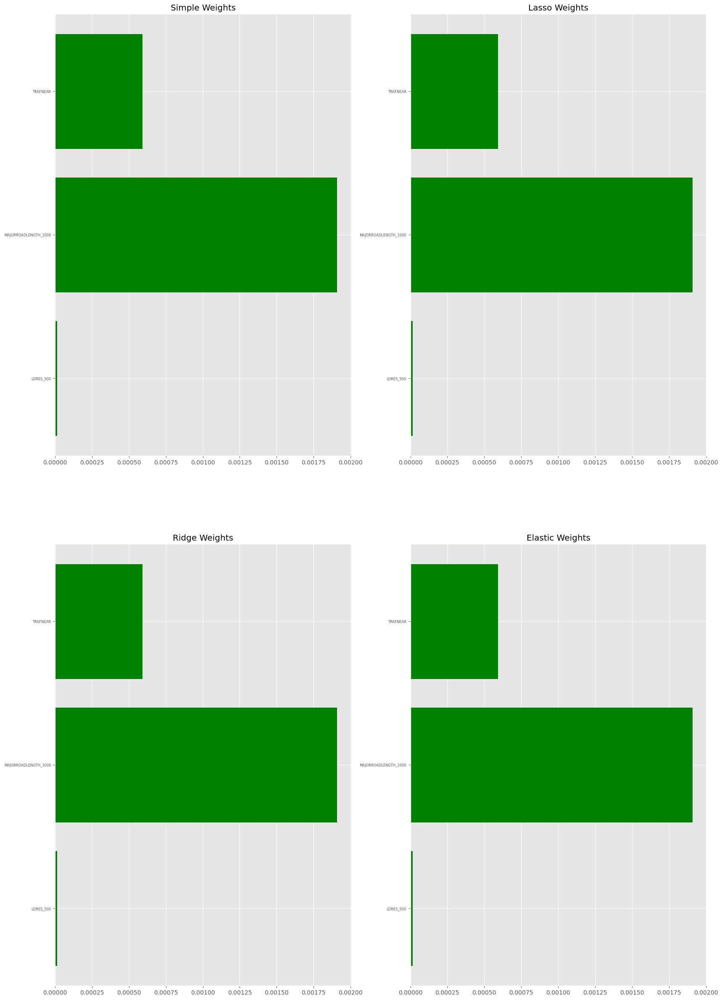

In [ ]:
with plt.style.context("ggplot"):
    fig, axes = plt.subplots(2,2, figsize=(20,30))

    axes[0][0].barh(range(len(SimpleRegression.coef_)), SimpleRegression.coef_, color=["red" if coef<0 else "green" for coef in SimpleRegression.coef_])
    axes[0][0].set_yticks(range(len(SimpleRegression.coef_)))
    axes[0][0].set_yticklabels(X.columns, fontsize=6)
    axes[0][0].set_title("Simple Weights")
    
    axes[0][1].barh(range(len(LassoRegression.coef_)), LassoRegression.coef_, color=["red" if coef<0 else "green" for coef in LassoRegression.coef_])
    axes[0][1].set_yticks(range(len(LassoRegression.coef_)))
    axes[0][1].set_yticklabels(X.columns, fontsize=6)
    axes[0][1].set_title("Lasso Weights")
    
    axes[1][0].barh(range(len(RidgeRegression.coef_)), RidgeRegression.coef_, color=["red" if coef<0 else "green" for coef in RidgeRegression.coef_])
    axes[1][0].set_yticks(range(len(RidgeRegression.coef_)))
    axes[1][0].set_yticklabels(X.columns, fontsize=6)
    axes[1][0].set_title("Ridge Weights")
    
    axes[1][1].barh(range(len(ElasticRegression.coef_)), ElasticRegression.coef_, color=["red" if coef<0 else "green" for coef in ElasticRegression.coef_])
    axes[1][1].set_yticks(range(len(ElasticRegression.coef_)))
    axes[1][1].set_yticklabels(X.columns, fontsize=6)
    axes[1][1].set_title("Elastic Weights")


In [ ]:
SimpleExplanation.as_list()
LASSOExplanation.as_list()
RidgeExplanation.as_list()
ElasticExplanation.as_list()


[('LDRES_500 > 738658.23', 4.263271079112174),
 ('2621.08 < MAJORROADLENGTH_1000 <= 4539.52', 1.5814405700626055),
 ('2019.51 < TRAFNEAR <= 8038.14', -1.3915730364372092)]

In [ ]:
explanation.as_map()

NameError: name 'explanation' is not defined

In [ ]:
# from IPython.display import HTML

# html_data = explanation.as_html()
# HTML(data=html_data)

In [ ]:
print("Simple Explanation Local Prediction  : ", SimpleExplanation.local_pred)
print("Simple Explanation Global Prediction : ", SimpleExplanation.predicted_value)
print()
print("Lasso Explanation Local Prediction  : ", LASSOExplanation.local_pred)
print("Lasso Explanation Global Prediction : ", LASSOExplanation.predicted_value)
print()
print("Explanation Local Prediction  : ", RidgeExplanation.local_pred)
print("Explanation Global Prediction : ", RidgeExplanation.predicted_value)
print()
print("Elastic Explanation Local Prediction  : ", ElasticExplanation.local_pred)
print("Elastic Explanation Global Prediction : ", ElasticExplanation.predicted_value)

Simple Explanation Local Prediction  :  [41.97873145]
Simple Explanation Global Prediction :  40.99830038793067

Lasso Explanation Local Prediction  :  [41.93690162]
Lasso Explanation Global Prediction :  40.99832401677055

Explanation Local Prediction  :  [42.11640653]
Explanation Global Prediction :  40.998300386167145

Elastic Explanation Local Prediction  :  [41.9809198]
Elastic Explanation Global Prediction :  40.9983121640861
